In [ ]:
# --- repo path setup (added during reorg) ---
import sys, os
sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '..', 'src')))


In [1]:
# === must come first, before numpy/matplotlib imports ===
import os
os.environ.setdefault("OMP_NUM_THREADS", "1")
os.environ.setdefault("MKL_NUM_THREADS", "1")
os.environ.setdefault("OPENBLAS_NUM_THREADS", "1")

import math
import numpy as np
import matplotlib.pyplot as plt
from typing import Dict, Tuple, List, Optional
from scipy.optimize import minimize

from simulate_functions_min import *  # simulate_lattice_numba, get_species_list_ind, etc.


# ---------------------------
# Data container
# ---------------------------
class ReweightDataMU:
    def __init__(self, beta, L, N_sites, eps_ns0, eps_sp0, mu0,
                 N_mu, rho_mu, rho_total, u, C_ns, C_sp):
        self.beta = float(beta); self.L = int(L); self.N_sites = int(N_sites)
        self.eps_ns0 = float(eps_ns0); self.eps_sp0 = float(eps_sp0); self.mu0 = float(mu0)
        self.N_mu = np.asarray(N_mu, float).ravel()
        self.rho_mu = np.asarray(rho_mu, float).ravel()
        self.rho_total = np.asarray(rho_total, float).ravel()
        self.u = np.asarray(u, float).ravel()
        self.C_ns = np.asarray(C_ns, float).ravel()
        self.C_sp = np.asarray(C_sp, float).ravel()
        n = len(self.N_mu)
        assert all(len(getattr(self, k)) == n for k in ("rho_mu","rho_total","u","C_ns","C_sp")), \
            "ReweightDataMU: array length mismatch"


# ---------------------------
# Lattice helpers
# ---------------------------
def to_int_lattice(lat):
    lat = np.asarray(lat)
    if np.issubdtype(lat.dtype, np.integer):
        return lat.astype(np.int64, copy=False)
    return np.vectorize(lambda p: p.index, otypes=[np.int64])(lat)


# ---------------------------
# Single run (reference collection)
# ---------------------------
def run_ref_once_mu(simulate_lattice_numba,
                    lattice0,
                    species, species_mu_indices, chem_pots,
                    eps_ns0, eps_sp0, mu0, *,
                    steps=500_000, cluster_move=False,
                    buffer_size=4000, snapshot_interval=300_000,
                    empty_index: int = -1, beta: float = 1.0):

    lattice_int = to_int_lattice(lattice0)

    def J_patch(epsp, epsn):
        return np.array([[-epsn,           -epsn,        0.0],
                         [-epsn, -epsn - epsp,           0.0],
                         [  0.0,            0.0,         0.0]], float)

    Jref = J_patch(float(eps_sp0), float(eps_ns0))
    patches_by_species = np.asarray([getattr(s, "patches") for s in species], dtype=np.uint8)

    n_species = len(species)
    if empty_index < 0:
        empty_index = n_species - 1
    empty_index = int(empty_index)

    # build mu_table from species_mu_indices
    mu_table = np.zeros(n_species, dtype=np.float64)
    idx = np.unique(np.asarray(species_mu_indices, dtype=np.int64))
    idx = idx[(idx >= 0) & (idx < n_species)]
    mu_table[idx] = float(mu0)

    # Try preferred signature
    try:
        snap_counts, energies, densities, lat_final = simulate_lattice_numba(
            lattice_int,
            Jref,
            patches_by_species,
            mu_table,
            empty_index=empty_index,
            eps_ns0=float(eps_ns0),
            eps_sp0=float(eps_sp0),
            simulation_steps=int(steps),
            beta=float(beta),
            snapshot_interval=int(snapshot_interval),
            buffer_size=int(buffer_size),
            species_mu_indices=idx,
        )
    except TypeError:
        # Fallback signature
        for k in idx:
            setattr(species[int(k)], "mu", float(mu0))

        snap_counts, energies, densities, lat_final = simulate_lattice_numba(
            lattice_int, Jref, species, chem_pots, {},
            simulation_steps=int(steps),
            beta=float(beta),
            cluster_move=bool(cluster_move),
            filename=None,
            snapshot_interval=int(snapshot_interval),
            snap_shot_threshold=int(buffer_size),
            buffer_size=int(buffer_size),
            empty_index=empty_index,
            patches_by_species=patches_by_species,
            species_mu_indices=idx,
            eps_ns0=float(eps_ns0),
            eps_sp0=float(eps_sp0),
        )

    snap_counts = dict(snap_counts)
    N_sites = int(snap_counts["N_sites"])

    if "rho_mu" not in snap_counts or "N_mu" not in snap_counts:
        dens = np.asarray(densities, float)
        rho_mu = dens[:, idx].sum(axis=1) if idx.size else np.zeros(dens.shape[0], float)
        snap_counts["rho_mu"] = rho_mu
        snap_counts["N_mu"]   = rho_mu * float(N_sites)

    for k in ["N_mu", "rho_mu", "Nocc_total", "rho_total", "u", "C_ns", "C_sp"]:
        if k in snap_counts:
            snap_counts[k] = np.asarray(snap_counts[k], float).ravel()

    return snap_counts


# ---------------------------
# Notebook-safe sequential builder (the one you actually call)
# ---------------------------
def build_data_mu_cpu(simulate_lattice_unused,
                      lattice_dense, lattice_dilute, lattice_middle,
                      species, species_mu_indices, chem_pots,
                      eps_ns=1.767, eps_sp=0.0, mu=2*1.767+np.log(4), beta=1.0,
                      snapshot_interval=300_000,
                      steps=500_000, cluster_move=False, buffer_size=4000, empty_index=-1,
                      max_workers=None, n_replicas=16) -> ReweightDataMU:

    sim = simulate_lattice_unused

    lattices_int = [
        to_int_lattice(lattice_dense).copy(),
        to_int_lattice(lattice_dilute).copy(),
    ]
    if lattice_middle is not None:
        latM = to_int_lattice(lattice_middle).copy()
        lattices_int += [latM, latM, latM]

    runs = []
    for r in range(int(n_replicas)):
        lat = lattices_int[r % len(lattices_int)]
        runs.append(
            run_ref_once_mu(
                sim, lat.copy(),
                species, species_mu_indices, chem_pots,
                float(eps_ns), float(eps_sp), float(mu),
                steps=int(steps),
                cluster_move=bool(cluster_move),
                snapshot_interval=int(snapshot_interval),
                buffer_size=int(buffer_size),
                empty_index=int(empty_index),
                beta=float(beta),
            )
        )

    keys = ["N_mu","rho_mu","Nocc_total","rho_total","u","C_ns","C_sp"]
    cat = {k: np.concatenate([r[k] for r in runs]) for k in keys}

    idx = np.random.default_rng(12345).permutation(len(cat["Nocc_total"]))
    for k in keys:
        cat[k] = cat[k][idx]

    N_sites = int(runs[0]["N_sites"])
    L_side  = int(np.sqrt(N_sites))

    return ReweightDataMU(
        beta=beta, L=L_side, N_sites=N_sites,
        eps_ns0=eps_ns, eps_sp0=eps_sp, mu0=mu,
        N_mu=cat["N_mu"],
        rho_mu=cat["rho_mu"],
        rho_total=cat["rho_total"],
        u=cat["u"],
        C_ns=cat["C_ns"],
        C_sp=cat["C_sp"],
    )


# ---------------------------
# Ising reference histogram smoother (used)
# ---------------------------
def smooth_histogram_gaussian(x_centers, p_hist, sigma=1.0):
    x_centers = np.asarray(x_centers, float)
    p_hist    = np.asarray(p_hist, float)
    dx = float(np.mean(np.diff(x_centers)))
    if not np.allclose(np.diff(x_centers), dx, rtol=1e-4, atol=1e-8):
        raise ValueError("x_centers must be uniformly spaced.")
    sigma_bins = sigma / dx
    halfw = int(np.ceil(4 * sigma_bins))
    kx = np.arange(-halfw, halfw + 1, dtype=float)
    K = np.exp(-0.5 * (kx / sigma_bins)**2); K /= K.sum()
    p_pad = np.pad(p_hist, (halfw, halfw), mode='reflect')
    p_conv = np.convolve(p_pad, K, mode='same')[halfw:-halfw]
    p_conv /= np.trapz(p_conv, x_centers)
    return x_centers, p_conv


# ---------------------------
# Reweighting utilities (μ*)
# ---------------------------
def _ess(w):
    w = np.asarray(w, float)
    s1 = w.sum()
    s2 = (w*w).sum()
    return (s1*s1) / max(s2, 1e-300)

def _weights_mu(N_counts, mu_new, mu_ref, beta=1.0, clip=700.0):
    dmu = float(mu_new - mu_ref)
    logw = -beta * dmu * np.asarray(N_counts, float)
    logw -= np.max(logw)
    logw = np.clip(logw, -clip, None)
    return np.exp(logw)

def _rho_hist_density(rho, w, edges):
    counts, _ = np.histogram(rho, bins=edges, weights=w, density=False)
    W = counts.sum()
    p = counts / max(W, 1e-300)     # mass per bin
    width = np.diff(edges)
    dens = p / width                # density
    centers = 0.5 * (edges[:-1] + edges[1:])
    return centers, dens

def _area_in_window(edges, dens, lo, hi):
    lo = float(lo); hi = float(hi)
    L = edges[:-1]; R = edges[1:]
    overlap = np.maximum(0.0, np.minimum(R, hi) - np.maximum(L, lo))
    return float(np.sum(dens * overlap))

def equal_peak_mu_in_rho_by_reweighting(
    rho, N_counts, mu_ref, *,
    beta=1.0,
    rho_edges=None, rho_bins=200,
    dilute_window=(0.0, 0.3),
    dense_window=(0.7, 1.0),
    ess_min=2_000,
    mu0=None, step0=0.01, max_bracket=20, tol=5e-3, max_bisect=30,
    verbose=True
):
    rho = np.asarray(rho, float)
    N   = np.asarray(N_counts, float)

    if rho_edges is None:
        lo, hi = float(np.min(rho)), float(np.max(rho))
        edges = np.linspace(lo, hi, int(rho_bins)+1)
    else:
        edges = np.asarray(rho_edges, float)

    def f_of_mu(mu_trial):
        w = _weights_mu(N, mu_trial, mu_ref, beta=beta)
        ess = _ess(w)
        _, dens = _rho_hist_density(rho, w, edges)
        Ad = _area_in_window(edges, dens, *dilute_window)
        Ah = _area_in_window(edges, dens, *dense_window)
        return (Ah - Ad), ess, w, dens

    mu_start = float(mu_ref if mu0 is None else mu0)
    f0, ess0, w0, dens0 = f_of_mu(mu_start)
    if verbose:
        print(f"[equal-ρ] μ0={mu_start:.6f}, ΔA={f0:+.4f}, ESS≈{ess0:.0f}")

    if abs(f0) < tol and ess0 >= ess_min:
        centers, _ = _rho_hist_density(rho, w0, edges)
        return dict(mu_star=mu_start, success=True, ess=float(ess0),
                    centers=centers, density_star=dens0, w_star=w0)

    direction = 1.0 if f0 > 0 else -1.0
    step = float(step0)

    for k in range(max_bracket):
        mu_try = mu_start + direction * step * (k+1)
        ft, esst, wt, denst = f_of_mu(mu_try)
        if verbose:
            print(f"[equal-ρ] bracket μ={mu_try:.6f}, ΔA={ft:+.4f}, ESS≈{esst:.0f}")
        if np.sign(ft) != np.sign(f0):
            if f0 > 0:
                mu_lo, f_lo, w_lo, dens_lo = mu_try, ft, wt, denst
                mu_hi, f_hi, w_hi, dens_hi = mu_start, f0, w0, dens0
            else:
                mu_lo, f_lo, w_lo, dens_lo = mu_start, f0, w0, dens0
                mu_hi, f_hi, w_hi, dens_hi = mu_try, ft, wt, denst
            break
    else:
        centers, _ = _rho_hist_density(rho, w0, edges)
        return dict(mu_star=mu_start, success=False, ess=float(ess0),
                    centers=centers, density_star=dens0, w_star=w0,
                    reason="failed to bracket")

    for it in range(max_bisect):
        mu_mid = 0.5*(mu_lo + mu_hi)
        fm, essm, wm, densm = f_of_mu(mu_mid)
        if verbose:
            print(f"[equal-ρ] bisect μ={mu_mid:.6f}, ΔA={fm:+.4f}, ESS≈{essm:.0f}")
        if abs(fm) < tol and essm >= ess_min:
            centers, _ = _rho_hist_density(rho, wm, edges)
            return dict(mu_star=mu_mid, success=True, ess=float(essm),
                        centers=centers, density_star=densm, w_star=wm)
        if np.sign(fm) == np.sign(f_lo):
            mu_lo, f_lo, w_lo, dens_lo = mu_mid, fm, wm, densm
        else:
            mu_hi, f_hi, w_hi, dens_hi = mu_mid, fm, wm, densm

    centers, _ = _rho_hist_density(rho, wm, edges)
    return dict(mu_star=mu_mid, success=False, ess=float(essm),
                centers=centers, density_star=densm, w_star=wm,
                reason="max bisection iterations")


def resample_at_mu_star(data: ReweightDataMU, mu_star: float, rng=None):
    if rng is None: rng = np.random.default_rng(1234)
    dG = -data.beta * (mu_star - data.mu0) * np.asarray(data.N_mu, float)
    dG -= dG.max()
    w = np.exp(dG); w /= max(w.sum(), 1e-300)
    c = np.cumsum(w); u0 = rng.random()/len(w); u = u0 + np.arange(len(w))/len(w)
    idx = np.searchsorted(c, u, side="right")
    return dict(
        indices    = idx,
        weights    = w,
        rho_mu     = data.rho_mu[idx].copy(),
        rho_total  = data.rho_total[idx].copy(),
        N_mu       = data.N_mu[idx].copy(),
        u          = data.u[idx].copy(),
        C_ns       = data.C_ns[idx].copy(),
        C_sp       = data.C_sp[idx].copy()
    )


# ---------------------------
# Mixed-field fit (s,r) + KDE
# ---------------------------
def _wmean(x: np.ndarray, w: np.ndarray) -> float:
    return float(np.sum(w * x) / max(np.sum(w), 1e-300))

def _wstd(x: np.ndarray, w: np.ndarray) -> float:
    m = _wmean(x, w)
    v = _wmean((x - m)**2, w)
    return float(np.sqrt(max(v, 1e-300)))

def _kde_fixed_sigma_on_grid(x_samples, x_grid, sigma_x, w):
    x_samples = np.asarray(x_samples, float)
    x_grid    = np.asarray(x_grid, float)
    w = np.asarray(w, float).ravel()
    w = np.where(np.isfinite(w) & (w > 0), w, 0.0)
    w /= max(w.sum(), 1e-300)

    u = (x_grid[:, None] - x_samples[None, :]) / sigma_x
    K = np.exp(-0.5 * u*u)
    P = (K @ w) / (sigma_x * np.sqrt(2*np.pi))
    P /= max(np.trapz(P, x_grid), 1e-300)
    return P

def fit_s_r_from_reweighted(
    rho: np.ndarray,
    u: np.ndarray,
    x_ref: np.ndarray,
    P_ref: np.ndarray,
    s_ref: float,
    *,
    weights: Optional[np.ndarray] = None,
    L: int,
    beta_over_nu: float = 1/8,
    sigma_x: float = 0.05,
    r_penalty: float = 5e-2,
    bounds_s: Tuple[float, float] = (-5.0, 5.0),
    bounds_r: Tuple[float, float] = (-1.0, 1.0),
    method: str = "L-BFGS-B",
    w_asym: float = 0.5
) -> Dict:

    rho = np.asarray(rho, float).ravel()
    u   = np.asarray(u,   float).ravel()
    x_ref = np.asarray(x_ref, float).ravel()
    P_ref = np.asarray(P_ref, float).ravel()

    if weights is None:
        w = np.ones_like(rho, float)
    else:
        w = np.asarray(weights, float).ravel()
        w = np.where(np.isfinite(w) & (w > 0), w, 0.0)
    w /= max(w.sum(), 1e-300)

    def build_x_pdf(s: float, r: float):
        M = rho - s * u
        M_center = _wmean(M, w)
        M_std    = _wstd(M,  w)
        M_std = max(M_std, 1e-300)
        x_samples = (M - M_center) / M_std
        P_est = _kde_fixed_sigma_on_grid(x_samples, x_ref, sigma_x, w)
        return 1.0/M_std, x_samples, P_est

    def objective(theta):
        s, r = float(theta[0]), float(theta[1])
        if s_ref is not None:
            s = s_ref
        _, _, P_est = build_x_pdf(s, r)

        diff = P_est - P_ref
        match_L2 = np.trapz(diff*diff, x_ref)

        P_mir = np.interp(-x_ref, x_ref, P_est)
        A = 0.5 * (P_est - P_mir)
        asym_L2 = np.trapz(A*A, x_ref)

        return match_L2 + w_asym * asym_L2 + r_penalty * (r*r)

    x0 = np.array([0.0, 0.0], float)
    bounds = [bounds_s, bounds_r]

    res = minimize(objective, x0, method="L-BFGS-B", bounds=bounds,
                   options=dict(maxiter=300, ftol=1e-9))
    if (not res.success) or ("ABNORMAL" in str(res.message)):
        res = minimize(objective, res.x, method="Nelder-Mead",
                       options=dict(maxiter=800, xatol=1e-6, fatol=1e-6))

    s_opt, r_opt = map(float, res.x)
    alpha_opt, xs_opt, P_fit = build_x_pdf(s_opt, r_opt)

    diff = P_fit - P_ref
    match_L2 = float(np.trapz(diff*diff, x_ref))
    P_mir = np.interp(-x_ref, x_ref, P_fit)
    A = 0.5*(P_fit - P_mir)
    asym_L2 = float(np.trapz(A*A, x_ref))

    return dict(
        success=bool(res.success),
        message=str(res.message),
        s=s_opt,
        r=r_opt,
        alpha=alpha_opt,
        x=x_ref,
        P_fit=P_fit,
        P_ref=P_ref,
        match_L2=match_L2,
        asym_L2=asym_L2,
        fun=float(res.fun)
    )


# ---------------------------
# θ reweight objective (ε,μ) with fixed ε_sp and fixed s
# ---------------------------
def _parse_theta_with_s(theta):
    t = list(map(float, theta))
    be, beA, bm, L, Mc = t[:5]
    s = t[5] if len(t) >= 6 else 0.0
    return be, beA, bm, L, Mc, s

def kl_q_p(q, p, eps=1e-12):
    q = np.asarray(q, float); p = np.asarray(p, float)
    q = q / max(q.sum(), 1e-300)
    p = p / max(p.sum(), 1e-300)
    q = np.clip(q, eps, 1.0); p = np.clip(p, eps, 1.0)
    q /= q.sum(); p /= p.sum()
    return float(np.sum(q * (np.log(q) - np.log(p))))

def js_div(q, p, eps=1e-12):
    q = np.asarray(q, float); p = np.asarray(p, float)
    q = q / max(q.sum(), 1e-300)
    p = p / max(p.sum(), 1e-300)
    q = np.clip(q, eps, 1.0); p = np.clip(p, eps, 1.0)
    q /= q.sum(); p /= p.sum()
    m = 0.5*(q+p)
    return 0.5*kl_q_p(q, m, eps) + 0.5*kl_q_p(p, m, eps)

def reweight_from_samples_counts_with_s(
    M_ref, C, Ca, N,
    theta_prime, theta_ref,
    *, rho=None, u=None,
    clip=700.0, return_Mprime=False
):
    be,  beA,  bm, _, _ , s_ref    = _parse_theta_with_s(theta_ref)
    bep, beAp, bmp, _, _ , s_prime = _parse_theta_with_s(theta_prime)

    if (rho is not None) and (u is not None):
        Mprime = np.asarray(rho, float) - float(s_prime) * np.asarray(u, float)
    else:
        Mprime = np.asarray(M_ref, float)

    d_be, d_beA, d_bm = (bep - be), (beAp - beA), (bmp - bm)
    logw = (-(d_be)  * np.asarray(C,  float)
            - (d_beA) * np.asarray(Ca, float)
            - (d_bm)  * np.asarray(N,  float))

    logw = np.clip(logw - np.max(logw), -clip, None)
    w = np.exp(logw)

    return (w, Mprime) if return_Mprime else w

def weighted_hist_and_sigma(x, w, edges, epsilon=1e-12, *,
                            return_nonempty=True, empty_tol=0.0):
    x = np.asarray(x, float); w = np.asarray(w, float)
    n = x.size
    K = len(edges) - 1

    idx = np.clip(np.digitize(x, edges) - 1, 0, K-1)

    S1 = np.bincount(idx, weights=w,   minlength=K)
    S2 = np.bincount(idx, weights=w*w, minlength=K)
    W  = float(w.sum())

    p = S1 / max(W, epsilon)
    num = S2 - (S1**2) / max(n, 1)
    sigma2 = np.maximum(num / max(W, epsilon), 0.0)
    centers = 0.5*(edges[1:] + edges[:-1])

    if return_nonempty:
        nonempty = p > float(empty_tol)
        return centers, p, sigma2, nonempty
    return centers, p, sigma2

def make_objective_fixed_epsA_fixed_s_with_sweights(
    theta_ref, epsA_fixed,
    rho, u, C, Ca, N,
    edges_ref, p_ref,
    *, L_fixed=None, epsilon=1e-12
):
    be_ref, beA_ref, bm_ref, L_ref, Mc_ref, s_ref = _parse_theta_with_s(theta_ref)
    if L_fixed is None:
        L_fixed = float(L_ref)

    widths = np.diff(edges_ref)
    q_mass = (p_ref * widths)
    q_mass /= max(q_mass.sum(), 1e-300)

    theta_ref_ext = (be_ref, beA_ref, bm_ref, L_ref, Mc_ref, s_ref, 0.0)

    def _wmean_std(x, w):
        W = max(w.sum(), 1e-300)
        m = float(np.dot(w, x) / W)
        v = float(np.dot(w, (x - m)**2) / W)
        return m, math.sqrt(max(v, 1e-300))

    def objective(x):
        be_p, bm_p = map(float, x[:2])
        theta_prime_ext = (be_p, float(epsA_fixed), bm_p, float(L_fixed), 0.0, s_ref, 0.0)

        w, Mprime = reweight_from_samples_counts_with_s(
            M_ref=rho - s_ref*u, C=C, Ca=Ca, N=N,
            theta_prime=theta_prime_ext, theta_ref=theta_ref_ext,
            rho=rho, u=u, return_Mprime=True
        )

        Mc_w, std_w = _wmean_std(Mprime, w)
        std_w = max(std_w, 1e-300)
        x_vals = (Mprime - Mc_w) / std_w

        _, p_mass, sigma2_mass, nonempty = weighted_hist_and_sigma(
            x_vals, w, edges_ref, return_nonempty=True
        )

        m = (p_mass > 0) | (q_mass > 0)
        return js_div(q_mass[m], p_mass[m])

    return objective

def optimize_eps_mu_Mc_fixed_epsA_fixed_s(
    theta_ref, epsA_fixed,
    rho, u, C, Ca, N, edges_ref, p_ref,
    *, L_fixed=None, x0=None, bounds=None, method="L-BFGS-B", options=None
):
    obj = make_objective_fixed_epsA_fixed_s_with_sweights(
        theta_ref, epsA_fixed, rho, u, C, Ca, N, edges_ref, p_ref, L_fixed=L_fixed
    )
    be_ref, beA_ref, bm_ref, L_ref, Mc_ref, s_ref = _parse_theta_with_s(theta_ref)
    if L_fixed is None: L_fixed = L_ref

    if x0 is None:
        x0 = np.array([be_ref, bm_ref], float)

    if bounds is None:
        bounds = [(be_ref - 0.02, be_ref+0.02),
                  (bm_ref - 0.02, bm_ref + 0.02)]

    res = minimize(obj, x0=np.asarray(x0, float),
                   method="L-BFGS-B", bounds=bounds,
                   options=options or dict(maxiter=400, ftol=1e-5))
    be_p, bm_p = map(float, res.x)

    theta_ref_ext   = (be_ref, beA_ref, bm_ref, L_ref, Mc_ref, s_ref, 0.0)
    theta_prime_ext = (be_p, float(epsA_fixed), bm_p, float(L_fixed), 0.0, s_ref, 0.0)
    w, Mprime = reweight_from_samples_counts_with_s(
        M_ref=rho - s_ref*u, C=C, Ca=Ca, N=N,
        theta_prime=theta_prime_ext, theta_ref=theta_ref_ext,
        rho=rho, u=u, return_Mprime=True
    )
    W = max(w.sum(), 1e-300)
    Mc_w = float(np.dot(w, Mprime) / W)

    res.theta_star = (be_p, float(epsA_fixed), bm_p, float(L_fixed), Mc_w, float(s_ref))
    return res


# ---------------------------
# μ search by simulation (used)
# ---------------------------
def find_mu_equal_areas_by_simulation(
    simulate,
    mu0,
    dilute_window=(0.00, 0.30),
    dense_window =(0.70, 1.00),
    step0=0.02,
    tol=2e-2,
    max_iters=50,
    verbose=True,
):
    def basin_masses(rho):
        rho = np.asarray(rho, float)
        m_dil = ((rho >= dilute_window[0]) & (rho <  dilute_window[1])).mean()
        m_den = ((rho >= dense_window[0])  & (rho <= dense_window[1])).mean()
        return float(m_dil), float(m_den)

    cache = {}

    def mass_diff_at(mu):
        mu = float(mu)
        mu_key = float(np.round(mu, 12))
        if mu_key in cache:
            return cache[mu_key]
        data = simulate(mu)
        m_dil, m_den = basin_masses(data.rho_mu)
        f = float(m_den - m_dil)
        cache[mu_key] = (f, data)
        return cache[mu_key]

    mu = float(mu0)
    f, data = mass_diff_at(mu)
    if verbose:
        print(f"[μ={mu:.6f}] f=m_dense-m_dilute={f:+.4f}")

    best = (abs(f), mu, data)
    bracket = None

    for it in range(1, int(max_iters) + 1):
        if abs(f) <= tol:
            return {"mu": mu, "success": True, "data": data, "iters": it - 1}

        if bracket is not None:
            mu_lo, f_lo, mu_hi, f_hi = bracket
            mu = 0.5 * (mu_lo + mu_hi)
            f, data = mass_diff_at(mu)
            if verbose:
                print(f"[bisect] μ={mu:.6f} f={f:+.4f} bracket=[{mu_lo:.6f},{mu_hi:.6f}]")
            if abs(f) < best[0]:
                best = (abs(f), mu, data)
            if f < 0:
                bracket = (mu, f, mu_hi, f_hi)
            else:
                bracket = (mu_lo, f_lo, mu, f)
            continue

        mu_new = mu + (step0 if f > 0 else -step0)
        f_new, data_new = mass_diff_at(mu_new)
        if verbose:
            print(f"[step] μ={mu_new:.6f} f={f_new:+.4f}")

        if abs(f_new) < best[0]:
            best = (abs(f_new), mu_new, data_new)

        if f != 0.0 and f_new != 0.0 and (f * f_new < 0.0):
            bracket = (mu, f, mu_new, f_new) if f < 0 else (mu_new, f_new, mu, f)

        mu, f, data = mu_new, f_new, data_new

    _, mu_best, data_best = best
    return {"mu": mu_best, "success": False, "data": data_best, "iters": int(max_iters)}


# ---------------------------
# Small wrapper you use
# ---------------------------
def make_simulator(build_data_mu, **base_kwargs):
    def simulate(mu):
        kw = dict(base_kwargs)
        kw["mu"] = float(mu)
        return build_data_mu(**kw)
    return simulate


def main(eps_ns,eps_sp_prev,mu):

    rng = np.random.default_rng(12345)
    
    
    # 2D Ising critical temperature (J=1, k_B=1)
    Tc = 2.0 / math.log(1.0 + math.sqrt(2.0))
    beta_ising = 1.0 / Tc
    p_add = 1.0 - math.exp(-2.0 * beta_ising)  # Wolff bond-addition probability

    L_ising = 64
    N_ising = L_ising * L_ising
    spins = rng.choice([-1, 1], size=(L_ising, L_ising)).astype(np.int8)

    burnin_clusters = 3000
    samples_to_collect = 20000
    def neighbors(x: int, y: int):
        return ((x, (y + 1) % L_ising),
                (x, (y - 1) % L_ising),
                ((x + 1) % L_ising, y),
                ((x - 1) % L_ising, y))


    def magnetization_per_spin():
        return spins.sum() / float(N_ising)

    def wolff_step():
        x = rng.integers(0, L_ising)
        y = rng.integers(0, L_ising)
        target_spin = spins[x, y]
        stack = [(x, y)]
        in_cluster = np.zeros((L_ising, L_ising), dtype=np.bool_)
        in_cluster[x, y] = True
        while stack:
            i, j = stack.pop()
            for ni, nj in neighbors(i, j):
                if (not in_cluster[ni, nj]) and (spins[ni, nj] == target_spin):
                    if rng.random() < p_add:
                        in_cluster[ni, nj] = True
                        stack.append((ni, nj))
        spins[in_cluster] *= -1
        return in_cluster.sum()
    
    for _ in range(burnin_clusters):
        wolff_step()

    m_samples = np.empty(samples_to_collect, dtype=np.float64)
    for k in range(samples_to_collect):
        wolff_step()
        m_samples[k] = magnetization_per_spin()

    # Universal x with unit variance
    
    
    m_mean = float(m_samples.mean())
    m_std  = float(m_samples.std(ddof=1))
    x_samples = (m_samples - m_mean) / m_std

    # Histogram & smooth it for P*(x)
    m_mean = float(m_samples.mean())
    m_std  = float(m_samples.std(ddof=1))
    x_samples = (m_samples - m_mean) / m_std

    nbins = 101
    n_pad = 6  # number of guaranteed-zero bins on EACH side

    R_data = float(np.max(np.abs(x_samples)))
    dx = 2.0 * R_data / nbins                  # keep your original resolution
    R = R_data + n_pad * dx                    # extend range by n_pad bins each side

    edges = np.linspace(-R, R, (nbins + 2*n_pad) + 1)  # total bins = nbins + 2*n_pad
    hist, _ = np.histogram(x_samples, bins=edges, density=True)
    x_centers = 0.5 * (edges[:-1] + edges[1:])

    assert np.allclose(x_centers, -x_centers[::-1], atol=1e-12)

    P_hat = hist
    xc, P_smooth = smooth_histogram_gaussian(x_centers, P_hat, sigma=0.05)
    centers_ref=xc
    edges_ref=edges


    # ---------------------------
    # 1) Species & initial lattices (your setup)
    # ---------------------------
    species = get_species_list_ind(['AA','SSSS'])
    species_mu_indices = np.array([0,1,2,3])
    print([p.patches for p in species])
    L = 10
    N_total = L * L
    n = len(species)
    chem_pots = np.zeros(n)

    # middle lattice
    rho_middle = np.array(list(np.ones(n-1)) + [4])
    rho_middle /= rho_middle.sum()
    N_middle = [int(r * N_total) for r in rho_middle]
    N_middle[0] += N_total - sum(N_middle)
    flat = []; [flat.extend([species[i]]*N_middle[i]) for i in range(len(rho_middle))]
    np.random.shuffle(flat)
    lattice_middle = np.array(flat).reshape((L, L))

    points: List[Tuple[float, float, float]] = []

    #eps_ns = 1.767
    #mu     = 2*1.767 + np.log(4.0)+0.000
    #eps_sp_prev = 0.0
    #eps_ns, eps_sp_prev, mu 
    eps_sps = np.arange(eps_sp_prev, 6.00, 0.02)
    s_ref=None 
    r=0
    for eps_sp in eps_sps:
        print(f"\n=== Step: target eps_sp={eps_sp:.3f} (prev={eps_sp_prev:.3f}) ===",flush=True)

  

        simulate = make_simulator(
            build_data_mu_cpu,
            simulate_lattice_unused=simulate_lattice_numba,
            lattice_dense=lattice_middle,
            lattice_dilute=lattice_middle,
            lattice_middle=lattice_middle,
            species=species,
            species_mu_indices=species_mu_indices,
            chem_pots=chem_pots,
            eps_ns=eps_ns,
            eps_sp=eps_sp_prev,
            beta=1.0,
            steps=600_000_000,
            snapshot_interval=400_000,
            buffer_size=100_000_000,
            empty_index=len(species)-1,
            max_workers=None,      # ignored by CPU version
            n_replicas=5,
        )



   
        guard = find_mu_equal_areas_by_simulation(
           simulate, mu0=mu,
           dilute_window=(0.00, 0.40),
           dense_window =(0.60, 1.00),
           step0=0.004, tol=1e-1, verbose=True #,e_sp=eps_sp_prev,e_ns=eps_ns
        )
 

        mu = guard["mu"]
        data_mu = guard["data"]

        rho    = data_mu.rho_mu
        u = data_mu.u; C= data_mu.C_ns; Ca= data_mu.C_sp
        N = data_mu.N_mu
        mu_ref = mu
        mu_star = mu
        res_equal = equal_peak_mu_in_rho_by_reweighting(
            rho, N, mu_ref,
            beta=1.0,
            rho_edges=np.linspace(0.0, 1.0, 201),
            dilute_window=(0.00, 0.40),
            dense_window =(0.60, 1.00),
            ess_min=3000, step0=0.0001, tol=1e-2, verbose=True
        )
        mu_star = float(res_equal["mu_star"])
        print(f"mu* = {mu_star:.6f}   ESS ≈ {res_equal['ess']:.0f}",flush=True)
        mu_star   = float(res_equal["mu_star"])
        w_star    = res_equal["w_star"]             # normalized weights at μ*
        rw = resample_at_mu_star(data_mu, mu_star)
        u=rw['u']
        rho= rw['rho_mu']
        w=rw['weights']
        C = rw['C_ns']
        Ca = rw['C_sp']
        N = rw['N_mu']
        print(np.mean(rho))
        # Fit s,r without resampling (pass weights):
        fit = fit_s_r_from_reweighted(
            rho=rho, u=u,
            x_ref=centers_ref,
            s_ref=None,
            P_ref=P_smooth/np.trapz(P_smooth, centers_ref),
            weights=None,                          # direct importance weights at μ*
            L=L, beta_over_nu=1/8, sigma_x=0.03,
            r_penalty=1e-1, w_asym=2.0
        )


        s_ref=fit['s'] 

        plt.figure()
        plt.hist(rho,bins=101);
        plt.savefig(f"fits_aa/r_numba10_rho_l_eps_ns_{eps_ns:0.2f}_eps_sp_{eps_sp_prev:0.2f}_mu_{mu_star:.2f}.png")
        plt.show()
        plt.figure()
        plt.plot(fit["x"], fit["P_ref"]/np.trapz(fit['P_ref'],fit['x']), label="Target P*(x)")
        plt.plot(fit["x"], fit["P_fit"]/np.trapz(fit['P_fit'],fit['x']), "--", label="Reweighted + mixed-field fit")
        plt.xlabel("x"); plt.ylabel("density"); plt.legend();
        plt.savefig(f"fits_aa/r_numba10_l_eps_ns_{eps_ns:0.2f}_eps_sp_{eps_sp_prev:0.2f}_mu_{mu_star:.2f}.png")
        plt.show()
        Mprime = rho - s_ref * u
        Mc = float(Mprime.mean())
        lambdap = 1.0 - s_ref*fit['r']

        theta_ref = (eps_ns, eps_sp_prev, mu_star, lambdap, Mc, s_ref)

        res = optimize_eps_mu_Mc_fixed_epsA_fixed_s(
            theta_ref, eps_sp,
            rho, u, C, Ca, N,
            edges_ref, P_smooth/np.trapz(P_smooth, centers_ref),
            L_fixed=None
        )
        print("success:", res.success,flush=True)
        print("χ²*    :", res.fun,flush=True)
        print("θ*     :", res.theta_star,flush=True)  # (βε*, βε_a(fixed), βμ*, Λ(fixed), M_c*, s_ref)

        eps_ns, _, mu, _, _, _ = res.theta_star
        points.append((float(eps_ns), float(eps_sp), float(mu)))

        eps_sp_prev = float(eps_sp)

    # ---------------------------
    # 4) Summary plot of the path
    # ---------------------------
    if points:
        eps_ns_list, eps_sp_list, mu_list = map(np.array, zip(*points))
        plt.figure()
        plt.plot(eps_sp_list, eps_ns_list, marker='.')
        plt.xlabel(r"$\epsilon_{\rm sp}$ (fixed)")
        plt.ylabel(r"$\epsilon_{\rm ns}^*$")
        plt.title("Sequential sweep with parallelized per-step data collection")
        plt.show()

        plt.figure()
        plt.plot(eps_sp_list, mu_list, marker='.')
        plt.xlabel(r"$\epsilon_{\rm sp}$ (fixed)")
        plt.ylabel(r"$\mu^*$")
        plt.title("μ* across the sequential sweep")
        plt.show()

    print("Collected points (ε_ns*, ε_sp, μ*):")
    for p in points:
        print(p)


[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=0.000 (prev=0.000) ===
[μ=4.920294] f=m_dense-m_dilute=+0.0032
[equal-ρ] μ0=4.920294, ΔA=+0.0032, ESS≈7505
mu* = 4.920294   ESS ≈ 7505
0.5013617588274484


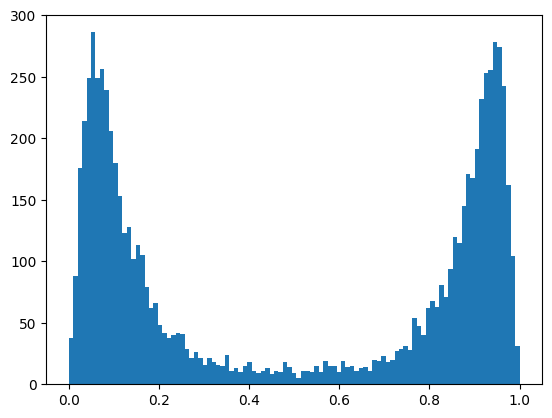

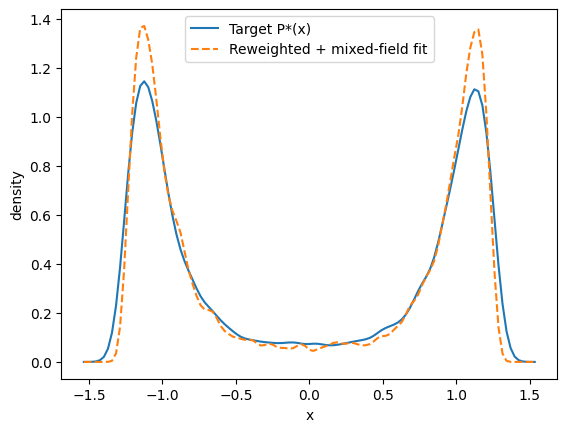

success: True
χ²*    : 0.022306695721908753
θ*     : (1.7670197875389306, 0.0, 4.920291889799705, 1.0000000000013725, 0.5123187065100115, 0.007383520968212466)

=== Step: target eps_sp=0.020 (prev=0.000) ===
[μ=4.920292] f=m_dense-m_dilute=+0.0128
[equal-ρ] μ0=4.920292, ΔA=+0.0128, ESS≈7505
[equal-ρ] bracket μ=4.920392, ΔA=+0.0090, ESS≈7505
[equal-ρ] bracket μ=4.920492, ΔA=+0.0052, ESS≈7505
[equal-ρ] bracket μ=4.920592, ΔA=+0.0014, ESS≈7504
[equal-ρ] bracket μ=4.920692, ΔA=-0.0024, ESS≈7503
[equal-ρ] bisect μ=4.920492, ΔA=+0.0052, ESS≈7505
mu* = 4.920492   ESS ≈ 7505
0.5011818787475016


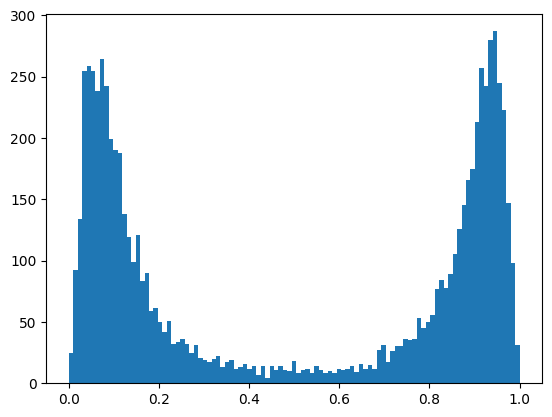

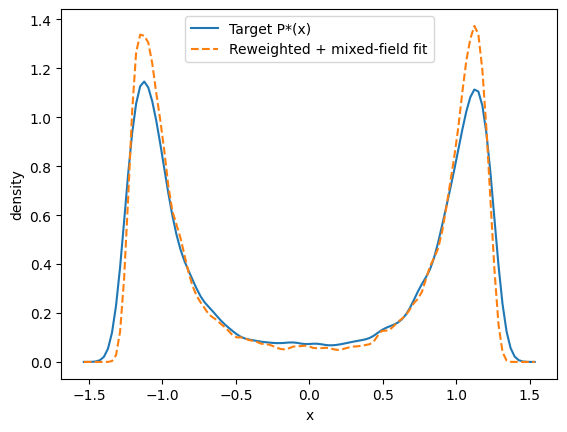

success: True
χ²*    : 0.019455951376947632
θ*     : (1.7631293705620876, 0.02, 4.916969838489024, 1.0000000000019762, 0.5057391949495109, 0.009583737225831444)

=== Step: target eps_sp=0.040 (prev=0.020) ===
[μ=4.916970] f=m_dense-m_dilute=+0.2105
[step] μ=4.920970 f=+0.0564
[equal-ρ] μ0=4.920970, ΔA=+0.0564, ESS≈7505
[equal-ρ] bracket μ=4.921070, ΔA=+0.0526, ESS≈7505
[equal-ρ] bracket μ=4.921170, ΔA=+0.0488, ESS≈7505
[equal-ρ] bracket μ=4.921270, ΔA=+0.0450, ESS≈7504
[equal-ρ] bracket μ=4.921370, ΔA=+0.0412, ESS≈7503
[equal-ρ] bracket μ=4.921470, ΔA=+0.0374, ESS≈7502
[equal-ρ] bracket μ=4.921570, ΔA=+0.0336, ESS≈7501
[equal-ρ] bracket μ=4.921670, ΔA=+0.0298, ESS≈7499
[equal-ρ] bracket μ=4.921770, ΔA=+0.0260, ESS≈7498
[equal-ρ] bracket μ=4.921870, ΔA=+0.0222, ESS≈7496
[equal-ρ] bracket μ=4.921970, ΔA=+0.0184, ESS≈7493
[equal-ρ] bracket μ=4.922070, ΔA=+0.0146, ESS≈7491
[equal-ρ] bracket μ=4.922170, ΔA=+0.0108, ESS≈7488
[equal-ρ] bracket μ=4.922270, ΔA=+0.0070, ESS≈7485
[equal-ρ] bracke

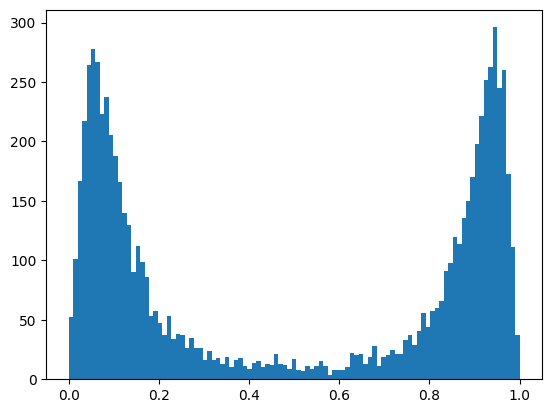

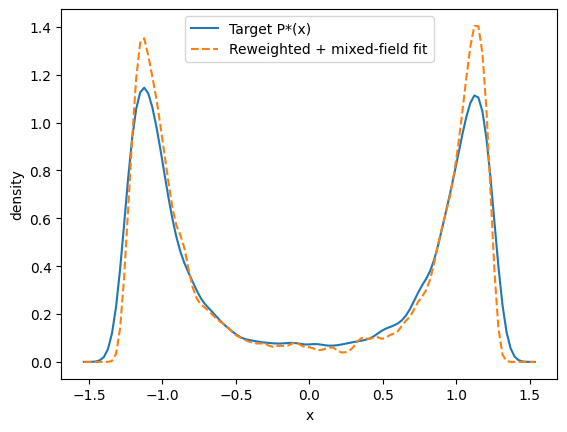

success: False
χ²*    : 0.021183355696778688
θ*     : (1.7590610513076532, 0.04, 4.918506608307701, 0.9999999999995182, 0.49017686857410414, -0.003934458908922638)

=== Step: target eps_sp=0.060 (prev=0.040) ===
[μ=4.918507] f=m_dense-m_dilute=+0.2369
[step] μ=4.922507 f=+0.0799
[equal-ρ] μ0=4.922507, ΔA=+0.0799, ESS≈7505
[equal-ρ] bracket μ=4.922607, ΔA=+0.0762, ESS≈7505
[equal-ρ] bracket μ=4.922707, ΔA=+0.0724, ESS≈7505
[equal-ρ] bracket μ=4.922807, ΔA=+0.0686, ESS≈7504
[equal-ρ] bracket μ=4.922907, ΔA=+0.0649, ESS≈7503
[equal-ρ] bracket μ=4.923007, ΔA=+0.0611, ESS≈7502
[equal-ρ] bracket μ=4.923107, ΔA=+0.0573, ESS≈7501
[equal-ρ] bracket μ=4.923207, ΔA=+0.0535, ESS≈7499
[equal-ρ] bracket μ=4.923307, ΔA=+0.0498, ESS≈7498
[equal-ρ] bracket μ=4.923407, ΔA=+0.0460, ESS≈7496
[equal-ρ] bracket μ=4.923507, ΔA=+0.0422, ESS≈7493
[equal-ρ] bracket μ=4.923607, ΔA=+0.0384, ESS≈7491
[equal-ρ] bracket μ=4.923707, ΔA=+0.0346, ESS≈7488
[equal-ρ] bracket μ=4.923807, ΔA=+0.0308, ESS≈7485
[equal-ρ] bra

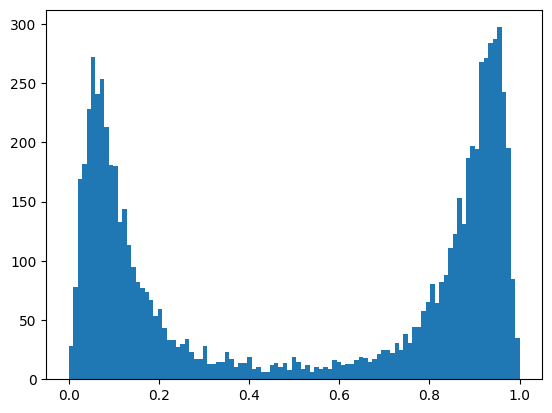

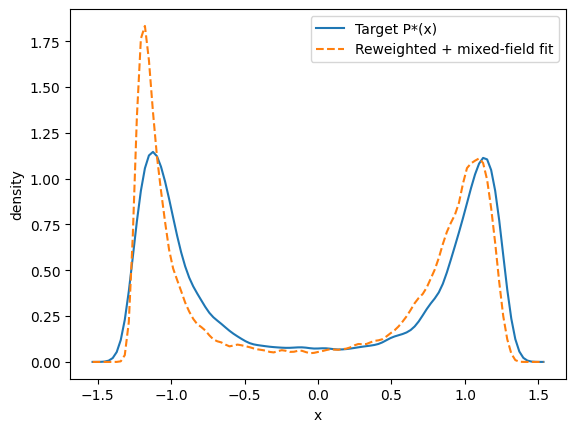

success: True
χ²*    : 0.045517819644440516
θ*     : (1.7573996902288769, 0.06, 4.914262163134474, 1.0, 1.1155709357631516, 0.3415459816463045)

=== Step: target eps_sp=0.080 (prev=0.060) ===
[μ=4.914262] f=m_dense-m_dilute=+0.5574
[step] μ=4.918262 f=+0.4694
[step] μ=4.922262 f=+0.3175
[step] μ=4.926262 f=+0.1985
[step] μ=4.930262 f=+0.0276
[equal-ρ] μ0=4.930262, ΔA=+0.0276, ESS≈7505
[equal-ρ] bracket μ=4.930362, ΔA=+0.0238, ESS≈7505
[equal-ρ] bracket μ=4.930462, ΔA=+0.0199, ESS≈7505
[equal-ρ] bracket μ=4.930562, ΔA=+0.0161, ESS≈7504
[equal-ρ] bracket μ=4.930662, ΔA=+0.0123, ESS≈7503
[equal-ρ] bracket μ=4.930762, ΔA=+0.0085, ESS≈7502
[equal-ρ] bracket μ=4.930862, ΔA=+0.0047, ESS≈7501
[equal-ρ] bracket μ=4.930962, ΔA=+0.0008, ESS≈7499
[equal-ρ] bracket μ=4.931062, ΔA=-0.0030, ESS≈7497
[equal-ρ] bisect μ=4.930662, ΔA=+0.0123, ESS≈7503
[equal-ρ] bisect μ=4.930862, ΔA=+0.0047, ESS≈7501
mu* = 4.930862   ESS ≈ 7501
0.4981025982678215


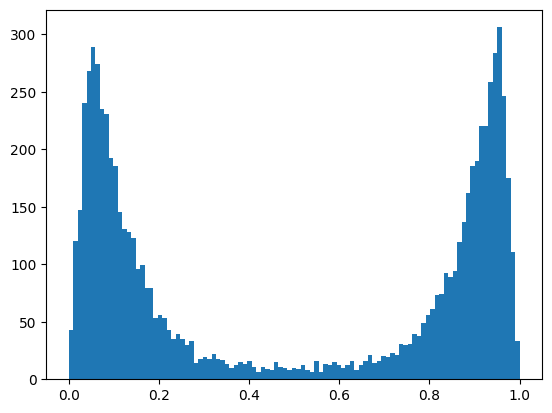

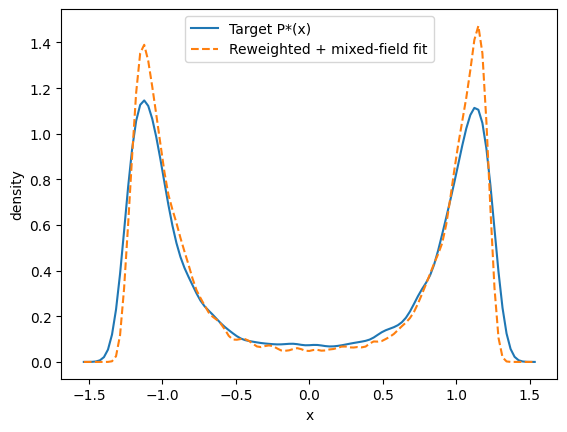

success: False
χ²*    : 0.020092081790201888
θ*     : (1.7532119503084458, 0.08, 4.926668003586255, 0.9999999999990813, 0.48845974873744136, -0.009223306265323358)

=== Step: target eps_sp=0.100 (prev=0.080) ===
[μ=4.926668] f=m_dense-m_dilute=+0.2449
[step] μ=4.930668 f=+0.0986
[equal-ρ] μ0=4.930668, ΔA=+0.0986, ESS≈7505
[equal-ρ] bracket μ=4.930768, ΔA=+0.0948, ESS≈7505
[equal-ρ] bracket μ=4.930868, ΔA=+0.0910, ESS≈7505
[equal-ρ] bracket μ=4.930968, ΔA=+0.0872, ESS≈7504
[equal-ρ] bracket μ=4.931068, ΔA=+0.0834, ESS≈7503
[equal-ρ] bracket μ=4.931168, ΔA=+0.0796, ESS≈7502
[equal-ρ] bracket μ=4.931268, ΔA=+0.0758, ESS≈7501
[equal-ρ] bracket μ=4.931368, ΔA=+0.0720, ESS≈7499
[equal-ρ] bracket μ=4.931468, ΔA=+0.0681, ESS≈7497
[equal-ρ] bracket μ=4.931568, ΔA=+0.0643, ESS≈7495
[equal-ρ] bracket μ=4.931668, ΔA=+0.0605, ESS≈7493
[equal-ρ] bracket μ=4.931768, ΔA=+0.0567, ESS≈7491
[equal-ρ] bracket μ=4.931868, ΔA=+0.0529, ESS≈7488
[equal-ρ] bracket μ=4.931968, ΔA=+0.0490, ESS≈7485
[equal-ρ] bra

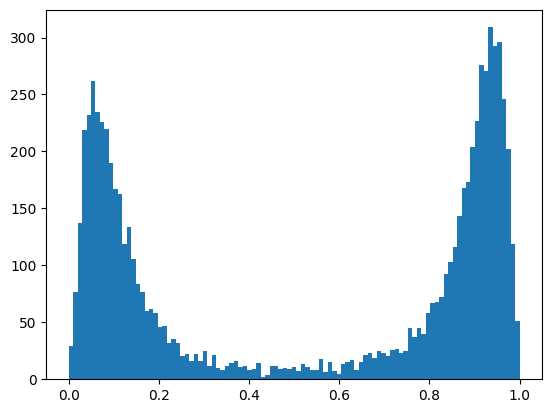

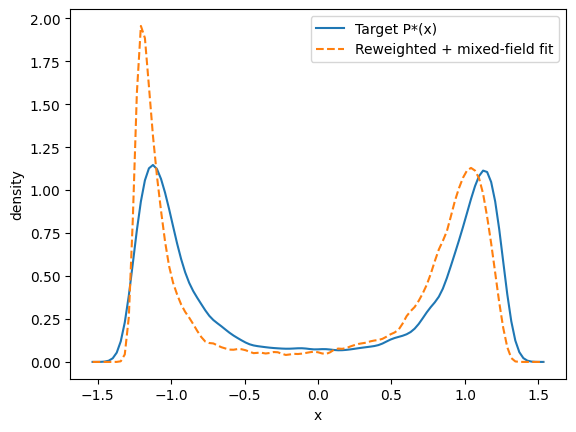

success: True
χ²*    : 0.04531905043933884
θ*     : (1.7494792867522488, 0.1, 4.927130908800718, 1.0, 1.3150169844573534, 0.48738333440312503)

=== Step: target eps_sp=0.120 (prev=0.100) ===
[μ=4.927131] f=m_dense-m_dilute=+0.3303
[step] μ=4.931131 f=+0.1783
[step] μ=4.935131 f=+0.0232
[equal-ρ] μ0=4.935131, ΔA=+0.0232, ESS≈7505
[equal-ρ] bracket μ=4.935231, ΔA=+0.0194, ESS≈7505
[equal-ρ] bracket μ=4.935331, ΔA=+0.0156, ESS≈7505
[equal-ρ] bracket μ=4.935431, ΔA=+0.0118, ESS≈7504
[equal-ρ] bracket μ=4.935531, ΔA=+0.0080, ESS≈7503
[equal-ρ] bracket μ=4.935631, ΔA=+0.0041, ESS≈7502
[equal-ρ] bracket μ=4.935731, ΔA=+0.0003, ESS≈7501
[equal-ρ] bracket μ=4.935831, ΔA=-0.0035, ESS≈7499
[equal-ρ] bisect μ=4.935481, ΔA=+0.0099, ESS≈7504
mu* = 4.935481   ESS ≈ 7504
0.5051339107261825


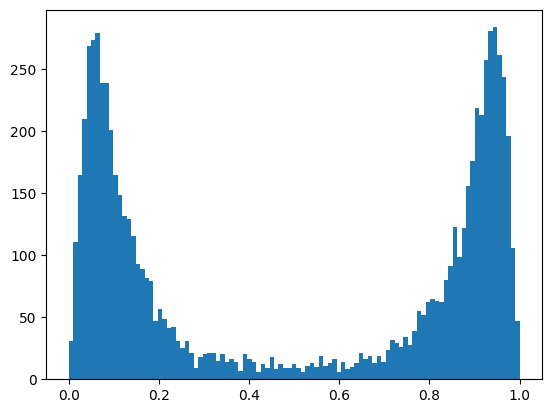

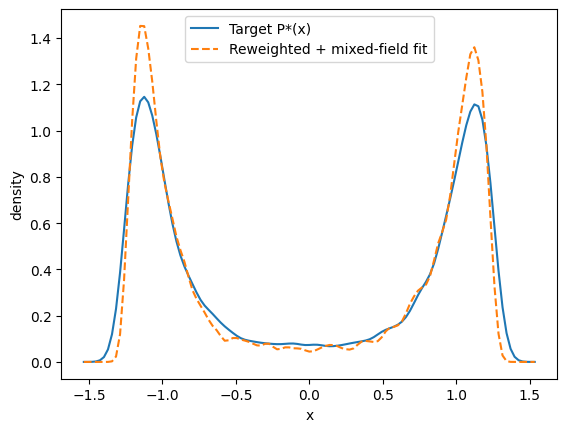

success: True
χ²*    : 0.02826094512316503
θ*     : (1.7458287196493298, 0.12, 4.931882449372222, 1.0000000000037719, 0.5250372922776473, 0.025694215244622603)

=== Step: target eps_sp=0.140 (prev=0.120) ===
[μ=4.931882] f=m_dense-m_dilute=+0.2616
[step] μ=4.935882 f=+0.1214
[step] μ=4.939882 f=-0.0189
[equal-ρ] μ0=4.939882, ΔA=-0.0189, ESS≈7505
[equal-ρ] bracket μ=4.939782, ΔA=-0.0151, ESS≈7505
[equal-ρ] bracket μ=4.939682, ΔA=-0.0112, ESS≈7505
[equal-ρ] bracket μ=4.939582, ΔA=-0.0074, ESS≈7504
[equal-ρ] bracket μ=4.939482, ΔA=-0.0035, ESS≈7503
[equal-ρ] bracket μ=4.939382, ΔA=+0.0003, ESS≈7502
[equal-ρ] bisect μ=4.939632, ΔA=-0.0093, ESS≈7504
mu* = 4.939632   ESS ≈ 7504
0.49367621585609595


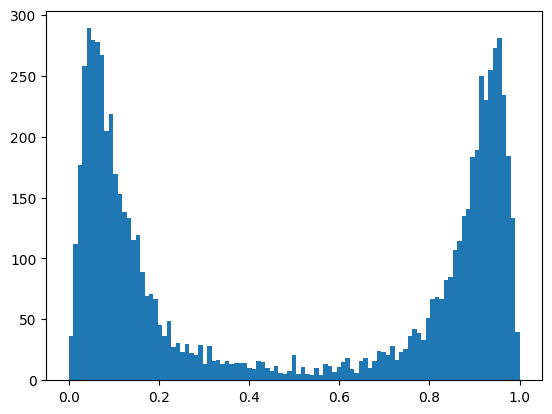

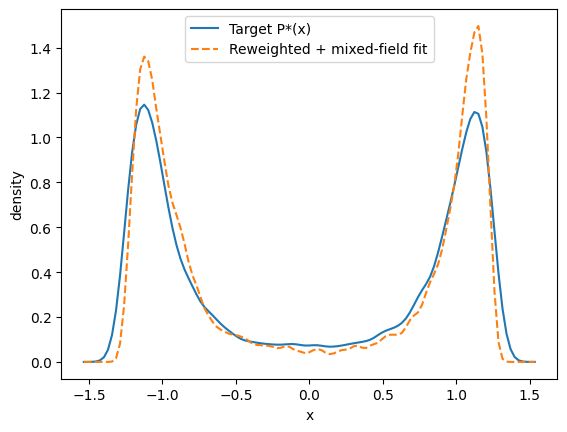

success: True
χ²*    : 0.031219858716049556
θ*     : (1.7418859048997253, 0.14, 4.935707854508549, 0.9999999999965208, 0.4400486985452705, -0.03056152104553466)

=== Step: target eps_sp=0.160 (prev=0.140) ===
[μ=4.935708] f=m_dense-m_dilute=+0.2128
[step] μ=4.939708 f=+0.0569
[equal-ρ] μ0=4.939708, ΔA=+0.0569, ESS≈7505
[equal-ρ] bracket μ=4.939808, ΔA=+0.0531, ESS≈7505
[equal-ρ] bracket μ=4.939908, ΔA=+0.0492, ESS≈7505
[equal-ρ] bracket μ=4.940008, ΔA=+0.0454, ESS≈7504
[equal-ρ] bracket μ=4.940108, ΔA=+0.0416, ESS≈7503
[equal-ρ] bracket μ=4.940208, ΔA=+0.0378, ESS≈7502
[equal-ρ] bracket μ=4.940308, ΔA=+0.0339, ESS≈7501
[equal-ρ] bracket μ=4.940408, ΔA=+0.0301, ESS≈7499
[equal-ρ] bracket μ=4.940508, ΔA=+0.0263, ESS≈7497
[equal-ρ] bracket μ=4.940608, ΔA=+0.0224, ESS≈7495
[equal-ρ] bracket μ=4.940708, ΔA=+0.0186, ESS≈7493
[equal-ρ] bracket μ=4.940808, ΔA=+0.0148, ESS≈7491
[equal-ρ] bracket μ=4.940908, ΔA=+0.0109, ESS≈7488
[equal-ρ] bracket μ=4.941008, ΔA=+0.0071, ESS≈7485
[equal-ρ] bracke

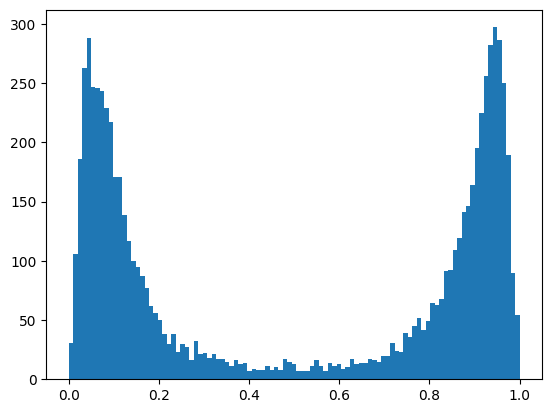

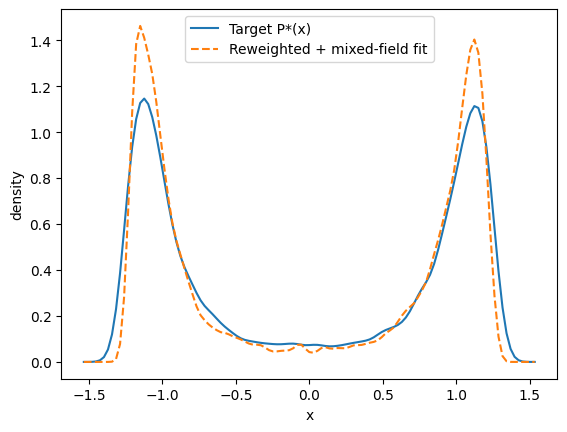

success: True
χ²*    : 0.02317471161327811
θ*     : (1.7381732093635427, 0.16, 4.935866261057636, 1.0000000000048992, 0.5597473675961017, 0.031697514894311656)

=== Step: target eps_sp=0.180 (prev=0.160) ===
[μ=4.935866] f=m_dense-m_dilute=+0.3138
[step] μ=4.939866 f=+0.1504
[step] μ=4.943866 f=+0.0123
[equal-ρ] μ0=4.943866, ΔA=+0.0123, ESS≈7505
[equal-ρ] bracket μ=4.943966, ΔA=+0.0084, ESS≈7505
[equal-ρ] bracket μ=4.944066, ΔA=+0.0045, ESS≈7505
[equal-ρ] bracket μ=4.944166, ΔA=+0.0007, ESS≈7504
[equal-ρ] bracket μ=4.944266, ΔA=-0.0032, ESS≈7503
[equal-ρ] bisect μ=4.944066, ΔA=+0.0045, ESS≈7505
mu* = 4.944066   ESS ≈ 7505
0.4997814790139906


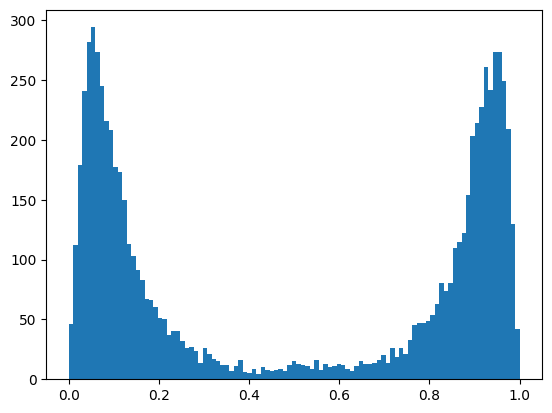

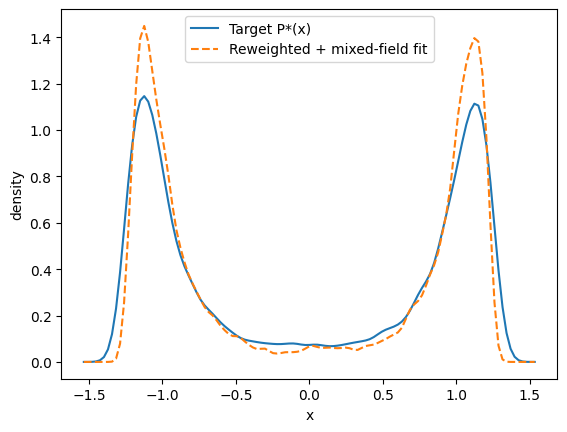

success: True
χ²*    : 0.027408417470650537
θ*     : (1.7341178316560895, 0.18, 4.939917636778463, 0.9999999999997237, 0.4901122605459476, -0.0036746814717553977)

=== Step: target eps_sp=0.200 (prev=0.180) ===
[μ=4.939918] f=m_dense-m_dilute=+0.2540
[step] μ=4.943918 f=+0.0985
[equal-ρ] μ0=4.943918, ΔA=+0.0985, ESS≈7505
[equal-ρ] bracket μ=4.944018, ΔA=+0.0947, ESS≈7505
[equal-ρ] bracket μ=4.944118, ΔA=+0.0908, ESS≈7505
[equal-ρ] bracket μ=4.944218, ΔA=+0.0870, ESS≈7504
[equal-ρ] bracket μ=4.944318, ΔA=+0.0832, ESS≈7503
[equal-ρ] bracket μ=4.944418, ΔA=+0.0794, ESS≈7502
[equal-ρ] bracket μ=4.944518, ΔA=+0.0755, ESS≈7501
[equal-ρ] bracket μ=4.944618, ΔA=+0.0717, ESS≈7499
[equal-ρ] bracket μ=4.944718, ΔA=+0.0679, ESS≈7497
[equal-ρ] bracket μ=4.944818, ΔA=+0.0640, ESS≈7495
[equal-ρ] bracket μ=4.944918, ΔA=+0.0602, ESS≈7493
[equal-ρ] bracket μ=4.945018, ΔA=+0.0564, ESS≈7491
[equal-ρ] bracket μ=4.945118, ΔA=+0.0525, ESS≈7488
[equal-ρ] bracket μ=4.945218, ΔA=+0.0487, ESS≈7485
[equal-ρ] brac

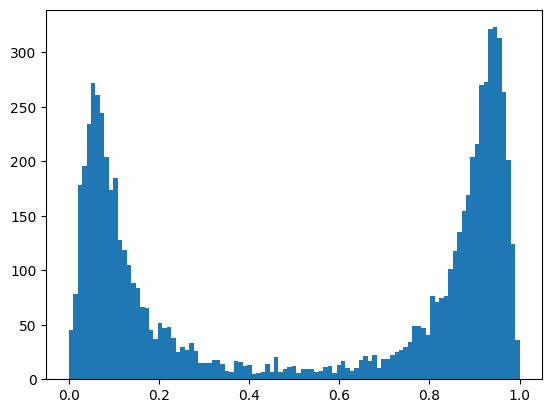

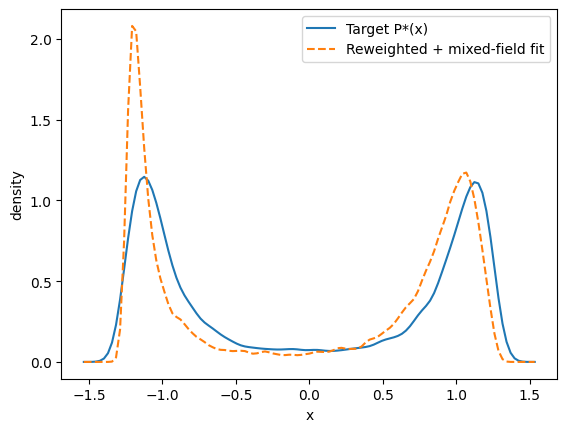

success: True
χ²*    : 0.0440506132899645
θ*     : (1.7302659812327792, 0.2, 4.940147945041205, 1.0, 1.5180010021255983, 0.6045277080934739)

=== Step: target eps_sp=0.220 (prev=0.200) ===
[μ=4.940148] f=m_dense-m_dilute=+0.3504
[step] μ=4.944148 f=+0.2096
[step] μ=4.948148 f=+0.0624
[equal-ρ] μ0=4.948148, ΔA=+0.0624, ESS≈7505
[equal-ρ] bracket μ=4.948248, ΔA=+0.0585, ESS≈7505
[equal-ρ] bracket μ=4.948348, ΔA=+0.0547, ESS≈7505
[equal-ρ] bracket μ=4.948448, ΔA=+0.0509, ESS≈7504
[equal-ρ] bracket μ=4.948548, ΔA=+0.0470, ESS≈7503
[equal-ρ] bracket μ=4.948648, ΔA=+0.0432, ESS≈7502
[equal-ρ] bracket μ=4.948748, ΔA=+0.0394, ESS≈7501
[equal-ρ] bracket μ=4.948848, ΔA=+0.0355, ESS≈7499
[equal-ρ] bracket μ=4.948948, ΔA=+0.0317, ESS≈7497
[equal-ρ] bracket μ=4.949048, ΔA=+0.0278, ESS≈7495
[equal-ρ] bracket μ=4.949148, ΔA=+0.0240, ESS≈7493
[equal-ρ] bracket μ=4.949248, ΔA=+0.0201, ESS≈7491
[equal-ρ] bracket μ=4.949348, ΔA=+0.0163, ESS≈7488
[equal-ρ] bracket μ=4.949448, ΔA=+0.0125, ESS≈7485
[equal-ρ

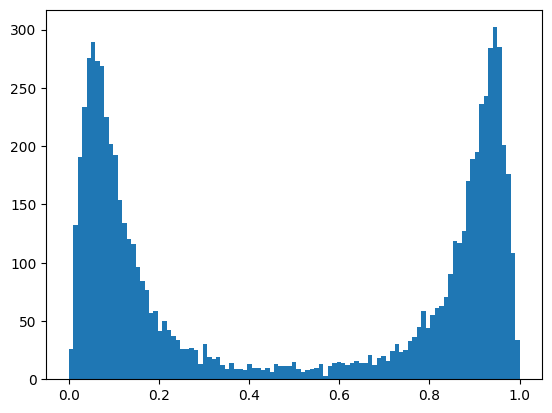

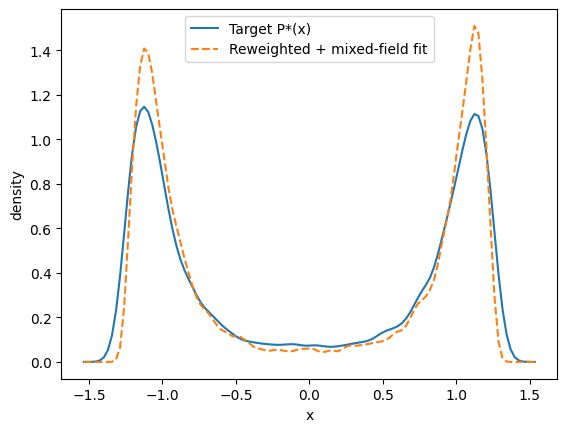

success: True
χ²*    : 0.02794369491393662
θ*     : (1.725813208930469, 0.22, 4.945180491402644, 0.9999999999987758, 0.48285436367173823, -0.01362493367125894)

=== Step: target eps_sp=0.240 (prev=0.220) ===
[μ=4.945180] f=m_dense-m_dilute=+0.2212
[step] μ=4.949180 f=+0.0706
[equal-ρ] μ0=4.949180, ΔA=+0.0706, ESS≈7505
[equal-ρ] bracket μ=4.949280, ΔA=+0.0668, ESS≈7505
[equal-ρ] bracket μ=4.949380, ΔA=+0.0630, ESS≈7505
[equal-ρ] bracket μ=4.949480, ΔA=+0.0591, ESS≈7504
[equal-ρ] bracket μ=4.949580, ΔA=+0.0553, ESS≈7503
[equal-ρ] bracket μ=4.949680, ΔA=+0.0514, ESS≈7502
[equal-ρ] bracket μ=4.949780, ΔA=+0.0476, ESS≈7501
[equal-ρ] bracket μ=4.949880, ΔA=+0.0438, ESS≈7499
[equal-ρ] bracket μ=4.949980, ΔA=+0.0399, ESS≈7497
[equal-ρ] bracket μ=4.950080, ΔA=+0.0361, ESS≈7495
[equal-ρ] bracket μ=4.950180, ΔA=+0.0322, ESS≈7493
[equal-ρ] bracket μ=4.950280, ΔA=+0.0284, ESS≈7491
[equal-ρ] bracket μ=4.950380, ΔA=+0.0245, ESS≈7488
[equal-ρ] bracket μ=4.950480, ΔA=+0.0207, ESS≈7485
[equal-ρ] bracket

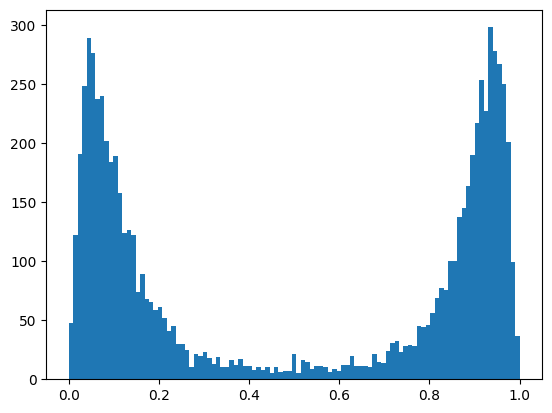

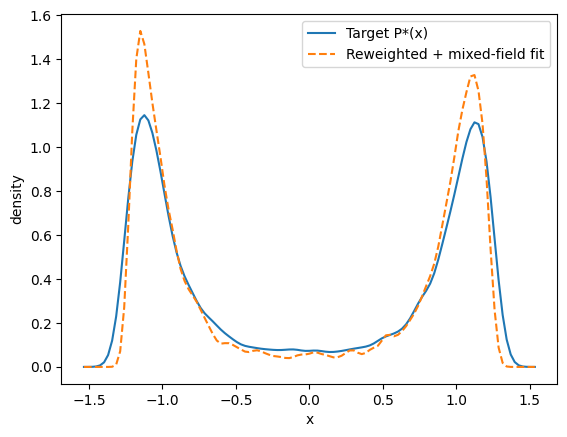

success: True
χ²*    : 0.36290615372056967
θ*     : (1.7258132997294078, 0.24, 4.950843083142734, 1.000000000012198, 0.39475461521302596, 0.04625012801909374)

=== Step: target eps_sp=0.260 (prev=0.240) ===
[μ=4.950843] f=m_dense-m_dilute=+0.4265
[step] μ=4.954843 f=+0.2620
[step] μ=4.958843 f=+0.1083
[step] μ=4.962843 f=-0.0354
[equal-ρ] μ0=4.962843, ΔA=-0.0354, ESS≈7505
[equal-ρ] bracket μ=4.962743, ΔA=-0.0316, ESS≈7505
[equal-ρ] bracket μ=4.962643, ΔA=-0.0277, ESS≈7505
[equal-ρ] bracket μ=4.962543, ΔA=-0.0238, ESS≈7504
[equal-ρ] bracket μ=4.962443, ΔA=-0.0199, ESS≈7503
[equal-ρ] bracket μ=4.962343, ΔA=-0.0160, ESS≈7502
[equal-ρ] bracket μ=4.962243, ΔA=-0.0121, ESS≈7501
[equal-ρ] bracket μ=4.962143, ΔA=-0.0082, ESS≈7499
[equal-ρ] bracket μ=4.962043, ΔA=-0.0043, ESS≈7497
[equal-ρ] bracket μ=4.961943, ΔA=-0.0004, ESS≈7495
[equal-ρ] bracket μ=4.961843, ΔA=+0.0035, ESS≈7493
[equal-ρ] bisect μ=4.962343, ΔA=-0.0160, ESS≈7502
[equal-ρ] bisect μ=4.962093, ΔA=-0.0062, ESS≈7498
mu* = 4.962093 

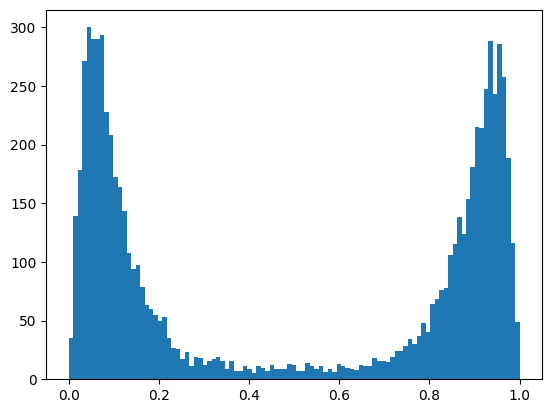

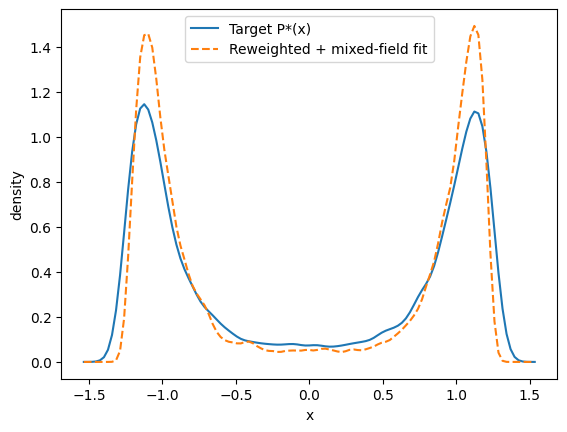

success: True
χ²*    : 0.03143736881276507
θ*     : (1.7215732550174263, 0.26, 4.957799985296996, 0.9999999999971056, 0.4588401238372779, -0.023252065633653736)

=== Step: target eps_sp=0.280 (prev=0.260) ===
[μ=4.957800] f=m_dense-m_dilute=+0.2458
[step] μ=4.961800 f=+0.0637
[equal-ρ] μ0=4.961800, ΔA=+0.0637, ESS≈7505
[equal-ρ] bracket μ=4.961900, ΔA=+0.0598, ESS≈7505
[equal-ρ] bracket μ=4.962000, ΔA=+0.0559, ESS≈7505
[equal-ρ] bracket μ=4.962100, ΔA=+0.0520, ESS≈7504
[equal-ρ] bracket μ=4.962200, ΔA=+0.0481, ESS≈7503
[equal-ρ] bracket μ=4.962300, ΔA=+0.0442, ESS≈7502
[equal-ρ] bracket μ=4.962400, ΔA=+0.0404, ESS≈7501
[equal-ρ] bracket μ=4.962500, ΔA=+0.0365, ESS≈7499
[equal-ρ] bracket μ=4.962600, ΔA=+0.0326, ESS≈7497
[equal-ρ] bracket μ=4.962700, ΔA=+0.0287, ESS≈7495
[equal-ρ] bracket μ=4.962800, ΔA=+0.0248, ESS≈7493
[equal-ρ] bracket μ=4.962900, ΔA=+0.0209, ESS≈7490
[equal-ρ] bracket μ=4.963000, ΔA=+0.0170, ESS≈7488
[equal-ρ] bracket μ=4.963100, ΔA=+0.0131, ESS≈7485
[equal-ρ] bracke

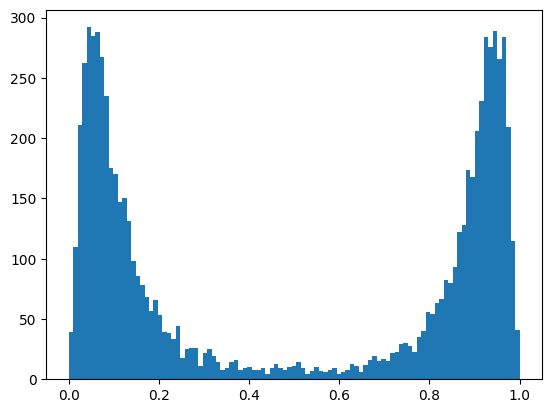

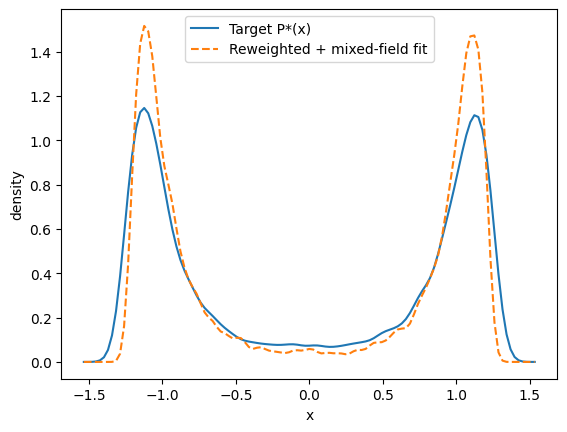

success: False
χ²*    : 0.10818922618815514
θ*     : (1.7160316818695356, 0.28, 4.957745912149104, 1.0000000000004337, 0.5534273443245568, 0.0028625349393876336)

=== Step: target eps_sp=0.300 (prev=0.280) ===
[μ=4.957746] f=m_dense-m_dilute=+0.2116
[step] μ=4.961746 f=+0.0741
[equal-ρ] μ0=4.961746, ΔA=+0.0741, ESS≈7505
[equal-ρ] bracket μ=4.961846, ΔA=+0.0702, ESS≈7505
[equal-ρ] bracket μ=4.961946, ΔA=+0.0663, ESS≈7505
[equal-ρ] bracket μ=4.962046, ΔA=+0.0625, ESS≈7504
[equal-ρ] bracket μ=4.962146, ΔA=+0.0586, ESS≈7503
[equal-ρ] bracket μ=4.962246, ΔA=+0.0547, ESS≈7502
[equal-ρ] bracket μ=4.962346, ΔA=+0.0508, ESS≈7501
[equal-ρ] bracket μ=4.962446, ΔA=+0.0470, ESS≈7499
[equal-ρ] bracket μ=4.962546, ΔA=+0.0431, ESS≈7497
[equal-ρ] bracket μ=4.962646, ΔA=+0.0392, ESS≈7495
[equal-ρ] bracket μ=4.962746, ΔA=+0.0353, ESS≈7493
[equal-ρ] bracket μ=4.962846, ΔA=+0.0314, ESS≈7490
[equal-ρ] bracket μ=4.962946, ΔA=+0.0275, ESS≈7488
[equal-ρ] bracket μ=4.963046, ΔA=+0.0236, ESS≈7485
[equal-ρ] brack

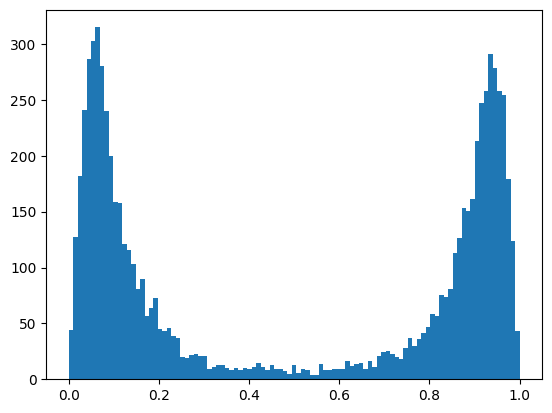

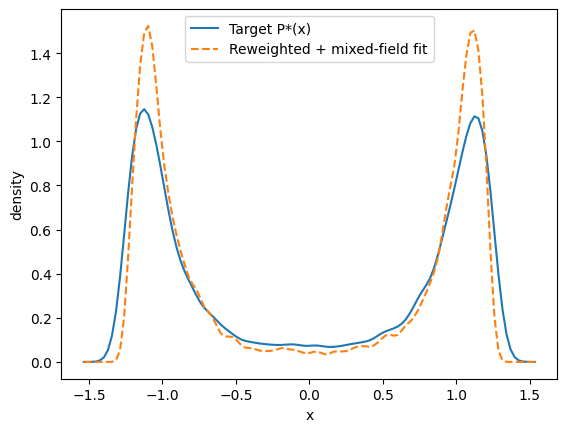

success: True
χ²*    : 0.033097152215415496
θ*     : (1.711609342789201, 0.3, 4.9590735730687685, 0.9999999999983982, 0.47659174985192704, -0.014664635287235907)

=== Step: target eps_sp=0.320 (prev=0.300) ===
[μ=4.959074] f=m_dense-m_dilute=+0.2408
[step] μ=4.963074 f=+0.1005
[step] μ=4.967074 f=-0.0596
[equal-ρ] μ0=4.967074, ΔA=-0.0596, ESS≈7505
[equal-ρ] bracket μ=4.966974, ΔA=-0.0557, ESS≈7505
[equal-ρ] bracket μ=4.966874, ΔA=-0.0518, ESS≈7505
[equal-ρ] bracket μ=4.966774, ΔA=-0.0480, ESS≈7504
[equal-ρ] bracket μ=4.966674, ΔA=-0.0441, ESS≈7503
[equal-ρ] bracket μ=4.966574, ΔA=-0.0402, ESS≈7502
[equal-ρ] bracket μ=4.966474, ΔA=-0.0363, ESS≈7501
[equal-ρ] bracket μ=4.966374, ΔA=-0.0325, ESS≈7499
[equal-ρ] bracket μ=4.966274, ΔA=-0.0286, ESS≈7497
[equal-ρ] bracket μ=4.966174, ΔA=-0.0247, ESS≈7495
[equal-ρ] bracket μ=4.966074, ΔA=-0.0208, ESS≈7493
[equal-ρ] bracket μ=4.965974, ΔA=-0.0169, ESS≈7490
[equal-ρ] bracket μ=4.965874, ΔA=-0.0131, ESS≈7488
[equal-ρ] bracket μ=4.965774, ΔA=-0.00

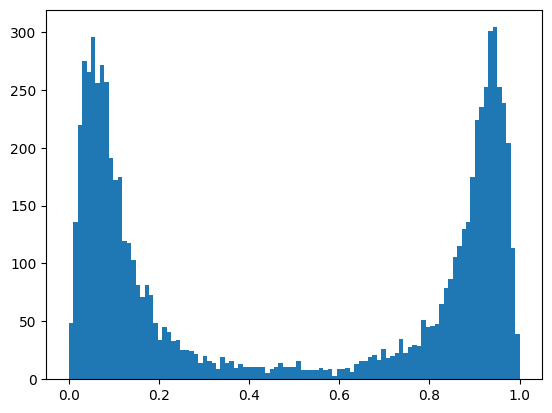

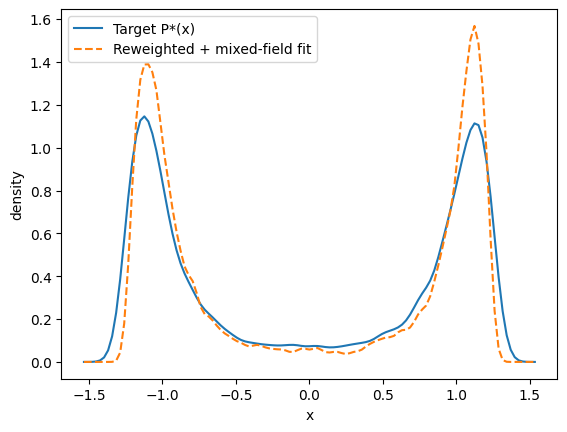

success: True
χ²*    : 0.028785838857983533
θ*     : (1.7066011693114782, 0.32, 4.962118273810308, 0.9999999999961605, 0.4655386355805775, -0.019531764238612463)

=== Step: target eps_sp=0.340 (prev=0.320) ===
[μ=4.962118] f=m_dense-m_dilute=+0.1654
[step] μ=4.966118 f=+0.0016
[equal-ρ] μ0=4.966118, ΔA=+0.0016, ESS≈7505
mu* = 4.966118   ESS ≈ 7505
0.5018894070619587


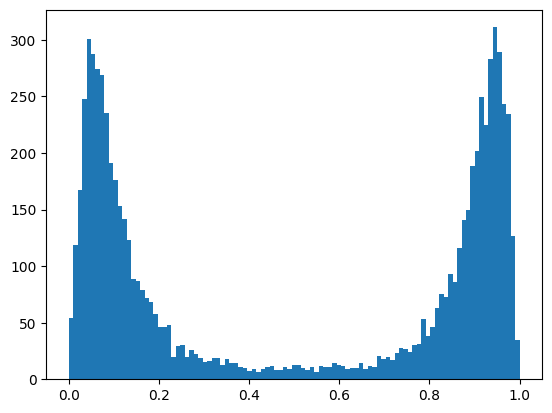

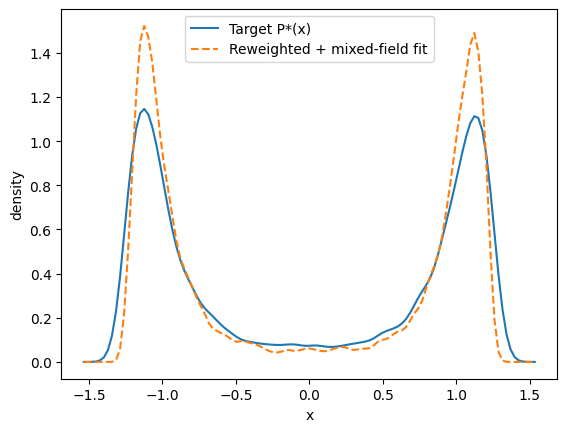

success: True
χ²*    : 0.033200312856234364
θ*     : (1.701829332600787, 0.34, 4.961626029961989, 1.0000000000010723, 0.5266365275440957, 0.009348049854482789)

=== Step: target eps_sp=0.360 (prev=0.340) ===
[μ=4.961626] f=m_dense-m_dilute=+0.2336
[step] μ=4.965626 f=+0.0823
[equal-ρ] μ0=4.965626, ΔA=+0.0823, ESS≈7505
[equal-ρ] bracket μ=4.965726, ΔA=+0.0785, ESS≈7505
[equal-ρ] bracket μ=4.965826, ΔA=+0.0746, ESS≈7505
[equal-ρ] bracket μ=4.965926, ΔA=+0.0707, ESS≈7504
[equal-ρ] bracket μ=4.966026, ΔA=+0.0669, ESS≈7503
[equal-ρ] bracket μ=4.966126, ΔA=+0.0630, ESS≈7502
[equal-ρ] bracket μ=4.966226, ΔA=+0.0591, ESS≈7501
[equal-ρ] bracket μ=4.966326, ΔA=+0.0552, ESS≈7499
[equal-ρ] bracket μ=4.966426, ΔA=+0.0513, ESS≈7497
[equal-ρ] bracket μ=4.966526, ΔA=+0.0475, ESS≈7495
[equal-ρ] bracket μ=4.966626, ΔA=+0.0436, ESS≈7493
[equal-ρ] bracket μ=4.966726, ΔA=+0.0397, ESS≈7490
[equal-ρ] bracket μ=4.966826, ΔA=+0.0358, ESS≈7488
[equal-ρ] bracket μ=4.966926, ΔA=+0.0319, ESS≈7485
[equal-ρ] bracket

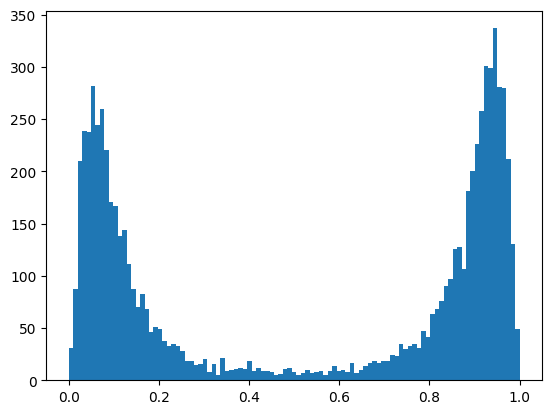

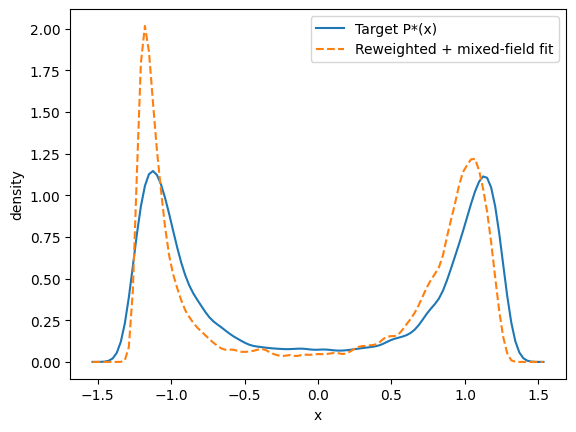

success: True
χ²*    : 0.042556710759582034
θ*     : (1.6999317835190124, 0.36, 4.958051047617185, 1.0, 1.1257925478536623, 0.36291585436901735)

=== Step: target eps_sp=0.380 (prev=0.360) ===


In [ ]:
%matplotlib inline
main(1.767,0, 2*1.767+np.log(4))

[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=3.420 (prev=3.420) ===
[μ=6.093263] f=m_dense-m_dilute=-0.0216
[equal-ρ] μ0=6.093263, ΔA=-0.0216, ESS≈7505
[equal-ρ] bracket μ=6.093163, ΔA=-0.0180, ESS≈7505
[equal-ρ] bracket μ=6.093063, ΔA=-0.0144, ESS≈7505
[equal-ρ] bracket μ=6.092963, ΔA=-0.0108, ESS≈7504
[equal-ρ] bracket μ=6.092863, ΔA=-0.0073, ESS≈7503
[equal-ρ] bracket μ=6.092763, ΔA=-0.0037, ESS≈7502
[equal-ρ] bracket μ=6.092663, ΔA=-0.0001, ESS≈7501
[equal-ρ] bracket μ=6.092563, ΔA=+0.0035, ESS≈7500
[equal-ρ] bisect μ=6.092913, ΔA=-0.0091, ESS≈7504
mu* = 6.092913   ESS ≈ 7504
0.48141905396402396


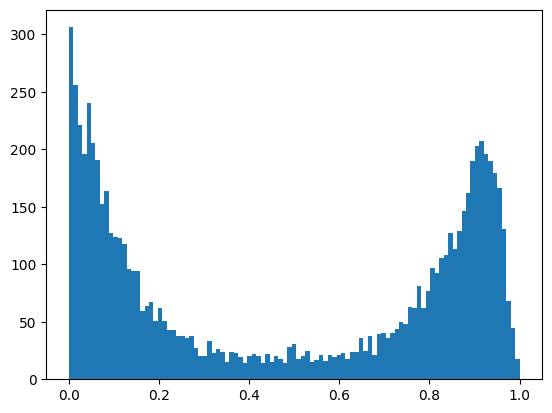

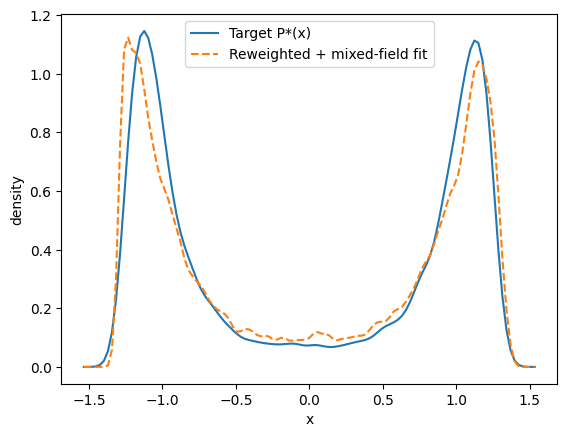

success: False
χ²*    : 0.017339898701959792
θ*     : (1.152470299702062, 3.42, 6.092913, 0.9999999999937389, 0.4436327006569879, -0.020325803535458948)

=== Step: target eps_sp=3.440 (prev=3.420) ===
[μ=6.092913] f=m_dense-m_dilute=+0.0031
[equal-ρ] μ0=6.092913, ΔA=+0.0031, ESS≈7505
mu* = 6.092913   ESS ≈ 7505
0.483836109260493


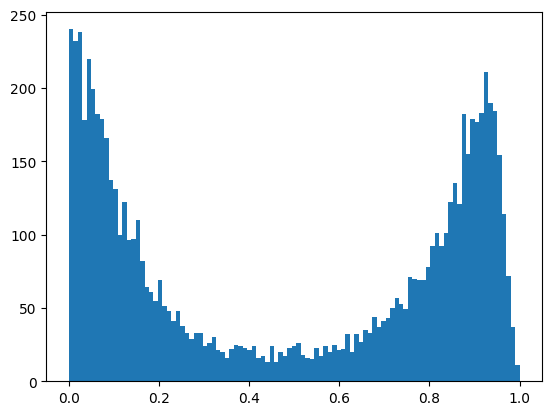

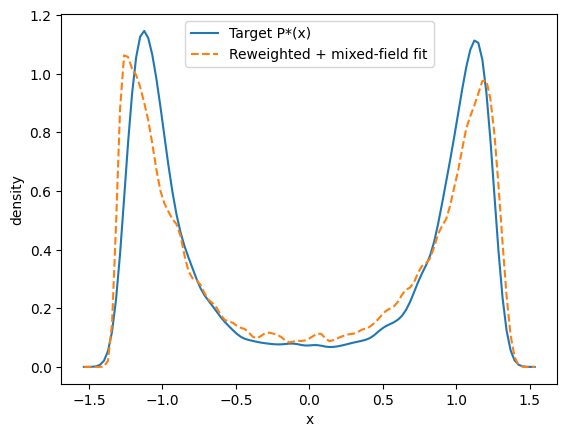

success: True
χ²*    : 0.04302314228685549
θ*     : (1.1451040605012623, 3.44, 6.081802010059908, 0.9999999999973584, 0.49374690504375746, -0.009460928320565056)

=== Step: target eps_sp=3.460 (prev=3.440) ===


In [ ]:
main(1.152470299702062, 3.42, 6.093263)

[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=3.540 (prev=3.540) ===
[μ=6.129823] f=m_dense-m_dilute=+0.8303
[step] μ=6.133823 f=+0.7877
[step] μ=6.137823 f=+0.7346
[step] μ=6.141823 f=+0.6674
[step] μ=6.145823 f=+0.5822
[step] μ=6.149823 f=+0.4680
[step] μ=6.153823 f=+0.3753
[step] μ=6.157823 f=+0.2542
[step] μ=6.161823 f=+0.1007
[step] μ=6.165823 f=-0.0242
[equal-ρ] μ0=6.165823, ΔA=A_dense-A_dilute=-0.0242, ESS≈15005
[equal-ρ] bracket μ=6.165723, ΔA=-0.0207, ESS≈15005
[equal-ρ] bracket μ=6.165623, ΔA=-0.0171, ESS≈15004
[equal-ρ] bracket μ=6.165523, ΔA=-0.0136, ESS≈15003
[equal-ρ] bracket μ=6.165423, ΔA=-0.0100, ESS≈15002
[equal-ρ] bracket μ=6.165323, ΔA=-0.0065, ESS≈15000
[equal-ρ] bracket μ=6.165223, ΔA=-0.0030, ESS≈14997
[equal-ρ] bracket μ=6.165123, ΔA=+0.0006, ESS≈14995
[equal-ρ] bisect μ=6.165473, ΔA=-0.0118, ESS≈15002
[equal-ρ] bisect μ=6.165298, ΔA=-0.0056, ESS≈14999
mu* = 6.165298   ESS ≈ 149

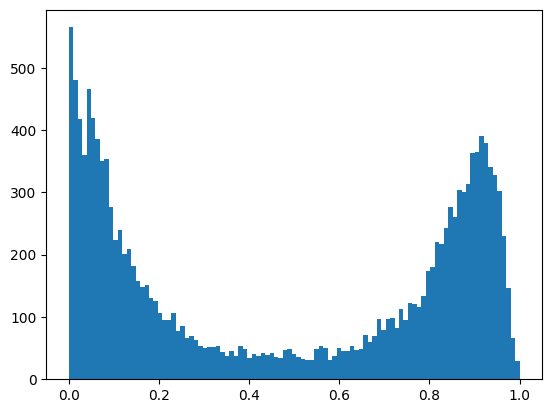

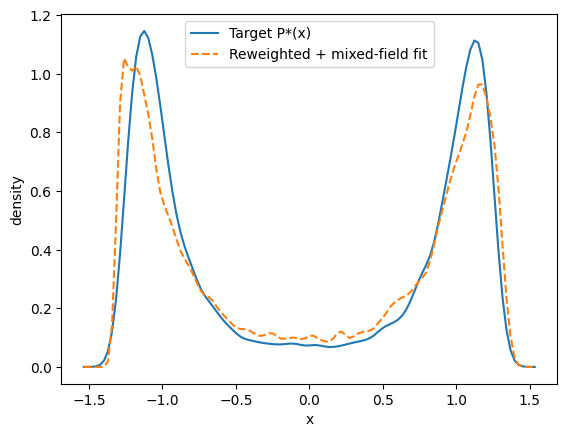

success: True
χ²*    : 0.015132298974551447
θ*     : (1.1364285224991493, 3.54, 6.165195024736171, 0.9999999999952182, 0.4543204238608708, -0.015212950113589094)

=== Step: target eps_sp=3.560 (prev=3.540) ===
[μ=6.165195] f=m_dense-m_dilute=-0.0325
[equal-ρ] μ0=6.165195, ΔA=A_dense-A_dilute=-0.0325, ESS≈15005
[equal-ρ] bracket μ=6.165095, ΔA=-0.0289, ESS≈15005
[equal-ρ] bracket μ=6.164995, ΔA=-0.0254, ESS≈15004
[equal-ρ] bracket μ=6.164895, ΔA=-0.0219, ESS≈15003
[equal-ρ] bracket μ=6.164795, ΔA=-0.0184, ESS≈15002
[equal-ρ] bracket μ=6.164695, ΔA=-0.0149, ESS≈15000
[equal-ρ] bracket μ=6.164595, ΔA=-0.0114, ESS≈14997
[equal-ρ] bracket μ=6.164495, ΔA=-0.0078, ESS≈14995
[equal-ρ] bracket μ=6.164395, ΔA=-0.0043, ESS≈14992
[equal-ρ] bracket μ=6.164295, ΔA=-0.0008, ESS≈14988
[equal-ρ] bracket μ=6.164195, ΔA=+0.0027, ESS≈14984
[equal-ρ] bisect μ=6.164695, ΔA=-0.0149, ESS≈15000
[equal-ρ] bisect μ=6.164445, ΔA=-0.0061, ESS≈14993
mu* = 6.164445   ESS ≈ 14993
0.4833242252582473


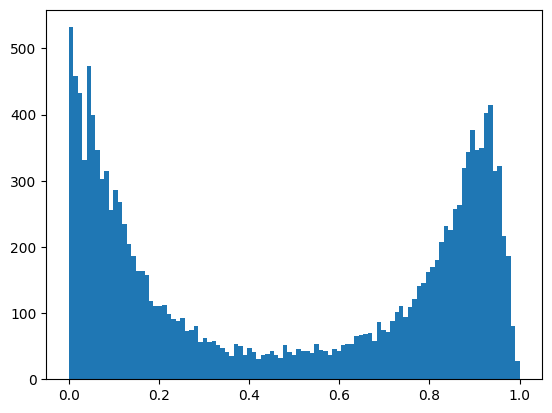

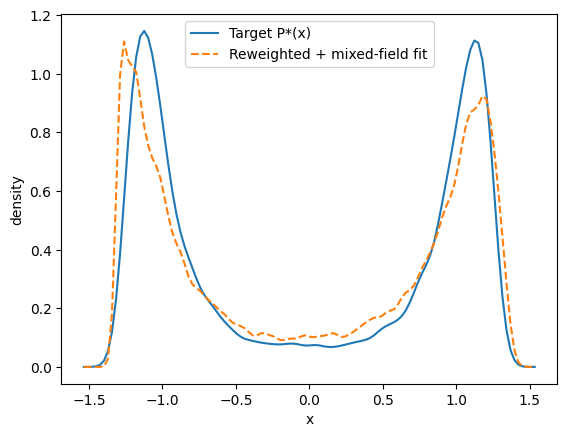

success: True
χ²*    : 0.02389837434116
θ*     : (1.1256695110957455, 3.56, 6.1692092688376015, 1.0000000000601963, 0.5624700973737747, 0.03332797659021167)

=== Step: target eps_sp=3.580 (prev=3.560) ===
[μ=6.169209] f=m_dense-m_dilute=-0.2559
[step] μ=6.165209 f=-0.1459
[step] μ=6.161209 f=-0.0016
[equal-ρ] μ0=6.161209, ΔA=A_dense-A_dilute=-0.0016, ESS≈15005
mu* = 6.161209   ESS ≈ 15005
0.48487304231922695


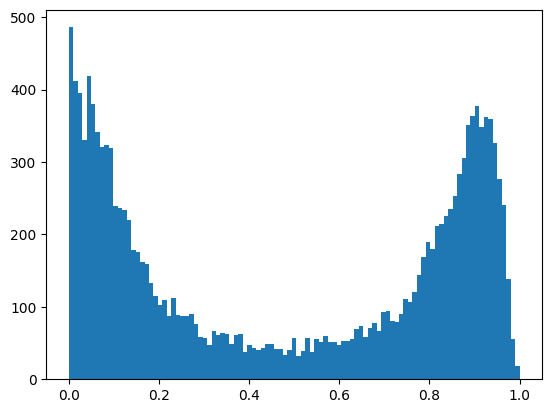

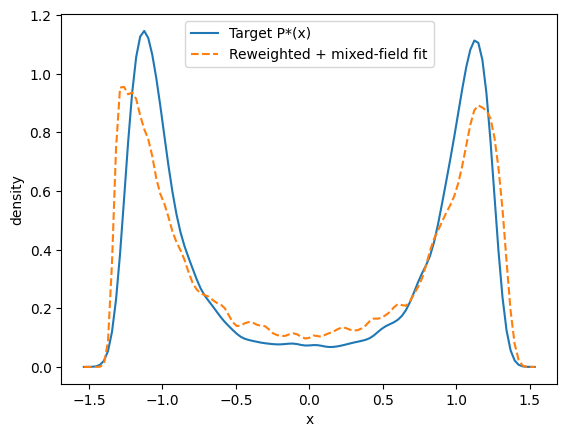

success: True
χ²*    : 0.0709992971892485
θ*     : (1.1190710510806323, 3.58, 6.167840390527852, 1.000000000000461, 0.5353615572732066, 0.0012374332235316008)

=== Step: target eps_sp=3.600 (prev=3.580) ===
[μ=6.167840] f=m_dense-m_dilute=-0.0660
[equal-ρ] μ0=6.167840, ΔA=A_dense-A_dilute=-0.0660, ESS≈15005
[equal-ρ] bracket μ=6.167740, ΔA=-0.0626, ESS≈15005
[equal-ρ] bracket μ=6.167640, ΔA=-0.0592, ESS≈15004
[equal-ρ] bracket μ=6.167540, ΔA=-0.0557, ESS≈15003
[equal-ρ] bracket μ=6.167440, ΔA=-0.0523, ESS≈15002
[equal-ρ] bracket μ=6.167340, ΔA=-0.0489, ESS≈15000
[equal-ρ] bracket μ=6.167240, ΔA=-0.0455, ESS≈14998
[equal-ρ] bracket μ=6.167140, ΔA=-0.0421, ESS≈14995
[equal-ρ] bracket μ=6.167040, ΔA=-0.0387, ESS≈14992
[equal-ρ] bracket μ=6.166940, ΔA=-0.0352, ESS≈14989
[equal-ρ] bracket μ=6.166840, ΔA=-0.0318, ESS≈14985
[equal-ρ] bracket μ=6.166740, ΔA=-0.0284, ESS≈14981
[equal-ρ] bracket μ=6.166640, ΔA=-0.0250, ESS≈14976
[equal-ρ] bracket μ=6.166540, ΔA=-0.0216, ESS≈14971
[equal-ρ] brack

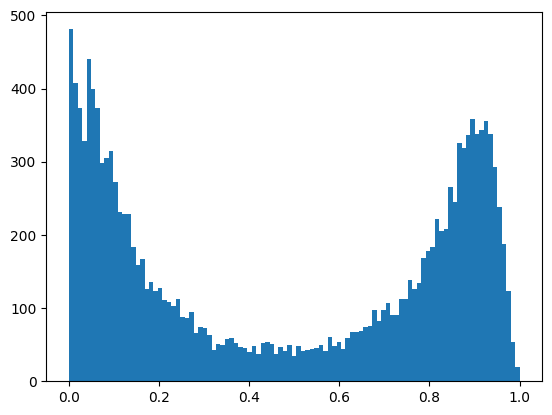

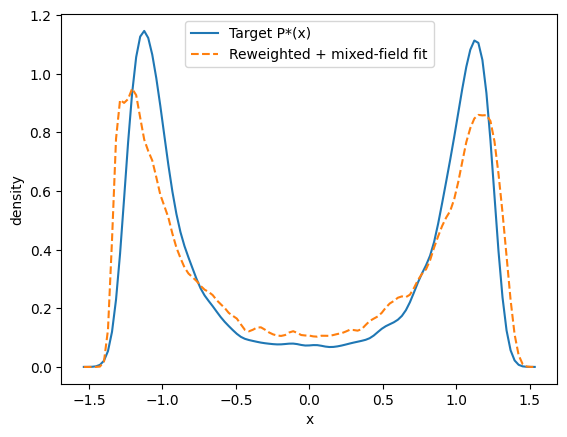

success: True
χ²*    : 0.3535262960485939
θ*     : (1.119071600308323, 3.6, 6.166090939755543, 0.9999999999926201, 0.6639020142325032, -0.00927463472932979)

=== Step: target eps_sp=3.620 (prev=3.600) ===
[μ=6.166091] f=m_dense-m_dilute=+0.5322
[step] μ=6.170091 f=+0.4011
[step] μ=6.174091 f=+0.2860
[step] μ=6.178091 f=+0.1755
[step] μ=6.182091 f=+0.0131
[equal-ρ] μ0=6.182091, ΔA=A_dense-A_dilute=+0.0131, ESS≈15005
[equal-ρ] bracket μ=6.182191, ΔA=+0.0096, ESS≈15005
[equal-ρ] bracket μ=6.182291, ΔA=+0.0062, ESS≈15004
[equal-ρ] bracket μ=6.182391, ΔA=+0.0027, ESS≈15003
[equal-ρ] bracket μ=6.182491, ΔA=-0.0007, ESS≈15002
[equal-ρ] bisect μ=6.182291, ΔA=+0.0062, ESS≈15004
mu* = 6.182291   ESS ≈ 15004
0.4882925691436188


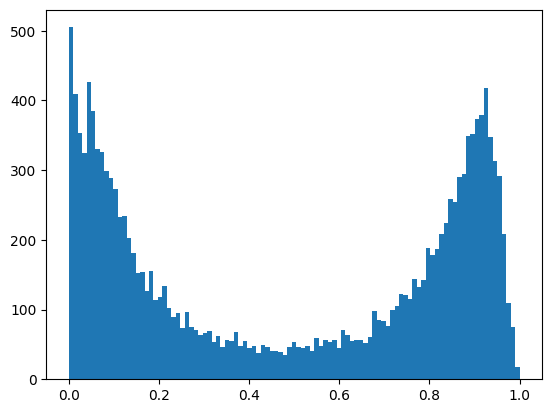

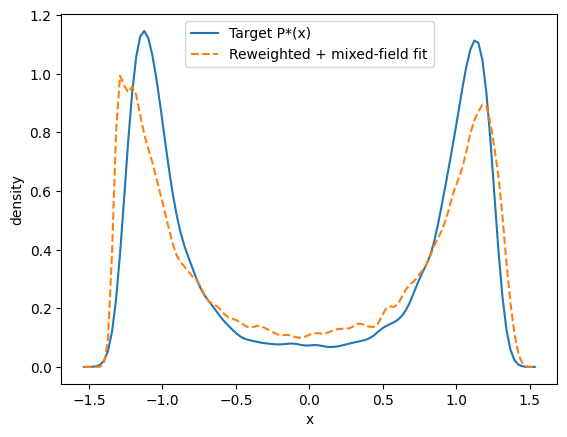

success: True
χ²*    : 0.18980069540669126
θ*     : (1.113187721725285, 3.62, 6.18530200818725, 1.0000000000487257, 0.6680978599565607, 0.031335235318493686)

=== Step: target eps_sp=3.640 (prev=3.620) ===
[μ=6.185302] f=m_dense-m_dilute=+0.1378
[step] μ=6.189302 f=-0.0149
[equal-ρ] μ0=6.189302, ΔA=A_dense-A_dilute=-0.0149, ESS≈15005
[equal-ρ] bracket μ=6.189202, ΔA=-0.0115, ESS≈15005
[equal-ρ] bracket μ=6.189102, ΔA=-0.0081, ESS≈15004
[equal-ρ] bracket μ=6.189002, ΔA=-0.0047, ESS≈15003
[equal-ρ] bracket μ=6.188902, ΔA=-0.0013, ESS≈15002
[equal-ρ] bracket μ=6.188802, ΔA=+0.0021, ESS≈15000
[equal-ρ] bisect μ=6.189052, ΔA=-0.0064, ESS≈15004
mu* = 6.189052   ESS ≈ 15004
0.48106897700766416


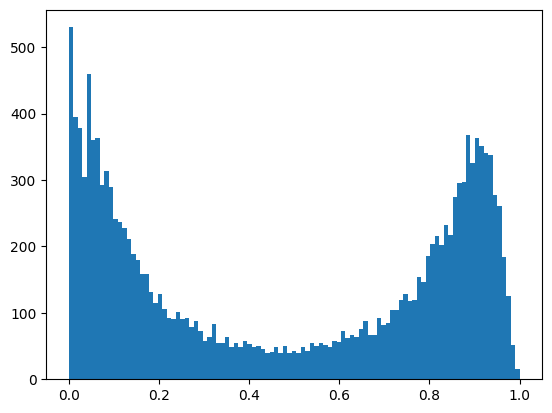

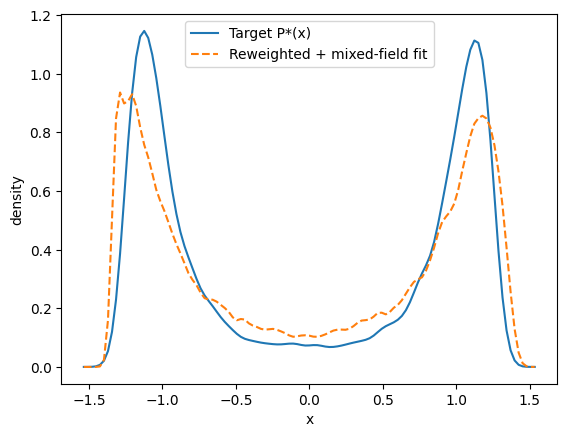

success: True
χ²*    : 0.2371040461105322
θ*     : (1.108309212923319, 3.64, 6.19124179463326, 0.9999999999998471, 0.6070588263375463, -0.00035845293773226574)

=== Step: target eps_sp=3.660 (prev=3.640) ===
[μ=6.191242] f=m_dense-m_dilute=+0.2054
[step] μ=6.195242 f=+0.0564
[equal-ρ] μ0=6.195242, ΔA=A_dense-A_dilute=+0.0564, ESS≈15005
[equal-ρ] bracket μ=6.195342, ΔA=+0.0530, ESS≈15005
[equal-ρ] bracket μ=6.195442, ΔA=+0.0496, ESS≈15004
[equal-ρ] bracket μ=6.195542, ΔA=+0.0462, ESS≈15003
[equal-ρ] bracket μ=6.195642, ΔA=+0.0429, ESS≈15002
[equal-ρ] bracket μ=6.195742, ΔA=+0.0395, ESS≈15000
[equal-ρ] bracket μ=6.195842, ΔA=+0.0361, ESS≈14998
[equal-ρ] bracket μ=6.195942, ΔA=+0.0327, ESS≈14995
[equal-ρ] bracket μ=6.196042, ΔA=+0.0293, ESS≈14992
[equal-ρ] bracket μ=6.196142, ΔA=+0.0259, ESS≈14989
[equal-ρ] bracket μ=6.196242, ΔA=+0.0225, ESS≈14985
[equal-ρ] bracket μ=6.196342, ΔA=+0.0191, ESS≈14981
[equal-ρ] bracket μ=6.196442, ΔA=+0.0158, ESS≈14976
[equal-ρ] bracket μ=6.196542, ΔA=+0.01

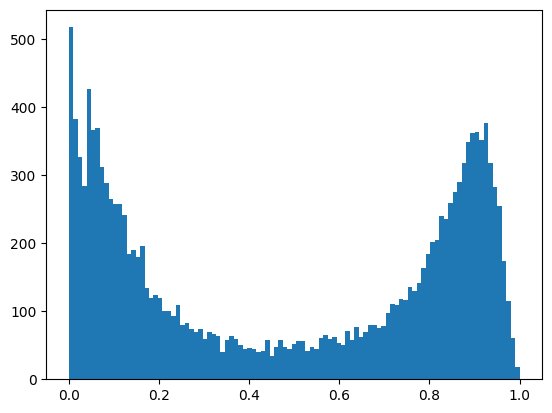

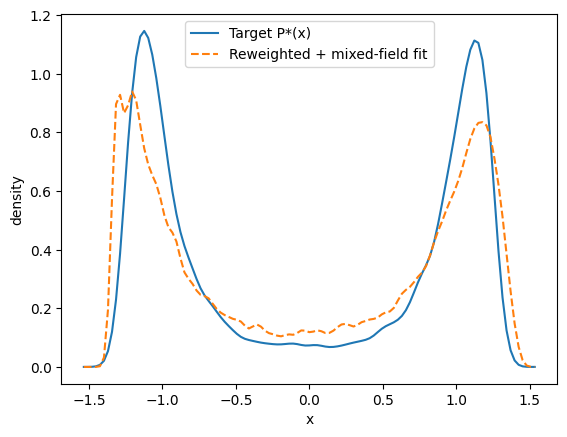

success: True
χ²*    : 0.22382148183391753
θ*     : (1.088309212923319, 3.66, 6.182178015338771, 1.0000000000543348, 0.6911086890894802, 0.02922080903784772)

=== Step: target eps_sp=3.680 (prev=3.660) ===
[μ=6.182178] f=m_dense-m_dilute=-0.2133
[step] μ=6.178178 f=-0.0604
[equal-ρ] μ0=6.178178, ΔA=A_dense-A_dilute=-0.0604, ESS≈15005
[equal-ρ] bracket μ=6.178078, ΔA=-0.0571, ESS≈15005
[equal-ρ] bracket μ=6.177978, ΔA=-0.0539, ESS≈15004
[equal-ρ] bracket μ=6.177878, ΔA=-0.0507, ESS≈15003
[equal-ρ] bracket μ=6.177778, ΔA=-0.0474, ESS≈15002
[equal-ρ] bracket μ=6.177678, ΔA=-0.0442, ESS≈15000
[equal-ρ] bracket μ=6.177578, ΔA=-0.0410, ESS≈14998
[equal-ρ] bracket μ=6.177478, ΔA=-0.0377, ESS≈14996
[equal-ρ] bracket μ=6.177378, ΔA=-0.0345, ESS≈14993
[equal-ρ] bracket μ=6.177278, ΔA=-0.0313, ESS≈14990
[equal-ρ] bracket μ=6.177178, ΔA=-0.0280, ESS≈14986
[equal-ρ] bracket μ=6.177078, ΔA=-0.0248, ESS≈14983
[equal-ρ] bracket μ=6.176978, ΔA=-0.0215, ESS≈14978
[equal-ρ] bracket μ=6.176878, ΔA=-0.0183

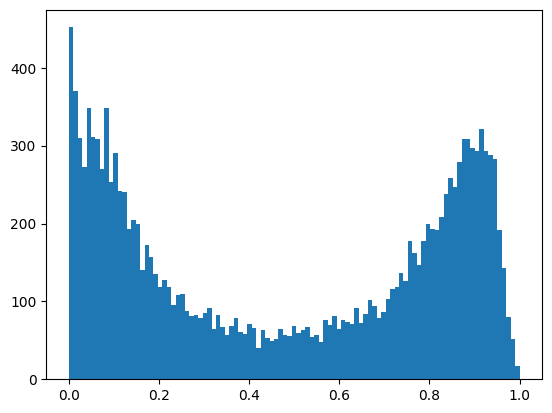

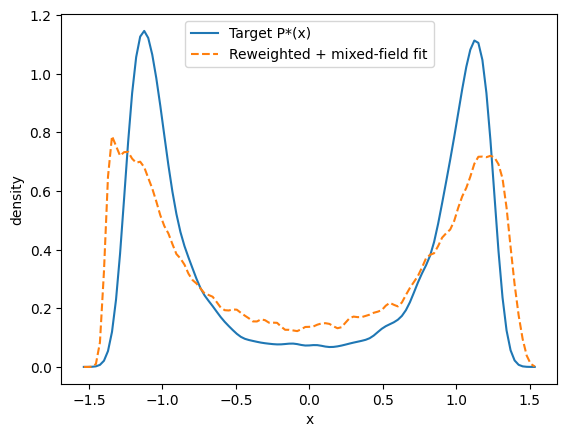

success: True
χ²*    : 0.11167119766956995
θ*     : (1.0744377256249835, 3.68, 6.173372103811167, 1.0, 0.5319754154474245, -0.00845896378169555)

=== Step: target eps_sp=3.700 (prev=3.680) ===
[μ=6.173372] f=m_dense-m_dilute=-0.2249
[step] μ=6.169372 f=-0.0877
[equal-ρ] μ0=6.169372, ΔA=A_dense-A_dilute=-0.0877, ESS≈15005
[equal-ρ] bracket μ=6.169272, ΔA=-0.0846, ESS≈15005
[equal-ρ] bracket μ=6.169172, ΔA=-0.0814, ESS≈15004
[equal-ρ] bracket μ=6.169072, ΔA=-0.0783, ESS≈15003
[equal-ρ] bracket μ=6.168972, ΔA=-0.0751, ESS≈15002
[equal-ρ] bracket μ=6.168872, ΔA=-0.0720, ESS≈15001
[equal-ρ] bracket μ=6.168772, ΔA=-0.0688, ESS≈14999
[equal-ρ] bracket μ=6.168672, ΔA=-0.0657, ESS≈14996
[equal-ρ] bracket μ=6.168572, ΔA=-0.0625, ESS≈14994
[equal-ρ] bracket μ=6.168472, ΔA=-0.0594, ESS≈14991
[equal-ρ] bracket μ=6.168372, ΔA=-0.0562, ESS≈14987
[equal-ρ] bracket μ=6.168272, ΔA=-0.0531, ESS≈14983
[equal-ρ] bracket μ=6.168172, ΔA=-0.0499, ESS≈14979
[equal-ρ] bracket μ=6.168072, ΔA=-0.0468, ESS≈14975
[

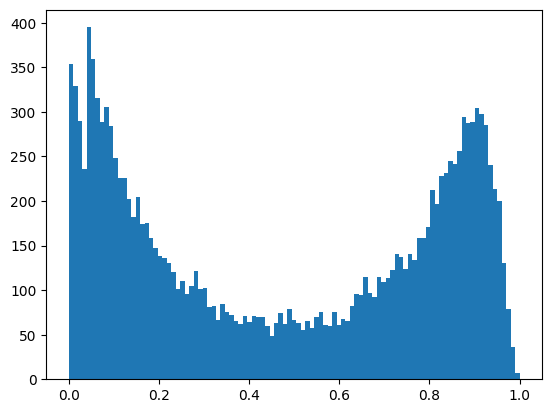

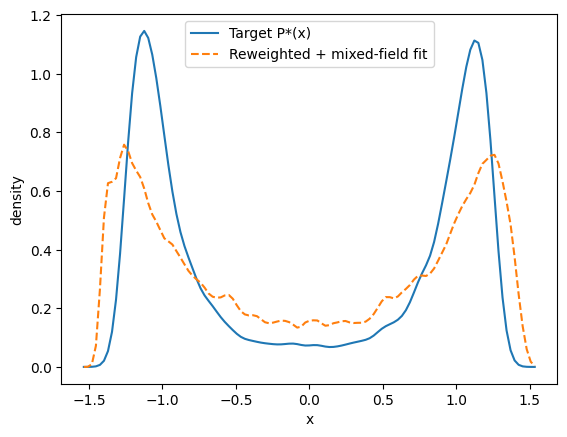

success: True
χ²*    : 0.12280889730352959
θ*     : (1.065771477758779, 3.7, 6.16846024849288, 1.0, 0.4872314019480459, -0.031456152041735526)

=== Step: target eps_sp=3.720 (prev=3.700) ===
[μ=6.168460] f=m_dense-m_dilute=-0.0308
[equal-ρ] μ0=6.168460, ΔA=A_dense-A_dilute=-0.0308, ESS≈15005
[equal-ρ] bracket μ=6.168360, ΔA=-0.0277, ESS≈15005
[equal-ρ] bracket μ=6.168260, ΔA=-0.0245, ESS≈15004
[equal-ρ] bracket μ=6.168160, ΔA=-0.0214, ESS≈15003
[equal-ρ] bracket μ=6.168060, ΔA=-0.0183, ESS≈15002
[equal-ρ] bracket μ=6.167960, ΔA=-0.0152, ESS≈15001
[equal-ρ] bracket μ=6.167860, ΔA=-0.0121, ESS≈14999
[equal-ρ] bracket μ=6.167760, ΔA=-0.0089, ESS≈14996
[equal-ρ] bracket μ=6.167660, ΔA=-0.0058, ESS≈14994
[equal-ρ] bracket μ=6.167560, ΔA=-0.0027, ESS≈14991
[equal-ρ] bracket μ=6.167460, ΔA=+0.0004, ESS≈14987
[equal-ρ] bisect μ=6.167960, ΔA=-0.0152, ESS≈15001
[equal-ρ] bisect μ=6.167710, ΔA=-0.0074, ESS≈14995
mu* = 6.167710   ESS ≈ 14995
0.4781406197934022


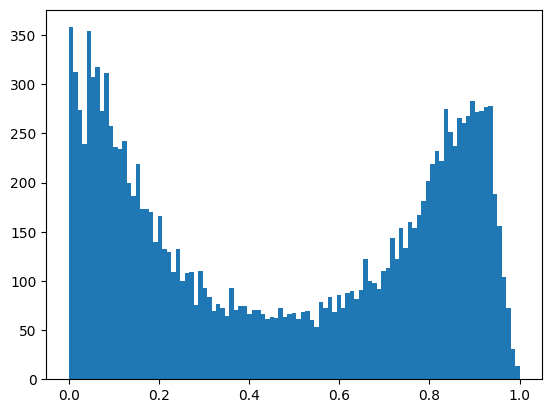

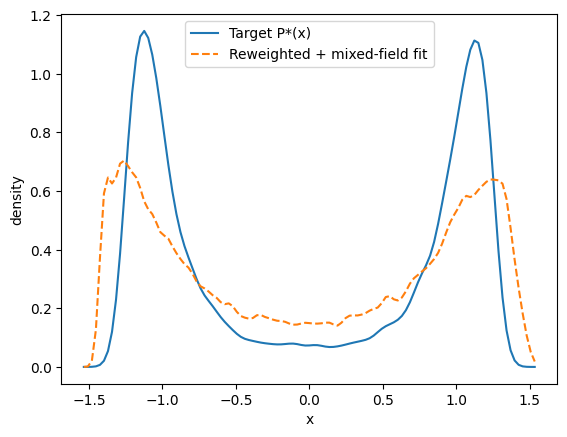

success: True
χ²*    : 0.24949286521798378
θ*     : (1.0457861012348102, 3.72, 6.1477102484928805, 1.0, 0.6251092683856156, -0.008158054037112722)

=== Step: target eps_sp=3.740 (prev=3.720) ===


SystemError: CPUDispatcher(<function _mc_lattice_single_site_numba at 0x11785b880>) returned a result with an exception set

In [7]:
main(1.136325753878945, 3.54, 6.129822763113986)

[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=3.680 (prev=3.680) ===
[μ=6.193372] f=m_dense-m_dilute=+0.7692
[step] μ=6.197372 f=+0.7166
[step] μ=6.201372 f=+0.6437
[step] μ=6.205372 f=+0.5717
[step] μ=6.209372 f=+0.4726
[step] μ=6.213372 f=+0.3535
[step] μ=6.217372 f=+0.2353
[step] μ=6.221372 f=+0.1102
[step] μ=6.225372 f=-0.0494
[equal-ρ] μ0=6.225372, ΔA=A_dense-A_dilute=-0.0494, ESS≈15005
[equal-ρ] bracket μ=6.225272, ΔA=-0.0460, ESS≈15005
[equal-ρ] bracket μ=6.225172, ΔA=-0.0426, ESS≈15004
[equal-ρ] bracket μ=6.225072, ΔA=-0.0392, ESS≈15003
[equal-ρ] bracket μ=6.224972, ΔA=-0.0358, ESS≈15002
[equal-ρ] bracket μ=6.224872, ΔA=-0.0324, ESS≈15000
[equal-ρ] bracket μ=6.224772, ΔA=-0.0290, ESS≈14998
[equal-ρ] bracket μ=6.224672, ΔA=-0.0255, ESS≈14995
[equal-ρ] bracket μ=6.224572, ΔA=-0.0221, ESS≈14992
[equal-ρ] bracket μ=6.224472, ΔA=-0.0187, ESS≈14989
[equal-ρ] bracket μ=6.224372, ΔA=-0.0153, ESS≈14985


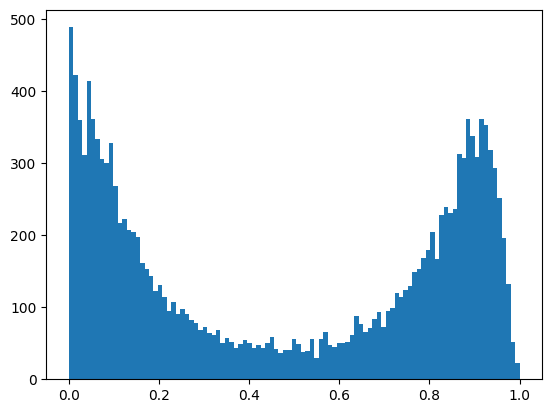

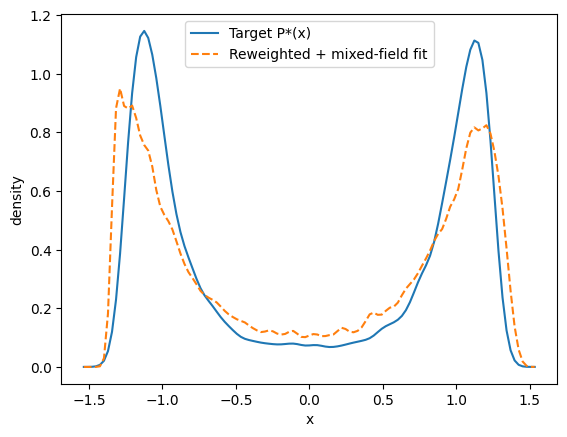

success: True
χ²*    : 0.024411295956731582
θ*     : (1.1019544166422144, 3.68, 6.221377408183199, 1.0000000000195721, 0.515229646184358, 0.0164748118256845)

=== Step: target eps_sp=3.700 (prev=3.680) ===
[μ=6.221377] f=m_dense-m_dilute=-0.0571
[equal-ρ] μ0=6.221377, ΔA=A_dense-A_dilute=-0.0571, ESS≈15005
[equal-ρ] bracket μ=6.221277, ΔA=-0.0537, ESS≈15005
[equal-ρ] bracket μ=6.221177, ΔA=-0.0503, ESS≈15004
[equal-ρ] bracket μ=6.221077, ΔA=-0.0470, ESS≈15003
[equal-ρ] bracket μ=6.220977, ΔA=-0.0436, ESS≈15002
[equal-ρ] bracket μ=6.220877, ΔA=-0.0402, ESS≈15000
[equal-ρ] bracket μ=6.220777, ΔA=-0.0368, ESS≈14998
[equal-ρ] bracket μ=6.220677, ΔA=-0.0334, ESS≈14995
[equal-ρ] bracket μ=6.220577, ΔA=-0.0300, ESS≈14992
[equal-ρ] bracket μ=6.220477, ΔA=-0.0266, ESS≈14989
[equal-ρ] bracket μ=6.220377, ΔA=-0.0232, ESS≈14985
[equal-ρ] bracket μ=6.220277, ΔA=-0.0199, ESS≈14981
[equal-ρ] bracket μ=6.220177, ΔA=-0.0165, ESS≈14976
[equal-ρ] bracket μ=6.220077, ΔA=-0.0131, ESS≈14972
[equal-ρ] bracke

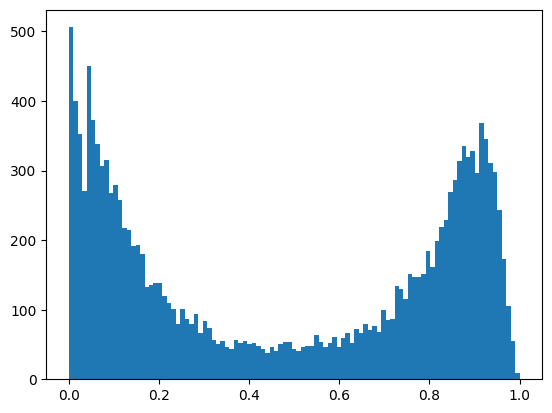

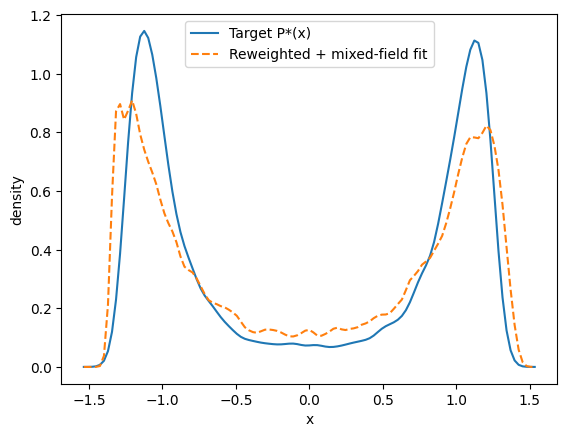

success: True
χ²*    : 0.21256268587922134
θ*     : (1.0951903174928244, 3.7, 6.220438323214609, 1.000000000006031, 0.6216179536748806, 0.007704673612199429)

=== Step: target eps_sp=3.720 (prev=3.700) ===
[μ=6.220438] f=m_dense-m_dilute=+0.0958
[equal-ρ] μ0=6.220438, ΔA=A_dense-A_dilute=+0.0958, ESS≈15005
[equal-ρ] bracket μ=6.220538, ΔA=+0.0925, ESS≈15005
[equal-ρ] bracket μ=6.220638, ΔA=+0.0892, ESS≈15004
[equal-ρ] bracket μ=6.220738, ΔA=+0.0858, ESS≈15003
[equal-ρ] bracket μ=6.220838, ΔA=+0.0825, ESS≈15002
[equal-ρ] bracket μ=6.220938, ΔA=+0.0792, ESS≈15000
[equal-ρ] bracket μ=6.221038, ΔA=+0.0759, ESS≈14998
[equal-ρ] bracket μ=6.221138, ΔA=+0.0726, ESS≈14996
[equal-ρ] bracket μ=6.221238, ΔA=+0.0693, ESS≈14993
[equal-ρ] bracket μ=6.221338, ΔA=+0.0659, ESS≈14989
[equal-ρ] bracket μ=6.221438, ΔA=+0.0626, ESS≈14986
[equal-ρ] bracket μ=6.221538, ΔA=+0.0593, ESS≈14982
[equal-ρ] bracket μ=6.221638, ΔA=+0.0560, ESS≈14977
[equal-ρ] bracket μ=6.221738, ΔA=+0.0526, ESS≈14972
[equal-ρ] bracke

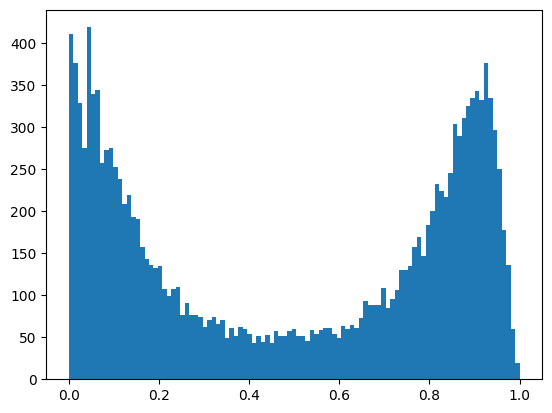

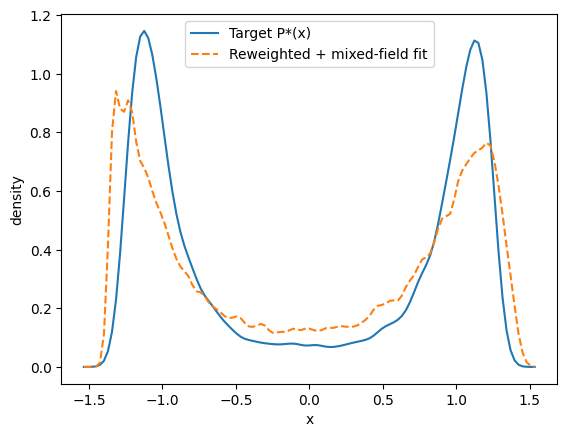

success: True
χ²*    : 0.1002404258437807
θ*     : (1.088827488790654, 3.72, 6.228801329546361, 1.0, 0.7257400260780222, 0.07742467383646931)

=== Step: target eps_sp=3.740 (prev=3.720) ===
[μ=6.228801] f=m_dense-m_dilute=+0.0245
[equal-ρ] μ0=6.228801, ΔA=A_dense-A_dilute=+0.0245, ESS≈15005
[equal-ρ] bracket μ=6.228901, ΔA=+0.0212, ESS≈15005
[equal-ρ] bracket μ=6.229001, ΔA=+0.0179, ESS≈15004
[equal-ρ] bracket μ=6.229101, ΔA=+0.0146, ESS≈15003
[equal-ρ] bracket μ=6.229201, ΔA=+0.0114, ESS≈15002
[equal-ρ] bracket μ=6.229301, ΔA=+0.0081, ESS≈15000
[equal-ρ] bracket μ=6.229401, ΔA=+0.0048, ESS≈14998
[equal-ρ] bracket μ=6.229501, ΔA=+0.0015, ESS≈14996
[equal-ρ] bracket μ=6.229601, ΔA=-0.0018, ESS≈14993
[equal-ρ] bisect μ=6.229201, ΔA=+0.0114, ESS≈15002
[equal-ρ] bisect μ=6.229401, ΔA=+0.0048, ESS≈14998
mu* = 6.229401   ESS ≈ 14998
0.48377807397534156


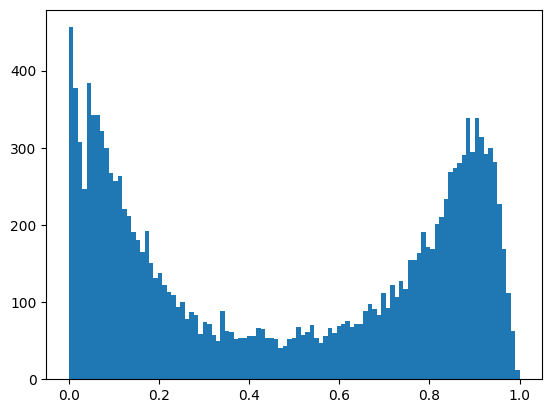

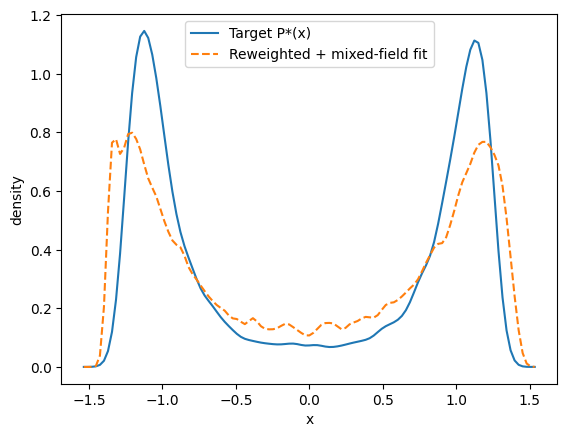

success: True
χ²*    : 0.2304976914601738
θ*     : (1.0770503185931777, 3.74, 6.222872468943627, 0.9999999999800596, 0.5755579267021069, -0.01730114821590955)

=== Step: target eps_sp=3.760 (prev=3.740) ===
[μ=6.222872] f=m_dense-m_dilute=+0.0196
[equal-ρ] μ0=6.222872, ΔA=A_dense-A_dilute=+0.0196, ESS≈15005
[equal-ρ] bracket μ=6.222972, ΔA=+0.0164, ESS≈15005
[equal-ρ] bracket μ=6.223072, ΔA=+0.0132, ESS≈15004
[equal-ρ] bracket μ=6.223172, ΔA=+0.0099, ESS≈15003
[equal-ρ] bracket μ=6.223272, ΔA=+0.0067, ESS≈15002
[equal-ρ] bracket μ=6.223372, ΔA=+0.0035, ESS≈15000
[equal-ρ] bracket μ=6.223472, ΔA=+0.0003, ESS≈14998
[equal-ρ] bracket μ=6.223572, ΔA=-0.0029, ESS≈14996
[equal-ρ] bisect μ=6.223222, ΔA=+0.0083, ESS≈15003
mu* = 6.223222   ESS ≈ 15003
0.4874848383872042


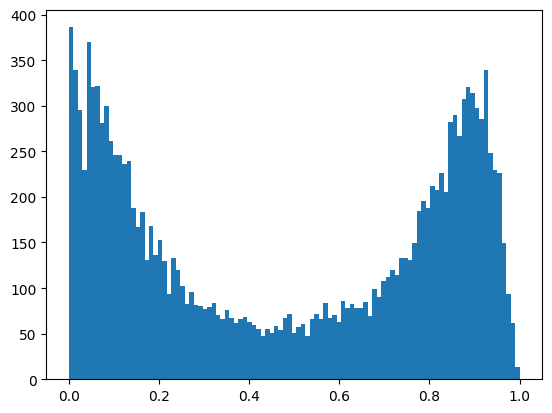

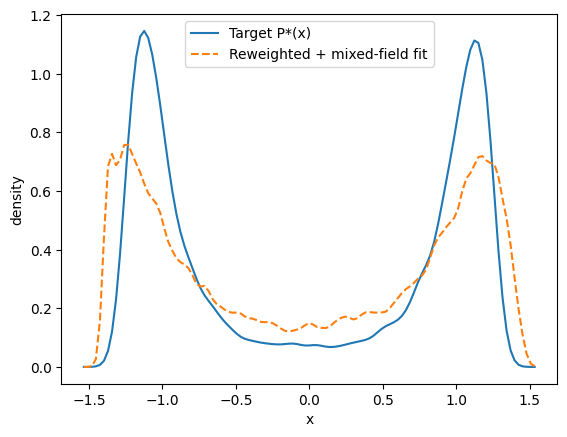

success: True
χ²*    : 0.0898984357465541
θ*     : (1.0703929017886002, 3.7600000000000002, 6.229879625650655, 1.0, 0.5289424727804929, -0.002033555448410421)

=== Step: target eps_sp=3.780 (prev=3.760) ===
[μ=6.229880] f=m_dense-m_dilute=-0.0394
[equal-ρ] μ0=6.229880, ΔA=A_dense-A_dilute=-0.0394, ESS≈15005
[equal-ρ] bracket μ=6.229780, ΔA=-0.0362, ESS≈15005
[equal-ρ] bracket μ=6.229680, ΔA=-0.0330, ESS≈15004
[equal-ρ] bracket μ=6.229580, ΔA=-0.0299, ESS≈15003
[equal-ρ] bracket μ=6.229480, ΔA=-0.0267, ESS≈15002
[equal-ρ] bracket μ=6.229380, ΔA=-0.0235, ESS≈15000
[equal-ρ] bracket μ=6.229280, ΔA=-0.0203, ESS≈14999
[equal-ρ] bracket μ=6.229180, ΔA=-0.0172, ESS≈14996
[equal-ρ] bracket μ=6.229080, ΔA=-0.0140, ESS≈14993
[equal-ρ] bracket μ=6.228980, ΔA=-0.0108, ESS≈14990
[equal-ρ] bracket μ=6.228880, ΔA=-0.0076, ESS≈14987
[equal-ρ] bracket μ=6.228780, ΔA=-0.0044, ESS≈14983
[equal-ρ] bracket μ=6.228680, ΔA=-0.0013, ESS≈14979
[equal-ρ] bracket μ=6.228580, ΔA=+0.0019, ESS≈14975
[equal-ρ] bisec

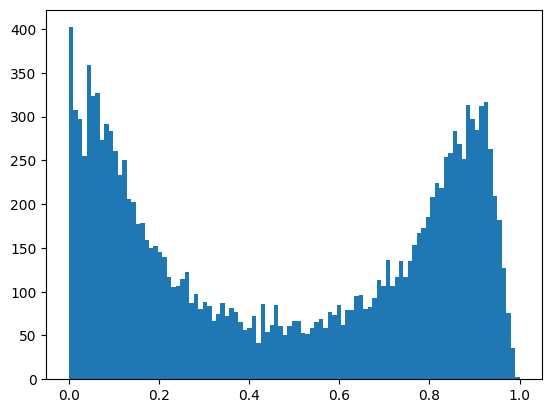

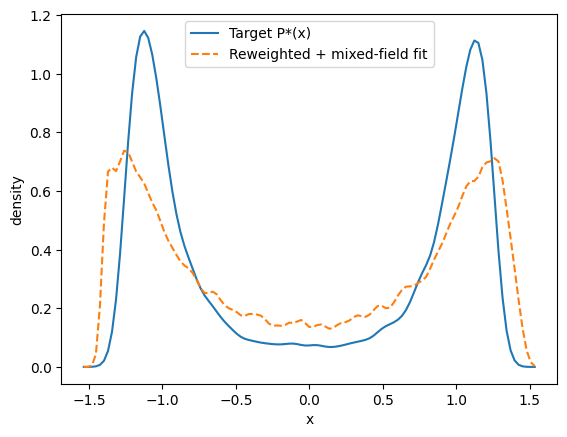

success: True
χ²*    : 0.07179779344143232
θ*     : (1.0503931200950276, 3.7800000000000002, 6.2233782736911305, 1.0, 0.48126384174594145, -0.011041664312225379)

=== Step: target eps_sp=3.800 (prev=3.780) ===
[μ=6.223378] f=m_dense-m_dilute=-0.4394
[step] μ=6.219378 f=-0.3436
[step] μ=6.215378 f=-0.2484
[step] μ=6.211378 f=-0.1216
[step] μ=6.207378 f=+0.0143
[equal-ρ] μ0=6.207378, ΔA=A_dense-A_dilute=+0.0143, ESS≈15005
[equal-ρ] bracket μ=6.207478, ΔA=+0.0113, ESS≈15005
[equal-ρ] bracket μ=6.207578, ΔA=+0.0082, ESS≈15004
[equal-ρ] bracket μ=6.207678, ΔA=+0.0052, ESS≈15003
[equal-ρ] bracket μ=6.207778, ΔA=+0.0022, ESS≈15002
[equal-ρ] bracket μ=6.207878, ΔA=-0.0009, ESS≈15001
[equal-ρ] bisect μ=6.207628, ΔA=+0.0067, ESS≈15004
mu* = 6.207628   ESS ≈ 15004
0.48468243918693765


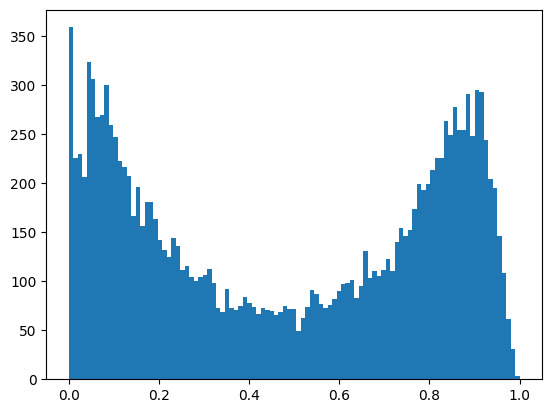

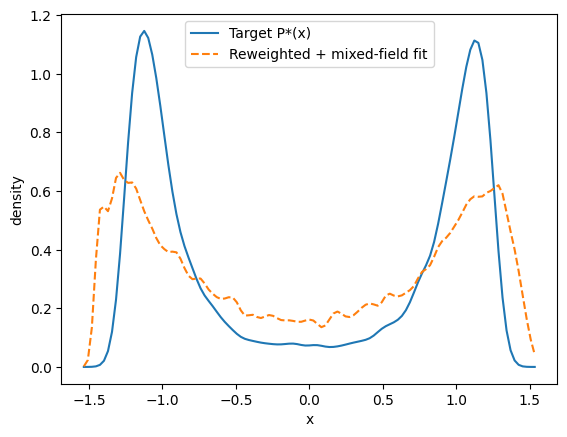

success: True
χ²*    : 0.3092981105437378
θ*     : (1.0503931761069016, 3.8000000000000003, 6.207628217679257, 1.0, 0.6668110537847405, 0.0006422759283142583)

=== Step: target eps_sp=3.820 (prev=3.800) ===
[μ=6.207628] f=m_dense-m_dilute=+0.4909
[step] μ=6.211628 f=+0.3915
[step] μ=6.215628 f=+0.2798
[step] μ=6.219628 f=+0.1654
[step] μ=6.223628 f=+0.0433
[equal-ρ] μ0=6.223628, ΔA=A_dense-A_dilute=+0.0433, ESS≈15005
[equal-ρ] bracket μ=6.223728, ΔA=+0.0403, ESS≈15005
[equal-ρ] bracket μ=6.223828, ΔA=+0.0372, ESS≈15004
[equal-ρ] bracket μ=6.223928, ΔA=+0.0342, ESS≈15003
[equal-ρ] bracket μ=6.224028, ΔA=+0.0311, ESS≈15002
[equal-ρ] bracket μ=6.224128, ΔA=+0.0281, ESS≈15001
[equal-ρ] bracket μ=6.224228, ΔA=+0.0250, ESS≈14999
[equal-ρ] bracket μ=6.224328, ΔA=+0.0220, ESS≈14997
[equal-ρ] bracket μ=6.224428, ΔA=+0.0189, ESS≈14994
[equal-ρ] bracket μ=6.224528, ΔA=+0.0159, ESS≈14991
[equal-ρ] bracket μ=6.224628, ΔA=+0.0128, ESS≈14988
[equal-ρ] bracket μ=6.224728, ΔA=+0.0097, ESS≈14984
[equal-

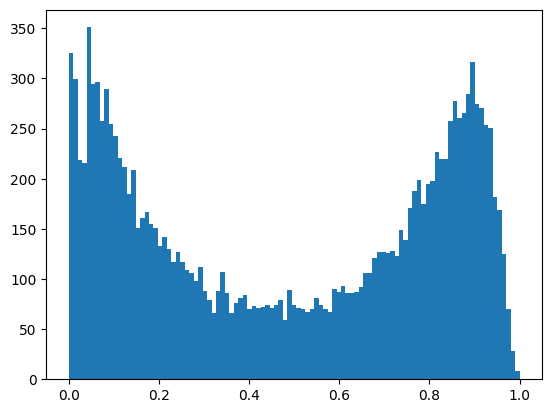

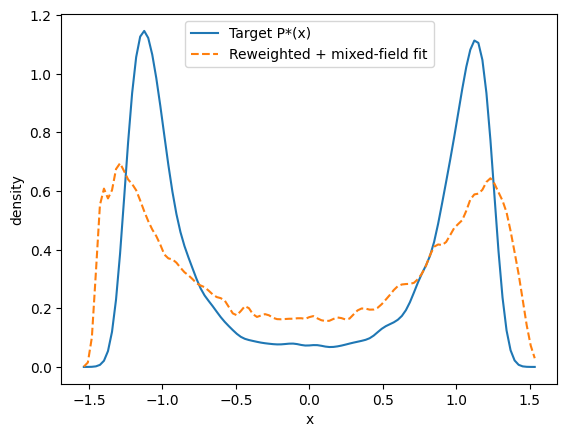

success: True
χ²*    : 0.28096984358669286
θ*     : (1.0503933206863583, 3.8200000000000003, 6.224753073099799, 1.0, 0.689090154254026, 0.006853226246189824)

=== Step: target eps_sp=3.840 (prev=3.820) ===
[μ=6.224753] f=m_dense-m_dilute=+0.4946
[step] μ=6.228753 f=+0.3981
[step] μ=6.232753 f=+0.2871
[step] μ=6.236753 f=+0.1714
[step] μ=6.240753 f=+0.0602
[equal-ρ] μ0=6.240753, ΔA=A_dense-A_dilute=+0.0602, ESS≈15005
[equal-ρ] bracket μ=6.240853, ΔA=+0.0572, ESS≈15005
[equal-ρ] bracket μ=6.240953, ΔA=+0.0541, ESS≈15004
[equal-ρ] bracket μ=6.241053, ΔA=+0.0511, ESS≈15003
[equal-ρ] bracket μ=6.241153, ΔA=+0.0480, ESS≈15002
[equal-ρ] bracket μ=6.241253, ΔA=+0.0450, ESS≈15001
[equal-ρ] bracket μ=6.241353, ΔA=+0.0419, ESS≈14999
[equal-ρ] bracket μ=6.241453, ΔA=+0.0389, ESS≈14997
[equal-ρ] bracket μ=6.241553, ΔA=+0.0358, ESS≈14994
[equal-ρ] bracket μ=6.241653, ΔA=+0.0328, ESS≈14991
[equal-ρ] bracket μ=6.241753, ΔA=+0.0297, ESS≈14988
[equal-ρ] bracket μ=6.241853, ΔA=+0.0266, ESS≈14984
[equal-ρ

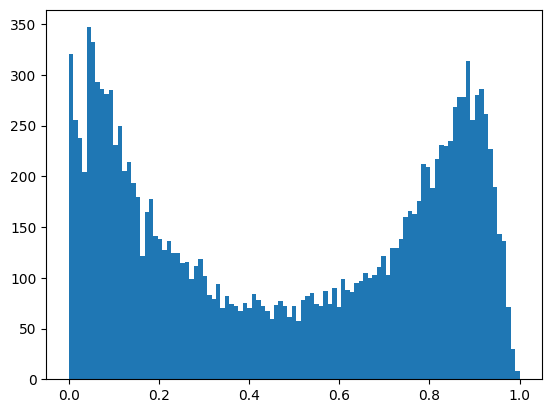

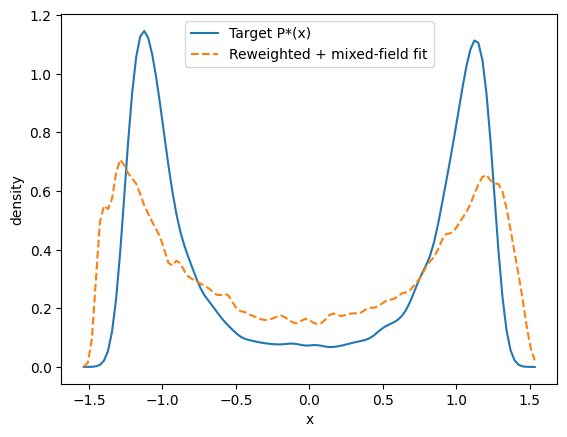

success: True
χ²*    : 0.2775493736600503
θ*     : (1.050393420856164, 3.8400000000000003, 6.242502972929992, 1.0, 0.6177749697385623, -0.01794622041495301)

=== Step: target eps_sp=3.860 (prev=3.840) ===
[μ=6.242503] f=m_dense-m_dilute=+0.4877
[step] μ=6.246503 f=+0.3981
[step] μ=6.250503 f=+0.2792
[step] μ=6.254503 f=+0.1749
[step] μ=6.258503 f=+0.0328
[equal-ρ] μ0=6.258503, ΔA=A_dense-A_dilute=+0.0328, ESS≈15005
[equal-ρ] bracket μ=6.258603, ΔA=+0.0297, ESS≈15005
[equal-ρ] bracket μ=6.258703, ΔA=+0.0267, ESS≈15004
[equal-ρ] bracket μ=6.258803, ΔA=+0.0236, ESS≈15003
[equal-ρ] bracket μ=6.258903, ΔA=+0.0205, ESS≈15002
[equal-ρ] bracket μ=6.259003, ΔA=+0.0175, ESS≈15001
[equal-ρ] bracket μ=6.259103, ΔA=+0.0144, ESS≈14999
[equal-ρ] bracket μ=6.259203, ΔA=+0.0113, ESS≈14997
[equal-ρ] bracket μ=6.259303, ΔA=+0.0082, ESS≈14994
[equal-ρ] bracket μ=6.259403, ΔA=+0.0052, ESS≈14991
[equal-ρ] bracket μ=6.259503, ΔA=+0.0021, ESS≈14988
[equal-ρ] bracket μ=6.259603, ΔA=-0.0010, ESS≈14984
[equal-ρ]

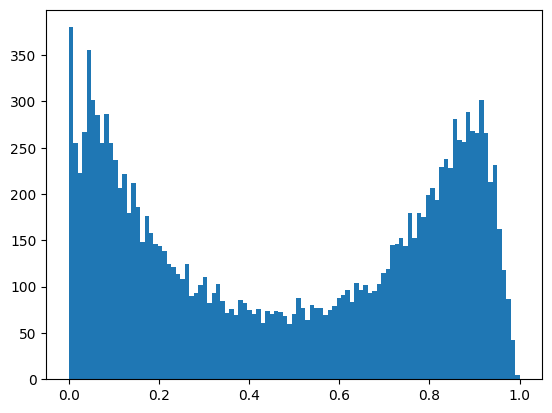

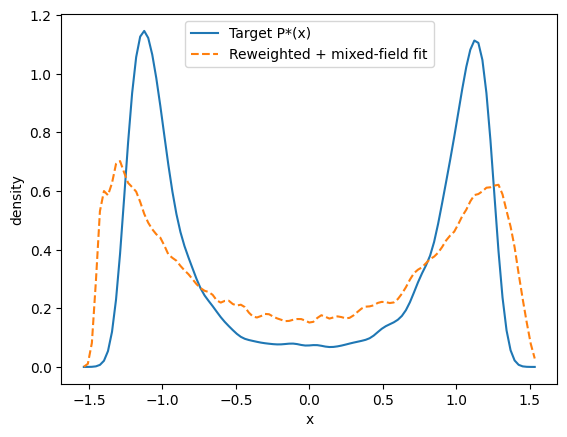

success: False
χ²*    : 0.10420309830088459
θ*     : (1.0437298397684842, 3.8600000000000003, 6.265991586000873, 1.0, 0.5338166383457554, 0.0020148070832536422)

=== Step: target eps_sp=3.880 (prev=3.860) ===
[μ=6.265992] f=m_dense-m_dilute=-0.0400
[equal-ρ] μ0=6.265992, ΔA=A_dense-A_dilute=-0.0400, ESS≈15005
[equal-ρ] bracket μ=6.265892, ΔA=-0.0369, ESS≈15005
[equal-ρ] bracket μ=6.265792, ΔA=-0.0339, ESS≈15004
[equal-ρ] bracket μ=6.265692, ΔA=-0.0308, ESS≈15003
[equal-ρ] bracket μ=6.265592, ΔA=-0.0278, ESS≈15002
[equal-ρ] bracket μ=6.265492, ΔA=-0.0247, ESS≈15001
[equal-ρ] bracket μ=6.265392, ΔA=-0.0216, ESS≈14999
[equal-ρ] bracket μ=6.265292, ΔA=-0.0186, ESS≈14997
[equal-ρ] bracket μ=6.265192, ΔA=-0.0155, ESS≈14994
[equal-ρ] bracket μ=6.265092, ΔA=-0.0125, ESS≈14991
[equal-ρ] bracket μ=6.264992, ΔA=-0.0094, ESS≈14988
[equal-ρ] bracket μ=6.264892, ΔA=-0.0064, ESS≈14984
[equal-ρ] bracket μ=6.264792, ΔA=-0.0033, ESS≈14980
[equal-ρ] bracket μ=6.264692, ΔA=-0.0002, ESS≈14976
[equal-ρ] bra

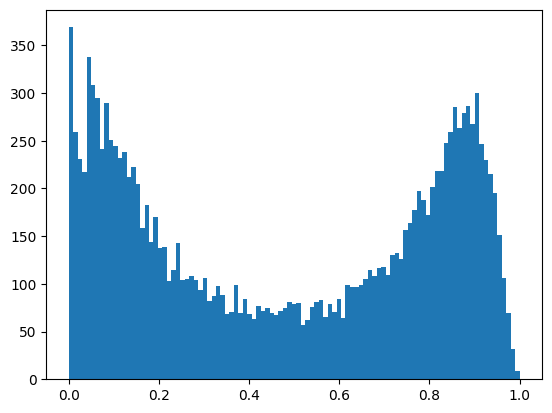

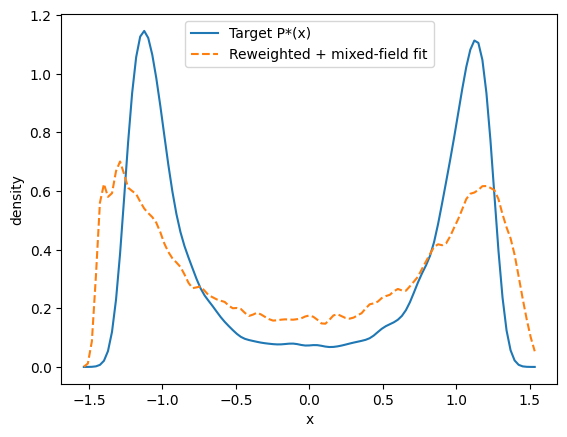

success: True
χ²*    : 0.25390106239976173
θ*     : (1.0437300061930834, 3.8800000000000003, 6.264941419576274, 1.0, 0.7917372857431478, 0.04500425502157877)

=== Step: target eps_sp=3.900 (prev=3.880) ===
[μ=6.264941] f=m_dense-m_dilute=+0.4920
[step] μ=6.268941 f=+0.3993
[step] μ=6.272941 f=+0.2898
[step] μ=6.276941 f=+0.1545
[step] μ=6.280941 f=+0.0471
[equal-ρ] μ0=6.280941, ΔA=A_dense-A_dilute=+0.0471, ESS≈15005
[equal-ρ] bracket μ=6.281041, ΔA=+0.0440, ESS≈15005
[equal-ρ] bracket μ=6.281141, ΔA=+0.0409, ESS≈15004
[equal-ρ] bracket μ=6.281241, ΔA=+0.0379, ESS≈15003
[equal-ρ] bracket μ=6.281341, ΔA=+0.0348, ESS≈15002
[equal-ρ] bracket μ=6.281441, ΔA=+0.0318, ESS≈15001
[equal-ρ] bracket μ=6.281541, ΔA=+0.0287, ESS≈14999
[equal-ρ] bracket μ=6.281641, ΔA=+0.0257, ESS≈14997
[equal-ρ] bracket μ=6.281741, ΔA=+0.0226, ESS≈14994
[equal-ρ] bracket μ=6.281841, ΔA=+0.0196, ESS≈14991
[equal-ρ] bracket μ=6.281941, ΔA=+0.0165, ESS≈14988
[equal-ρ] bracket μ=6.282041, ΔA=+0.0134, ESS≈14984
[equal-ρ

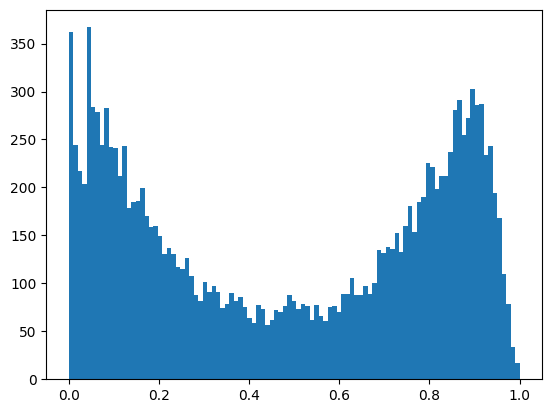

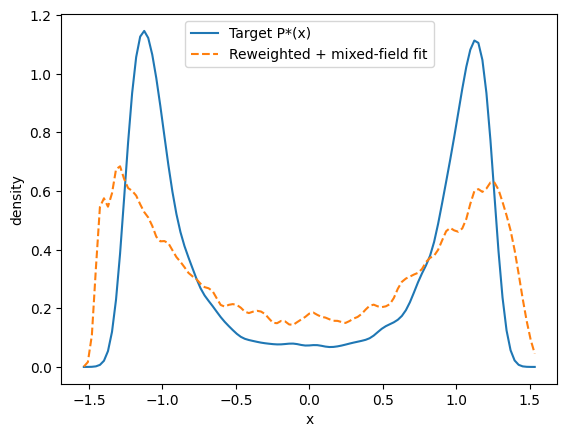

success: True
χ²*    : 0.28725136226510195
θ*     : (1.043817188546805, 3.9000000000000004, 6.2822541475960545, 1.0, 0.6934271908398028, 0.007240259422303939)

=== Step: target eps_sp=3.920 (prev=3.900) ===
[μ=6.282254] f=m_dense-m_dilute=+0.4988
[step] μ=6.286254 f=+0.4028
[step] μ=6.290254 f=+0.2946
[step] μ=6.294254 f=+0.1875
[step] μ=6.298254 f=+0.0786
[equal-ρ] μ0=6.298254, ΔA=A_dense-A_dilute=+0.0786, ESS≈15005
[equal-ρ] bracket μ=6.298354, ΔA=+0.0755, ESS≈15005
[equal-ρ] bracket μ=6.298454, ΔA=+0.0725, ESS≈15004
[equal-ρ] bracket μ=6.298554, ΔA=+0.0694, ESS≈15003
[equal-ρ] bracket μ=6.298654, ΔA=+0.0664, ESS≈15002
[equal-ρ] bracket μ=6.298754, ΔA=+0.0633, ESS≈15001
[equal-ρ] bracket μ=6.298854, ΔA=+0.0603, ESS≈14999
[equal-ρ] bracket μ=6.298954, ΔA=+0.0572, ESS≈14997
[equal-ρ] bracket μ=6.299054, ΔA=+0.0542, ESS≈14994
[equal-ρ] bracket μ=6.299154, ΔA=+0.0511, ESS≈14991
[equal-ρ] bracket μ=6.299254, ΔA=+0.0481, ESS≈14988
[equal-ρ] bracket μ=6.299354, ΔA=+0.0450, ESS≈14984
[equal-

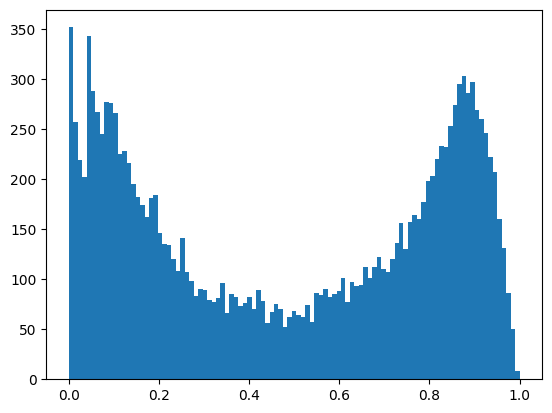

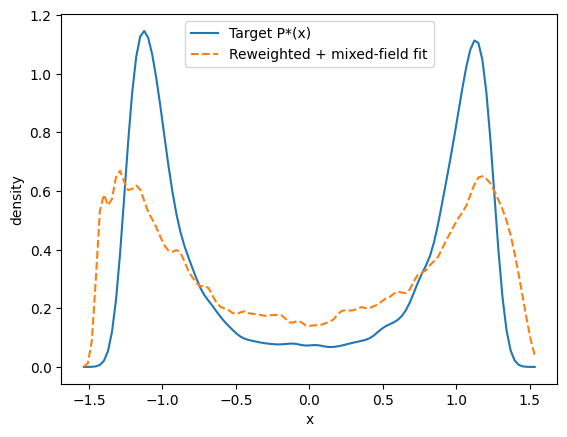

success: True
χ²*    : 0.2805889228528139
θ*     : (1.043817838329808, 3.9200000000000004, 6.300253497813049, 1.0, 0.7056382981885624, 0.011727485226836818)

=== Step: target eps_sp=3.940 (prev=3.920) ===
[μ=6.300253] f=m_dense-m_dilute=+0.4945
[step] μ=6.304253 f=+0.3979
[step] μ=6.308253 f=+0.2864
[step] μ=6.312253 f=+0.1801
[step] μ=6.316253 f=+0.0572
[equal-ρ] μ0=6.316253, ΔA=A_dense-A_dilute=+0.0572, ESS≈15005
[equal-ρ] bracket μ=6.316353, ΔA=+0.0541, ESS≈15005
[equal-ρ] bracket μ=6.316453, ΔA=+0.0510, ESS≈15004
[equal-ρ] bracket μ=6.316553, ΔA=+0.0479, ESS≈15003
[equal-ρ] bracket μ=6.316653, ΔA=+0.0449, ESS≈15002
[equal-ρ] bracket μ=6.316753, ΔA=+0.0418, ESS≈15001
[equal-ρ] bracket μ=6.316853, ΔA=+0.0387, ESS≈14999
[equal-ρ] bracket μ=6.316953, ΔA=+0.0356, ESS≈14997
[equal-ρ] bracket μ=6.317053, ΔA=+0.0325, ESS≈14994
[equal-ρ] bracket μ=6.317153, ΔA=+0.0294, ESS≈14991
[equal-ρ] bracket μ=6.317253, ΔA=+0.0263, ESS≈14988
[equal-ρ] bracket μ=6.317353, ΔA=+0.0233, ESS≈14984
[equal-ρ]

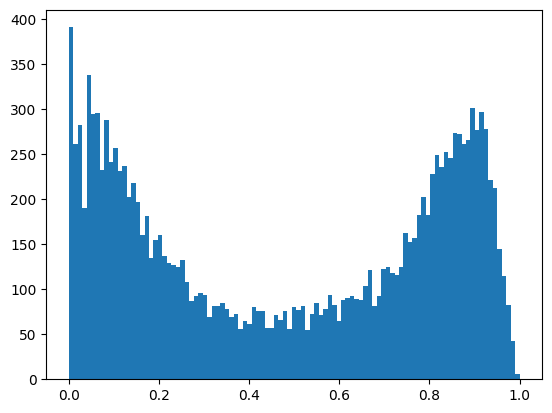

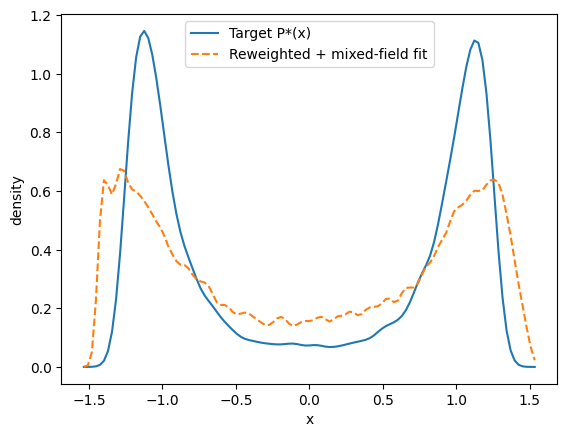

success: True
χ²*    : 0.2952325379792429
θ*     : (1.0439040944445193, 3.9400000000000004, 6.317829675165612, 1.0, 0.6856779593005301, 0.004276344383080874)

=== Step: target eps_sp=3.960 (prev=3.940) ===
[μ=6.317830] f=m_dense-m_dilute=+0.4930
[step] μ=6.321830 f=+0.4071
[step] μ=6.325830 f=+0.3013
[step] μ=6.329830 f=+0.1934
[step] μ=6.333830 f=+0.0544
[equal-ρ] μ0=6.333830, ΔA=A_dense-A_dilute=+0.0544, ESS≈15005
[equal-ρ] bracket μ=6.333930, ΔA=+0.0513, ESS≈15005
[equal-ρ] bracket μ=6.334030, ΔA=+0.0482, ESS≈15004
[equal-ρ] bracket μ=6.334130, ΔA=+0.0451, ESS≈15003
[equal-ρ] bracket μ=6.334230, ΔA=+0.0421, ESS≈15002
[equal-ρ] bracket μ=6.334330, ΔA=+0.0390, ESS≈15001
[equal-ρ] bracket μ=6.334430, ΔA=+0.0359, ESS≈14999
[equal-ρ] bracket μ=6.334530, ΔA=+0.0328, ESS≈14997
[equal-ρ] bracket μ=6.334630, ΔA=+0.0297, ESS≈14994
[equal-ρ] bracket μ=6.334730, ΔA=+0.0267, ESS≈14991
[equal-ρ] bracket μ=6.334830, ΔA=+0.0236, ESS≈14988
[equal-ρ] bracket μ=6.334930, ΔA=+0.0205, ESS≈14984
[equal-ρ

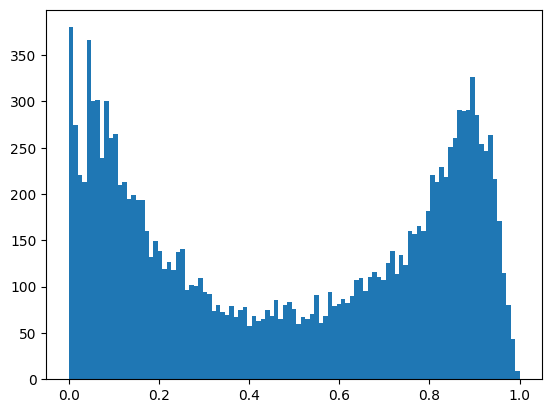

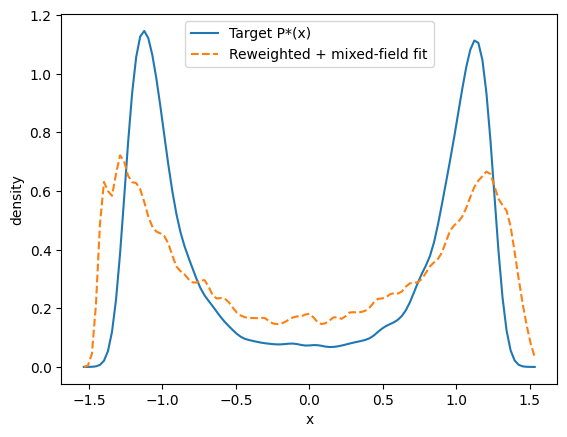

success: True
χ²*    : 0.27524435388646495
θ*     : (1.043905775910625, 3.9600000000000004, 6.335402956763654, 1.0, 0.7327574505285316, 0.02061043104651388)

=== Step: target eps_sp=3.980 (prev=3.960) ===
[μ=6.335403] f=m_dense-m_dilute=+0.5044
[step] μ=6.339403 f=+0.4057
[step] μ=6.343403 f=+0.3054
[step] μ=6.347403 f=+0.1795
[step] μ=6.351403 f=+0.0720
[equal-ρ] μ0=6.351403, ΔA=A_dense-A_dilute=+0.0720, ESS≈15005
[equal-ρ] bracket μ=6.351503, ΔA=+0.0689, ESS≈15005
[equal-ρ] bracket μ=6.351603, ΔA=+0.0659, ESS≈15004
[equal-ρ] bracket μ=6.351703, ΔA=+0.0628, ESS≈15003
[equal-ρ] bracket μ=6.351803, ΔA=+0.0597, ESS≈15002
[equal-ρ] bracket μ=6.351903, ΔA=+0.0566, ESS≈15001
[equal-ρ] bracket μ=6.352003, ΔA=+0.0535, ESS≈14999
[equal-ρ] bracket μ=6.352103, ΔA=+0.0504, ESS≈14996
[equal-ρ] bracket μ=6.352203, ΔA=+0.0473, ESS≈14994
[equal-ρ] bracket μ=6.352303, ΔA=+0.0442, ESS≈14991
[equal-ρ] bracket μ=6.352403, ΔA=+0.0411, ESS≈14988
[equal-ρ] bracket μ=6.352503, ΔA=+0.0379, ESS≈14984
[equal-ρ]

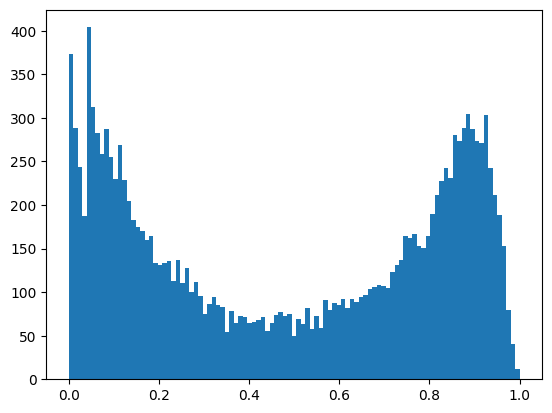

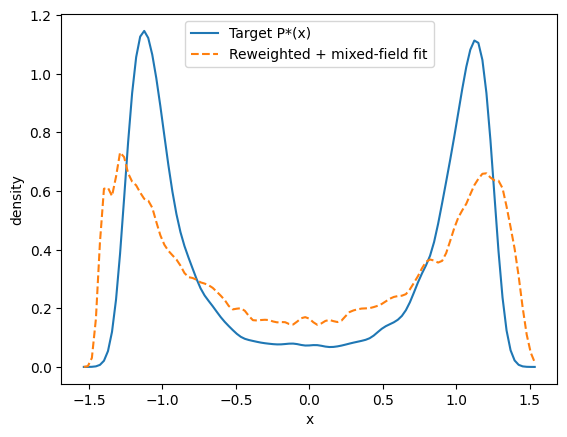

success: True
χ²*    : 0.29912003989050656
θ*     : (1.043907082987981, 3.9800000000000004, 6.353401627204117, 1.0, 0.6558037264629973, -0.006402917579483993)

=== Step: target eps_sp=4.000 (prev=3.980) ===
[μ=6.353402] f=m_dense-m_dilute=+0.4992
[step] μ=6.357402 f=+0.4135
[step] μ=6.361402 f=+0.2954
[step] μ=6.365402 f=+0.1878
[step] μ=6.369402 f=+0.0649
[equal-ρ] μ0=6.369402, ΔA=A_dense-A_dilute=+0.0649, ESS≈15005
[equal-ρ] bracket μ=6.369502, ΔA=+0.0618, ESS≈15005
[equal-ρ] bracket μ=6.369602, ΔA=+0.0587, ESS≈15004
[equal-ρ] bracket μ=6.369702, ΔA=+0.0555, ESS≈15003
[equal-ρ] bracket μ=6.369802, ΔA=+0.0524, ESS≈15002
[equal-ρ] bracket μ=6.369902, ΔA=+0.0493, ESS≈15001
[equal-ρ] bracket μ=6.370002, ΔA=+0.0462, ESS≈14999
[equal-ρ] bracket μ=6.370102, ΔA=+0.0430, ESS≈14996
[equal-ρ] bracket μ=6.370202, ΔA=+0.0399, ESS≈14994
[equal-ρ] bracket μ=6.370302, ΔA=+0.0368, ESS≈14991
[equal-ρ] bracket μ=6.370402, ΔA=+0.0336, ESS≈14987
[equal-ρ] bracket μ=6.370502, ΔA=+0.0305, ESS≈14984
[equal-

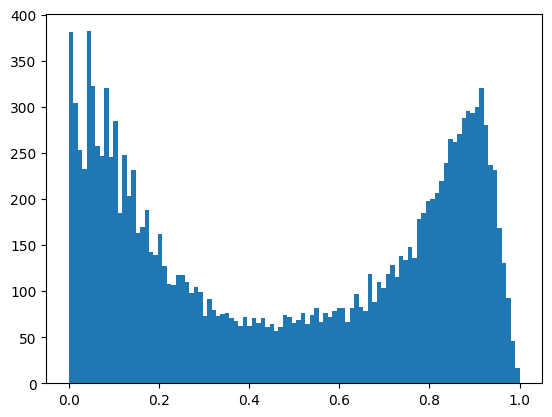

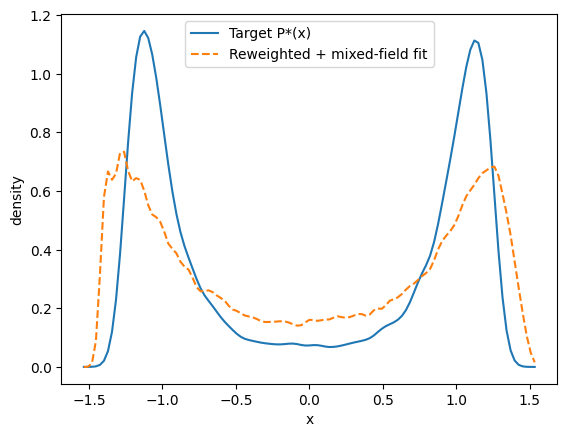

success: True
χ²*    : 0.28284200886538896
θ*     : (1.0239076933861486, 4.0, 6.351401627204115, 1.0, 0.6644257838408723, 0.0017045456406336492)

=== Step: target eps_sp=4.020 (prev=4.000) ===
[μ=6.351402] f=m_dense-m_dilute=+0.0014
[equal-ρ] μ0=6.351402, ΔA=A_dense-A_dilute=+0.0014, ESS≈15005
mu* = 6.351402   ESS ≈ 15005
0.4849723425524825


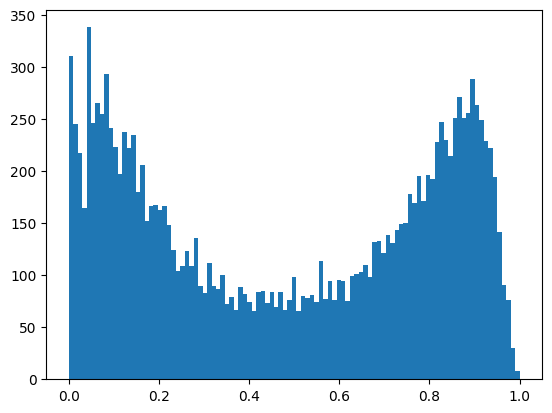

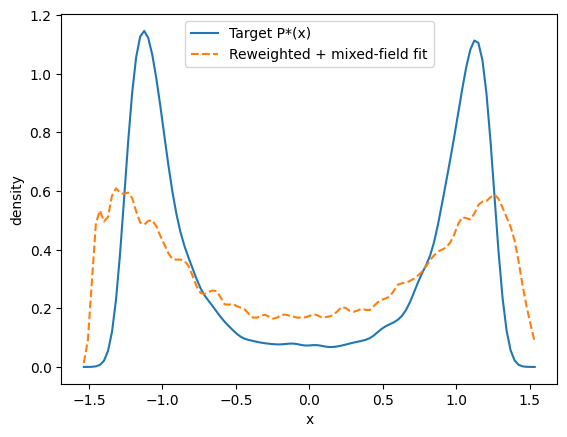

success: True
χ²*    : 0.26030200173046825
θ*     : (1.023912230360273, 4.0200000000000005, 6.351397086176884, 1.0, 0.7015262078770427, 0.013140122872887667)

=== Step: target eps_sp=4.040 (prev=4.020) ===
[μ=6.351397] f=m_dense-m_dilute=+0.4711
[step] μ=6.355397 f=+0.3594
[step] μ=6.359397 f=+0.2692
[step] μ=6.363397 f=+0.1528
[step] μ=6.367397 f=+0.0372
[equal-ρ] μ0=6.367397, ΔA=A_dense-A_dilute=+0.0372, ESS≈15005
[equal-ρ] bracket μ=6.367497, ΔA=+0.0342, ESS≈15005
[equal-ρ] bracket μ=6.367597, ΔA=+0.0312, ESS≈15004
[equal-ρ] bracket μ=6.367697, ΔA=+0.0282, ESS≈15004
[equal-ρ] bracket μ=6.367797, ΔA=+0.0252, ESS≈15002
[equal-ρ] bracket μ=6.367897, ΔA=+0.0222, ESS≈15001
[equal-ρ] bracket μ=6.367997, ΔA=+0.0191, ESS≈14999
[equal-ρ] bracket μ=6.368097, ΔA=+0.0161, ESS≈14997
[equal-ρ] bracket μ=6.368197, ΔA=+0.0131, ESS≈14994
[equal-ρ] bracket μ=6.368297, ΔA=+0.0101, ESS≈14992
[equal-ρ] bracket μ=6.368397, ΔA=+0.0071, ESS≈14988
[equal-ρ] bracket μ=6.368497, ΔA=+0.0041, ESS≈14985
[equal-ρ

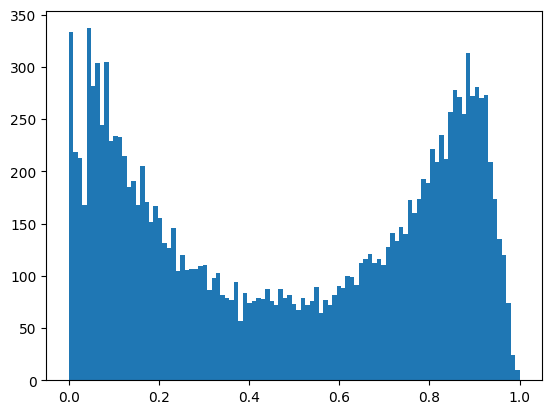

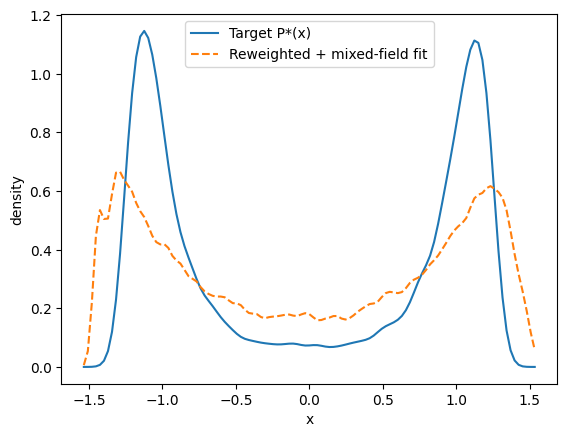

success: True
χ²*    : 0.26871689262960946
θ*     : (1.0239122555849771, 4.040000000000001, 6.3683720609521774, 1.0, 0.7035460198903296, 0.011856132522649915)

=== Step: target eps_sp=4.060 (prev=4.040) ===
[μ=6.368372] f=m_dense-m_dilute=+0.4774
[step] μ=6.372372 f=+0.3935
[step] μ=6.376372 f=+0.2835
[step] μ=6.380372 f=+0.1743
[step] μ=6.384372 f=+0.0439
[equal-ρ] μ0=6.384372, ΔA=A_dense-A_dilute=+0.0439, ESS≈15005
[equal-ρ] bracket μ=6.384472, ΔA=+0.0408, ESS≈15005
[equal-ρ] bracket μ=6.384572, ΔA=+0.0378, ESS≈15004
[equal-ρ] bracket μ=6.384672, ΔA=+0.0348, ESS≈15003
[equal-ρ] bracket μ=6.384772, ΔA=+0.0318, ESS≈15002
[equal-ρ] bracket μ=6.384872, ΔA=+0.0288, ESS≈15001
[equal-ρ] bracket μ=6.384972, ΔA=+0.0258, ESS≈14999
[equal-ρ] bracket μ=6.385072, ΔA=+0.0227, ESS≈14997
[equal-ρ] bracket μ=6.385172, ΔA=+0.0197, ESS≈14994
[equal-ρ] bracket μ=6.385272, ΔA=+0.0167, ESS≈14991
[equal-ρ] bracket μ=6.385372, ΔA=+0.0137, ESS≈14988
[equal-ρ] bracket μ=6.385472, ΔA=+0.0107, ESS≈14985
[equal-

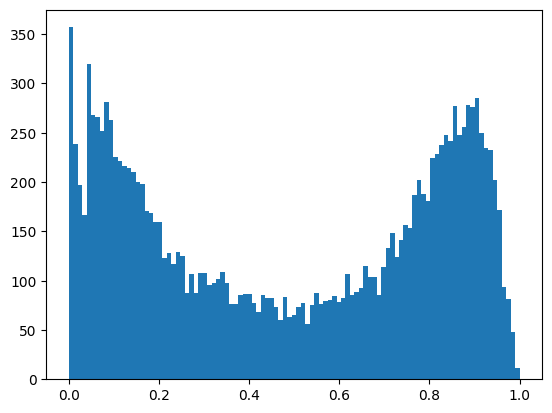

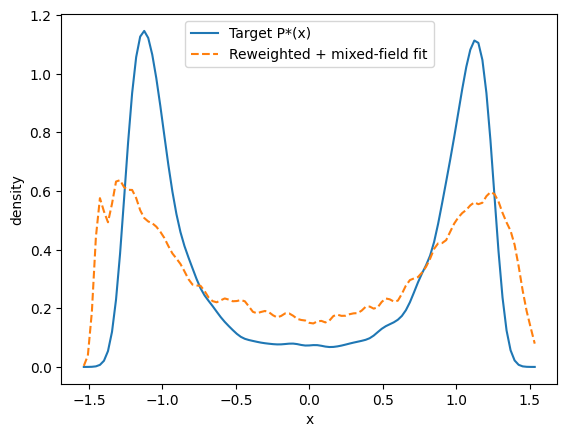

success: True
χ²*    : 0.2523758091545151
θ*     : (1.023912421955596, 4.0600000000000005, 6.385496894581557, 1.0, 0.7662445412028497, 0.032477029421285254)

=== Step: target eps_sp=4.080 (prev=4.060) ===
[μ=6.385497] f=m_dense-m_dilute=+0.4868
[step] μ=6.389497 f=+0.4215
[step] μ=6.393497 f=+0.3033
[step] μ=6.397497 f=+0.2036
[step] μ=6.401497 f=+0.0602
[equal-ρ] μ0=6.401497, ΔA=A_dense-A_dilute=+0.0602, ESS≈15005
[equal-ρ] bracket μ=6.401597, ΔA=+0.0571, ESS≈15005
[equal-ρ] bracket μ=6.401697, ΔA=+0.0541, ESS≈15004
[equal-ρ] bracket μ=6.401797, ΔA=+0.0511, ESS≈15003
[equal-ρ] bracket μ=6.401897, ΔA=+0.0480, ESS≈15002
[equal-ρ] bracket μ=6.401997, ΔA=+0.0450, ESS≈15001
[equal-ρ] bracket μ=6.402097, ΔA=+0.0420, ESS≈14999
[equal-ρ] bracket μ=6.402197, ΔA=+0.0389, ESS≈14997
[equal-ρ] bracket μ=6.402297, ΔA=+0.0359, ESS≈14994
[equal-ρ] bracket μ=6.402397, ΔA=+0.0328, ESS≈14991
[equal-ρ] bracket μ=6.402497, ΔA=+0.0298, ESS≈14988
[equal-ρ] bracket μ=6.402597, ΔA=+0.0267, ESS≈14984
[equal-ρ]

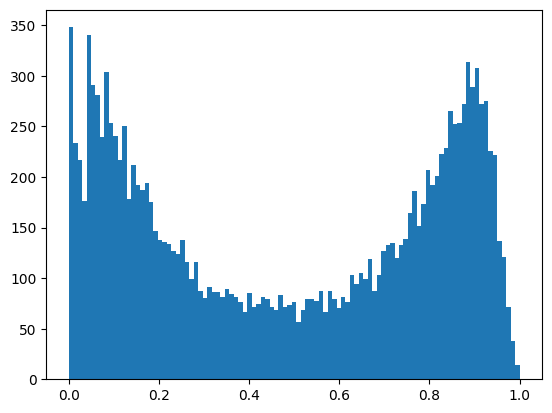

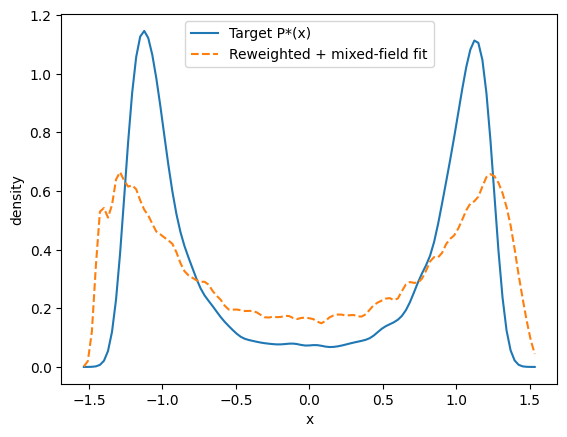

success: True
χ²*    : 0.2865184788408171
θ*     : (1.0239400746665122, 4.08, 6.403219142360656, 1.0, 0.684826650500579, 0.004267652964806335)

=== Step: target eps_sp=4.100 (prev=4.080) ===
[μ=6.403219] f=m_dense-m_dilute=+0.5088
[step] μ=6.407219 f=+0.4045
[step] μ=6.411219 f=+0.2984
[step] μ=6.415219 f=+0.2065
[step] μ=6.419219 f=+0.0882
[equal-ρ] μ0=6.419219, ΔA=A_dense-A_dilute=+0.0882, ESS≈15005
[equal-ρ] bracket μ=6.419319, ΔA=+0.0852, ESS≈15005
[equal-ρ] bracket μ=6.419419, ΔA=+0.0823, ESS≈15004
[equal-ρ] bracket μ=6.419519, ΔA=+0.0793, ESS≈15003
[equal-ρ] bracket μ=6.419619, ΔA=+0.0763, ESS≈15002
[equal-ρ] bracket μ=6.419719, ΔA=+0.0733, ESS≈15001
[equal-ρ] bracket μ=6.419819, ΔA=+0.0703, ESS≈14999
[equal-ρ] bracket μ=6.419919, ΔA=+0.0673, ESS≈14997
[equal-ρ] bracket μ=6.420019, ΔA=+0.0643, ESS≈14994
[equal-ρ] bracket μ=6.420119, ΔA=+0.0612, ESS≈14991
[equal-ρ] bracket μ=6.420219, ΔA=+0.0582, ESS≈14988
[equal-ρ] bracket μ=6.420319, ΔA=+0.0552, ESS≈14985
[equal-ρ] bracket μ=6.4

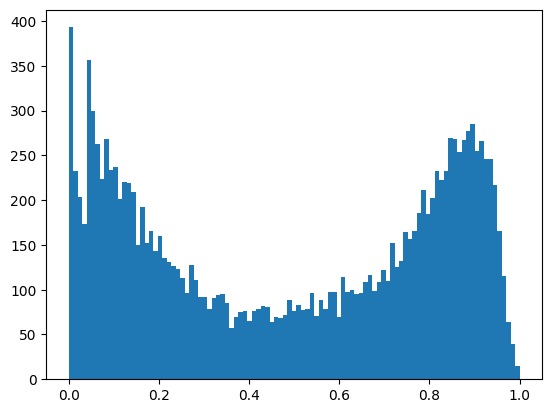

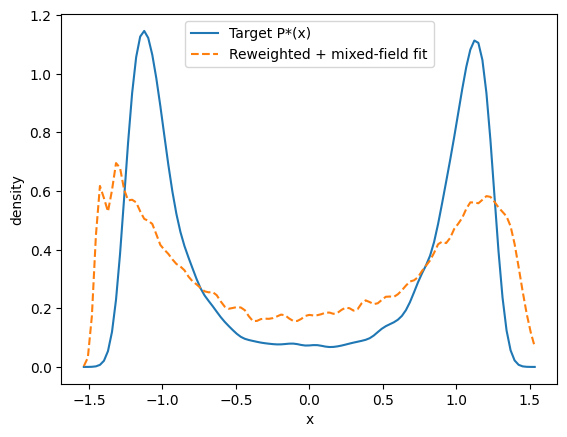

success: False
χ²*    : 0.254983096522286
θ*     : (1.0239400746665122, 4.1000000000000005, 6.421219142360654, 1.0, 0.8176698038760093, 0.04842209148979564)

=== Step: target eps_sp=4.120 (prev=4.100) ===
[μ=6.421219] f=m_dense-m_dilute=+0.5017
[step] μ=6.425219 f=+0.4245
[step] μ=6.429219 f=+0.3090
[step] μ=6.433219 f=+0.1913
[step] μ=6.437219 f=+0.0769
[equal-ρ] μ0=6.437219, ΔA=A_dense-A_dilute=+0.0769, ESS≈15005
[equal-ρ] bracket μ=6.437319, ΔA=+0.0739, ESS≈15005
[equal-ρ] bracket μ=6.437419, ΔA=+0.0708, ESS≈15004
[equal-ρ] bracket μ=6.437519, ΔA=+0.0678, ESS≈15003
[equal-ρ] bracket μ=6.437619, ΔA=+0.0647, ESS≈15002
[equal-ρ] bracket μ=6.437719, ΔA=+0.0617, ESS≈15001
[equal-ρ] bracket μ=6.437819, ΔA=+0.0586, ESS≈14999
[equal-ρ] bracket μ=6.437919, ΔA=+0.0556, ESS≈14997
[equal-ρ] bracket μ=6.438019, ΔA=+0.0525, ESS≈14994
[equal-ρ] bracket μ=6.438119, ΔA=+0.0495, ESS≈14991
[equal-ρ] bracket μ=6.438219, ΔA=+0.0464, ESS≈14988
[equal-ρ] bracket μ=6.438319, ΔA=+0.0434, ESS≈14984
[equal-ρ]

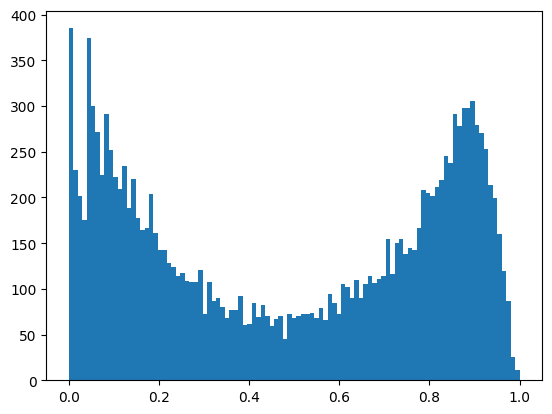

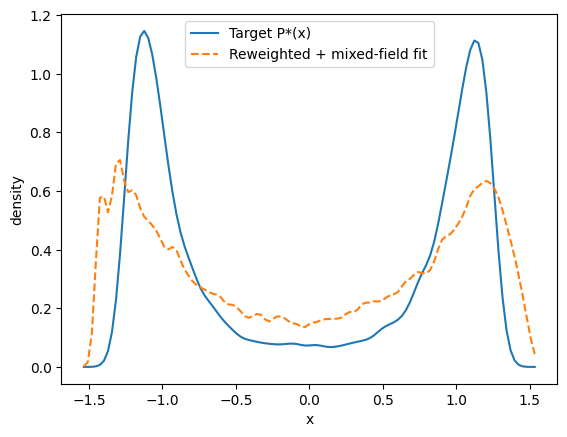

success: True
χ²*    : 0.2664023864286319
θ*     : (1.0239479319345872, 4.120000000000001, 6.439211263442697, 1.0, 0.7983272802846487, 0.04118816387960798)

=== Step: target eps_sp=4.140 (prev=4.120) ===
[μ=6.439211] f=m_dense-m_dilute=+0.5020
[step] μ=6.443211 f=+0.4247
[step] μ=6.447211 f=+0.3412
[step] μ=6.451211 f=+0.1823
[step] μ=6.455211 f=+0.0970
[equal-ρ] μ0=6.455211, ΔA=A_dense-A_dilute=+0.0970, ESS≈15005
[equal-ρ] bracket μ=6.455311, ΔA=+0.0939, ESS≈15005
[equal-ρ] bracket μ=6.455411, ΔA=+0.0909, ESS≈15004
[equal-ρ] bracket μ=6.455511, ΔA=+0.0878, ESS≈15003
[equal-ρ] bracket μ=6.455611, ΔA=+0.0848, ESS≈15002
[equal-ρ] bracket μ=6.455711, ΔA=+0.0817, ESS≈15001
[equal-ρ] bracket μ=6.455811, ΔA=+0.0787, ESS≈14999
[equal-ρ] bracket μ=6.455911, ΔA=+0.0756, ESS≈14997
[equal-ρ] bracket μ=6.456011, ΔA=+0.0726, ESS≈14994
[equal-ρ] bracket μ=6.456111, ΔA=+0.0695, ESS≈14991
[equal-ρ] bracket μ=6.456211, ΔA=+0.0664, ESS≈14988
[equal-ρ] bracket μ=6.456311, ΔA=+0.0634, ESS≈14984
[equal-ρ] 

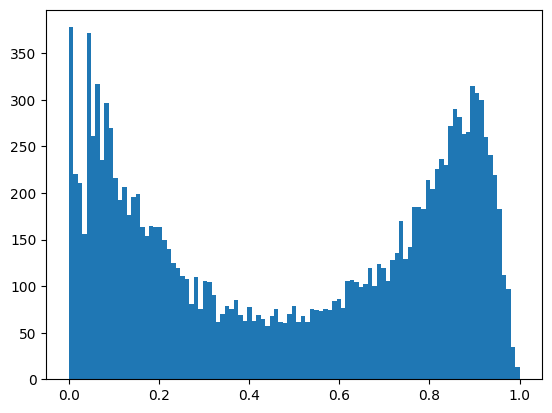

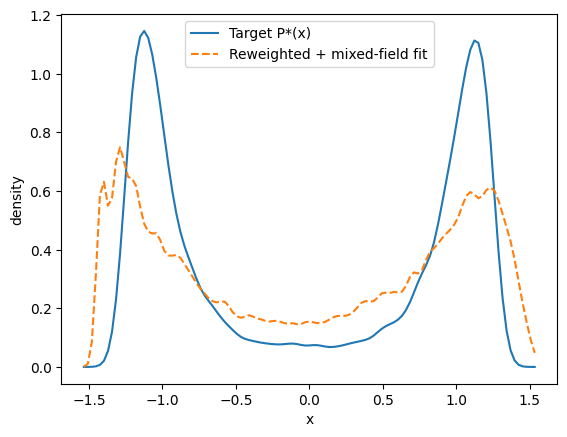

success: False
χ²*    : 0.2668795890817196
θ*     : (1.0239479319345872, 4.140000000000001, 6.457211263442695, 1.0, 0.9840825744566218, 0.09848350061722114)

=== Step: target eps_sp=4.160 (prev=4.140) ===
[μ=6.457211] f=m_dense-m_dilute=+0.4962
[step] μ=6.461211 f=+0.3981
[step] μ=6.465211 f=+0.3185
[step] μ=6.469211 f=+0.2001
[step] μ=6.473211 f=+0.0850
[equal-ρ] μ0=6.473211, ΔA=A_dense-A_dilute=+0.0850, ESS≈15005
[equal-ρ] bracket μ=6.473311, ΔA=+0.0820, ESS≈15005
[equal-ρ] bracket μ=6.473411, ΔA=+0.0790, ESS≈15004
[equal-ρ] bracket μ=6.473511, ΔA=+0.0759, ESS≈15003
[equal-ρ] bracket μ=6.473611, ΔA=+0.0729, ESS≈15002
[equal-ρ] bracket μ=6.473711, ΔA=+0.0698, ESS≈15001
[equal-ρ] bracket μ=6.473811, ΔA=+0.0668, ESS≈14999
[equal-ρ] bracket μ=6.473911, ΔA=+0.0637, ESS≈14997
[equal-ρ] bracket μ=6.474011, ΔA=+0.0607, ESS≈14994
[equal-ρ] bracket μ=6.474111, ΔA=+0.0576, ESS≈14991
[equal-ρ] bracket μ=6.474211, ΔA=+0.0545, ESS≈14988
[equal-ρ] bracket μ=6.474311, ΔA=+0.0515, ESS≈14984
[equal-ρ]

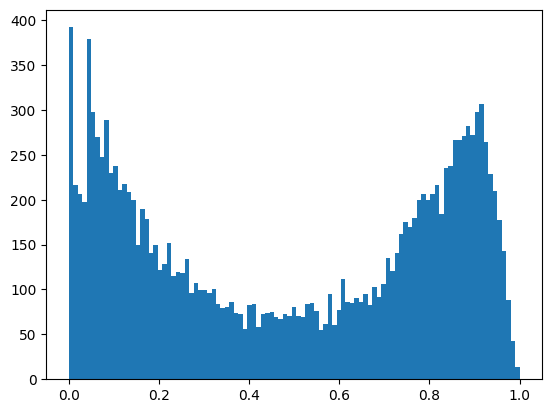

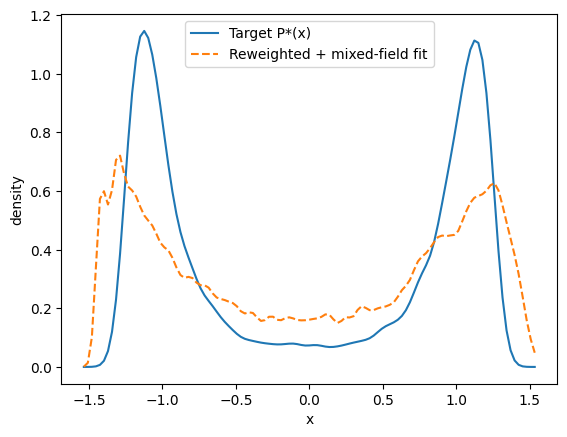

success: True
χ²*    : 0.2645884083330128
θ*     : (1.0239480234790554, 4.16, 6.475211171898225, 1.0, 0.8236011326712984, 0.04751825701105283)

=== Step: target eps_sp=4.180 (prev=4.160) ===
[μ=6.475211] f=m_dense-m_dilute=+0.5212
[step] μ=6.479211 f=+0.4018
[step] μ=6.483211 f=+0.3018
[step] μ=6.487211 f=+0.1820
[step] μ=6.491211 f=+0.0774
[equal-ρ] μ0=6.491211, ΔA=A_dense-A_dilute=+0.0774, ESS≈15005
[equal-ρ] bracket μ=6.491311, ΔA=+0.0743, ESS≈15005
[equal-ρ] bracket μ=6.491411, ΔA=+0.0712, ESS≈15004
[equal-ρ] bracket μ=6.491511, ΔA=+0.0682, ESS≈15003
[equal-ρ] bracket μ=6.491611, ΔA=+0.0651, ESS≈15002
[equal-ρ] bracket μ=6.491711, ΔA=+0.0620, ESS≈15001
[equal-ρ] bracket μ=6.491811, ΔA=+0.0589, ESS≈14999
[equal-ρ] bracket μ=6.491911, ΔA=+0.0558, ESS≈14997
[equal-ρ] bracket μ=6.492011, ΔA=+0.0528, ESS≈14994
[equal-ρ] bracket μ=6.492111, ΔA=+0.0497, ESS≈14991
[equal-ρ] bracket μ=6.492211, ΔA=+0.0466, ESS≈14988
[equal-ρ] bracket μ=6.492311, ΔA=+0.0435, ESS≈14984
[equal-ρ] bracket μ=6.4

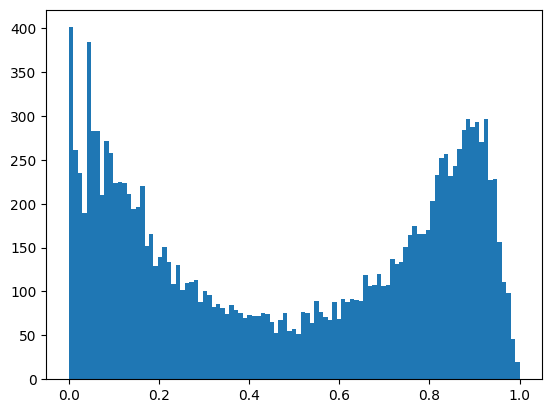

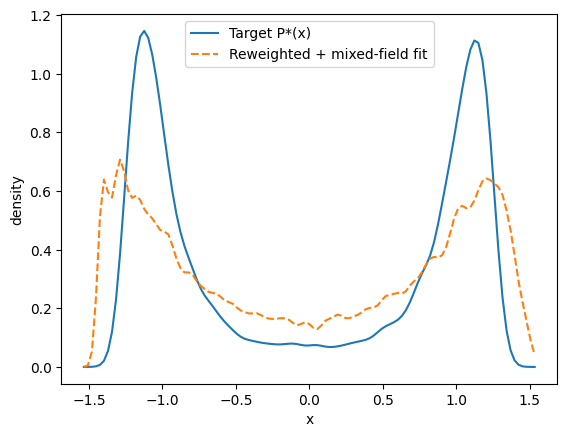

success: True
χ²*    : 0.2827048425393335
θ*     : (1.0239481231384089, 4.180000000000001, 6.49321107223887, 1.0, 0.713869938603952, 0.012222131239921136)

=== Step: target eps_sp=4.200 (prev=4.180) ===
[μ=6.493211] f=m_dense-m_dilute=+0.5136


SystemError: CPUDispatcher(<function _mc_lattice_single_site_numba at 0x11785b880>) returned a result with an exception set

In [8]:
main(1.1044377256249835, 3.68, 6.193372103811167)

[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=4.180 (prev=4.180) ===
[μ=6.665361] f=m_dense-m_dilute=-0.0011
[equal-ρ] μ0=6.665361, ΔA=A_dense-A_dilute=-0.0011, ESS≈7505
mu* = 6.665361   ESS ≈ 7505
0.4848074616922051


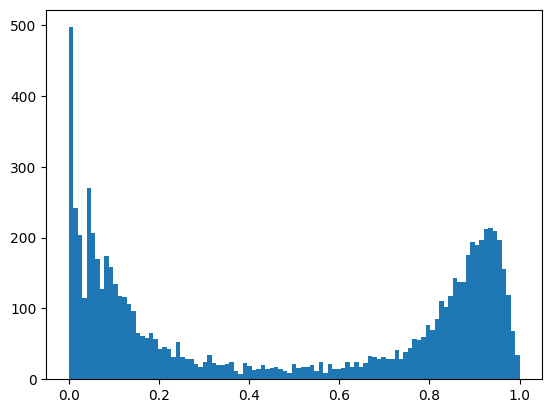

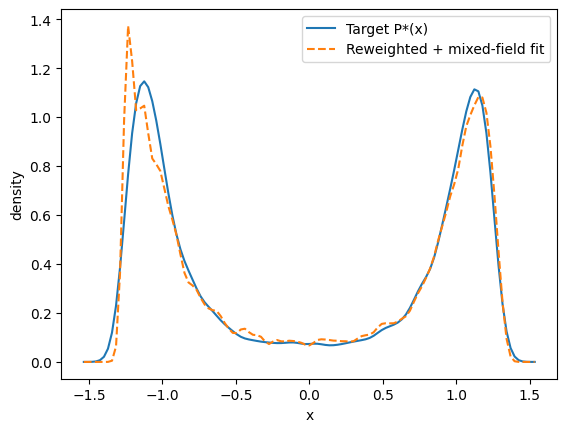

success: True
χ²*    : 0.02496629663966308
θ*     : (1.1037719401254222, 4.180000000000001, 6.665537121424699, 0.9999999999994951, 0.4834571677306171, -0.0029786230047351395)

=== Step: target eps_sp=4.200 (prev=4.180) ===
[μ=6.665537] f=m_dense-m_dilute=+0.0148
[equal-ρ] μ0=6.665537, ΔA=A_dense-A_dilute=+0.0148, ESS≈7505
[equal-ρ] bracket μ=6.665637, ΔA=+0.0111, ESS≈7505
[equal-ρ] bracket μ=6.665737, ΔA=+0.0074, ESS≈7505
[equal-ρ] bracket μ=6.665837, ΔA=+0.0037, ESS≈7504
[equal-ρ] bracket μ=6.665937, ΔA=+0.0001, ESS≈7503
[equal-ρ] bracket μ=6.666037, ΔA=-0.0036, ESS≈7502
[equal-ρ] bisect μ=6.665787, ΔA=+0.0056, ESS≈7504
mu* = 6.665787   ESS ≈ 7504
0.48760959360426387


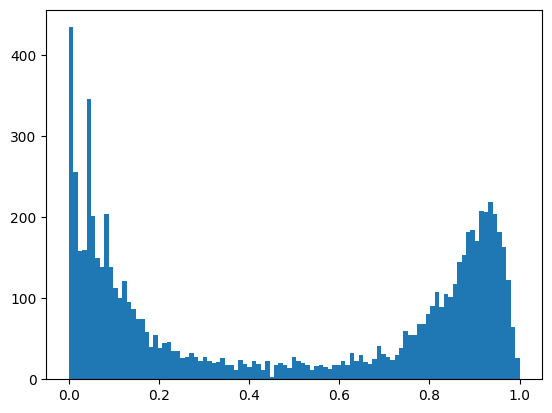

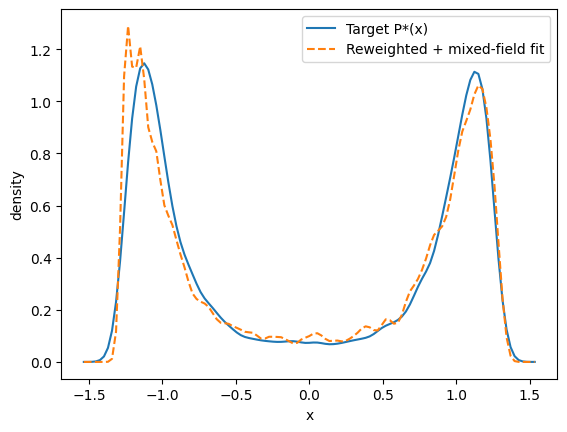

success: True
χ²*    : 0.04185658777122818
θ*     : (1.0942408259318765, 4.2, 6.6753186493686965, 1.0000000000016174, 0.5243828876699251, 0.006245142276633597)

=== Step: target eps_sp=4.220 (prev=4.200) ===
[μ=6.675319] f=m_dense-m_dilute=-0.3799
[step] μ=6.671319 f=-0.2185
[step] μ=6.667319 f=-0.0841
[equal-ρ] μ0=6.667319, ΔA=A_dense-A_dilute=-0.0841, ESS≈7505
[equal-ρ] bracket μ=6.667219, ΔA=-0.0804, ESS≈7505
[equal-ρ] bracket μ=6.667119, ΔA=-0.0768, ESS≈7505
[equal-ρ] bracket μ=6.667019, ΔA=-0.0732, ESS≈7504
[equal-ρ] bracket μ=6.666919, ΔA=-0.0695, ESS≈7503
[equal-ρ] bracket μ=6.666819, ΔA=-0.0659, ESS≈7502
[equal-ρ] bracket μ=6.666719, ΔA=-0.0622, ESS≈7501
[equal-ρ] bracket μ=6.666619, ΔA=-0.0586, ESS≈7500
[equal-ρ] bracket μ=6.666519, ΔA=-0.0549, ESS≈7498
[equal-ρ] bracket μ=6.666419, ΔA=-0.0513, ESS≈7496
[equal-ρ] bracket μ=6.666319, ΔA=-0.0476, ESS≈7494
[equal-ρ] bracket μ=6.666219, ΔA=-0.0440, ESS≈7492
[equal-ρ] bracket μ=6.666119, ΔA=-0.0403, ESS≈7489
[equal-ρ] bracket μ=6.6

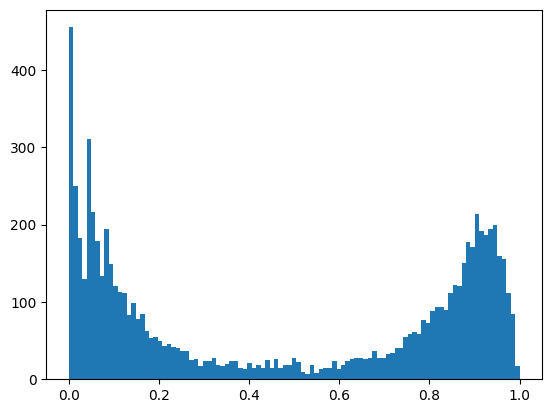

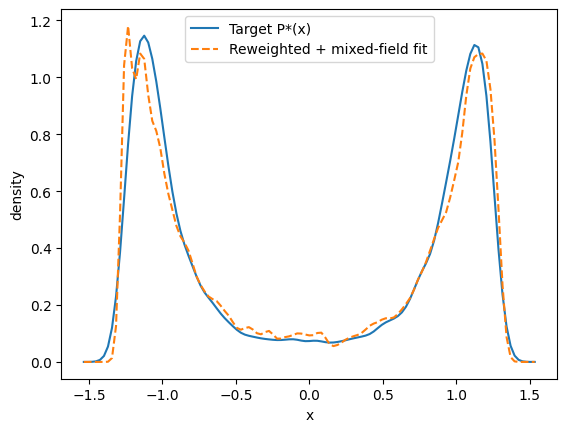

success: True
χ²*    : 0.02984130397507022
θ*     : (1.085141806382482, 4.22, 6.674864054798606, 0.999999999993827, 0.3905680728704513, -0.04465326311853297)

=== Step: target eps_sp=4.240 (prev=4.220) ===
[μ=6.674864] f=m_dense-m_dilute=-0.3415
[step] μ=6.670864 f=-0.2266
[step] μ=6.666864 f=-0.0216
[equal-ρ] μ0=6.666864, ΔA=A_dense-A_dilute=-0.0216, ESS≈7505
[equal-ρ] bracket μ=6.666764, ΔA=-0.0180, ESS≈7505
[equal-ρ] bracket μ=6.666664, ΔA=-0.0144, ESS≈7505
[equal-ρ] bracket μ=6.666564, ΔA=-0.0107, ESS≈7504
[equal-ρ] bracket μ=6.666464, ΔA=-0.0071, ESS≈7503
[equal-ρ] bracket μ=6.666364, ΔA=-0.0035, ESS≈7502
[equal-ρ] bracket μ=6.666264, ΔA=+0.0001, ESS≈7501
[equal-ρ] bisect μ=6.666564, ΔA=-0.0107, ESS≈7504
[equal-ρ] bisect μ=6.666414, ΔA=-0.0053, ESS≈7503
mu* = 6.666414   ESS ≈ 7503
0.4834177215189873


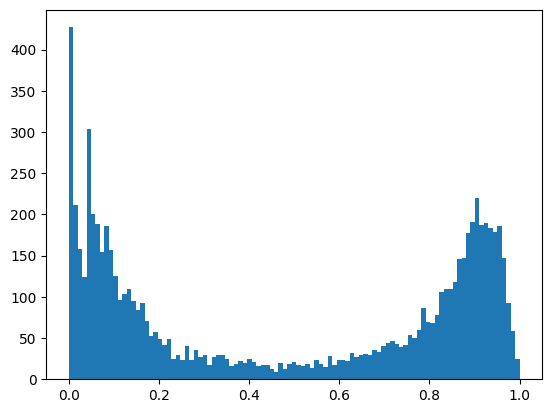

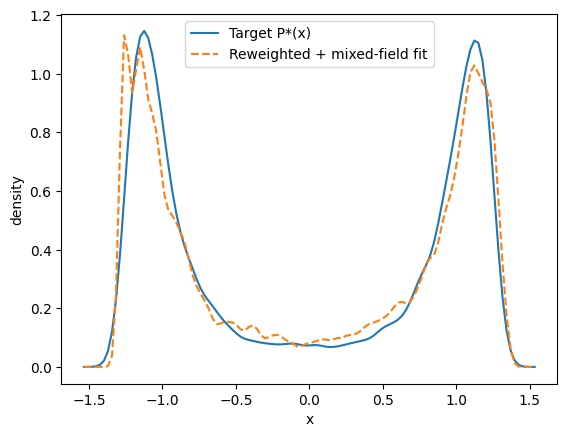

success: False
χ²*    : 0.026528691673871965
θ*     : (1.0765689186643181, 4.239999999999999, 6.674986942516769, 0.9999999999967614, 0.4479871203378571, -0.01204050715340722)

=== Step: target eps_sp=4.260 (prev=4.240) ===
[μ=6.674987] f=m_dense-m_dilute=-0.2889
[step] μ=6.670987 f=-0.1699
[step] μ=6.666987 f=-0.0217
[equal-ρ] μ0=6.666987, ΔA=A_dense-A_dilute=-0.0217, ESS≈7505
[equal-ρ] bracket μ=6.666887, ΔA=-0.0182, ESS≈7505
[equal-ρ] bracket μ=6.666787, ΔA=-0.0146, ESS≈7505
[equal-ρ] bracket μ=6.666687, ΔA=-0.0110, ESS≈7504
[equal-ρ] bracket μ=6.666587, ΔA=-0.0075, ESS≈7503
[equal-ρ] bracket μ=6.666487, ΔA=-0.0039, ESS≈7502
[equal-ρ] bracket μ=6.666387, ΔA=-0.0003, ESS≈7501
[equal-ρ] bracket μ=6.666287, ΔA=+0.0032, ESS≈7500
[equal-ρ] bisect μ=6.666637, ΔA=-0.0092, ESS≈7504
mu* = 6.666637   ESS ≈ 7504
0.4806835443037975


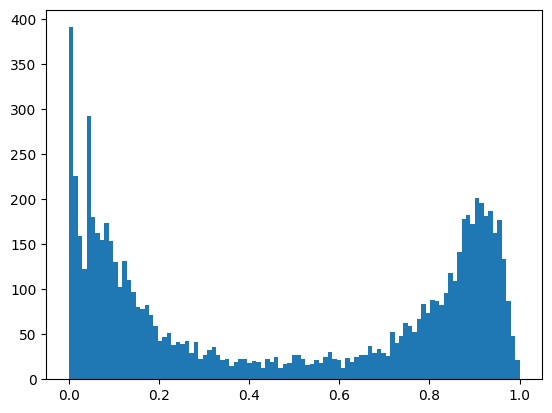

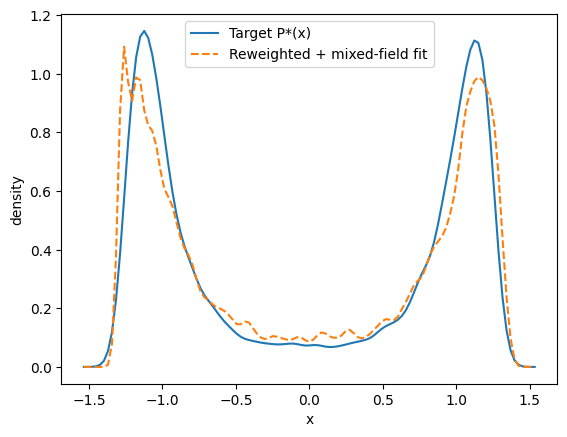

success: True
χ²*    : 0.03628710728167255
θ*     : (1.0675447594608567, 4.259999999999999, 6.677186234404021, 0.9999999999943135, 0.45450376730137143, -0.02219771827421054)

=== Step: target eps_sp=4.280 (prev=4.260) ===
[μ=6.677186] f=m_dense-m_dilute=-0.3197
[step] μ=6.673186 f=-0.2024
[step] μ=6.669186 f=-0.0616
[equal-ρ] μ0=6.669186, ΔA=A_dense-A_dilute=-0.0616, ESS≈7505
[equal-ρ] bracket μ=6.669086, ΔA=-0.0581, ESS≈7505
[equal-ρ] bracket μ=6.668986, ΔA=-0.0546, ESS≈7505
[equal-ρ] bracket μ=6.668886, ΔA=-0.0511, ESS≈7504
[equal-ρ] bracket μ=6.668786, ΔA=-0.0477, ESS≈7503
[equal-ρ] bracket μ=6.668686, ΔA=-0.0442, ESS≈7502
[equal-ρ] bracket μ=6.668586, ΔA=-0.0407, ESS≈7501
[equal-ρ] bracket μ=6.668486, ΔA=-0.0372, ESS≈7500
[equal-ρ] bracket μ=6.668386, ΔA=-0.0337, ESS≈7498
[equal-ρ] bracket μ=6.668286, ΔA=-0.0302, ESS≈7497
[equal-ρ] bracket μ=6.668186, ΔA=-0.0268, ESS≈7495
[equal-ρ] bracket μ=6.668086, ΔA=-0.0233, ESS≈7492
[equal-ρ] bracket μ=6.667986, ΔA=-0.0198, ESS≈7490
[equal-ρ]

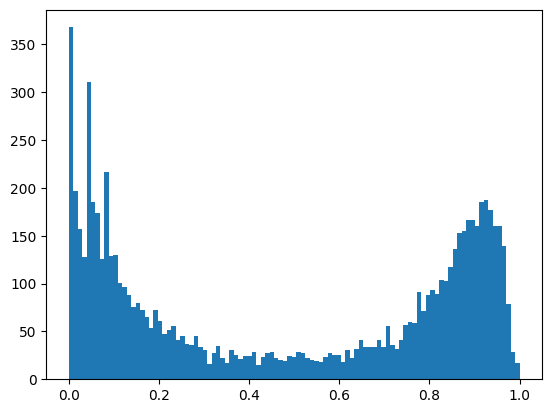

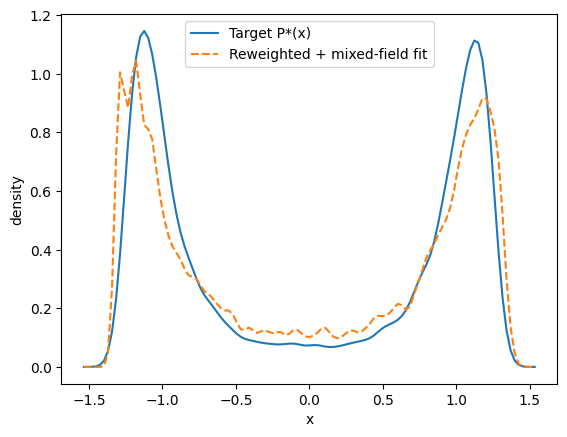

success: True
χ²*    : 0.02505698058668593
θ*     : (1.0614538077812934, 4.2799999999999985, 6.680310136225551, 0.9999999999902313, 0.4555789059982774, -0.01706443913298449)

=== Step: target eps_sp=4.300 (prev=4.280) ===
[μ=6.680310] f=m_dense-m_dilute=-0.2156
[step] μ=6.676310 f=-0.1079
[step] μ=6.672310 f=+0.0444
[equal-ρ] μ0=6.672310, ΔA=A_dense-A_dilute=+0.0444, ESS≈7505
[equal-ρ] bracket μ=6.672410, ΔA=+0.0409, ESS≈7505
[equal-ρ] bracket μ=6.672510, ΔA=+0.0374, ESS≈7505
[equal-ρ] bracket μ=6.672610, ΔA=+0.0340, ESS≈7504
[equal-ρ] bracket μ=6.672710, ΔA=+0.0305, ESS≈7503
[equal-ρ] bracket μ=6.672810, ΔA=+0.0270, ESS≈7502
[equal-ρ] bracket μ=6.672910, ΔA=+0.0235, ESS≈7501
[equal-ρ] bracket μ=6.673010, ΔA=+0.0201, ESS≈7500
[equal-ρ] bracket μ=6.673110, ΔA=+0.0166, ESS≈7498
[equal-ρ] bracket μ=6.673210, ΔA=+0.0131, ESS≈7497
[equal-ρ] bracket μ=6.673310, ΔA=+0.0097, ESS≈7495
[equal-ρ] bracket μ=6.673410, ΔA=+0.0062, ESS≈7493
[equal-ρ] bracket μ=6.673510, ΔA=+0.0027, ESS≈7490
[equal-ρ]

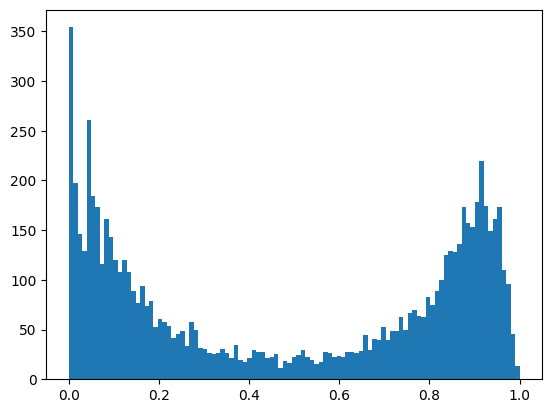

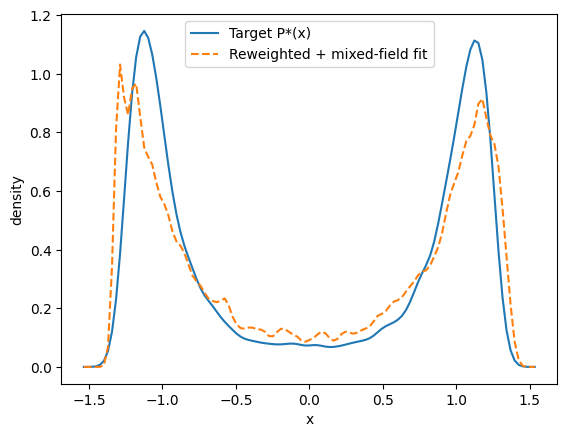

success: True
χ²*    : 0.0902303545494979
θ*     : (1.0593785311543122, 4.299999999999998, 6.693447636225551, 1.0000000000068405, 0.563739369583561, 0.008819667072470878)

=== Step: target eps_sp=4.320 (prev=4.300) ===
[μ=6.693448] f=m_dense-m_dilute=-0.2107
[step] μ=6.689448 f=-0.0517
[equal-ρ] μ0=6.689448, ΔA=A_dense-A_dilute=-0.0517, ESS≈7505
[equal-ρ] bracket μ=6.689348, ΔA=-0.0482, ESS≈7505
[equal-ρ] bracket μ=6.689248, ΔA=-0.0448, ESS≈7505
[equal-ρ] bracket μ=6.689148, ΔA=-0.0413, ESS≈7504
[equal-ρ] bracket μ=6.689048, ΔA=-0.0379, ESS≈7503
[equal-ρ] bracket μ=6.688948, ΔA=-0.0344, ESS≈7502
[equal-ρ] bracket μ=6.688848, ΔA=-0.0310, ESS≈7501
[equal-ρ] bracket μ=6.688748, ΔA=-0.0275, ESS≈7500
[equal-ρ] bracket μ=6.688648, ΔA=-0.0241, ESS≈7498
[equal-ρ] bracket μ=6.688548, ΔA=-0.0206, ESS≈7497
[equal-ρ] bracket μ=6.688448, ΔA=-0.0171, ESS≈7495
[equal-ρ] bracket μ=6.688348, ΔA=-0.0137, ESS≈7493
[equal-ρ] bracket μ=6.688248, ΔA=-0.0102, ESS≈7490
[equal-ρ] bracket μ=6.688148, ΔA=-0.0068

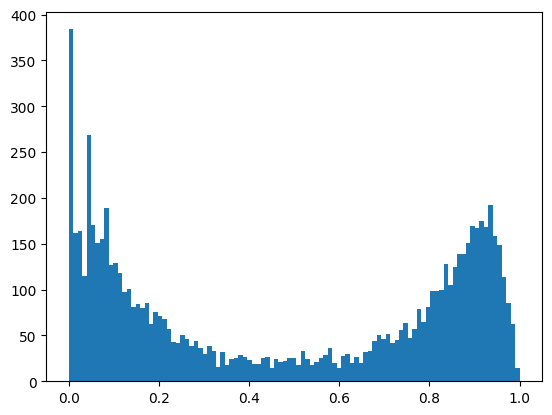

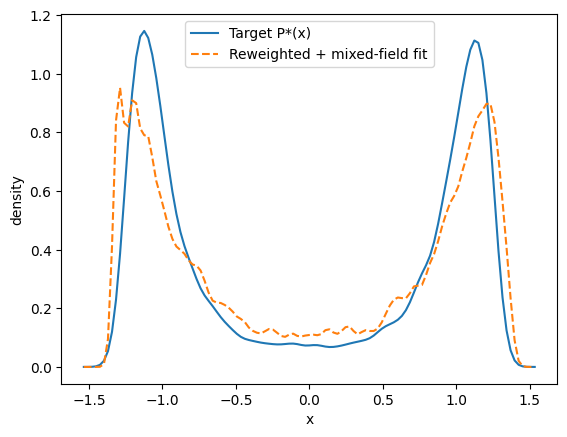

success: True
χ²*    : 0.0994525243579239
θ*     : (1.0572780973333467, 4.319999999999998, 6.700107507771789, 0.9999999999794913, 0.37815257147038217, -0.02463987293860876)

=== Step: target eps_sp=4.340 (prev=4.320) ===
[μ=6.700108] f=m_dense-m_dilute=+0.0689
[equal-ρ] μ0=6.700108, ΔA=A_dense-A_dilute=+0.0689, ESS≈7505
[equal-ρ] bracket μ=6.700208, ΔA=+0.0655, ESS≈7505
[equal-ρ] bracket μ=6.700308, ΔA=+0.0620, ESS≈7505
[equal-ρ] bracket μ=6.700408, ΔA=+0.0586, ESS≈7504
[equal-ρ] bracket μ=6.700508, ΔA=+0.0552, ESS≈7503
[equal-ρ] bracket μ=6.700608, ΔA=+0.0518, ESS≈7502
[equal-ρ] bracket μ=6.700708, ΔA=+0.0483, ESS≈7501
[equal-ρ] bracket μ=6.700808, ΔA=+0.0449, ESS≈7500
[equal-ρ] bracket μ=6.700908, ΔA=+0.0415, ESS≈7498
[equal-ρ] bracket μ=6.701008, ΔA=+0.0380, ESS≈7497
[equal-ρ] bracket μ=6.701108, ΔA=+0.0346, ESS≈7495
[equal-ρ] bracket μ=6.701208, ΔA=+0.0312, ESS≈7493
[equal-ρ] bracket μ=6.701308, ΔA=+0.0277, ESS≈7490
[equal-ρ] bracket μ=6.701408, ΔA=+0.0243, ESS≈7488
[equal-ρ] brack

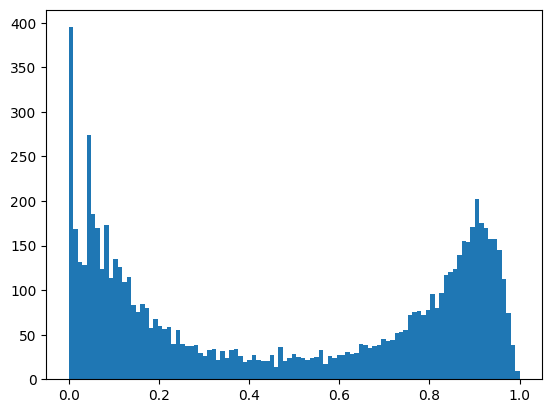

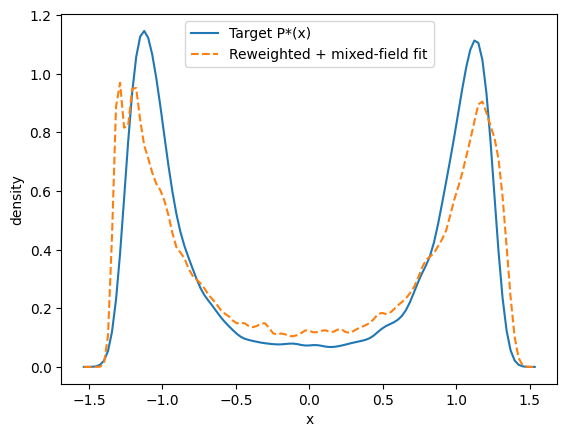

success: True
χ²*    : 0.13741462205192512
θ*     : (1.045576593267688, 4.339999999999997, 6.713809011837447, 0.9999999999894128, 0.5210307104219476, -0.013917250469077882)

=== Step: target eps_sp=4.360 (prev=4.340) ===
[μ=6.713809] f=m_dense-m_dilute=-0.5075
[step] μ=6.709809 f=-0.3956
[step] μ=6.705809 f=-0.2946
[step] μ=6.701809 f=-0.1403
[step] μ=6.697809 f=-0.0334
[equal-ρ] μ0=6.697809, ΔA=A_dense-A_dilute=-0.0334, ESS≈7505
[equal-ρ] bracket μ=6.697709, ΔA=-0.0301, ESS≈7505
[equal-ρ] bracket μ=6.697609, ΔA=-0.0267, ESS≈7505
[equal-ρ] bracket μ=6.697509, ΔA=-0.0233, ESS≈7504
[equal-ρ] bracket μ=6.697409, ΔA=-0.0199, ESS≈7503
[equal-ρ] bracket μ=6.697309, ΔA=-0.0166, ESS≈7503
[equal-ρ] bracket μ=6.697209, ΔA=-0.0132, ESS≈7501
[equal-ρ] bracket μ=6.697109, ΔA=-0.0098, ESS≈7500
[equal-ρ] bracket μ=6.697009, ΔA=-0.0064, ESS≈7499
[equal-ρ] bracket μ=6.696909, ΔA=-0.0030, ESS≈7497
[equal-ρ] bracket μ=6.696809, ΔA=+0.0003, ESS≈7495
[equal-ρ] bisect μ=6.697309, ΔA=-0.0166, ESS≈7503
[equal

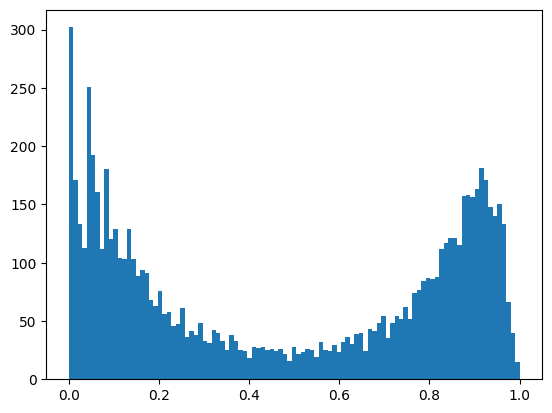

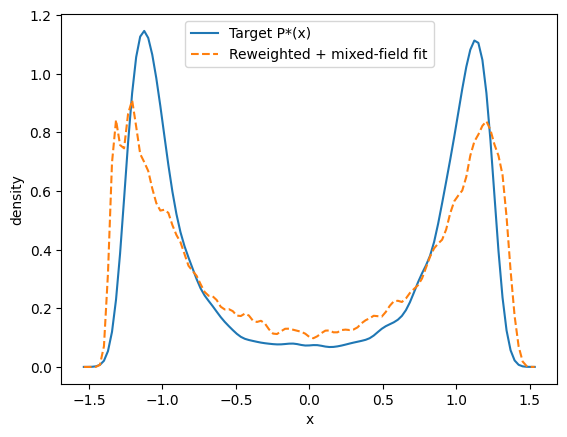

success: False
χ²*    : 0.16428426662662715
θ*     : (1.040153749504624, 4.359999999999997, 6.717059011837448, 0.9999999999905587, 0.540795072460275, -0.014351338135897177)

=== Step: target eps_sp=4.380 (prev=4.360) ===
[μ=6.717059] f=m_dense-m_dilute=-0.3829
[step] μ=6.713059 f=-0.2541
[step] μ=6.709059 f=-0.1526
[step] μ=6.705059 f=+0.0179
[equal-ρ] μ0=6.705059, ΔA=A_dense-A_dilute=+0.0179, ESS≈7505
[equal-ρ] bracket μ=6.705159, ΔA=+0.0145, ESS≈7505
[equal-ρ] bracket μ=6.705259, ΔA=+0.0112, ESS≈7505
[equal-ρ] bracket μ=6.705359, ΔA=+0.0078, ESS≈7504
[equal-ρ] bracket μ=6.705459, ΔA=+0.0045, ESS≈7503
[equal-ρ] bracket μ=6.705559, ΔA=+0.0011, ESS≈7503
[equal-ρ] bracket μ=6.705659, ΔA=-0.0022, ESS≈7501
[equal-ρ] bisect μ=6.705359, ΔA=+0.0078, ESS≈7504
mu* = 6.705359   ESS ≈ 7504
0.4877974683544304


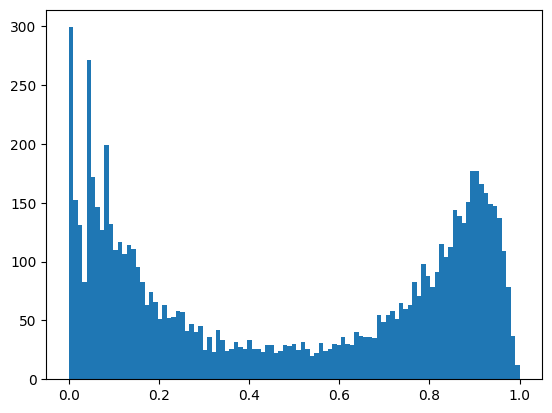

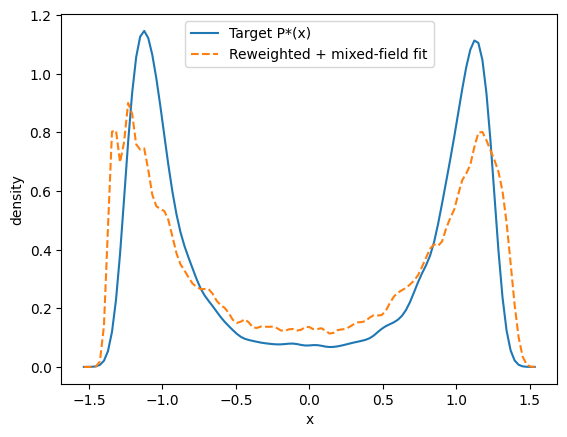

success: True
χ²*    : 0.22549906629220123
θ*     : (1.0322756069391337, 4.379999999999996, 6.725359011837449, 1.000000000017996, 0.6552163777100976, 0.013960974080943022)

=== Step: target eps_sp=4.400 (prev=4.380) ===
[μ=6.725359] f=m_dense-m_dilute=-0.5186
[step] μ=6.721359 f=-0.4432
[step] μ=6.717359 f=-0.3041
[step] μ=6.713359 f=-0.1777
[step] μ=6.709359 f=-0.0597
[equal-ρ] μ0=6.709359, ΔA=A_dense-A_dilute=-0.0597, ESS≈7505
[equal-ρ] bracket μ=6.709259, ΔA=-0.0564, ESS≈7505
[equal-ρ] bracket μ=6.709159, ΔA=-0.0532, ESS≈7505
[equal-ρ] bracket μ=6.709059, ΔA=-0.0499, ESS≈7504
[equal-ρ] bracket μ=6.708959, ΔA=-0.0466, ESS≈7503
[equal-ρ] bracket μ=6.708859, ΔA=-0.0434, ESS≈7503
[equal-ρ] bracket μ=6.708759, ΔA=-0.0401, ESS≈7502
[equal-ρ] bracket μ=6.708659, ΔA=-0.0368, ESS≈7500
[equal-ρ] bracket μ=6.708559, ΔA=-0.0335, ESS≈7499
[equal-ρ] bracket μ=6.708459, ΔA=-0.0303, ESS≈7497
[equal-ρ] bracket μ=6.708359, ΔA=-0.0270, ESS≈7496
[equal-ρ] bracket μ=6.708259, ΔA=-0.0237, ESS≈7494
[equal

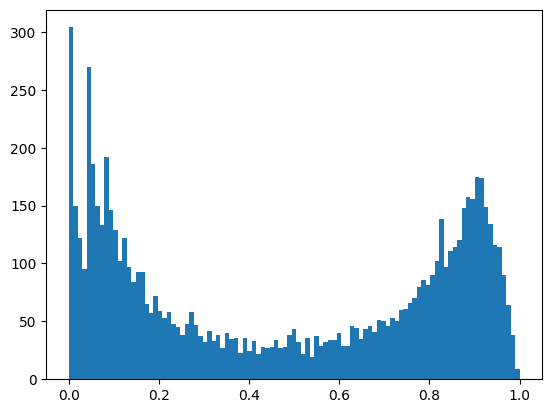

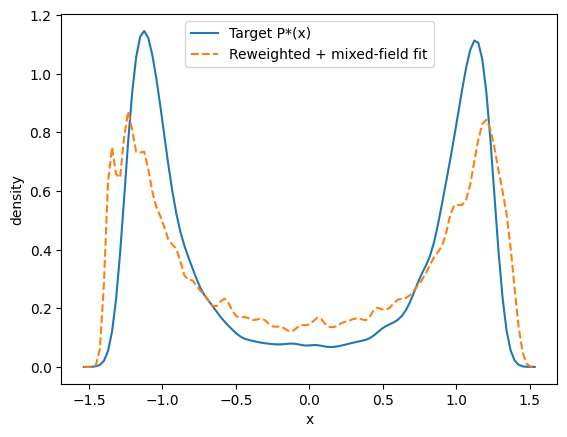

success: True
χ²*    : 0.040763270026941474
θ*     : (1.0263391832766253, 4.399999999999996, 6.72047833472136, 1.0, 0.40396291505731424, -0.0363028658529475)

=== Step: target eps_sp=4.420 (prev=4.400) ===
[μ=6.720478] f=m_dense-m_dilute=-0.1891
[step] μ=6.716478 f=-0.0549
[equal-ρ] μ0=6.716478, ΔA=A_dense-A_dilute=-0.0549, ESS≈7505
[equal-ρ] bracket μ=6.716378, ΔA=-0.0516, ESS≈7505
[equal-ρ] bracket μ=6.716278, ΔA=-0.0483, ESS≈7505
[equal-ρ] bracket μ=6.716178, ΔA=-0.0451, ESS≈7504
[equal-ρ] bracket μ=6.716078, ΔA=-0.0418, ESS≈7503
[equal-ρ] bracket μ=6.715978, ΔA=-0.0385, ESS≈7503
[equal-ρ] bracket μ=6.715878, ΔA=-0.0352, ESS≈7502
[equal-ρ] bracket μ=6.715778, ΔA=-0.0319, ESS≈7500
[equal-ρ] bracket μ=6.715678, ΔA=-0.0287, ESS≈7499
[equal-ρ] bracket μ=6.715578, ΔA=-0.0254, ESS≈7497
[equal-ρ] bracket μ=6.715478, ΔA=-0.0221, ESS≈7495
[equal-ρ] bracket μ=6.715378, ΔA=-0.0188, ESS≈7493
[equal-ρ] bracket μ=6.715278, ΔA=-0.0155, ESS≈7491
[equal-ρ] bracket μ=6.715178, ΔA=-0.0122, ESS≈7489
[e

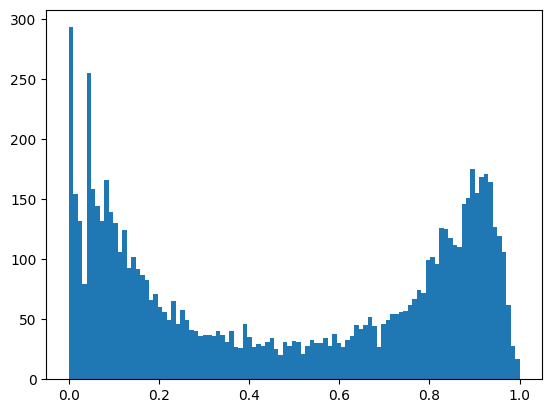

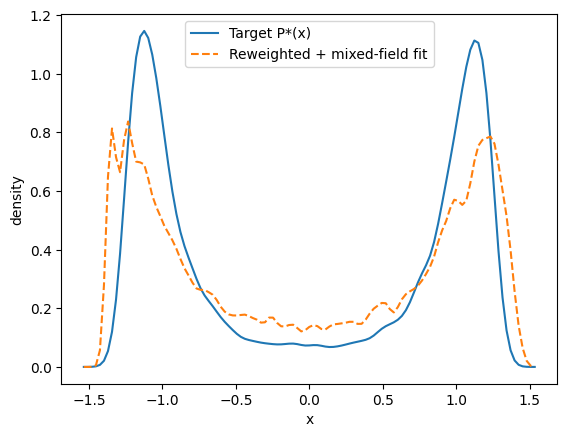

success: True
χ²*    : 0.11832473838101062
θ*     : (1.022117500681288, 4.4199999999999955, 6.723706477189307, 1.0, 0.42182770287451216, 0.0010697987251545166)

=== Step: target eps_sp=4.440 (prev=4.420) ===
[μ=6.723706] f=m_dense-m_dilute=+0.0256
[equal-ρ] μ0=6.723706, ΔA=A_dense-A_dilute=+0.0256, ESS≈7505
[equal-ρ] bracket μ=6.723806, ΔA=+0.0223, ESS≈7505
[equal-ρ] bracket μ=6.723906, ΔA=+0.0191, ESS≈7505
[equal-ρ] bracket μ=6.724006, ΔA=+0.0159, ESS≈7504
[equal-ρ] bracket μ=6.724106, ΔA=+0.0126, ESS≈7504
[equal-ρ] bracket μ=6.724206, ΔA=+0.0094, ESS≈7503
[equal-ρ] bracket μ=6.724306, ΔA=+0.0062, ESS≈7502
[equal-ρ] bracket μ=6.724406, ΔA=+0.0029, ESS≈7500
[equal-ρ] bracket μ=6.724506, ΔA=-0.0003, ESS≈7499
[equal-ρ] bisect μ=6.724106, ΔA=+0.0126, ESS≈7504
[equal-ρ] bisect μ=6.724306, ΔA=+0.0062, ESS≈7502
mu* = 6.724306   ESS ≈ 7502
0.487072618254497


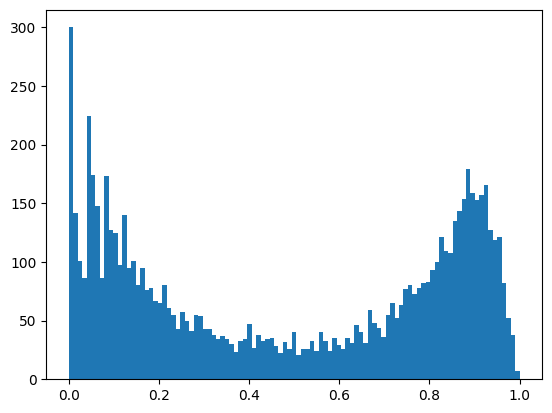

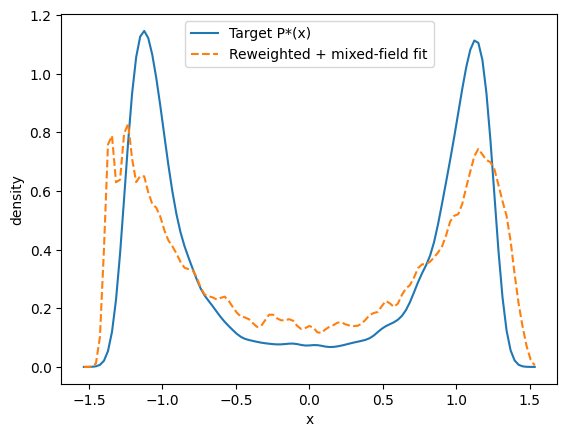

success: True
χ²*    : 0.10208589945307699
θ*     : (1.0154541749562704, 4.439999999999995, 6.730969737801745, 1.0, 0.5084431043953712, 0.04009329606383498)

=== Step: target eps_sp=4.460 (prev=4.440) ===
[μ=6.730970] f=m_dense-m_dilute=-0.0116
[equal-ρ] μ0=6.730970, ΔA=A_dense-A_dilute=-0.0116, ESS≈7505
[equal-ρ] bracket μ=6.730870, ΔA=-0.0084, ESS≈7505
[equal-ρ] bracket μ=6.730770, ΔA=-0.0051, ESS≈7505
[equal-ρ] bracket μ=6.730670, ΔA=-0.0019, ESS≈7504
[equal-ρ] bracket μ=6.730570, ΔA=+0.0013, ESS≈7504
[equal-ρ] bisect μ=6.730770, ΔA=-0.0051, ESS≈7505
mu* = 6.730770   ESS ≈ 7505
0.48522451698867425


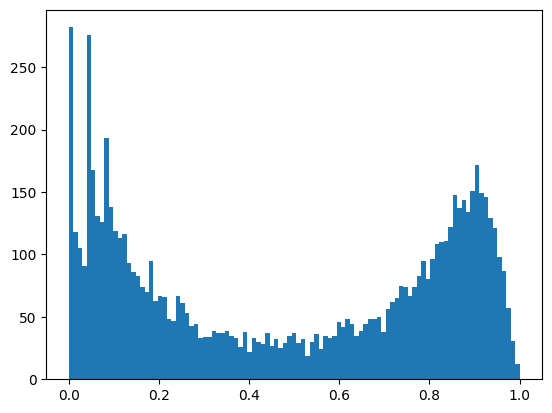

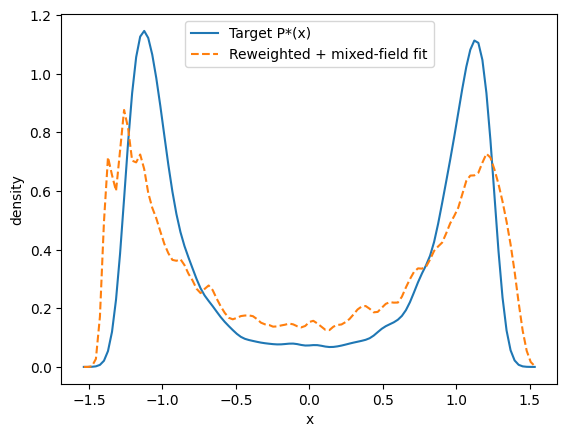

success: True
χ²*    : 0.0954358943159728
θ*     : (1.01101539996151, 4.459999999999995, 6.739746173435245, 1.0, 0.44000211220424096, 0.006492155541764589)

=== Step: target eps_sp=4.480 (prev=4.460) ===
[μ=6.739746] f=m_dense-m_dilute=-0.0112
[equal-ρ] μ0=6.739746, ΔA=A_dense-A_dilute=-0.0112, ESS≈7505
[equal-ρ] bracket μ=6.739646, ΔA=-0.0080, ESS≈7505
[equal-ρ] bracket μ=6.739546, ΔA=-0.0048, ESS≈7505
[equal-ρ] bracket μ=6.739446, ΔA=-0.0016, ESS≈7504
[equal-ρ] bracket μ=6.739346, ΔA=+0.0016, ESS≈7504
[equal-ρ] bisect μ=6.739546, ΔA=-0.0048, ESS≈7505
mu* = 6.739546   ESS ≈ 7505
0.48843171219187204


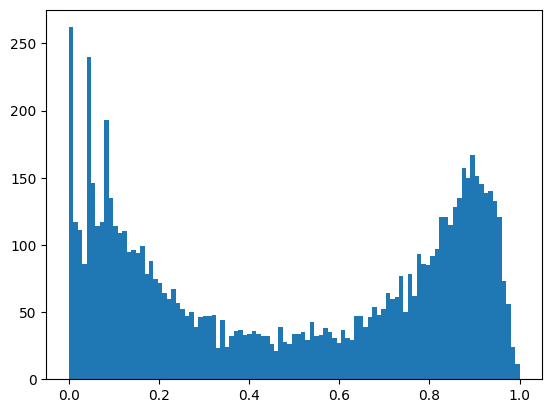

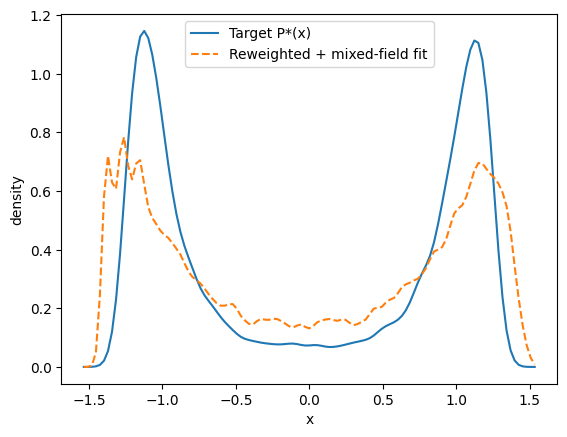

success: True
χ²*    : 0.3364497731000651
θ*     : (1.011012364855568, 4.479999999999994, 6.739543152868074, 1.0, 0.33357613764399796, 0.03482061989717089)

=== Step: target eps_sp=4.500 (prev=4.480) ===
[μ=6.739543] f=m_dense-m_dilute=+0.5435
[step] μ=6.743543 f=+0.4096
[step] μ=6.747543 f=+0.3150
[step] μ=6.751543 f=+0.2044
[step] μ=6.755543 f=+0.0732
[equal-ρ] μ0=6.755543, ΔA=A_dense-A_dilute=+0.0732, ESS≈7505
[equal-ρ] bracket μ=6.755643, ΔA=+0.0700, ESS≈7505
[equal-ρ] bracket μ=6.755743, ΔA=+0.0668, ESS≈7505
[equal-ρ] bracket μ=6.755843, ΔA=+0.0636, ESS≈7504
[equal-ρ] bracket μ=6.755943, ΔA=+0.0605, ESS≈7504
[equal-ρ] bracket μ=6.756043, ΔA=+0.0573, ESS≈7503
[equal-ρ] bracket μ=6.756143, ΔA=+0.0541, ESS≈7502
[equal-ρ] bracket μ=6.756243, ΔA=+0.0509, ESS≈7501
[equal-ρ] bracket μ=6.756343, ΔA=+0.0478, ESS≈7499
[equal-ρ] bracket μ=6.756443, ΔA=+0.0446, ESS≈7498
[equal-ρ] bracket μ=6.756543, ΔA=+0.0414, ESS≈7496
[equal-ρ] bracket μ=6.756643, ΔA=+0.0382, ESS≈7494
[equal-ρ] bracket μ=6.

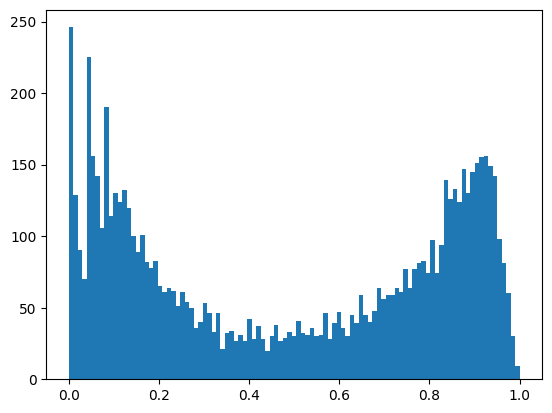

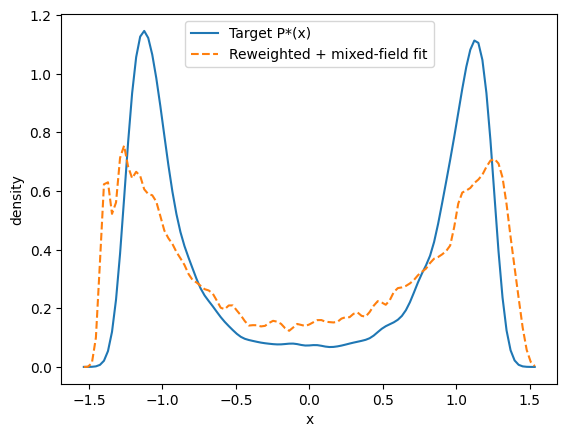

success: True
χ²*    : 0.16468136737514255
θ*     : (1.0079015010181056, 4.499999999999994, 6.765073310167862, 1.0, 0.40005501359903756, 0.0016407646316424801)

=== Step: target eps_sp=4.520 (prev=4.500) ===
[μ=6.765073] f=m_dense-m_dilute=+0.1686
[step] μ=6.769073 f=+0.0304
[equal-ρ] μ0=6.769073, ΔA=A_dense-A_dilute=+0.0304, ESS≈7505
[equal-ρ] bracket μ=6.769173, ΔA=+0.0272, ESS≈7505
[equal-ρ] bracket μ=6.769273, ΔA=+0.0241, ESS≈7505
[equal-ρ] bracket μ=6.769373, ΔA=+0.0209, ESS≈7504
[equal-ρ] bracket μ=6.769473, ΔA=+0.0177, ESS≈7504
[equal-ρ] bracket μ=6.769573, ΔA=+0.0146, ESS≈7503
[equal-ρ] bracket μ=6.769673, ΔA=+0.0114, ESS≈7502
[equal-ρ] bracket μ=6.769773, ΔA=+0.0082, ESS≈7501
[equal-ρ] bracket μ=6.769873, ΔA=+0.0051, ESS≈7499
[equal-ρ] bracket μ=6.769973, ΔA=+0.0019, ESS≈7498
[equal-ρ] bracket μ=6.770073, ΔA=-0.0013, ESS≈7496
[equal-ρ] bisect μ=6.769573, ΔA=+0.0146, ESS≈7503
[equal-ρ] bisect μ=6.769823, ΔA=+0.0066, ESS≈7500
mu* = 6.769823   ESS ≈ 7500
0.48379613590939374


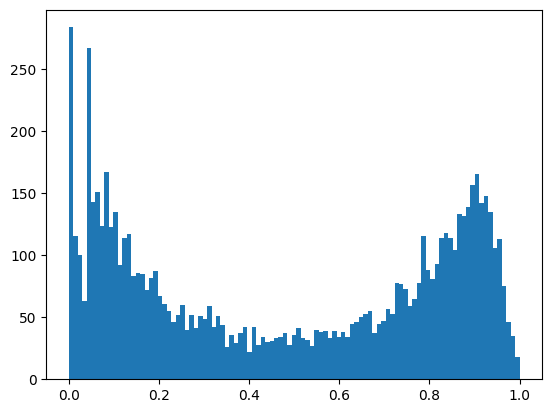

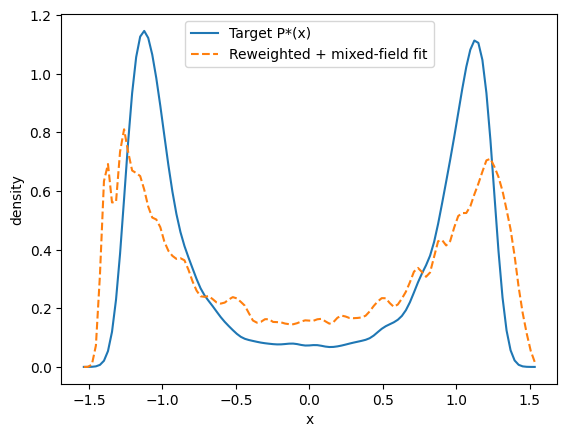

success: True
χ²*    : 0.14633108120346794
θ*     : (1.0040231725871558, 4.519999999999993, 6.777053469254763, 1.0, 0.410142475493745, 0.005904278235397143)

=== Step: target eps_sp=4.540 (prev=4.520) ===
[μ=6.777053] f=m_dense-m_dilute=+0.1471
[step] μ=6.781053 f=+0.0015
[equal-ρ] μ0=6.781053, ΔA=A_dense-A_dilute=+0.0015, ESS≈7505
mu* = 6.781053   ESS ≈ 7505
0.48849433710859425


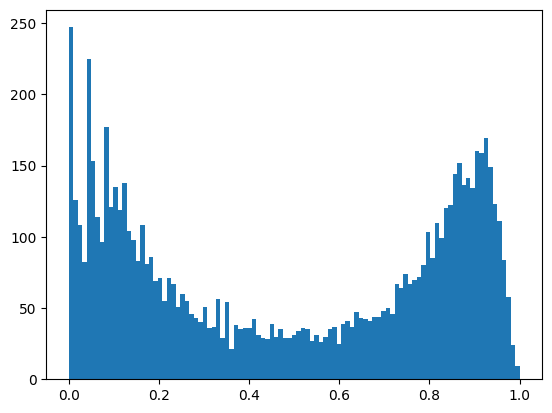

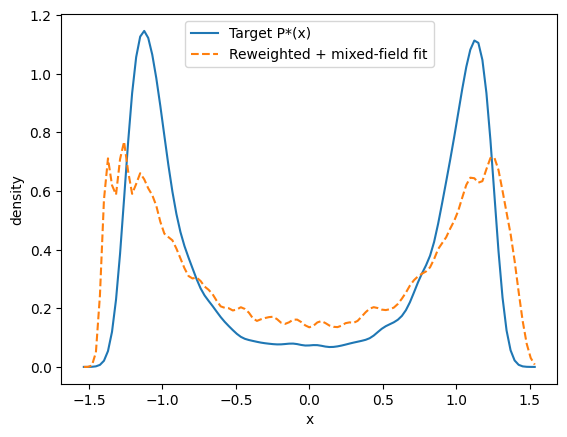

success: True
χ²*    : 0.2068941731047429
θ*     : (1.0013623837010592, 4.539999999999993, 6.786536787507778, 1.0, 0.4337501225772618, 0.03683173486809963)

=== Step: target eps_sp=4.560 (prev=4.540) ===
[μ=6.786537] f=m_dense-m_dilute=+0.2063
[step] μ=6.790537 f=+0.1398
[step] μ=6.794537 f=-0.0096
[equal-ρ] μ0=6.794537, ΔA=A_dense-A_dilute=-0.0096, ESS≈7505
mu* = 6.794537   ESS ≈ 7505
0.4830886075949367


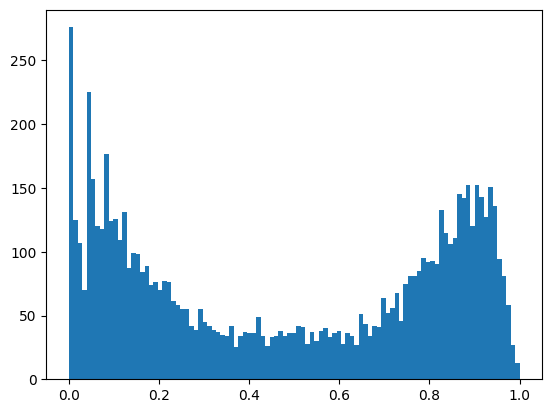

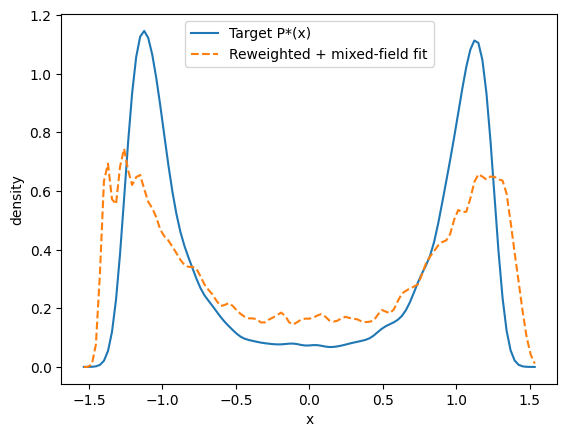

success: True
χ²*    : 0.2177848568480993
θ*     : (0.9992738759202333, 4.5599999999999925, 6.800930794547192, 1.0, 0.36906151883835675, 8.32347393497476e-05)

=== Step: target eps_sp=4.580 (prev=4.560) ===
[μ=6.800931] f=m_dense-m_dilute=+0.2342
[step] μ=6.804931 f=+0.1161
[step] μ=6.808931 f=-0.0113
[equal-ρ] μ0=6.808931, ΔA=A_dense-A_dilute=-0.0113, ESS≈7505
[equal-ρ] bracket μ=6.808831, ΔA=-0.0082, ESS≈7505
[equal-ρ] bracket μ=6.808731, ΔA=-0.0050, ESS≈7505
[equal-ρ] bracket μ=6.808631, ΔA=-0.0019, ESS≈7504
[equal-ρ] bracket μ=6.808531, ΔA=+0.0012, ESS≈7504
[equal-ρ] bisect μ=6.808731, ΔA=-0.0050, ESS≈7505
mu* = 6.808731   ESS ≈ 7505
0.4852418387741506


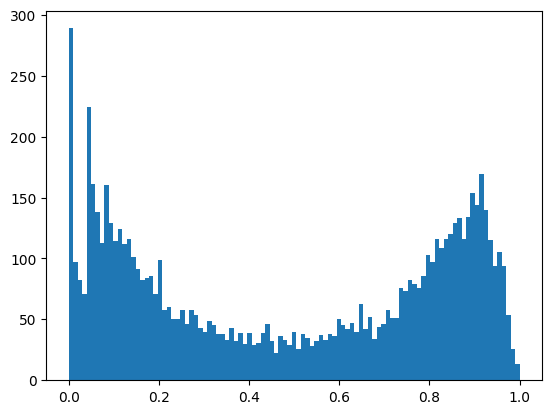

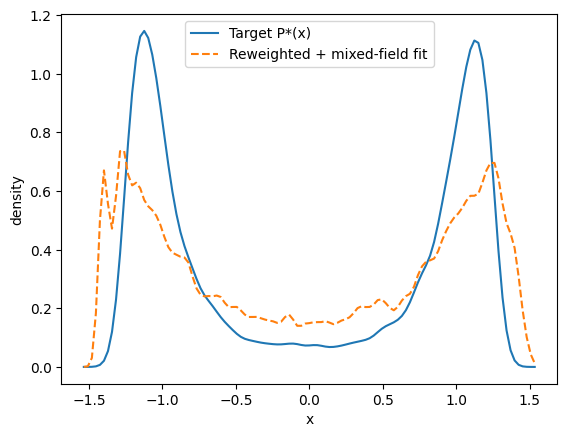

success: True
χ²*    : 0.21686249736944035
θ*     : (0.9967210976698074, 4.579999999999992, 6.814468064012268, 1.0, 0.36822711686057275, -0.0006300711196068263)

=== Step: target eps_sp=4.600 (prev=4.580) ===
[μ=6.814468] f=m_dense-m_dilute=+0.2072
[step] μ=6.818468 f=+0.1179
[step] μ=6.822468 f=-0.0340
[equal-ρ] μ0=6.822468, ΔA=A_dense-A_dilute=-0.0340, ESS≈7505
[equal-ρ] bracket μ=6.822368, ΔA=-0.0308, ESS≈7505
[equal-ρ] bracket μ=6.822268, ΔA=-0.0277, ESS≈7505
[equal-ρ] bracket μ=6.822168, ΔA=-0.0245, ESS≈7504
[equal-ρ] bracket μ=6.822068, ΔA=-0.0214, ESS≈7504
[equal-ρ] bracket μ=6.821968, ΔA=-0.0182, ESS≈7503
[equal-ρ] bracket μ=6.821868, ΔA=-0.0150, ESS≈7502
[equal-ρ] bracket μ=6.821768, ΔA=-0.0119, ESS≈7501
[equal-ρ] bracket μ=6.821668, ΔA=-0.0087, ESS≈7499
[equal-ρ] bracket μ=6.821568, ΔA=-0.0056, ESS≈7498
[equal-ρ] bracket μ=6.821468, ΔA=-0.0024, ESS≈7496
[equal-ρ] bracket μ=6.821368, ΔA=+0.0007, ESS≈7494
[equal-ρ] bisect μ=6.821918, ΔA=-0.0166, ESS≈7502
[equal-ρ] bisect μ=6.82

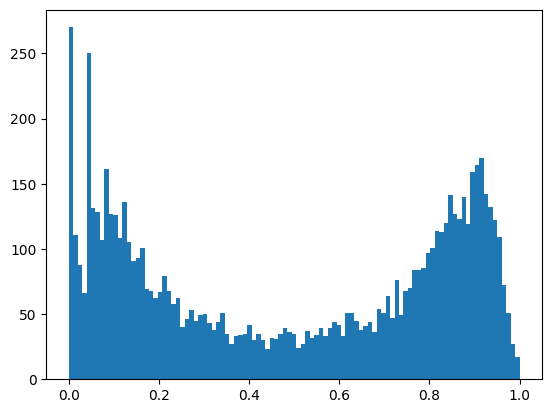

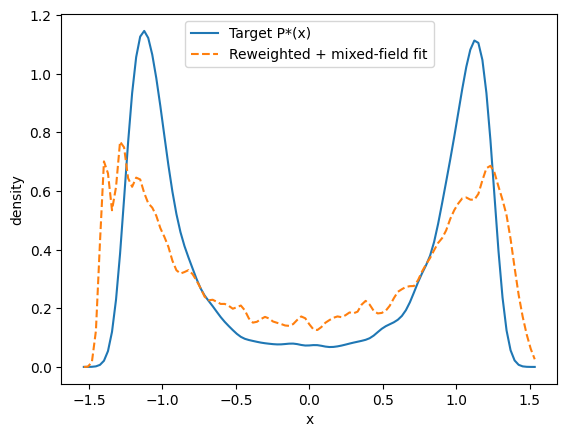

success: False
χ²*    : 0.14390123885944195
θ*     : (0.9935951101273498, 4.599999999999992, 6.8292455469397755, 1.0, 0.5280034653010487, 0.06482314715232719)

=== Step: target eps_sp=4.620 (prev=4.600) ===
[μ=6.829246] f=m_dense-m_dilute=+0.1455
[step] μ=6.833246 f=+0.0151
[equal-ρ] μ0=6.833246, ΔA=A_dense-A_dilute=+0.0151, ESS≈7505
[equal-ρ] bracket μ=6.833346, ΔA=+0.0119, ESS≈7505
[equal-ρ] bracket μ=6.833446, ΔA=+0.0088, ESS≈7505
[equal-ρ] bracket μ=6.833546, ΔA=+0.0057, ESS≈7504
[equal-ρ] bracket μ=6.833646, ΔA=+0.0025, ESS≈7504
[equal-ρ] bracket μ=6.833746, ΔA=-0.0006, ESS≈7503
[equal-ρ] bisect μ=6.833496, ΔA=+0.0072, ESS≈7504
mu* = 6.833496   ESS ≈ 7504
0.4787021985343105


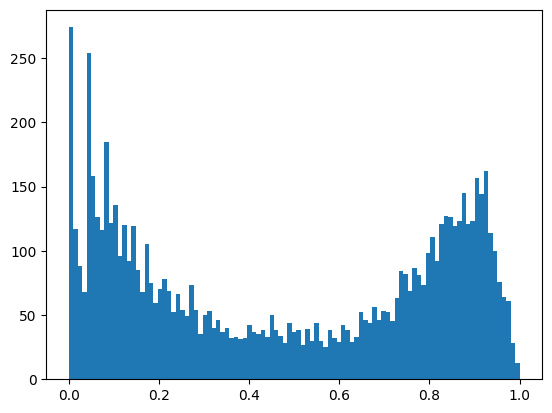

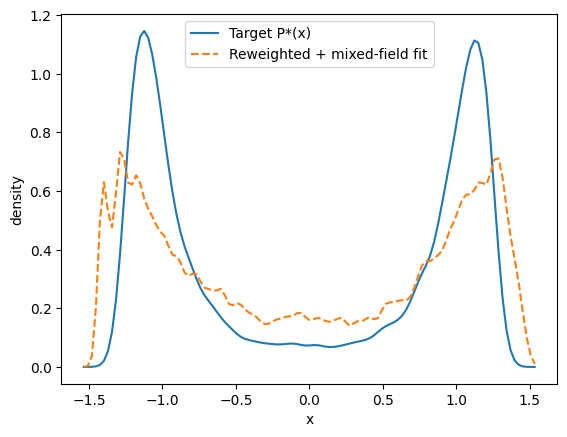

success: True
χ²*    : 0.1770009486478444
θ*     : (1.0048075962801344, 4.619999999999991, 6.853438458339406, 1.0, 0.3086498074469715, -0.035978600066768035)

=== Step: target eps_sp=4.640 (prev=4.620) ===
[μ=6.853438] f=m_dense-m_dilute=+0.5800
[step] μ=6.857438 f=+0.5031
[step] μ=6.861438 f=+0.3952
[step] μ=6.865438 f=+0.2621
[step] μ=6.869438 f=+0.1600
[step] μ=6.873438 f=+0.0276
[equal-ρ] μ0=6.873438, ΔA=A_dense-A_dilute=+0.0276, ESS≈7505
[equal-ρ] bracket μ=6.873538, ΔA=+0.0244, ESS≈7505
[equal-ρ] bracket μ=6.873638, ΔA=+0.0212, ESS≈7505
[equal-ρ] bracket μ=6.873738, ΔA=+0.0180, ESS≈7504
[equal-ρ] bracket μ=6.873838, ΔA=+0.0148, ESS≈7504
[equal-ρ] bracket μ=6.873938, ΔA=+0.0115, ESS≈7503
[equal-ρ] bracket μ=6.874038, ΔA=+0.0083, ESS≈7502
[equal-ρ] bracket μ=6.874138, ΔA=+0.0051, ESS≈7500
[equal-ρ] bracket μ=6.874238, ΔA=+0.0019, ESS≈7499
[equal-ρ] bracket μ=6.874338, ΔA=-0.0013, ESS≈7498
[equal-ρ] bisect μ=6.873888, ΔA=+0.0131, ESS≈7503
[equal-ρ] bisect μ=6.874113, ΔA=+0.0059, ESS

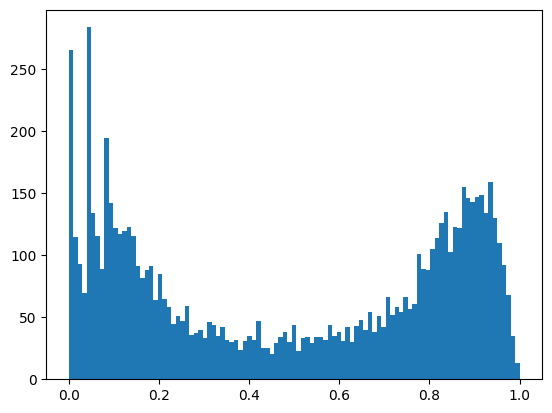

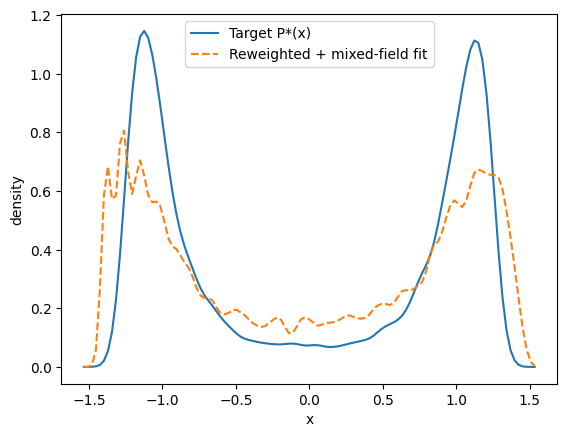

success: True
χ²*    : 0.1033295522904399
θ*     : (0.9981466531167846, 4.639999999999991, 6.880773971207942, 1.0, 0.4633328806977862, 0.017210644040619002)

=== Step: target eps_sp=4.660 (prev=4.640) ===
[μ=6.880774] f=m_dense-m_dilute=-0.0622
[equal-ρ] μ0=6.880774, ΔA=A_dense-A_dilute=-0.0622, ESS≈7505
[equal-ρ] bracket μ=6.880674, ΔA=-0.0591, ESS≈7505
[equal-ρ] bracket μ=6.880574, ΔA=-0.0559, ESS≈7505
[equal-ρ] bracket μ=6.880474, ΔA=-0.0527, ESS≈7504
[equal-ρ] bracket μ=6.880374, ΔA=-0.0496, ESS≈7504
[equal-ρ] bracket μ=6.880274, ΔA=-0.0464, ESS≈7503
[equal-ρ] bracket μ=6.880174, ΔA=-0.0432, ESS≈7502
[equal-ρ] bracket μ=6.880074, ΔA=-0.0401, ESS≈7501
[equal-ρ] bracket μ=6.879974, ΔA=-0.0369, ESS≈7499
[equal-ρ] bracket μ=6.879874, ΔA=-0.0337, ESS≈7498
[equal-ρ] bracket μ=6.879774, ΔA=-0.0305, ESS≈7496
[equal-ρ] bracket μ=6.879674, ΔA=-0.0274, ESS≈7494
[equal-ρ] bracket μ=6.879574, ΔA=-0.0242, ESS≈7492
[equal-ρ] bracket μ=6.879474, ΔA=-0.0210, ESS≈7490
[equal-ρ] bracket μ=6.879374, Δ

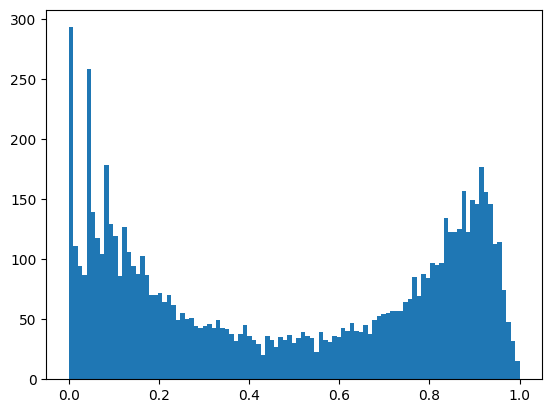

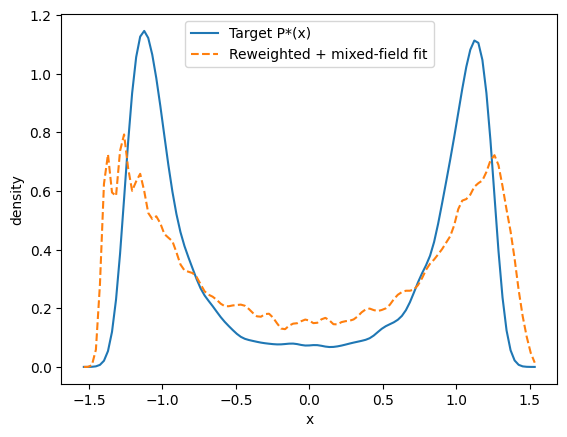

success: True
χ²*    : 0.193830325492706
θ*     : (0.9941969596894102, 4.65999999999999, 6.884096519330801, 1.0, 0.4148539902832964, 0.021852542842347136)

=== Step: target eps_sp=4.680 (prev=4.660) ===
[μ=6.884097] f=m_dense-m_dilute=+0.1939
[step] μ=6.888097 f=+0.0648
[equal-ρ] μ0=6.888097, ΔA=A_dense-A_dilute=+0.0648, ESS≈7505
[equal-ρ] bracket μ=6.888197, ΔA=+0.0616, ESS≈7505
[equal-ρ] bracket μ=6.888297, ΔA=+0.0585, ESS≈7505
[equal-ρ] bracket μ=6.888397, ΔA=+0.0553, ESS≈7504
[equal-ρ] bracket μ=6.888497, ΔA=+0.0522, ESS≈7504
[equal-ρ] bracket μ=6.888597, ΔA=+0.0490, ESS≈7503
[equal-ρ] bracket μ=6.888697, ΔA=+0.0459, ESS≈7502
[equal-ρ] bracket μ=6.888797, ΔA=+0.0427, ESS≈7501
[equal-ρ] bracket μ=6.888897, ΔA=+0.0396, ESS≈7499
[equal-ρ] bracket μ=6.888997, ΔA=+0.0364, ESS≈7498
[equal-ρ] bracket μ=6.889097, ΔA=+0.0333, ESS≈7496
[equal-ρ] bracket μ=6.889197, ΔA=+0.0301, ESS≈7494
[equal-ρ] bracket μ=6.889297, ΔA=+0.0270, ESS≈7492
[equal-ρ] bracket μ=6.889397, ΔA=+0.0238, ESS≈7490
[equa

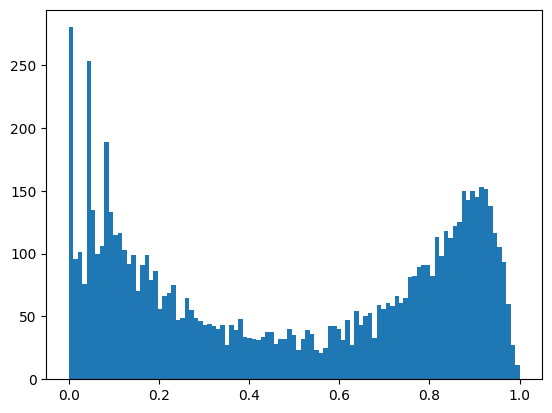

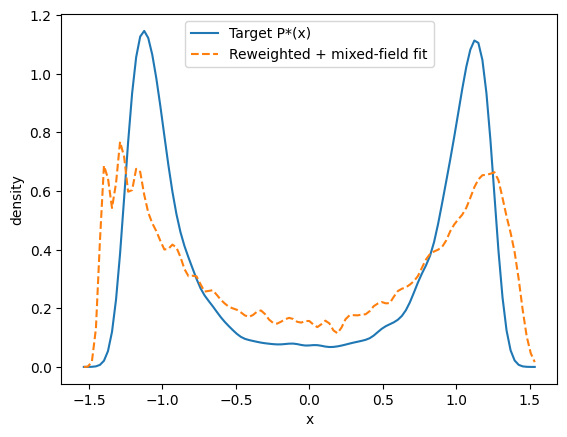

success: True
χ²*    : 0.07527034805524158
θ*     : (0.995373881585739, 4.67999999999999, 6.906773566792061, 1.0, 0.5360774880254159, 0.03591306415993601)

=== Step: target eps_sp=4.700 (prev=4.680) ===
[μ=6.906774] f=m_dense-m_dilute=+0.1169
[step] μ=6.910774 f=-0.0064
[equal-ρ] μ0=6.910774, ΔA=A_dense-A_dilute=-0.0064, ESS≈7505
mu* = 6.910774   ESS ≈ 7505
0.4817894736842105


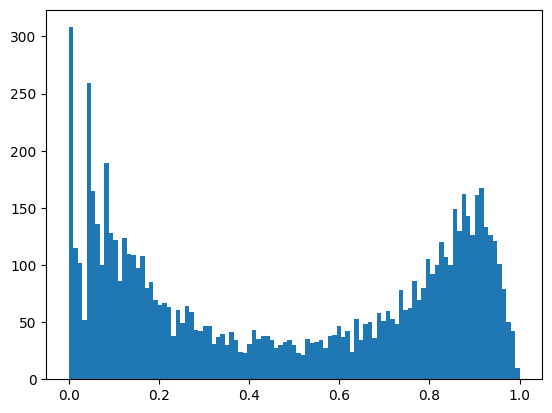

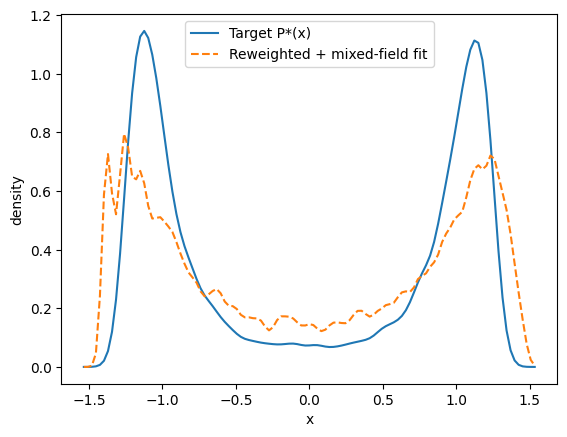

success: True
χ²*    : 0.06949360331722525
θ*     : (0.9907910626837316, 4.6999999999999895, 6.922215068574254, 1.0, 0.42842011986840284, -0.010752173881866271)

=== Step: target eps_sp=4.720 (prev=4.700) ===
[μ=6.922215] f=m_dense-m_dilute=-0.0448
[equal-ρ] μ0=6.922215, ΔA=A_dense-A_dilute=-0.0448, ESS≈7505
[equal-ρ] bracket μ=6.922115, ΔA=-0.0416, ESS≈7505
[equal-ρ] bracket μ=6.922015, ΔA=-0.0384, ESS≈7505
[equal-ρ] bracket μ=6.921915, ΔA=-0.0352, ESS≈7504
[equal-ρ] bracket μ=6.921815, ΔA=-0.0321, ESS≈7504
[equal-ρ] bracket μ=6.921715, ΔA=-0.0289, ESS≈7503
[equal-ρ] bracket μ=6.921615, ΔA=-0.0257, ESS≈7502
[equal-ρ] bracket μ=6.921515, ΔA=-0.0225, ESS≈7501
[equal-ρ] bracket μ=6.921415, ΔA=-0.0193, ESS≈7499
[equal-ρ] bracket μ=6.921315, ΔA=-0.0162, ESS≈7498
[equal-ρ] bracket μ=6.921215, ΔA=-0.0130, ESS≈7496
[equal-ρ] bracket μ=6.921115, ΔA=-0.0098, ESS≈7494
[equal-ρ] bracket μ=6.921015, ΔA=-0.0066, ESS≈7492
[equal-ρ] bracket μ=6.920915, ΔA=-0.0034, ESS≈7490
[equal-ρ] bracket μ=6.92081

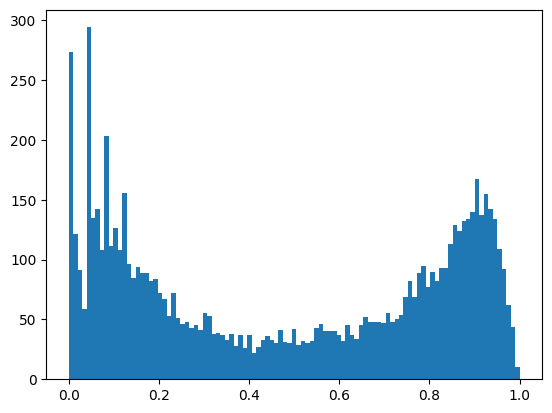

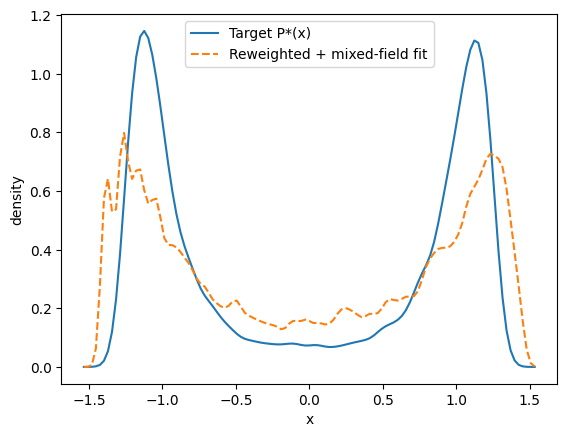

success: True
χ²*    : 0.2070820193767458
θ*     : (0.9909606343884773, 4.719999999999989, 6.929853790693589, 1.0, 0.31825474678411325, -0.026373198679728503)

=== Step: target eps_sp=4.740 (prev=4.720) ===
[μ=6.929854] f=m_dense-m_dilute=+0.3034
[step] μ=6.933854 f=+0.1431
[step] μ=6.937854 f=+0.0394
[equal-ρ] μ0=6.937854, ΔA=A_dense-A_dilute=+0.0394, ESS≈7505
[equal-ρ] bracket μ=6.937954, ΔA=+0.0363, ESS≈7505
[equal-ρ] bracket μ=6.938054, ΔA=+0.0331, ESS≈7505
[equal-ρ] bracket μ=6.938154, ΔA=+0.0300, ESS≈7504
[equal-ρ] bracket μ=6.938254, ΔA=+0.0268, ESS≈7504
[equal-ρ] bracket μ=6.938354, ΔA=+0.0237, ESS≈7503
[equal-ρ] bracket μ=6.938454, ΔA=+0.0205, ESS≈7502
[equal-ρ] bracket μ=6.938554, ΔA=+0.0174, ESS≈7501
[equal-ρ] bracket μ=6.938654, ΔA=+0.0142, ESS≈7499
[equal-ρ] bracket μ=6.938754, ΔA=+0.0110, ESS≈7498
[equal-ρ] bracket μ=6.938854, ΔA=+0.0079, ESS≈7496
[equal-ρ] bracket μ=6.938954, ΔA=+0.0047, ESS≈7494
[equal-ρ] bracket μ=6.939054, ΔA=+0.0016, ESS≈7492
[equal-ρ] bracket μ=6.93

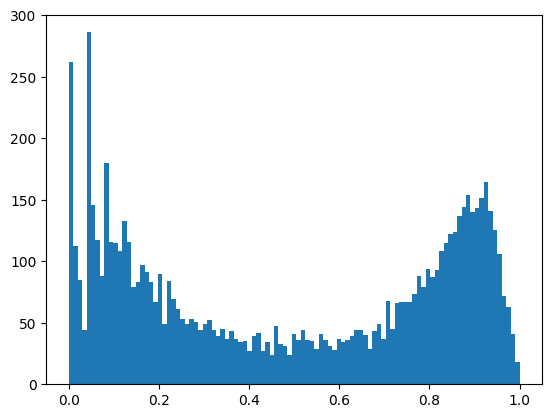

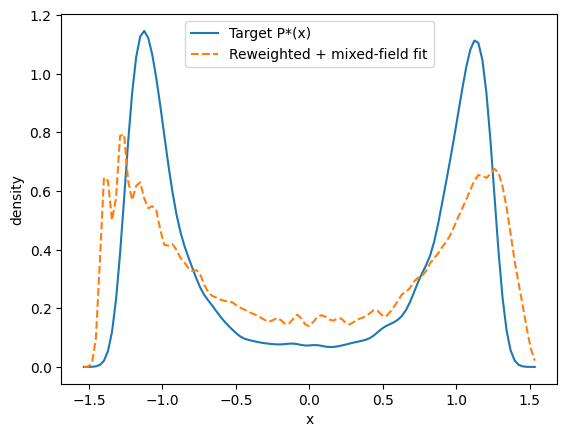

success: True
χ²*    : 0.22963799023267434
θ*     : (1.0054234995100086, 4.739999999999989, 6.9588287906935875, 1.0, 0.3990739048957554, 0.030260498768032117)

=== Step: target eps_sp=4.760 (prev=4.740) ===
[μ=6.958829] f=m_dense-m_dilute=+0.7081
[step] μ=6.962829 f=+0.6345
[step] μ=6.966829 f=+0.5667
[step] μ=6.970829 f=+0.4782
[step] μ=6.974829 f=+0.3631
[step] μ=6.978829 f=+0.2249
[step] μ=6.982829 f=+0.1049
[step] μ=6.986829 f=-0.0342
[equal-ρ] μ0=6.986829, ΔA=A_dense-A_dilute=-0.0342, ESS≈7505
[equal-ρ] bracket μ=6.986729, ΔA=-0.0310, ESS≈7505
[equal-ρ] bracket μ=6.986629, ΔA=-0.0277, ESS≈7505
[equal-ρ] bracket μ=6.986529, ΔA=-0.0244, ESS≈7504
[equal-ρ] bracket μ=6.986429, ΔA=-0.0211, ESS≈7503
[equal-ρ] bracket μ=6.986329, ΔA=-0.0178, ESS≈7503
[equal-ρ] bracket μ=6.986229, ΔA=-0.0145, ESS≈7502
[equal-ρ] bracket μ=6.986129, ΔA=-0.0113, ESS≈7500
[equal-ρ] bracket μ=6.986029, ΔA=-0.0080, ESS≈7499
[equal-ρ] bracket μ=6.985929, ΔA=-0.0047, ESS≈7497
[equal-ρ] bracket μ=6.985829, ΔA=-0.0

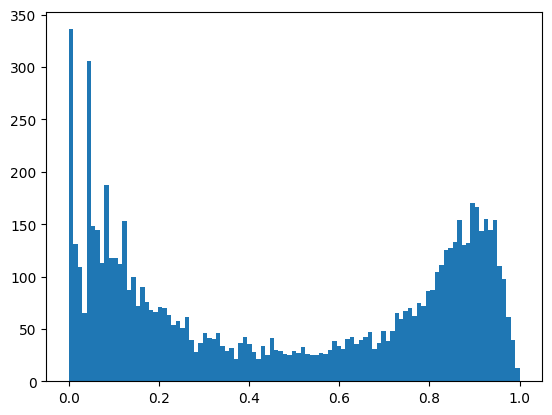

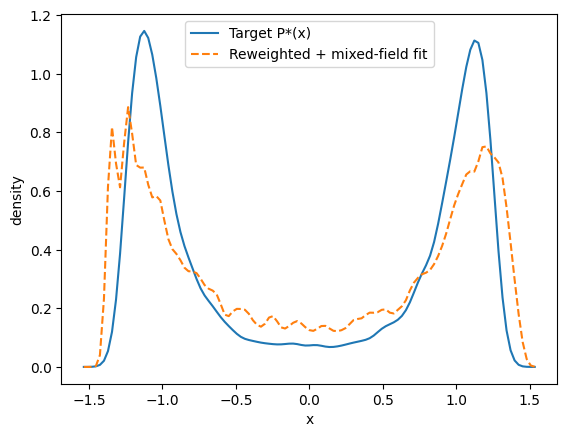

success: True
χ²*    : 0.19764280389905398
θ*     : (0.9930216124849166, 4.759999999999988, 7.001159913258934, 1.0, 0.5844995213097861, -0.004617340694170806)

=== Step: target eps_sp=4.780 (prev=4.760) ===
[μ=7.001160] f=m_dense-m_dilute=-0.5933
[step] μ=6.997160 f=-0.4946
[step] μ=6.993160 f=-0.4075
[step] μ=6.989160 f=-0.2855
[step] μ=6.985160 f=-0.1618
[step] μ=6.981160 f=-0.0076
[equal-ρ] μ0=6.981160, ΔA=A_dense-A_dilute=-0.0076, ESS≈7505
mu* = 6.981160   ESS ≈ 7505
0.48379347101932046


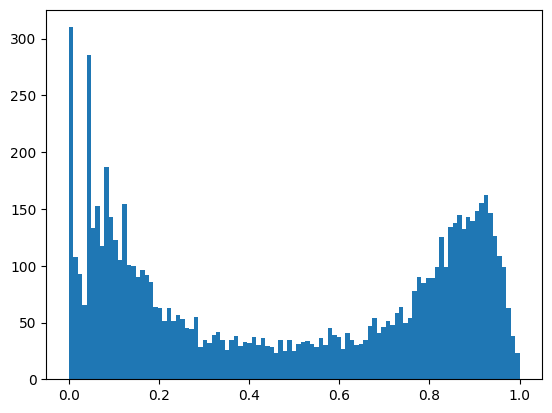

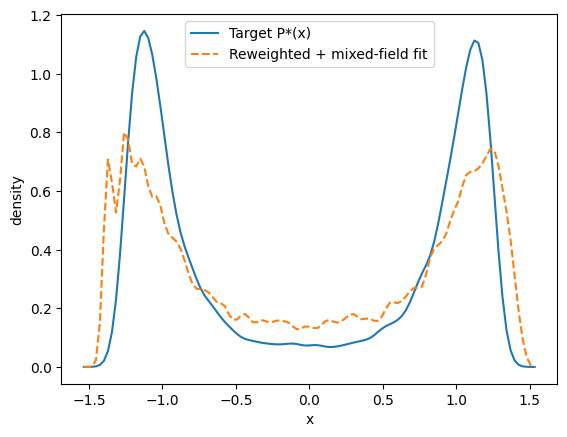

success: True
χ²*    : 0.19851367345802012
θ*     : (1.004425689047271, 4.779999999999988, 7.0011599132589355, 1.0, 0.3365559168049619, -0.01751512069765401)

=== Step: target eps_sp=4.800 (prev=4.780) ===
[μ=7.001160] f=m_dense-m_dilute=+0.5728
[step] μ=7.005160 f=+0.4843
[step] μ=7.009160 f=+0.3690
[step] μ=7.013160 f=+0.2580
[step] μ=7.017160 f=+0.1219
[step] μ=7.021160 f=-0.0169
[equal-ρ] μ0=7.021160, ΔA=A_dense-A_dilute=-0.0169, ESS≈7505
[equal-ρ] bracket μ=7.021060, ΔA=-0.0136, ESS≈7505
[equal-ρ] bracket μ=7.020960, ΔA=-0.0103, ESS≈7505
[equal-ρ] bracket μ=7.020860, ΔA=-0.0069, ESS≈7504
[equal-ρ] bracket μ=7.020760, ΔA=-0.0036, ESS≈7503
[equal-ρ] bracket μ=7.020660, ΔA=-0.0003, ESS≈7503
[equal-ρ] bracket μ=7.020560, ΔA=+0.0030, ESS≈7502
[equal-ρ] bisect μ=7.020860, ΔA=-0.0069, ESS≈7504
mu* = 7.020860   ESS ≈ 7504
0.4881518987341772


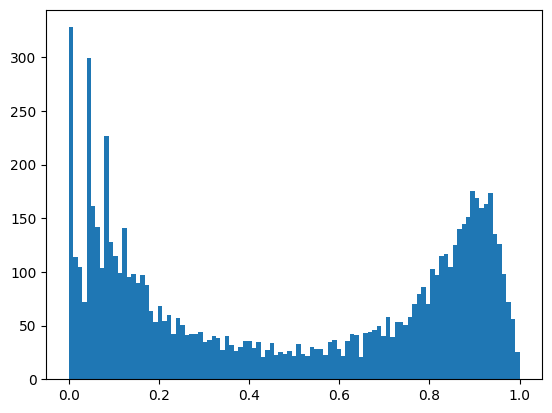

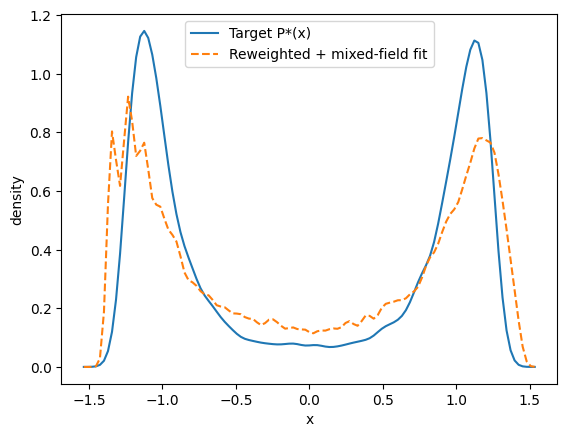

success: True
χ²*    : 0.22150760070715547
θ*     : (0.9959343341419089, 4.799999999999987, 7.040859913258933, 1.0000000000336413, 0.6698194625491246, 0.016940474746547394)

=== Step: target eps_sp=4.820 (prev=4.800) ===
[μ=7.040860] f=m_dense-m_dilute=-0.5395
[step] μ=7.036860 f=-0.4221
[step] μ=7.032860 f=-0.3201
[step] μ=7.028860 f=-0.1848
[step] μ=7.024860 f=-0.0336
[equal-ρ] μ0=7.024860, ΔA=A_dense-A_dilute=-0.0336, ESS≈7505
[equal-ρ] bracket μ=7.024760, ΔA=-0.0303, ESS≈7505
[equal-ρ] bracket μ=7.024660, ΔA=-0.0270, ESS≈7505
[equal-ρ] bracket μ=7.024560, ΔA=-0.0237, ESS≈7504
[equal-ρ] bracket μ=7.024460, ΔA=-0.0204, ESS≈7503
[equal-ρ] bracket μ=7.024360, ΔA=-0.0171, ESS≈7503
[equal-ρ] bracket μ=7.024260, ΔA=-0.0138, ESS≈7502
[equal-ρ] bracket μ=7.024160, ΔA=-0.0105, ESS≈7500
[equal-ρ] bracket μ=7.024060, ΔA=-0.0072, ESS≈7499
[equal-ρ] bracket μ=7.023960, ΔA=-0.0039, ESS≈7497
[equal-ρ] bracket μ=7.023860, ΔA=-0.0006, ESS≈7495
[equal-ρ] bracket μ=7.023760, ΔA=+0.0027, ESS≈7493
[equa

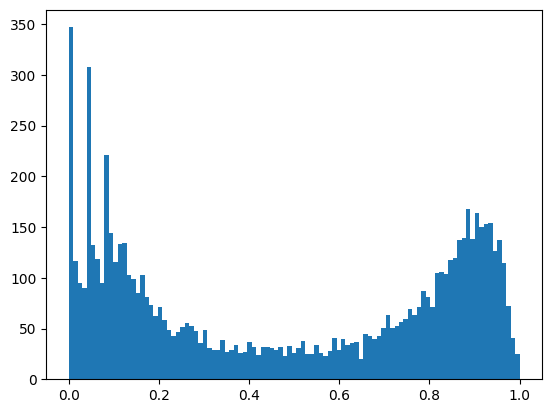

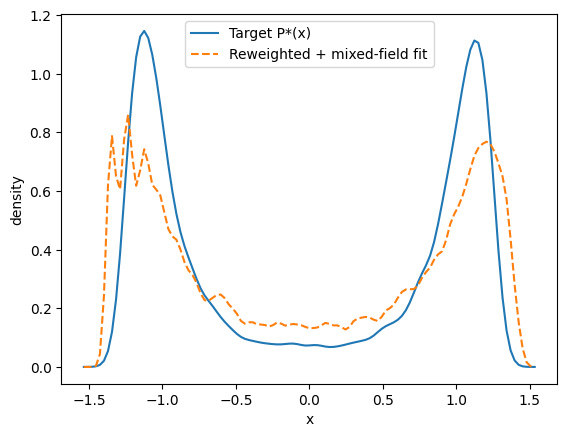

success: False
χ²*    : 0.0990700730149105
θ*     : (0.9906067041734693, 4.819999999999987, 7.033286323772451, 1.0, 0.3844335544039865, -0.02117654934748529)

=== Step: target eps_sp=4.840 (prev=4.820) ===
[μ=7.033286] f=m_dense-m_dilute=-0.0464
[equal-ρ] μ0=7.033286, ΔA=A_dense-A_dilute=-0.0464, ESS≈7505
[equal-ρ] bracket μ=7.033186, ΔA=-0.0431, ESS≈7505
[equal-ρ] bracket μ=7.033086, ΔA=-0.0399, ESS≈7505
[equal-ρ] bracket μ=7.032986, ΔA=-0.0366, ESS≈7504
[equal-ρ] bracket μ=7.032886, ΔA=-0.0334, ESS≈7503
[equal-ρ] bracket μ=7.032786, ΔA=-0.0301, ESS≈7503
[equal-ρ] bracket μ=7.032686, ΔA=-0.0269, ESS≈7502
[equal-ρ] bracket μ=7.032586, ΔA=-0.0236, ESS≈7500
[equal-ρ] bracket μ=7.032486, ΔA=-0.0203, ESS≈7499
[equal-ρ] bracket μ=7.032386, ΔA=-0.0171, ESS≈7497
[equal-ρ] bracket μ=7.032286, ΔA=-0.0138, ESS≈7496
[equal-ρ] bracket μ=7.032186, ΔA=-0.0106, ESS≈7494
[equal-ρ] bracket μ=7.032086, ΔA=-0.0073, ESS≈7491
[equal-ρ] bracket μ=7.031986, ΔA=-0.0041, ESS≈7489
[equal-ρ] bracket μ=7.031886, 

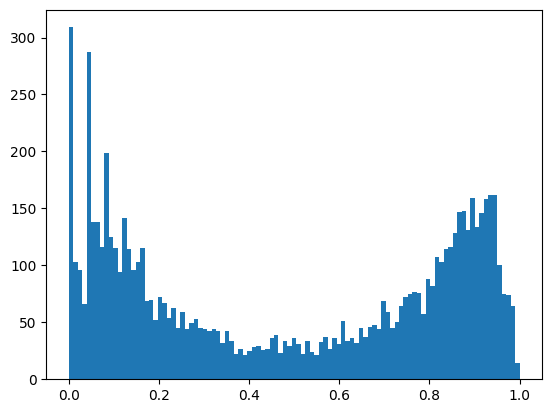

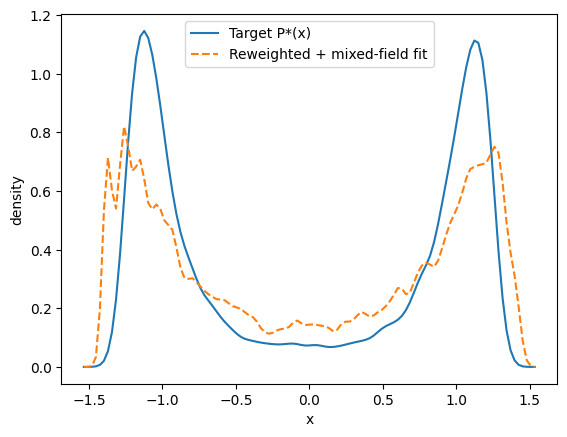

success: True
χ²*    : 0.07042665650393201
θ*     : (0.9862172158557061, 4.8399999999999865, 7.0434357416240525, 1.0, 0.4231983008620944, -0.011859581323514142)

=== Step: target eps_sp=4.860 (prev=4.840) ===
[μ=7.043436] f=m_dense-m_dilute=-0.0564
[equal-ρ] μ0=7.043436, ΔA=A_dense-A_dilute=-0.0564, ESS≈7505
[equal-ρ] bracket μ=7.043336, ΔA=-0.0532, ESS≈7505
[equal-ρ] bracket μ=7.043236, ΔA=-0.0500, ESS≈7505
[equal-ρ] bracket μ=7.043136, ΔA=-0.0468, ESS≈7504
[equal-ρ] bracket μ=7.043036, ΔA=-0.0436, ESS≈7504
[equal-ρ] bracket μ=7.042936, ΔA=-0.0404, ESS≈7503
[equal-ρ] bracket μ=7.042836, ΔA=-0.0372, ESS≈7502
[equal-ρ] bracket μ=7.042736, ΔA=-0.0340, ESS≈7501
[equal-ρ] bracket μ=7.042636, ΔA=-0.0308, ESS≈7499
[equal-ρ] bracket μ=7.042536, ΔA=-0.0276, ESS≈7498
[equal-ρ] bracket μ=7.042436, ΔA=-0.0244, ESS≈7496
[equal-ρ] bracket μ=7.042336, ΔA=-0.0212, ESS≈7494
[equal-ρ] bracket μ=7.042236, ΔA=-0.0180, ESS≈7492
[equal-ρ] bracket μ=7.042136, ΔA=-0.0148, ESS≈7490
[equal-ρ] bracket μ=7.04203

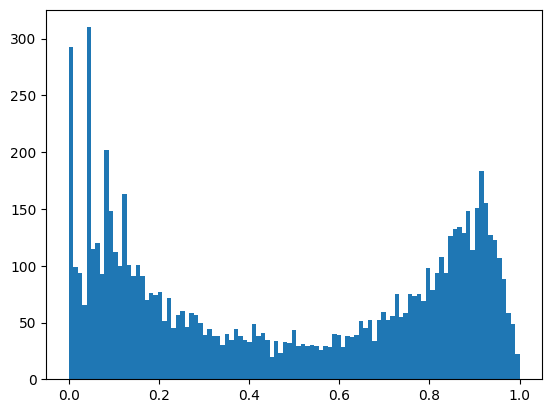

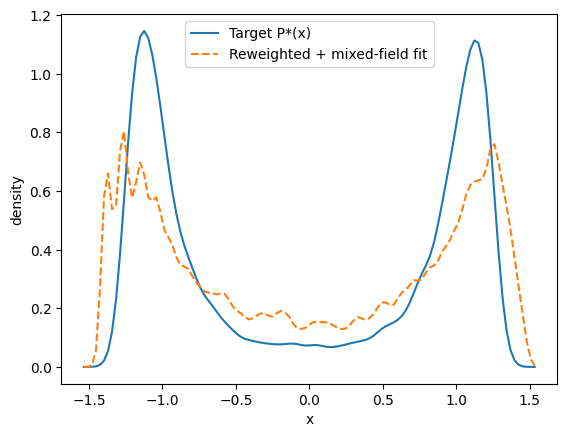

success: True
χ²*    : 0.20028317844338617
θ*     : (0.9945457967239404, 4.859999999999986, 7.058546142541628, 1.0, 0.33597104848189424, -0.016276394163823735)

=== Step: target eps_sp=4.880 (prev=4.860) ===
[μ=7.058546] f=m_dense-m_dilute=+0.5058
[step] μ=7.062546 f=+0.4108
[step] μ=7.066546 f=+0.2763
[step] μ=7.070546 f=+0.1876
[step] μ=7.074546 f=+0.0401
[equal-ρ] μ0=7.074546, ΔA=A_dense-A_dilute=+0.0401, ESS≈7505
[equal-ρ] bracket μ=7.074646, ΔA=+0.0368, ESS≈7505
[equal-ρ] bracket μ=7.074746, ΔA=+0.0335, ESS≈7505
[equal-ρ] bracket μ=7.074846, ΔA=+0.0302, ESS≈7504
[equal-ρ] bracket μ=7.074946, ΔA=+0.0269, ESS≈7503
[equal-ρ] bracket μ=7.075046, ΔA=+0.0236, ESS≈7503
[equal-ρ] bracket μ=7.075146, ΔA=+0.0203, ESS≈7502
[equal-ρ] bracket μ=7.075246, ΔA=+0.0170, ESS≈7500
[equal-ρ] bracket μ=7.075346, ΔA=+0.0137, ESS≈7499
[equal-ρ] bracket μ=7.075446, ΔA=+0.0103, ESS≈7497
[equal-ρ] bracket μ=7.075546, ΔA=+0.0070, ESS≈7495
[equal-ρ] bracket μ=7.075646, ΔA=+0.0037, ESS≈7493
[equal-ρ] bracket 

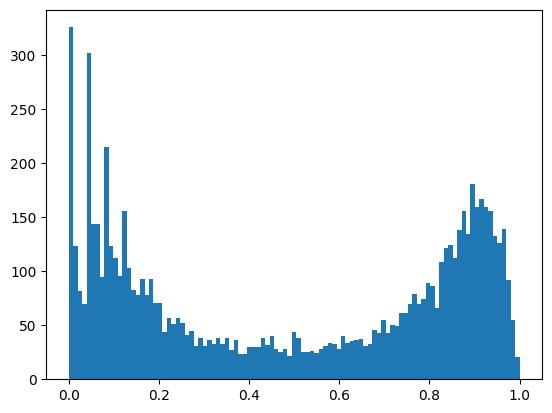

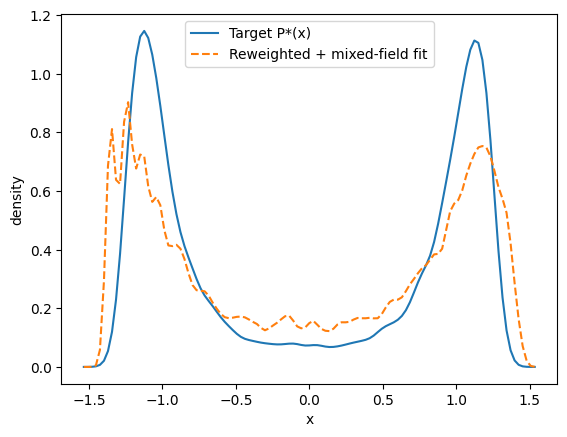

success: True
χ²*    : 0.15554728411516336
θ*     : (0.9885734670240617, 4.879999999999986, 7.0814981796715495, 1.0, 0.4899702966539267, 0.03915672578463501)

=== Step: target eps_sp=4.900 (prev=4.880) ===
[μ=7.081498] f=m_dense-m_dilute=+0.0541
[equal-ρ] μ0=7.081498, ΔA=A_dense-A_dilute=+0.0541, ESS≈7505
[equal-ρ] bracket μ=7.081598, ΔA=+0.0509, ESS≈7505
[equal-ρ] bracket μ=7.081698, ΔA=+0.0476, ESS≈7505
[equal-ρ] bracket μ=7.081798, ΔA=+0.0444, ESS≈7504
[equal-ρ] bracket μ=7.081898, ΔA=+0.0412, ESS≈7504
[equal-ρ] bracket μ=7.081998, ΔA=+0.0379, ESS≈7503
[equal-ρ] bracket μ=7.082098, ΔA=+0.0347, ESS≈7502
[equal-ρ] bracket μ=7.082198, ΔA=+0.0314, ESS≈7500
[equal-ρ] bracket μ=7.082298, ΔA=+0.0282, ESS≈7499
[equal-ρ] bracket μ=7.082398, ΔA=+0.0250, ESS≈7497
[equal-ρ] bracket μ=7.082498, ΔA=+0.0217, ESS≈7496
[equal-ρ] bracket μ=7.082598, ΔA=+0.0185, ESS≈7494
[equal-ρ] bracket μ=7.082698, ΔA=+0.0152, ESS≈7492
[equal-ρ] bracket μ=7.082798, ΔA=+0.0120, ESS≈7489
[equal-ρ] bracket μ=7.082898, 

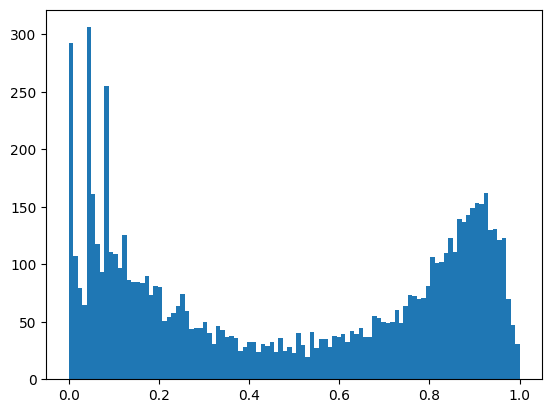

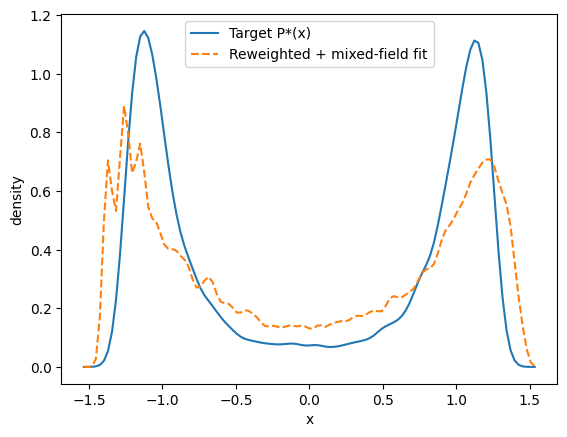

success: True
χ²*    : 0.12329185746063663
θ*     : (0.9844699513480359, 4.899999999999985, 7.091884944624883, 1.0, 0.439789929424101, 0.009447641383392536)

=== Step: target eps_sp=4.920 (prev=4.900) ===
[μ=7.091885] f=m_dense-m_dilute=+0.0308
[equal-ρ] μ0=7.091885, ΔA=A_dense-A_dilute=+0.0308, ESS≈7505
[equal-ρ] bracket μ=7.091985, ΔA=+0.0276, ESS≈7505
[equal-ρ] bracket μ=7.092085, ΔA=+0.0243, ESS≈7505
[equal-ρ] bracket μ=7.092185, ΔA=+0.0211, ESS≈7504
[equal-ρ] bracket μ=7.092285, ΔA=+0.0179, ESS≈7504
[equal-ρ] bracket μ=7.092385, ΔA=+0.0146, ESS≈7503
[equal-ρ] bracket μ=7.092485, ΔA=+0.0114, ESS≈7502
[equal-ρ] bracket μ=7.092585, ΔA=+0.0082, ESS≈7500
[equal-ρ] bracket μ=7.092685, ΔA=+0.0050, ESS≈7499
[equal-ρ] bracket μ=7.092785, ΔA=+0.0017, ESS≈7497
[equal-ρ] bracket μ=7.092885, ΔA=-0.0015, ESS≈7496
[equal-ρ] bisect μ=7.092385, ΔA=+0.0146, ESS≈7503
[equal-ρ] bisect μ=7.092635, ΔA=+0.0066, ESS≈7500
mu* = 7.092635   ESS ≈ 7500
0.48840906062624917


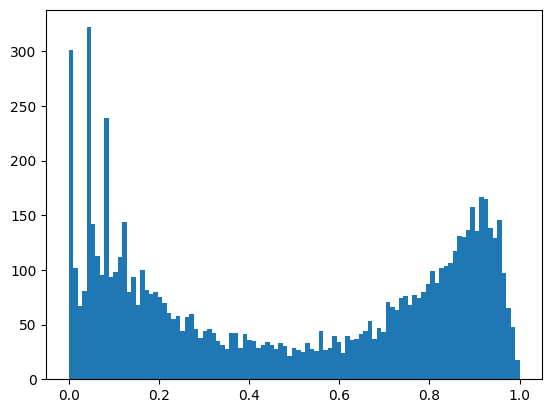

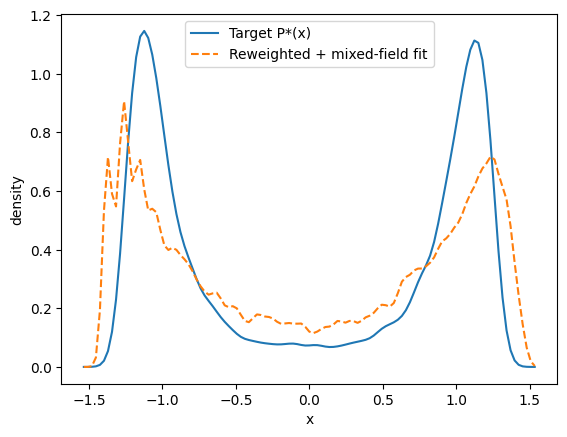

success: True
χ²*    : 0.160908640839516
θ*     : (0.9711824135023738, 4.919999999999985, 7.10592246173406, 1.0, 0.6506719854987542, 0.01984493832949723)

=== Step: target eps_sp=4.940 (prev=4.920) ===
[μ=7.105922] f=m_dense-m_dilute=-0.5459
[step] μ=7.101922 f=-0.4560
[step] μ=7.097922 f=-0.3494
[step] μ=7.093922 f=-0.2398
[step] μ=7.089922 f=-0.1031
[step] μ=7.085922 f=-0.0047
[equal-ρ] μ0=7.085922, ΔA=A_dense-A_dilute=-0.0047, ESS≈7505
mu* = 7.085922   ESS ≈ 7505
0.48792938041305794


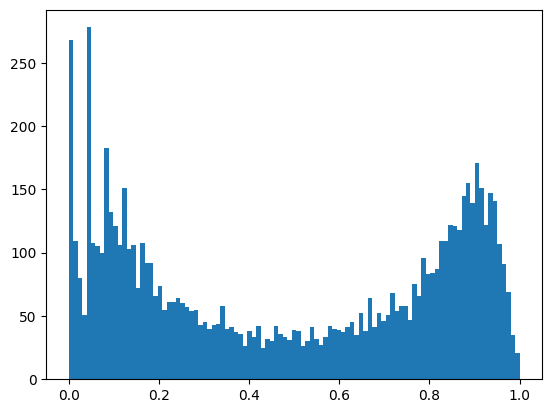

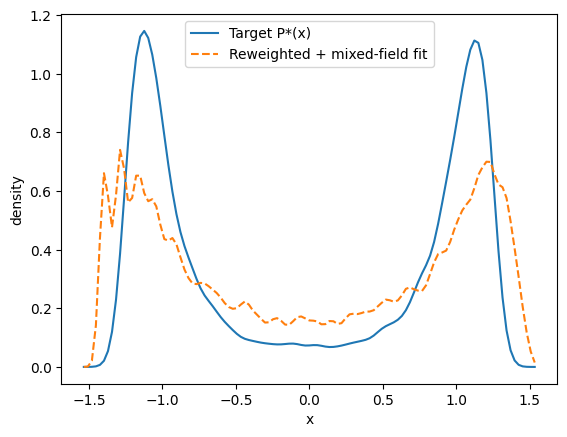

success: True
χ²*    : 0.2015933923577794
θ*     : (0.9687977508895442, 4.939999999999984, 7.092347185661336, 1.0, 0.40053280229430493, 0.013858032483534267)

=== Step: target eps_sp=4.960 (prev=4.940) ===
[μ=7.092347] f=m_dense-m_dilute=+0.2489
[step] μ=7.096347 f=+0.1375
[step] μ=7.100347 f=+0.0105
[equal-ρ] μ0=7.100347, ΔA=A_dense-A_dilute=+0.0105, ESS≈7505
[equal-ρ] bracket μ=7.100447, ΔA=+0.0074, ESS≈7505
[equal-ρ] bracket μ=7.100547, ΔA=+0.0043, ESS≈7505
[equal-ρ] bracket μ=7.100647, ΔA=+0.0012, ESS≈7504
[equal-ρ] bracket μ=7.100747, ΔA=-0.0020, ESS≈7504
[equal-ρ] bisect μ=7.100547, ΔA=+0.0043, ESS≈7505
mu* = 7.100547   ESS ≈ 7505
0.4842211858760826


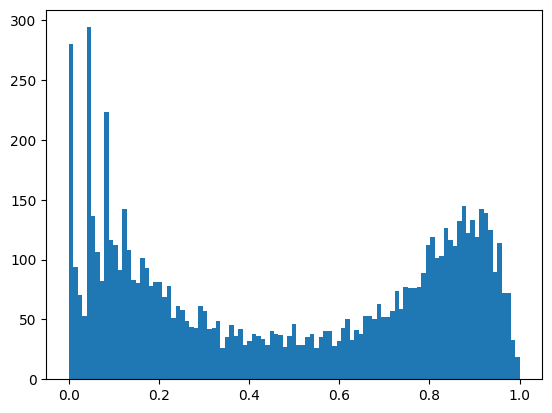

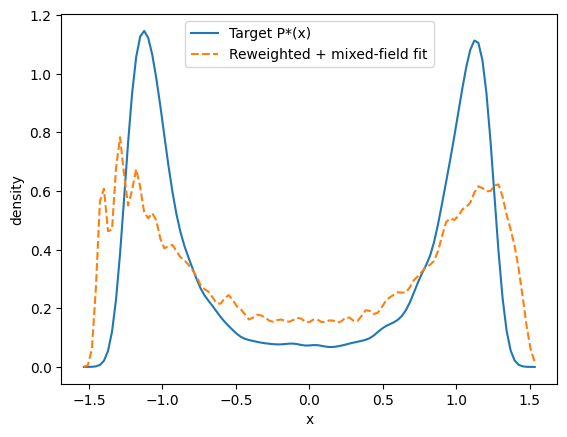

success: True
χ²*    : 0.2940918528078606
θ*     : (0.9887977508895442, 4.959999999999984, 7.120547185661335, 1.0, 0.2801748228333751, -0.013285149956435092)

=== Step: target eps_sp=4.980 (prev=4.960) ===
[μ=7.120547] f=m_dense-m_dilute=+0.8325
[step] μ=7.124547 f=+0.8036
[step] μ=7.128547 f=+0.7576
[step] μ=7.132547 f=+0.6875
[step] μ=7.136547 f=+0.5983
[step] μ=7.140547 f=+0.4994
[step] μ=7.144547 f=+0.4169
[step] μ=7.148547 f=+0.3127
[step] μ=7.152547 f=+0.1831
[step] μ=7.156547 f=+0.0605
[equal-ρ] μ0=7.156547, ΔA=A_dense-A_dilute=+0.0605, ESS≈7505
[equal-ρ] bracket μ=7.156647, ΔA=+0.0572, ESS≈7505
[equal-ρ] bracket μ=7.156747, ΔA=+0.0539, ESS≈7505
[equal-ρ] bracket μ=7.156847, ΔA=+0.0506, ESS≈7504
[equal-ρ] bracket μ=7.156947, ΔA=+0.0472, ESS≈7503
[equal-ρ] bracket μ=7.157047, ΔA=+0.0439, ESS≈7503
[equal-ρ] bracket μ=7.157147, ΔA=+0.0406, ESS≈7502
[equal-ρ] bracket μ=7.157247, ΔA=+0.0373, ESS≈7500
[equal-ρ] bracket μ=7.157347, ΔA=+0.0340, ESS≈7499
[equal-ρ] bracket μ=7.157447, ΔA=

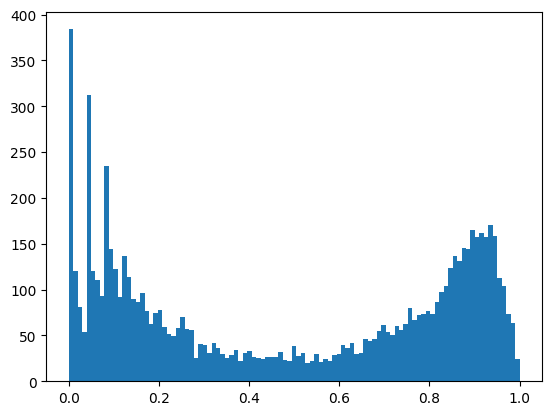

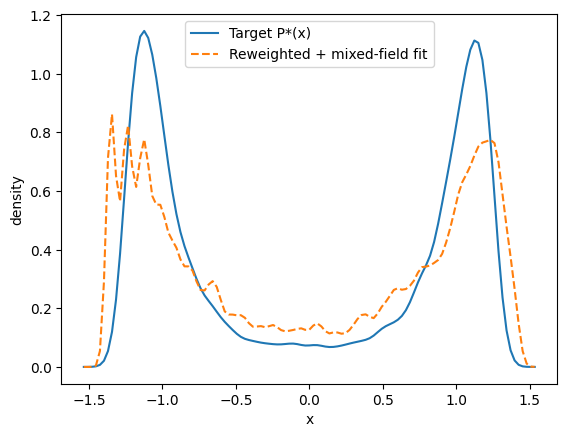

success: True
χ²*    : 0.2291579175647565
θ*     : (0.9799515098478234, 4.9799999999999836, 7.178209685661331, 1.0, 0.6104035029164556, -0.0018737340564317511)

=== Step: target eps_sp=5.000 (prev=4.980) ===
[μ=7.178210] f=m_dense-m_dilute=-0.5488
[step] μ=7.174210 f=-0.4618
[step] μ=7.170210 f=-0.3480
[step] μ=7.166210 f=-0.2252
[step] μ=7.162210 f=-0.0795
[equal-ρ] μ0=7.162210, ΔA=A_dense-A_dilute=-0.0795, ESS≈7505
[equal-ρ] bracket μ=7.162110, ΔA=-0.0763, ESS≈7505
[equal-ρ] bracket μ=7.162010, ΔA=-0.0730, ESS≈7505
[equal-ρ] bracket μ=7.161910, ΔA=-0.0698, ESS≈7504
[equal-ρ] bracket μ=7.161810, ΔA=-0.0665, ESS≈7503
[equal-ρ] bracket μ=7.161710, ΔA=-0.0632, ESS≈7503
[equal-ρ] bracket μ=7.161610, ΔA=-0.0600, ESS≈7502
[equal-ρ] bracket μ=7.161510, ΔA=-0.0567, ESS≈7500
[equal-ρ] bracket μ=7.161410, ΔA=-0.0535, ESS≈7499
[equal-ρ] bracket μ=7.161310, ΔA=-0.0502, ESS≈7497
[equal-ρ] bracket μ=7.161210, ΔA=-0.0469, ESS≈7496
[equal-ρ] bracket μ=7.161110, ΔA=-0.0436, ESS≈7494
[equal-ρ] bracket 

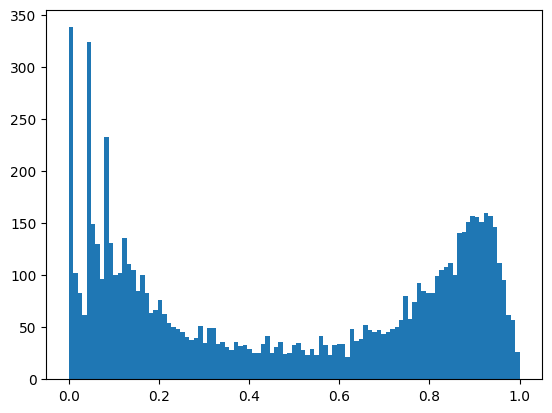

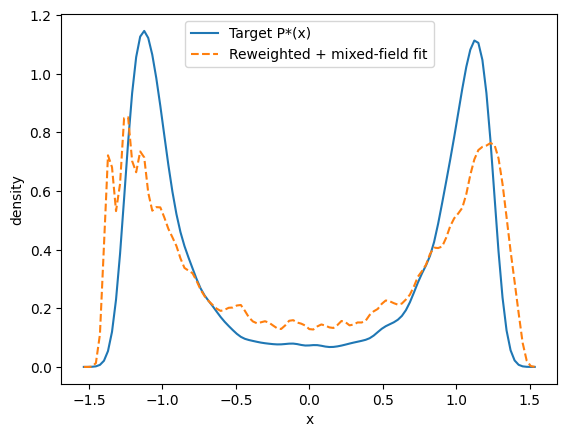

success: True
χ²*    : 0.09515525268121972
θ*     : (0.9751963021304635, 4.999999999999983, 7.170233772625405, 1.0, 0.39499797462198477, -0.01730831816791396)

=== Step: target eps_sp=5.020 (prev=5.000) ===
[μ=7.170234] f=m_dense-m_dilute=-0.0486
[equal-ρ] μ0=7.170234, ΔA=A_dense-A_dilute=-0.0486, ESS≈7505
[equal-ρ] bracket μ=7.170134, ΔA=-0.0454, ESS≈7505
[equal-ρ] bracket μ=7.170034, ΔA=-0.0422, ESS≈7505
[equal-ρ] bracket μ=7.169934, ΔA=-0.0389, ESS≈7504
[equal-ρ] bracket μ=7.169834, ΔA=-0.0357, ESS≈7504
[equal-ρ] bracket μ=7.169734, ΔA=-0.0325, ESS≈7503
[equal-ρ] bracket μ=7.169634, ΔA=-0.0293, ESS≈7502
[equal-ρ] bracket μ=7.169534, ΔA=-0.0260, ESS≈7500
[equal-ρ] bracket μ=7.169434, ΔA=-0.0228, ESS≈7499
[equal-ρ] bracket μ=7.169334, ΔA=-0.0196, ESS≈7497
[equal-ρ] bracket μ=7.169234, ΔA=-0.0163, ESS≈7496
[equal-ρ] bracket μ=7.169134, ΔA=-0.0131, ESS≈7494
[equal-ρ] bracket μ=7.169034, ΔA=-0.0099, ESS≈7492
[equal-ρ] bracket μ=7.168934, ΔA=-0.0066, ESS≈7489
[equal-ρ] bracket μ=7.168834,

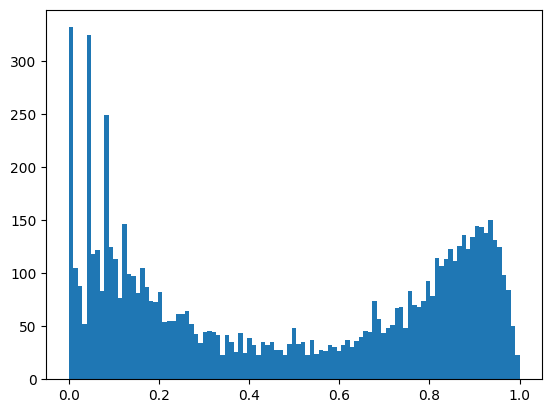

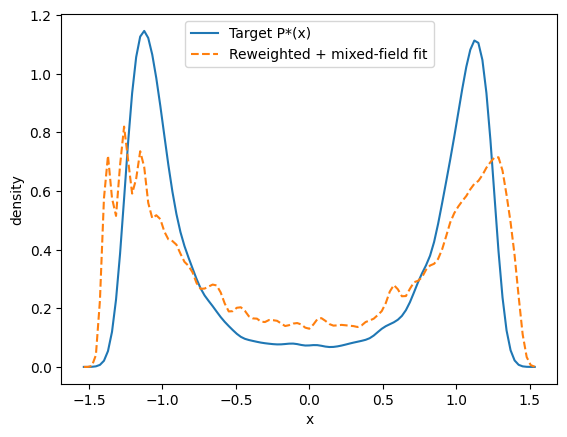

success: True
χ²*    : 0.15856004024865566
θ*     : (0.972290363628093, 5.019999999999983, 7.177986909575475, 1.0, 0.3338369385569026, -0.030649210073331833)

=== Step: target eps_sp=5.040 (prev=5.020) ===
[μ=7.177987] f=m_dense-m_dilute=+0.1534
[step] μ=7.181987 f=-0.0245
[equal-ρ] μ0=7.181987, ΔA=A_dense-A_dilute=-0.0245, ESS≈7505
[equal-ρ] bracket μ=7.181887, ΔA=-0.0213, ESS≈7505
[equal-ρ] bracket μ=7.181787, ΔA=-0.0181, ESS≈7505
[equal-ρ] bracket μ=7.181687, ΔA=-0.0149, ESS≈7504
[equal-ρ] bracket μ=7.181587, ΔA=-0.0117, ESS≈7504
[equal-ρ] bracket μ=7.181487, ΔA=-0.0085, ESS≈7503
[equal-ρ] bracket μ=7.181387, ΔA=-0.0053, ESS≈7502
[equal-ρ] bracket μ=7.181287, ΔA=-0.0021, ESS≈7501
[equal-ρ] bracket μ=7.181187, ΔA=+0.0011, ESS≈7499
[equal-ρ] bisect μ=7.181587, ΔA=-0.0117, ESS≈7504
[equal-ρ] bisect μ=7.181387, ΔA=-0.0053, ESS≈7502
mu* = 7.181387   ESS ≈ 7502
0.4871965356429047


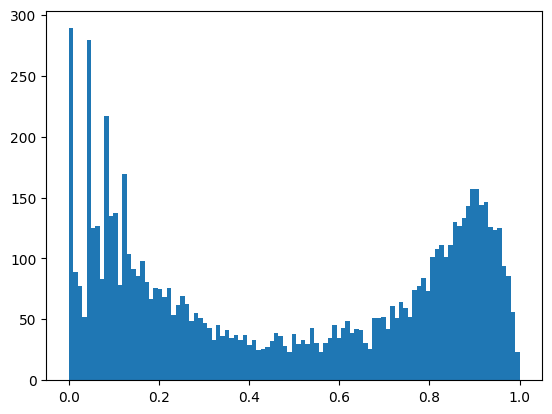

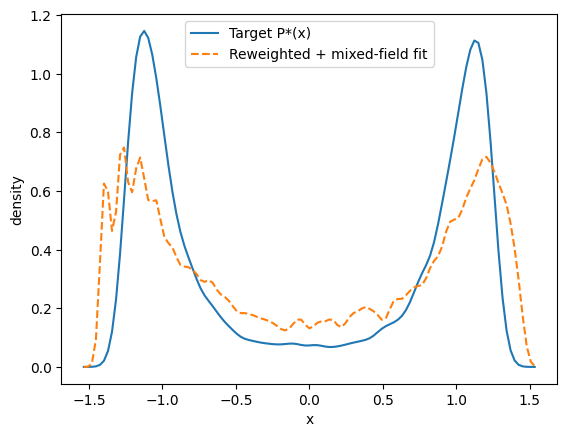

success: True
χ²*    : 0.2032046120235905
θ*     : (0.9698250423039785, 5.039999999999982, 7.188149883803557, 1.0, 0.3612155345708992, -0.0067565363119685175)

=== Step: target eps_sp=5.060 (prev=5.040) ===
[μ=7.188150] f=m_dense-m_dilute=+0.2352
[step] μ=7.192150 f=+0.1185
[step] μ=7.196150 f=-0.0352
[equal-ρ] μ0=7.196150, ΔA=A_dense-A_dilute=-0.0352, ESS≈7505
[equal-ρ] bracket μ=7.196050, ΔA=-0.0320, ESS≈7505
[equal-ρ] bracket μ=7.195950, ΔA=-0.0288, ESS≈7505
[equal-ρ] bracket μ=7.195850, ΔA=-0.0256, ESS≈7504
[equal-ρ] bracket μ=7.195750, ΔA=-0.0224, ESS≈7504
[equal-ρ] bracket μ=7.195650, ΔA=-0.0192, ESS≈7503
[equal-ρ] bracket μ=7.195550, ΔA=-0.0160, ESS≈7502
[equal-ρ] bracket μ=7.195450, ΔA=-0.0127, ESS≈7500
[equal-ρ] bracket μ=7.195350, ΔA=-0.0095, ESS≈7499
[equal-ρ] bracket μ=7.195250, ΔA=-0.0063, ESS≈7498
[equal-ρ] bracket μ=7.195150, ΔA=-0.0031, ESS≈7496
[equal-ρ] bracket μ=7.195050, ΔA=+0.0001, ESS≈7494
[equal-ρ] bisect μ=7.195600, ΔA=-0.0176, ESS≈7502
[equal-ρ] bisect μ=7.1953

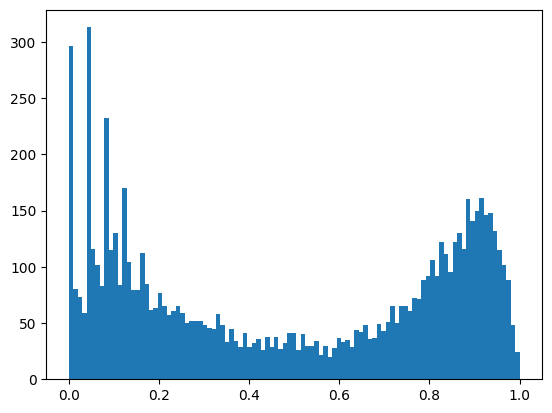

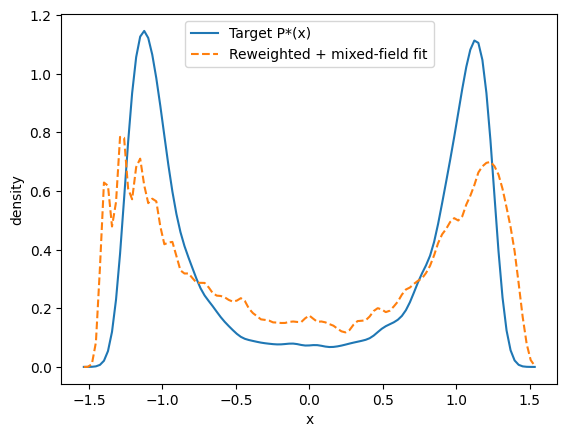

success: True
χ²*    : 0.18938141350152066
θ*     : (0.9647326872563615, 5.059999999999982, 7.20042787016401, 1.0, 0.40785113362889014, 0.010439153526301294)

=== Step: target eps_sp=5.080 (prev=5.060) ===
[μ=7.200428] f=m_dense-m_dilute=+0.1203
[step] μ=7.204428 f=-0.0040
[equal-ρ] μ0=7.204428, ΔA=A_dense-A_dilute=-0.0040, ESS≈7505
mu* = 7.204428   ESS ≈ 7505
0.4875882744836776


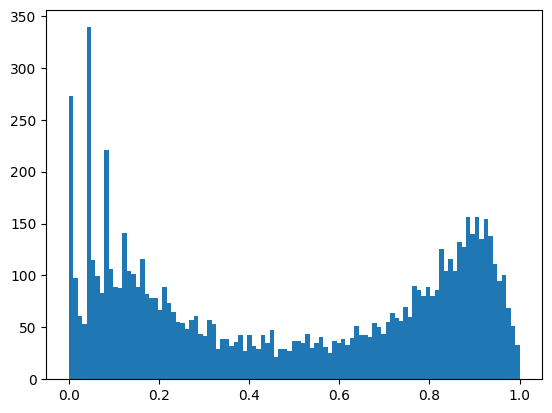

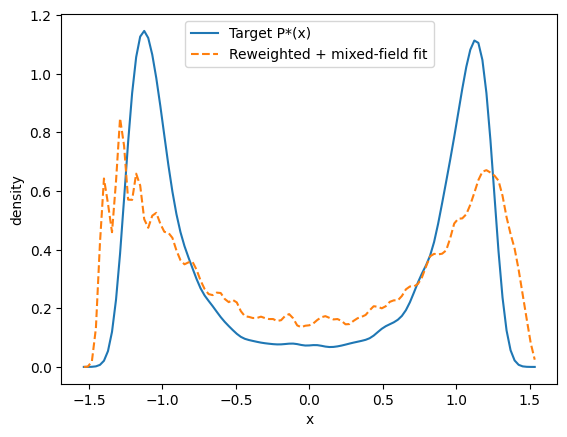

success: False
χ²*    : 0.1686625247835127
θ*     : (0.9592773045847552, 5.079999999999981, 7.209884755294223, 1.0, 0.42421046138407775, 0.014130253431303605)

=== Step: target eps_sp=5.100 (prev=5.080) ===
[μ=7.209885] f=m_dense-m_dilute=+0.0895
[equal-ρ] μ0=7.209885, ΔA=A_dense-A_dilute=+0.0895, ESS≈7505
[equal-ρ] bracket μ=7.209985, ΔA=+0.0864, ESS≈7505
[equal-ρ] bracket μ=7.210085, ΔA=+0.0833, ESS≈7505
[equal-ρ] bracket μ=7.210185, ΔA=+0.0802, ESS≈7504
[equal-ρ] bracket μ=7.210285, ΔA=+0.0771, ESS≈7504
[equal-ρ] bracket μ=7.210385, ΔA=+0.0740, ESS≈7503
[equal-ρ] bracket μ=7.210485, ΔA=+0.0708, ESS≈7502
[equal-ρ] bracket μ=7.210585, ΔA=+0.0677, ESS≈7501
[equal-ρ] bracket μ=7.210685, ΔA=+0.0646, ESS≈7499
[equal-ρ] bracket μ=7.210785, ΔA=+0.0615, ESS≈7498
[equal-ρ] bracket μ=7.210885, ΔA=+0.0583, ESS≈7496
[equal-ρ] bracket μ=7.210985, ΔA=+0.0552, ESS≈7494
[equal-ρ] bracket μ=7.211085, ΔA=+0.0521, ESS≈7492
[equal-ρ] bracket μ=7.211185, ΔA=+0.0489, ESS≈7490
[equal-ρ] bracket μ=7.211285,

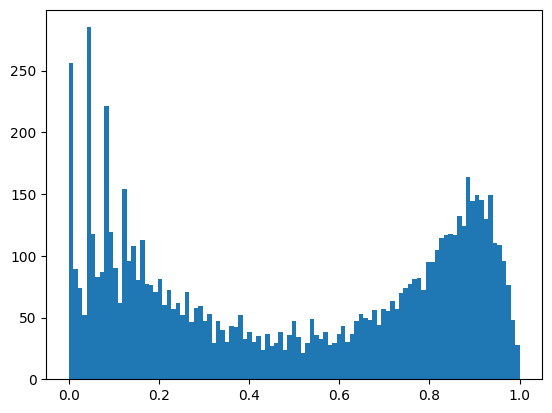

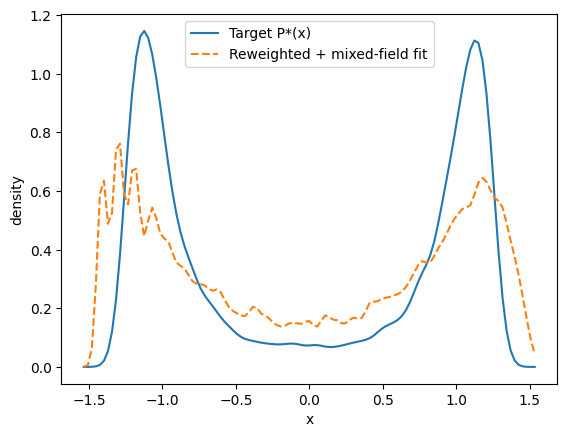

success: True
χ²*    : 0.2985565951023884
θ*     : (0.942091865312457, 5.099999999999981, 7.231884755294223, 1.0, 1.064483702467019, 0.09340705502705263)

=== Step: target eps_sp=5.120 (prev=5.100) ===
[μ=7.231885] f=m_dense-m_dilute=-0.7488
[step] μ=7.227885 f=-0.7141
[step] μ=7.223885 f=-0.6540
[step] μ=7.219885 f=-0.5757
[step] μ=7.215885 f=-0.4690
[step] μ=7.211885 f=-0.3881
[step] μ=7.207885 f=-0.2720
[step] μ=7.203885 f=-0.1852
[step] μ=7.199885 f=-0.0336
[equal-ρ] μ0=7.199885, ΔA=A_dense-A_dilute=-0.0336, ESS≈7505
[equal-ρ] bracket μ=7.199785, ΔA=-0.0306, ESS≈7505
[equal-ρ] bracket μ=7.199685, ΔA=-0.0276, ESS≈7505
[equal-ρ] bracket μ=7.199585, ΔA=-0.0246, ESS≈7504
[equal-ρ] bracket μ=7.199485, ΔA=-0.0216, ESS≈7504
[equal-ρ] bracket μ=7.199385, ΔA=-0.0186, ESS≈7503
[equal-ρ] bracket μ=7.199285, ΔA=-0.0156, ESS≈7502
[equal-ρ] bracket μ=7.199185, ΔA=-0.0126, ESS≈7501
[equal-ρ] bracket μ=7.199085, ΔA=-0.0096, ESS≈7500
[equal-ρ] bracket μ=7.198985, ΔA=-0.0067, ESS≈7498
[equal-ρ] brac

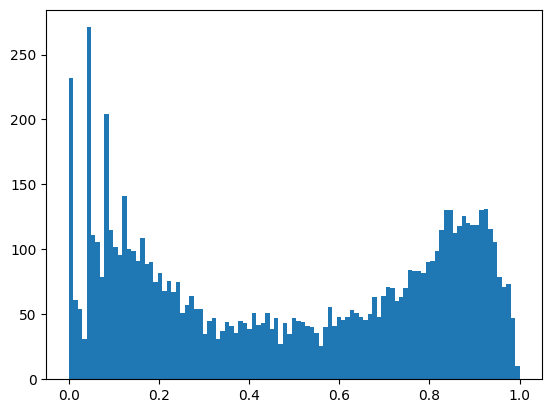

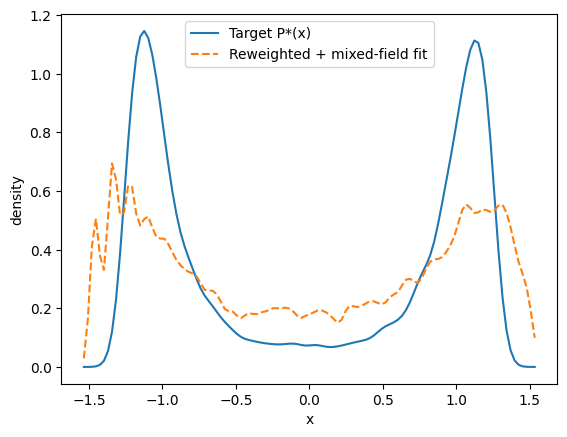

success: True
χ²*    : 0.20216892032909103
θ*     : (0.9382948158134503, 5.119999999999981, 7.202781988434689, 1.0, 0.38869389796592185, 0.010348272028741567)

=== Step: target eps_sp=5.140 (prev=5.120) ===
[μ=7.202782] f=m_dense-m_dilute=+0.1877
[step] μ=7.206782 f=+0.0827
[equal-ρ] μ0=7.206782, ΔA=A_dense-A_dilute=+0.0827, ESS≈7505
[equal-ρ] bracket μ=7.206882, ΔA=+0.0798, ESS≈7505
[equal-ρ] bracket μ=7.206982, ΔA=+0.0768, ESS≈7505
[equal-ρ] bracket μ=7.207082, ΔA=+0.0738, ESS≈7504
[equal-ρ] bracket μ=7.207182, ΔA=+0.0708, ESS≈7504
[equal-ρ] bracket μ=7.207282, ΔA=+0.0678, ESS≈7503
[equal-ρ] bracket μ=7.207382, ΔA=+0.0648, ESS≈7502
[equal-ρ] bracket μ=7.207482, ΔA=+0.0619, ESS≈7501
[equal-ρ] bracket μ=7.207582, ΔA=+0.0589, ESS≈7500
[equal-ρ] bracket μ=7.207682, ΔA=+0.0559, ESS≈7498
[equal-ρ] bracket μ=7.207782, ΔA=+0.0529, ESS≈7497
[equal-ρ] bracket μ=7.207882, ΔA=+0.0499, ESS≈7495
[equal-ρ] bracket μ=7.207982, ΔA=+0.0469, ESS≈7493
[equal-ρ] bracket μ=7.208082, ΔA=+0.0439, ESS≈7491
[

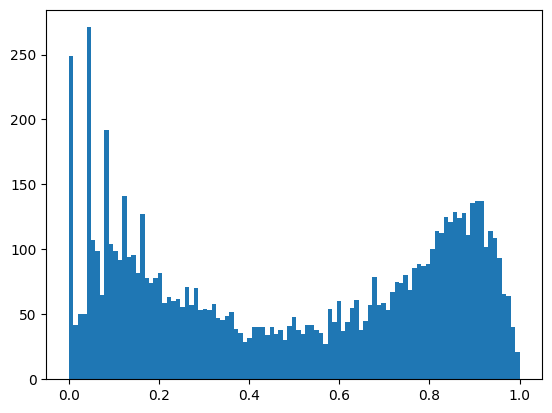

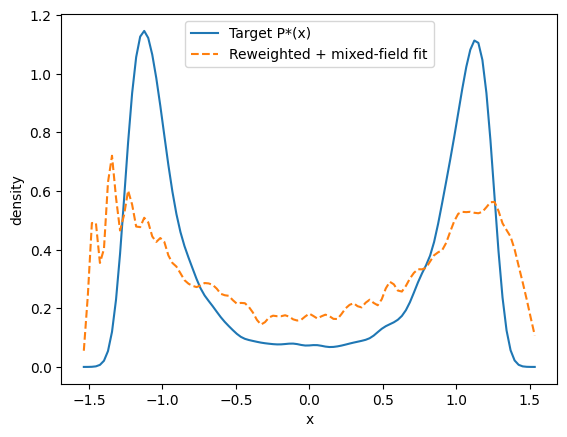

success: True
χ²*    : 0.2298620507164319
θ*     : (0.9359442305311845, 5.13999999999998, 7.211156242078188, 1.0, 0.43073944065303976, 0.04593935583216044)

=== Step: target eps_sp=5.160 (prev=5.140) ===
[μ=7.211156] f=m_dense-m_dilute=+0.3824
[step] μ=7.215156 f=+0.2548
[step] μ=7.219156 f=+0.1703
[step] μ=7.223156 f=+0.0293
[equal-ρ] μ0=7.223156, ΔA=A_dense-A_dilute=+0.0293, ESS≈7505
[equal-ρ] bracket μ=7.223256, ΔA=+0.0263, ESS≈7505
[equal-ρ] bracket μ=7.223356, ΔA=+0.0234, ESS≈7505
[equal-ρ] bracket μ=7.223456, ΔA=+0.0204, ESS≈7504
[equal-ρ] bracket μ=7.223556, ΔA=+0.0174, ESS≈7504
[equal-ρ] bracket μ=7.223656, ΔA=+0.0144, ESS≈7503
[equal-ρ] bracket μ=7.223756, ΔA=+0.0115, ESS≈7502
[equal-ρ] bracket μ=7.223856, ΔA=+0.0085, ESS≈7501
[equal-ρ] bracket μ=7.223956, ΔA=+0.0055, ESS≈7500
[equal-ρ] bracket μ=7.224056, ΔA=+0.0025, ESS≈7498
[equal-ρ] bracket μ=7.224156, ΔA=-0.0005, ESS≈7497
[equal-ρ] bisect μ=7.223656, ΔA=+0.0144, ESS≈7503
[equal-ρ] bisect μ=7.223906, ΔA=+0.0070, ESS≈7500
m

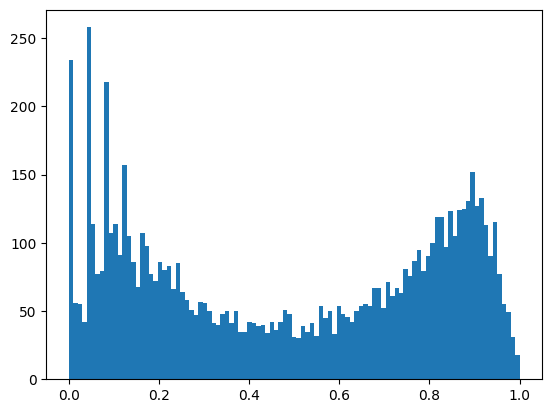

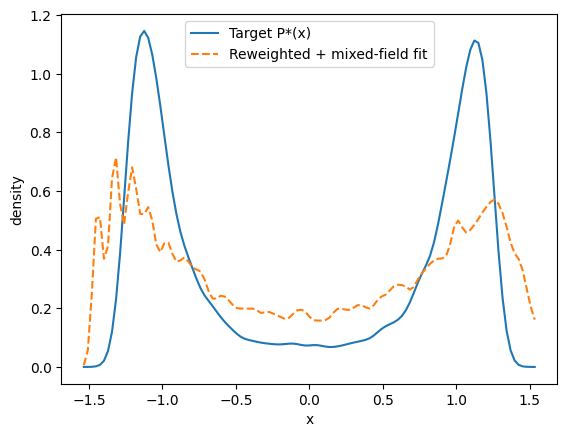

success: True
χ²*    : 0.2813833286309315
θ*     : (0.9159442305311845, 5.15999999999998, 7.243906242078186, 1.0, 1.0851841915088731, 0.0972435755266353)

=== Step: target eps_sp=5.180 (prev=5.160) ===
[μ=7.243906] f=m_dense-m_dilute=-0.8024
[step] μ=7.239906 f=-0.7584
[step] μ=7.235906 f=-0.7138
[step] μ=7.231906 f=-0.6449
[step] μ=7.227906 f=-0.5897
[step] μ=7.223906 f=-0.5041
[step] μ=7.219906 f=-0.4326
[step] μ=7.215906 f=-0.3086
[step] μ=7.211906 f=-0.1931
[step] μ=7.207906 f=-0.0965
[equal-ρ] μ0=7.207906, ΔA=A_dense-A_dilute=-0.0965, ESS≈7505
[equal-ρ] bracket μ=7.207806, ΔA=-0.0937, ESS≈7505
[equal-ρ] bracket μ=7.207706, ΔA=-0.0909, ESS≈7505
[equal-ρ] bracket μ=7.207606, ΔA=-0.0881, ESS≈7504
[equal-ρ] bracket μ=7.207506, ΔA=-0.0853, ESS≈7504
[equal-ρ] bracket μ=7.207406, ΔA=-0.0825, ESS≈7503
[equal-ρ] bracket μ=7.207306, ΔA=-0.0797, ESS≈7502
[equal-ρ] bracket μ=7.207206, ΔA=-0.0769, ESS≈7501
[equal-ρ] bracket μ=7.207106, ΔA=-0.0741, ESS≈7500
[equal-ρ] bracket μ=7.207006, ΔA=-0.0

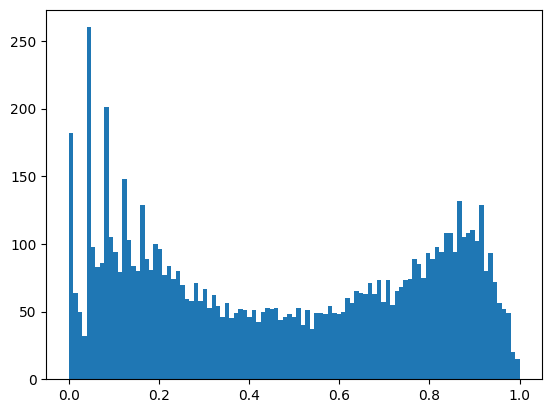

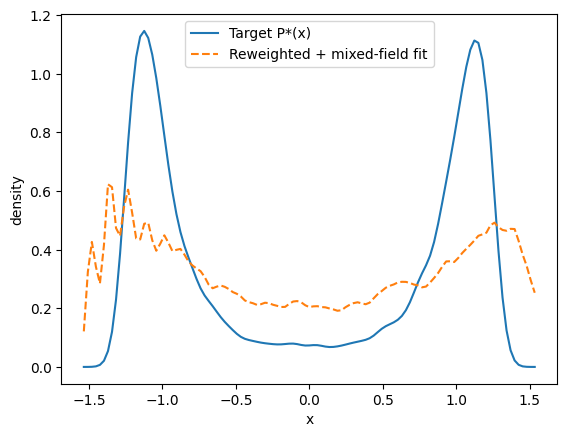

success: True
χ²*    : 0.26004909711265606
θ*     : (0.9359442305311845, 5.179999999999979, 7.225899723092986, 1.0, 0.32784062582142043, 0.005685955659619896)

=== Step: target eps_sp=5.200 (prev=5.180) ===
[μ=7.225900] f=m_dense-m_dilute=+0.7690
[step] μ=7.229900 f=+0.7310
[step] μ=7.233900 f=+0.6710
[step] μ=7.237900 f=+0.6127
[step] μ=7.241900 f=+0.5259
[step] μ=7.245900 f=+0.4013
[step] μ=7.249900 f=+0.3221
[step] μ=7.253900 f=+0.2181
[step] μ=7.257900 f=+0.1083
[step] μ=7.261900 f=-0.0001
[equal-ρ] μ0=7.261900, ΔA=A_dense-A_dilute=-0.0001, ESS≈7505
mu* = 7.261900   ESS ≈ 7505
0.4893244503664224


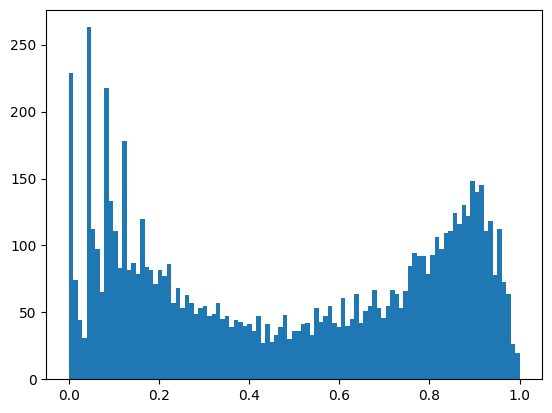

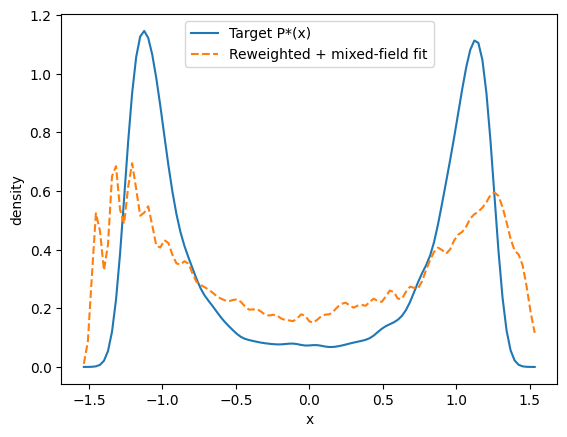

success: True
χ²*    : 0.22473595483487147
θ*     : (0.9329720618721496, 5.199999999999979, 7.264872213961164, 1.0, 0.42876414460808954, 0.040819165225303905)

=== Step: target eps_sp=5.220 (prev=5.200) ===
[μ=7.264872] f=m_dense-m_dilute=+0.2759
[step] μ=7.268872 f=+0.1703
[step] μ=7.272872 f=+0.0590
[equal-ρ] μ0=7.272872, ΔA=A_dense-A_dilute=+0.0590, ESS≈7505
[equal-ρ] bracket μ=7.272972, ΔA=+0.0560, ESS≈7505
[equal-ρ] bracket μ=7.273072, ΔA=+0.0531, ESS≈7505
[equal-ρ] bracket μ=7.273172, ΔA=+0.0501, ESS≈7504
[equal-ρ] bracket μ=7.273272, ΔA=+0.0471, ESS≈7504
[equal-ρ] bracket μ=7.273372, ΔA=+0.0441, ESS≈7503
[equal-ρ] bracket μ=7.273472, ΔA=+0.0411, ESS≈7502
[equal-ρ] bracket μ=7.273572, ΔA=+0.0381, ESS≈7501
[equal-ρ] bracket μ=7.273672, ΔA=+0.0352, ESS≈7500
[equal-ρ] bracket μ=7.273772, ΔA=+0.0322, ESS≈7498
[equal-ρ] bracket μ=7.273872, ΔA=+0.0292, ESS≈7497
[equal-ρ] bracket μ=7.273972, ΔA=+0.0262, ESS≈7495
[equal-ρ] bracket μ=7.274072, ΔA=+0.0232, ESS≈7493
[equal-ρ] bracket μ=7.27

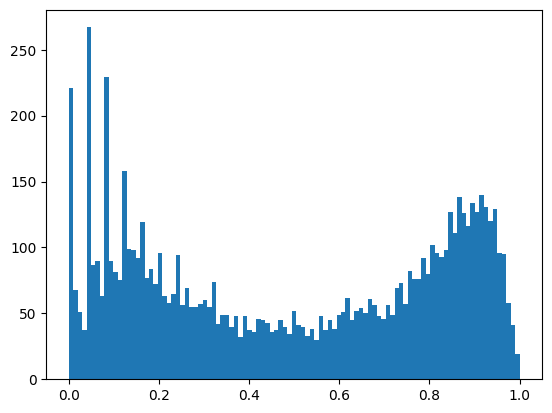

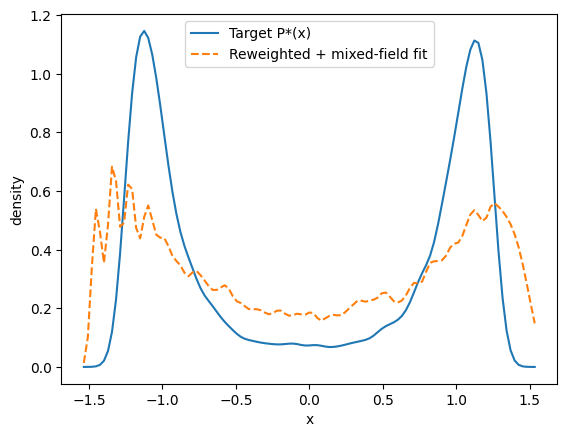

success: True
χ²*    : 0.28994420458848996
θ*     : (0.9129720618721496, 5.219999999999978, 7.294622213961162, 1.0, 1.1527483777528147, 0.10877138976947016)

=== Step: target eps_sp=5.240 (prev=5.220) ===
[μ=7.294622] f=m_dense-m_dilute=-0.7993
[step] μ=7.290622 f=-0.7702
[step] μ=7.286622 f=-0.7131
[step] μ=7.282622 f=-0.6580
[step] μ=7.278622 f=-0.5936
[step] μ=7.274622 f=-0.5203
[step] μ=7.270622 f=-0.4156
[step] μ=7.266622 f=-0.3233
[step] μ=7.262622 f=-0.2397
[step] μ=7.258622 f=-0.0947
[equal-ρ] μ0=7.258622, ΔA=A_dense-A_dilute=-0.0947, ESS≈7505
[equal-ρ] bracket μ=7.258522, ΔA=-0.0920, ESS≈7505
[equal-ρ] bracket μ=7.258422, ΔA=-0.0892, ESS≈7505
[equal-ρ] bracket μ=7.258322, ΔA=-0.0864, ESS≈7504
[equal-ρ] bracket μ=7.258222, ΔA=-0.0836, ESS≈7504
[equal-ρ] bracket μ=7.258122, ΔA=-0.0808, ESS≈7503
[equal-ρ] bracket μ=7.258022, ΔA=-0.0780, ESS≈7502
[equal-ρ] bracket μ=7.257922, ΔA=-0.0752, ESS≈7501
[equal-ρ] bracket μ=7.257822, ΔA=-0.0724, ESS≈7500
[equal-ρ] bracket μ=7.257722, ΔA=-

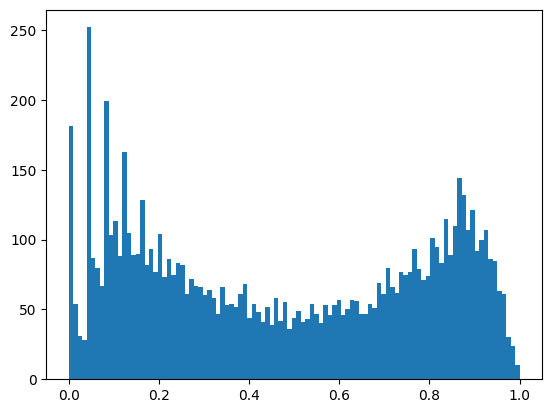

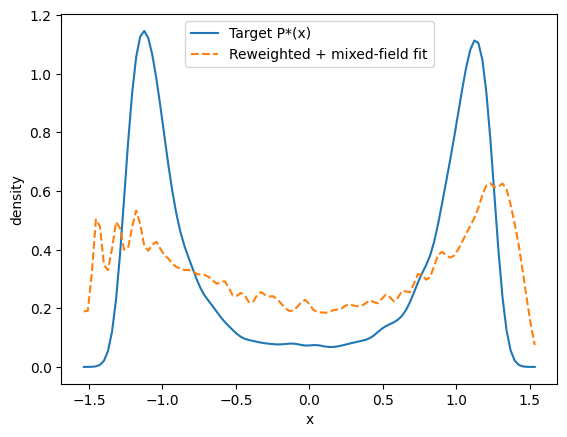

success: True
χ²*    : 0.24444008990639876
θ*     : (0.9129745669942869, 5.239999999999978, 7.256619701748743, 1.0, 0.16036628451831678, -0.0889482259438155)

=== Step: target eps_sp=5.260 (prev=5.240) ===
[μ=7.256620] f=m_dense-m_dilute=+0.4322
[step] μ=7.260620 f=+0.3580
[step] μ=7.264620 f=+0.2537
[step] μ=7.268620 f=+0.1418
[step] μ=7.272620 f=+0.0052
[equal-ρ] μ0=7.272620, ΔA=A_dense-A_dilute=+0.0052, ESS≈7505
mu* = 7.272620   ESS ≈ 7505
0.49445169886742174


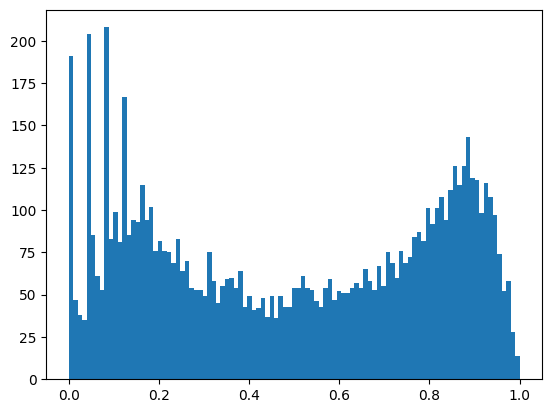

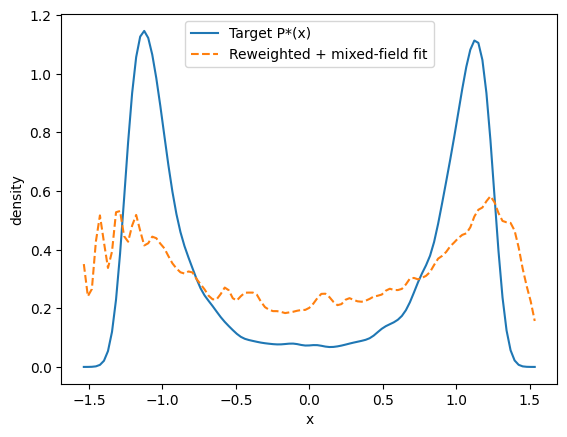

success: True
χ²*    : 0.24733068598613417
θ*     : (0.9129746023200241, 5.259999999999978, 7.2726196664230045, 1.0, 0.2851596360871106, -0.0191350223589295)

=== Step: target eps_sp=5.280 (prev=5.260) ===
[μ=7.272620] f=m_dense-m_dilute=+0.5131
[step] μ=7.276620 f=+0.4132
[step] μ=7.280620 f=+0.3170
[step] μ=7.284620 f=+0.2225
[step] μ=7.288620 f=+0.1127
[step] μ=7.292620 f=+0.0084
[equal-ρ] μ0=7.292620, ΔA=A_dense-A_dilute=+0.0084, ESS≈7505
mu* = 7.292620   ESS ≈ 7505
0.4943211192538308


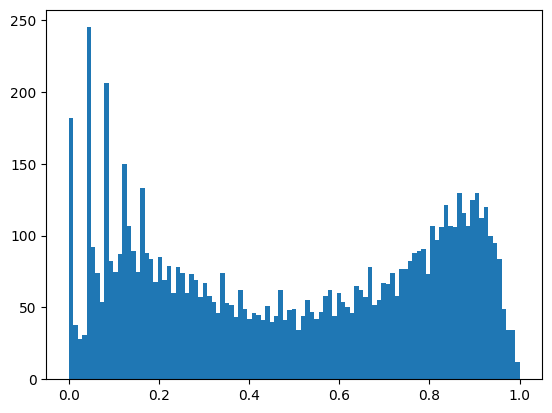

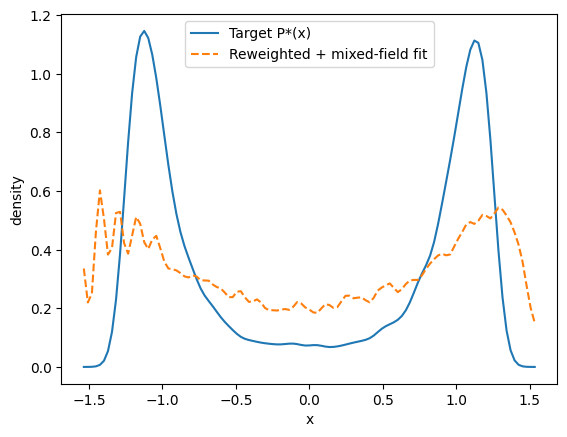

success: False
χ²*    : 0.22430438613844592
θ*     : (0.9329746023200242, 5.279999999999977, 7.312252646912388, 1.0, 0.3145742811820163, -0.008513967224281181)

=== Step: target eps_sp=5.300 (prev=5.280) ===
[μ=7.312253] f=m_dense-m_dilute=+0.8072
[step] μ=7.316253 f=+0.7487
[step] μ=7.320253 f=+0.7031
[step] μ=7.324253 f=+0.6589
[step] μ=7.328253 f=+0.5699
[step] μ=7.332253 f=+0.4759
[step] μ=7.336253 f=+0.3901
[step] μ=7.340253 f=+0.2925
[step] μ=7.344253 f=+0.1452
[step] μ=7.348253 f=+0.0456
[equal-ρ] μ0=7.348253, ΔA=A_dense-A_dilute=+0.0456, ESS≈7505
[equal-ρ] bracket μ=7.348353, ΔA=+0.0425, ESS≈7505
[equal-ρ] bracket μ=7.348453, ΔA=+0.0395, ESS≈7505
[equal-ρ] bracket μ=7.348553, ΔA=+0.0364, ESS≈7504
[equal-ρ] bracket μ=7.348653, ΔA=+0.0334, ESS≈7504
[equal-ρ] bracket μ=7.348753, ΔA=+0.0303, ESS≈7503
[equal-ρ] bracket μ=7.348853, ΔA=+0.0273, ESS≈7502
[equal-ρ] bracket μ=7.348953, ΔA=+0.0242, ESS≈7501
[equal-ρ] bracket μ=7.349053, ΔA=+0.0211, ESS≈7500
[equal-ρ] bracket μ=7.349153, Δ

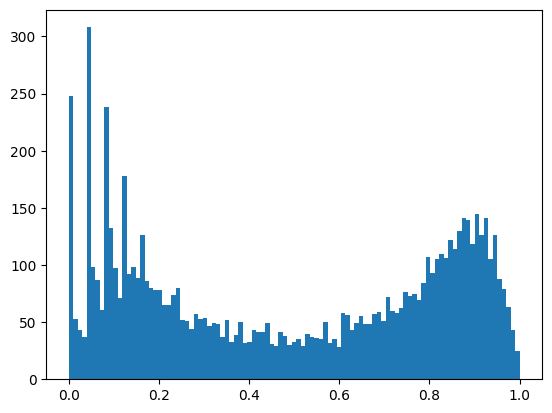

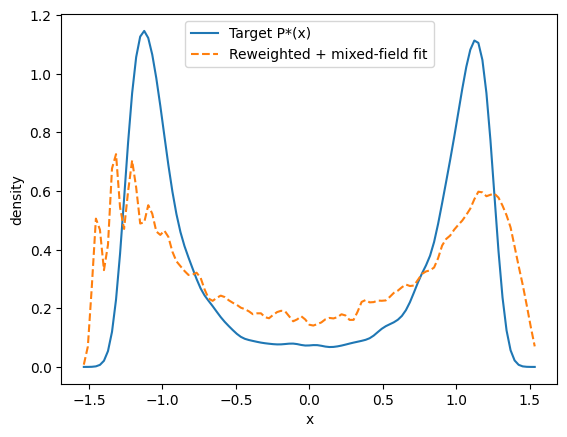

success: False
χ²*    : 0.228979296839309
θ*     : (0.9297146650878871, 5.299999999999977, 7.35283870360734, 1.0, 0.38553606682580355, 0.015555108396523331)

=== Step: target eps_sp=5.320 (prev=5.300) ===
[μ=7.352839] f=m_dense-m_dilute=+0.2933
[step] μ=7.356839 f=+0.1570
[step] μ=7.360839 f=+0.0581
[equal-ρ] μ0=7.360839, ΔA=A_dense-A_dilute=+0.0581, ESS≈7505
[equal-ρ] bracket μ=7.360939, ΔA=+0.0551, ESS≈7505
[equal-ρ] bracket μ=7.361039, ΔA=+0.0521, ESS≈7505
[equal-ρ] bracket μ=7.361139, ΔA=+0.0491, ESS≈7504
[equal-ρ] bracket μ=7.361239, ΔA=+0.0461, ESS≈7504
[equal-ρ] bracket μ=7.361339, ΔA=+0.0430, ESS≈7503
[equal-ρ] bracket μ=7.361439, ΔA=+0.0400, ESS≈7502
[equal-ρ] bracket μ=7.361539, ΔA=+0.0370, ESS≈7501
[equal-ρ] bracket μ=7.361639, ΔA=+0.0340, ESS≈7500
[equal-ρ] bracket μ=7.361739, ΔA=+0.0310, ESS≈7498
[equal-ρ] bracket μ=7.361839, ΔA=+0.0280, ESS≈7497
[equal-ρ] bracket μ=7.361939, ΔA=+0.0249, ESS≈7495
[equal-ρ] bracket μ=7.362039, ΔA=+0.0219, ESS≈7493
[equal-ρ] bracket μ=7.3621

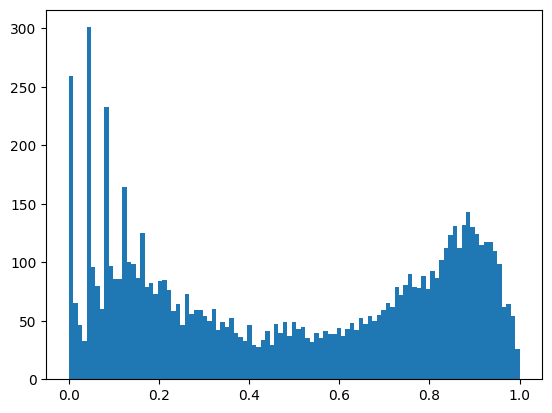

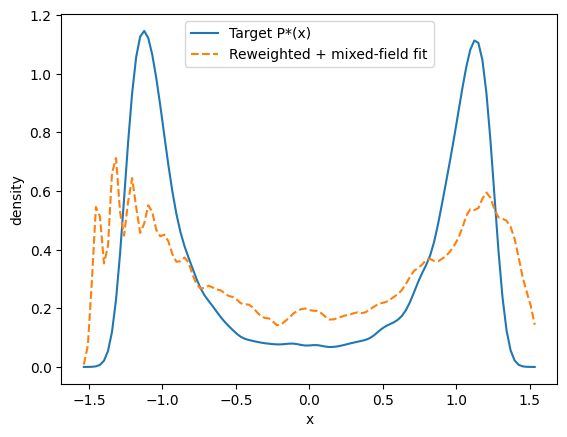

success: True
χ²*    : 0.29749305296015344
θ*     : (0.910190428222729, 5.319999999999976, 7.382588703607338, 1.0, 0.8268447078351245, 0.02986268515354932)

=== Step: target eps_sp=5.340 (prev=5.320) ===
[μ=7.382589] f=m_dense-m_dilute=-0.8073
[step] μ=7.378589 f=-0.7543
[step] μ=7.374589 f=-0.7213
[step] μ=7.370589 f=-0.6308
[step] μ=7.366589 f=-0.5706
[step] μ=7.362589 f=-0.4979
[step] μ=7.358589 f=-0.4153
[step] μ=7.354589 f=-0.3067
[step] μ=7.350589 f=-0.1831
[step] μ=7.346589 f=-0.0865
[equal-ρ] μ0=7.346589, ΔA=A_dense-A_dilute=-0.0865, ESS≈7505
[equal-ρ] bracket μ=7.346489, ΔA=-0.0837, ESS≈7505
[equal-ρ] bracket μ=7.346389, ΔA=-0.0809, ESS≈7505
[equal-ρ] bracket μ=7.346289, ΔA=-0.0780, ESS≈7504
[equal-ρ] bracket μ=7.346189, ΔA=-0.0752, ESS≈7504
[equal-ρ] bracket μ=7.346089, ΔA=-0.0724, ESS≈7503
[equal-ρ] bracket μ=7.345989, ΔA=-0.0696, ESS≈7502
[equal-ρ] bracket μ=7.345889, ΔA=-0.0668, ESS≈7501
[equal-ρ] bracket μ=7.345789, ΔA=-0.0640, ESS≈7500
[equal-ρ] bracket μ=7.345689, ΔA=-0

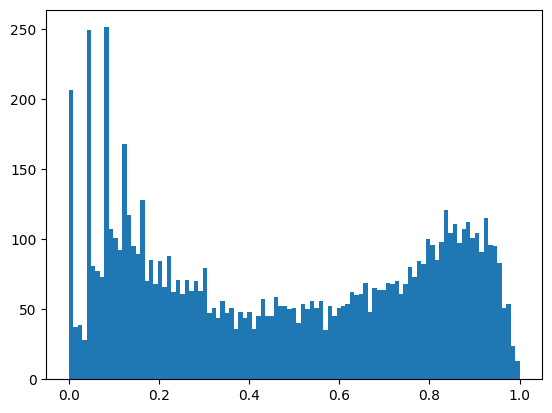

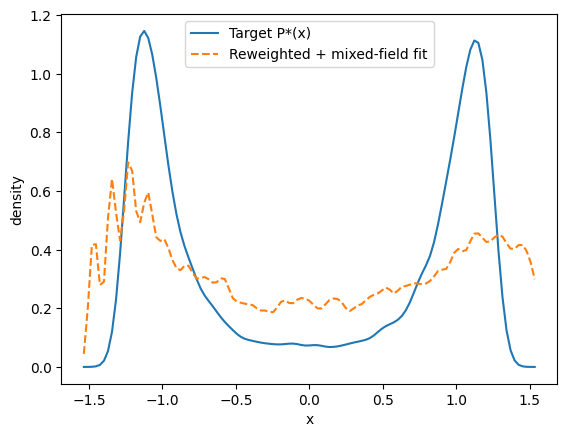

success: True
χ²*    : 0.2267565305931325
θ*     : (0.930190428222729, 5.339999999999976, 7.364582502757553, 1.0, 0.4466084336380114, 0.07341113947999763)

=== Step: target eps_sp=5.360 (prev=5.340) ===
[μ=7.364583] f=m_dense-m_dilute=+0.7852
[step] μ=7.368583 f=+0.7454


SystemError: CPUDispatcher(<function _mc_lattice_single_site_numba at 0x11785b880>) returned a result with an exception set

In [11]:
main(1.1039481231384089, 4.180000000000001, 6.665361)

[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=5.340 (prev=5.340) ===
[μ=7.604583] f=m_dense-m_dilute=-0.3338
[step] μ=7.600583 f=-0.1746
[step] μ=7.596583 f=-0.0381
[equal-ρ] μ0=7.596583, ΔA=A_dense-A_dilute=-0.0381, ESS≈7505
[equal-ρ] bracket μ=7.596483, ΔA=-0.0343, ESS≈7505
[equal-ρ] bracket μ=7.596383, ΔA=-0.0305, ESS≈7505
[equal-ρ] bracket μ=7.596283, ΔA=-0.0266, ESS≈7504
[equal-ρ] bracket μ=7.596183, ΔA=-0.0228, ESS≈7503
[equal-ρ] bracket μ=7.596083, ΔA=-0.0190, ESS≈7502
[equal-ρ] bracket μ=7.595983, ΔA=-0.0152, ESS≈7501
[equal-ρ] bracket μ=7.595883, ΔA=-0.0113, ESS≈7499
[equal-ρ] bracket μ=7.595783, ΔA=-0.0075, ESS≈7497
[equal-ρ] bracket μ=7.595683, ΔA=-0.0037, ESS≈7495
[equal-ρ] bracket μ=7.595583, ΔA=+0.0002, ESS≈7493
[equal-ρ] bisect μ=7.596083, ΔA=-0.0190, ESS≈7502
[equal-ρ] bisect μ=7.595833, ΔA=-0.0094, ESS≈7498
mu* = 7.595833   ESS ≈ 7498
0.48627981345769483


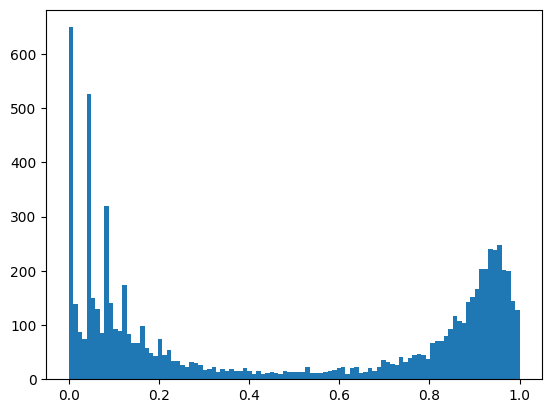

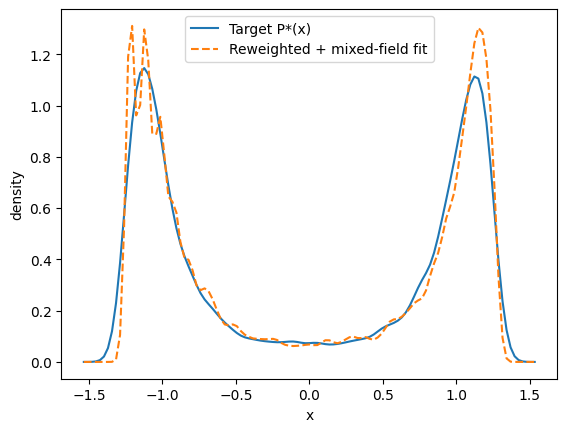

success: False
χ²*    : 0.04644234642782136
θ*     : (1.0299767622209965, 5.339999999999976, 7.5960463149793425, 0.9999999999966875, 0.4250327202051151, -0.02345751628368372)

=== Step: target eps_sp=5.360 (prev=5.340) ===
[μ=7.596046] f=m_dense-m_dilute=-0.0254
[equal-ρ] μ0=7.596046, ΔA=A_dense-A_dilute=-0.0254, ESS≈7505
[equal-ρ] bracket μ=7.595946, ΔA=-0.0216, ESS≈7505
[equal-ρ] bracket μ=7.595846, ΔA=-0.0178, ESS≈7505
[equal-ρ] bracket μ=7.595746, ΔA=-0.0139, ESS≈7504
[equal-ρ] bracket μ=7.595646, ΔA=-0.0101, ESS≈7503
[equal-ρ] bracket μ=7.595546, ΔA=-0.0063, ESS≈7502
[equal-ρ] bracket μ=7.595446, ΔA=-0.0024, ESS≈7501
[equal-ρ] bracket μ=7.595346, ΔA=+0.0014, ESS≈7499
[equal-ρ] bisect μ=7.595696, ΔA=-0.0120, ESS≈7504
[equal-ρ] bisect μ=7.595521, ΔA=-0.0053, ESS≈7502
mu* = 7.595521   ESS ≈ 7502
0.48828514323784145


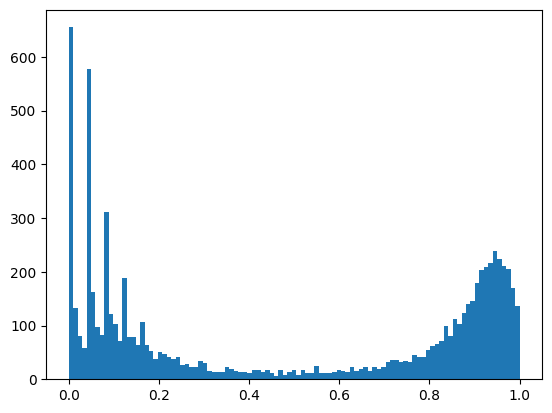

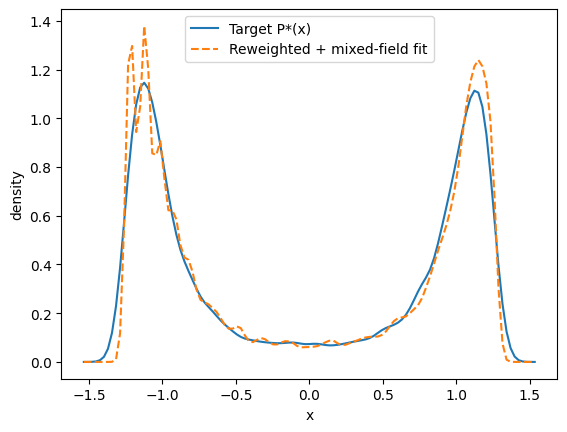

success: True
χ²*    : 0.054888128446251044
θ*     : (1.0201819170450233, 5.3599999999999755, 7.605318981904687, 0.9999999999969565, 0.4420758406905381, -0.019546672373540235)

=== Step: target eps_sp=5.380 (prev=5.360) ===
[μ=7.605319] f=m_dense-m_dilute=-0.3214
[step] μ=7.601319 f=-0.2717
[step] μ=7.597319 f=-0.0945
[equal-ρ] μ0=7.597319, ΔA=A_dense-A_dilute=-0.0945, ESS≈7505
[equal-ρ] bracket μ=7.597219, ΔA=-0.0907, ESS≈7505
[equal-ρ] bracket μ=7.597119, ΔA=-0.0869, ESS≈7505
[equal-ρ] bracket μ=7.597019, ΔA=-0.0832, ESS≈7504
[equal-ρ] bracket μ=7.596919, ΔA=-0.0794, ESS≈7503
[equal-ρ] bracket μ=7.596819, ΔA=-0.0756, ESS≈7502
[equal-ρ] bracket μ=7.596719, ΔA=-0.0719, ESS≈7501
[equal-ρ] bracket μ=7.596619, ΔA=-0.0681, ESS≈7499
[equal-ρ] bracket μ=7.596519, ΔA=-0.0643, ESS≈7497
[equal-ρ] bracket μ=7.596419, ΔA=-0.0605, ESS≈7495
[equal-ρ] bracket μ=7.596319, ΔA=-0.0567, ESS≈7493
[equal-ρ] bracket μ=7.596219, ΔA=-0.0530, ESS≈7491
[equal-ρ] bracket μ=7.596119, ΔA=-0.0492, ESS≈7488
[equal-

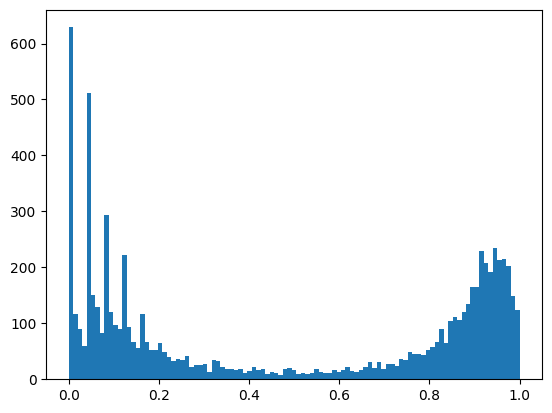

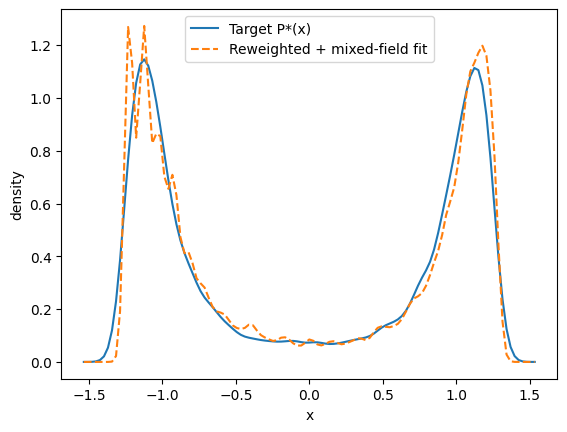

success: True
χ²*    : 0.04886907649437523
θ*     : (1.0107661311718912, 5.379999999999975, 7.605269742410973, 0.9999999999967293, 0.4394415720766446, -0.018950280253500568)

=== Step: target eps_sp=5.400 (prev=5.380) ===
[μ=7.605270] f=m_dense-m_dilute=-0.3574
[step] μ=7.601270 f=-0.2060
[step] μ=7.597270 f=-0.0728
[equal-ρ] μ0=7.597270, ΔA=A_dense-A_dilute=-0.0728, ESS≈7505
[equal-ρ] bracket μ=7.597170, ΔA=-0.0691, ESS≈7505
[equal-ρ] bracket μ=7.597070, ΔA=-0.0654, ESS≈7505
[equal-ρ] bracket μ=7.596970, ΔA=-0.0617, ESS≈7504
[equal-ρ] bracket μ=7.596870, ΔA=-0.0580, ESS≈7503
[equal-ρ] bracket μ=7.596770, ΔA=-0.0543, ESS≈7502
[equal-ρ] bracket μ=7.596670, ΔA=-0.0506, ESS≈7501
[equal-ρ] bracket μ=7.596570, ΔA=-0.0469, ESS≈7499
[equal-ρ] bracket μ=7.596470, ΔA=-0.0432, ESS≈7498
[equal-ρ] bracket μ=7.596370, ΔA=-0.0395, ESS≈7496
[equal-ρ] bracket μ=7.596270, ΔA=-0.0358, ESS≈7494
[equal-ρ] bracket μ=7.596170, ΔA=-0.0321, ESS≈7491
[equal-ρ] bracket μ=7.596070, ΔA=-0.0283, ESS≈7489
[equal-ρ]

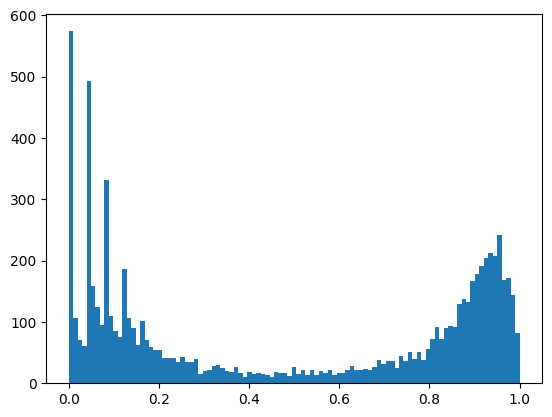

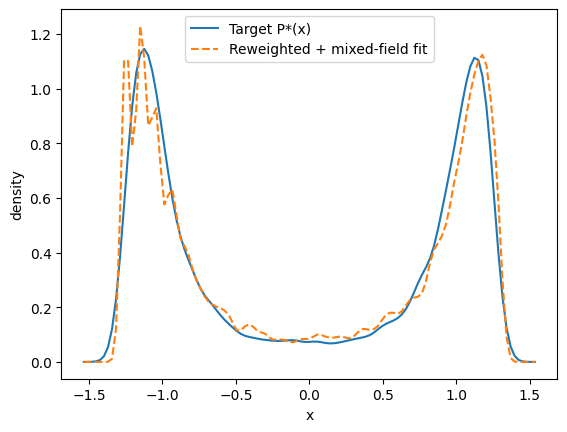

success: True
χ²*    : 0.0407999560187054
θ*     : (1.001144300384323, 5.399999999999975, 7.605197732498842, 0.9999999999986626, 0.47441334379221606, -0.006848843900410264)

=== Step: target eps_sp=5.420 (prev=5.400) ===
[μ=7.605198] f=m_dense-m_dilute=-0.3562
[step] μ=7.601198 f=-0.1876
[step] μ=7.597198 f=-0.0950
[equal-ρ] μ0=7.597198, ΔA=A_dense-A_dilute=-0.0950, ESS≈7505
[equal-ρ] bracket μ=7.597098, ΔA=-0.0914, ESS≈7505
[equal-ρ] bracket μ=7.596998, ΔA=-0.0877, ESS≈7505
[equal-ρ] bracket μ=7.596898, ΔA=-0.0841, ESS≈7504
[equal-ρ] bracket μ=7.596798, ΔA=-0.0804, ESS≈7503
[equal-ρ] bracket μ=7.596698, ΔA=-0.0768, ESS≈7502
[equal-ρ] bracket μ=7.596598, ΔA=-0.0732, ESS≈7501
[equal-ρ] bracket μ=7.596498, ΔA=-0.0695, ESS≈7500
[equal-ρ] bracket μ=7.596398, ΔA=-0.0658, ESS≈7498
[equal-ρ] bracket μ=7.596298, ΔA=-0.0622, ESS≈7496
[equal-ρ] bracket μ=7.596198, ΔA=-0.0585, ESS≈7494
[equal-ρ] bracket μ=7.596098, ΔA=-0.0549, ESS≈7491
[equal-ρ] bracket μ=7.595998, ΔA=-0.0512, ESS≈7489
[equal-ρ] 

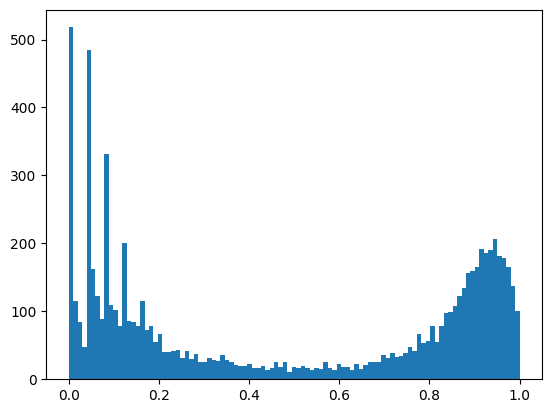

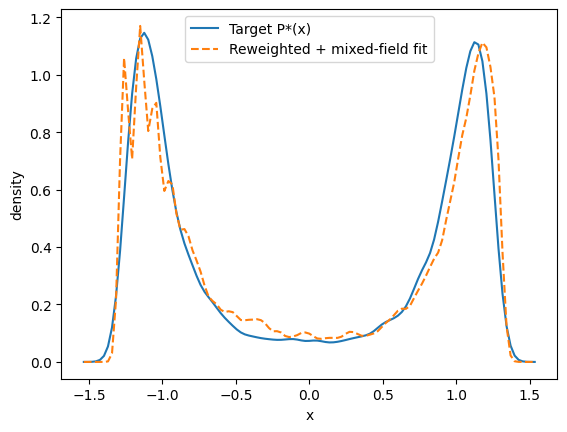

success: True
χ²*    : 0.03707677654243459
θ*     : (0.9915723545707886, 5.419999999999974, 7.604982578107194, 0.9999999999956725, 0.3741956385865299, -0.040073894821323536)

=== Step: target eps_sp=5.440 (prev=5.420) ===
[μ=7.604983] f=m_dense-m_dilute=-0.2736
[step] μ=7.600983 f=-0.1724
[step] μ=7.596983 f=-0.0446
[equal-ρ] μ0=7.596983, ΔA=A_dense-A_dilute=-0.0446, ESS≈7505
[equal-ρ] bracket μ=7.596883, ΔA=-0.0410, ESS≈7505
[equal-ρ] bracket μ=7.596783, ΔA=-0.0374, ESS≈7505
[equal-ρ] bracket μ=7.596683, ΔA=-0.0338, ESS≈7504
[equal-ρ] bracket μ=7.596583, ΔA=-0.0302, ESS≈7503
[equal-ρ] bracket μ=7.596483, ΔA=-0.0266, ESS≈7502
[equal-ρ] bracket μ=7.596383, ΔA=-0.0230, ESS≈7501
[equal-ρ] bracket μ=7.596283, ΔA=-0.0193, ESS≈7500
[equal-ρ] bracket μ=7.596183, ΔA=-0.0157, ESS≈7498
[equal-ρ] bracket μ=7.596083, ΔA=-0.0121, ESS≈7496
[equal-ρ] bracket μ=7.595983, ΔA=-0.0085, ESS≈7494
[equal-ρ] bracket μ=7.595883, ΔA=-0.0049, ESS≈7492
[equal-ρ] bracket μ=7.595783, ΔA=-0.0013, ESS≈7489
[equal-ρ]

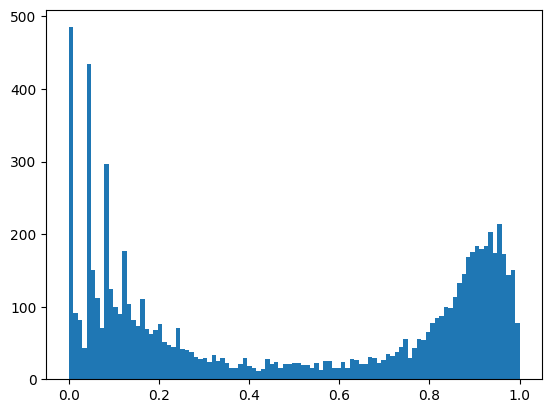

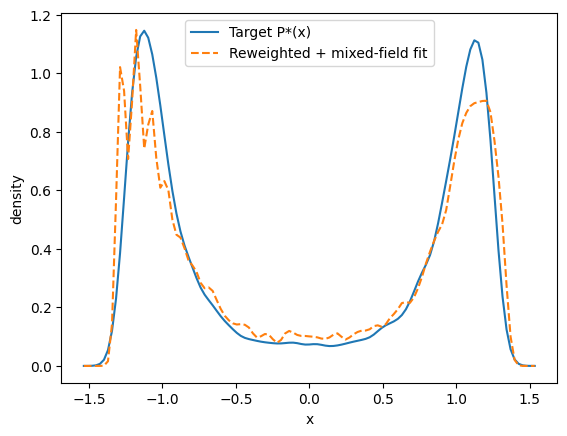

success: True
χ²*    : 0.03309510888321352
θ*     : (0.9819354306594891, 5.439999999999974, 7.605693359045548, 1.0000000000788827, 0.6343970191721181, 0.04466756847878242)

=== Step: target eps_sp=5.460 (prev=5.440) ===
[μ=7.605693] f=m_dense-m_dilute=-0.3075
[step] μ=7.601693 f=-0.1775
[step] μ=7.597693 f=-0.0557
[equal-ρ] μ0=7.597693, ΔA=A_dense-A_dilute=-0.0557, ESS≈7505
[equal-ρ] bracket μ=7.597593, ΔA=-0.0522, ESS≈7505
[equal-ρ] bracket μ=7.597493, ΔA=-0.0487, ESS≈7505
[equal-ρ] bracket μ=7.597393, ΔA=-0.0452, ESS≈7504
[equal-ρ] bracket μ=7.597293, ΔA=-0.0417, ESS≈7503
[equal-ρ] bracket μ=7.597193, ΔA=-0.0381, ESS≈7502
[equal-ρ] bracket μ=7.597093, ΔA=-0.0346, ESS≈7501
[equal-ρ] bracket μ=7.596993, ΔA=-0.0311, ESS≈7500
[equal-ρ] bracket μ=7.596893, ΔA=-0.0276, ESS≈7498
[equal-ρ] bracket μ=7.596793, ΔA=-0.0241, ESS≈7496
[equal-ρ] bracket μ=7.596693, ΔA=-0.0206, ESS≈7494
[equal-ρ] bracket μ=7.596593, ΔA=-0.0171, ESS≈7492
[equal-ρ] bracket μ=7.596493, ΔA=-0.0135, ESS≈7490
[equal-ρ] b

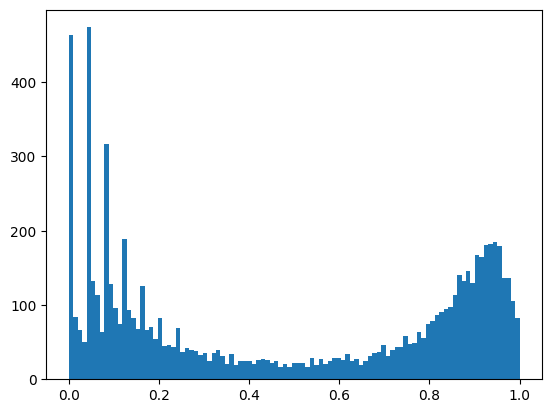

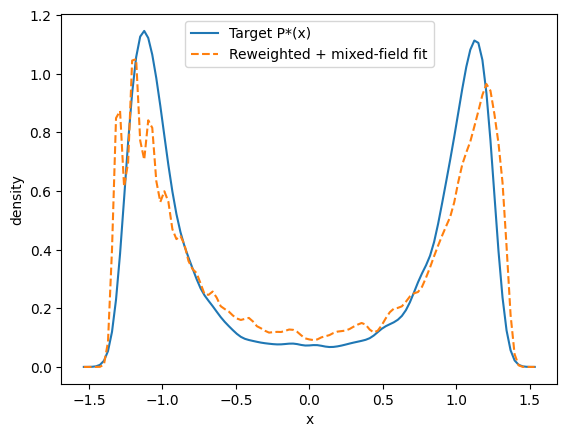

success: True
χ²*    : 0.11152669724182457
θ*     : (0.9740999749635172, 5.459999999999973, 7.604128962788654, 0.9999999999834966, 0.360835461991952, -0.030041346494826992)

=== Step: target eps_sp=5.480 (prev=5.460) ===
[μ=7.604129] f=m_dense-m_dilute=-0.1476
[step] μ=7.600129 f=-0.0113
[equal-ρ] μ0=7.600129, ΔA=A_dense-A_dilute=-0.0113, ESS≈7505
[equal-ρ] bracket μ=7.600029, ΔA=-0.0078, ESS≈7505
[equal-ρ] bracket μ=7.599929, ΔA=-0.0043, ESS≈7505
[equal-ρ] bracket μ=7.599829, ΔA=-0.0008, ESS≈7504
[equal-ρ] bracket μ=7.599729, ΔA=+0.0027, ESS≈7503
[equal-ρ] bisect μ=7.599929, ΔA=-0.0043, ESS≈7505
mu* = 7.599929   ESS ≈ 7505
0.4938307794803464


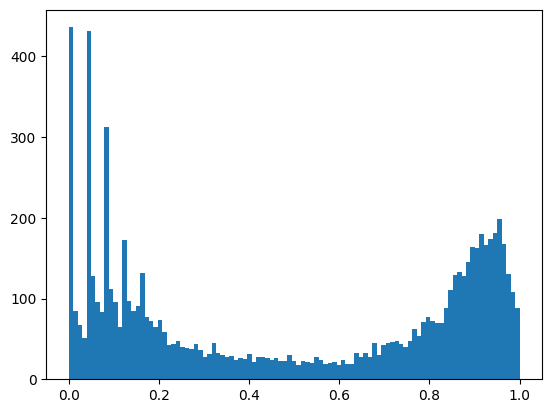

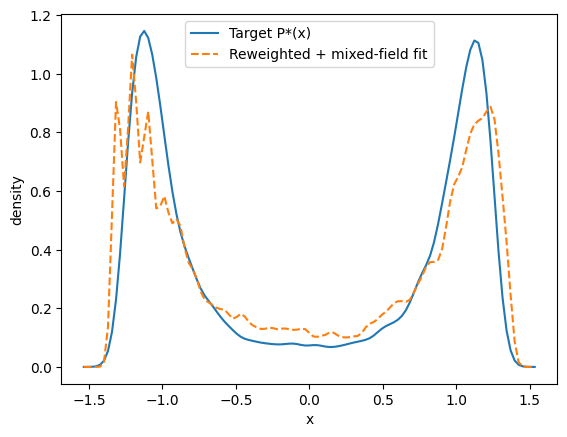

success: True
χ²*    : 0.03843325479944977
θ*     : (0.9647010953802542, 5.479999999999973, 7.609327842371917, 1.000000000024983, 0.5323568773977889, 0.014263881731886916)

=== Step: target eps_sp=5.500 (prev=5.480) ===
[μ=7.609328] f=m_dense-m_dilute=-0.2818
[step] μ=7.605328 f=-0.1292
[step] μ=7.601328 f=-0.0197
[equal-ρ] μ0=7.601328, ΔA=A_dense-A_dilute=-0.0197, ESS≈7505
[equal-ρ] bracket μ=7.601228, ΔA=-0.0163, ESS≈7505
[equal-ρ] bracket μ=7.601128, ΔA=-0.0129, ESS≈7505
[equal-ρ] bracket μ=7.601028, ΔA=-0.0094, ESS≈7504
[equal-ρ] bracket μ=7.600928, ΔA=-0.0060, ESS≈7503
[equal-ρ] bracket μ=7.600828, ΔA=-0.0025, ESS≈7502
[equal-ρ] bracket μ=7.600728, ΔA=+0.0009, ESS≈7501
[equal-ρ] bisect μ=7.601028, ΔA=-0.0094, ESS≈7504
mu* = 7.601028   ESS ≈ 7504
0.4936922051965356


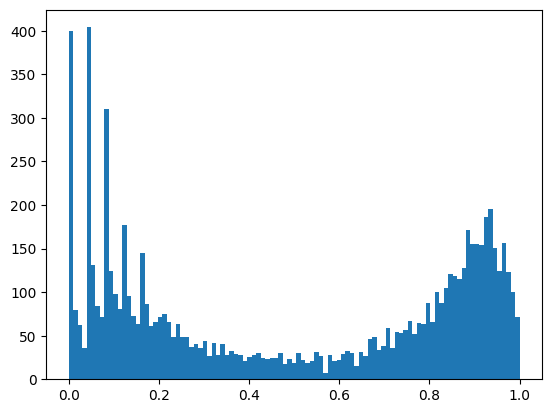

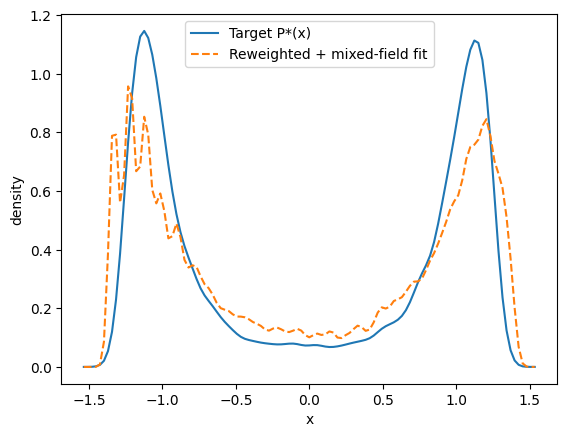

success: True
χ²*    : 0.05926270581274661
θ*     : (0.9559720137475604, 5.4999999999999725, 7.609722830443173, 1.0000000000292715, 0.5216510940722522, 0.018072219531758638)

=== Step: target eps_sp=5.520 (prev=5.500) ===
[μ=7.609723] f=m_dense-m_dilute=-0.2332
[step] μ=7.605723 f=-0.0981
[equal-ρ] μ0=7.605723, ΔA=A_dense-A_dilute=-0.0981, ESS≈7505
[equal-ρ] bracket μ=7.605623, ΔA=-0.0948, ESS≈7505
[equal-ρ] bracket μ=7.605523, ΔA=-0.0915, ESS≈7505
[equal-ρ] bracket μ=7.605423, ΔA=-0.0881, ESS≈7504
[equal-ρ] bracket μ=7.605323, ΔA=-0.0848, ESS≈7503
[equal-ρ] bracket μ=7.605223, ΔA=-0.0815, ESS≈7503
[equal-ρ] bracket μ=7.605123, ΔA=-0.0782, ESS≈7501
[equal-ρ] bracket μ=7.605023, ΔA=-0.0749, ESS≈7500
[equal-ρ] bracket μ=7.604923, ΔA=-0.0715, ESS≈7499
[equal-ρ] bracket μ=7.604823, ΔA=-0.0682, ESS≈7497
[equal-ρ] bracket μ=7.604723, ΔA=-0.0649, ESS≈7495
[equal-ρ] bracket μ=7.604623, ΔA=-0.0616, ESS≈7493
[equal-ρ] bracket μ=7.604523, ΔA=-0.0582, ESS≈7491
[equal-ρ] bracket μ=7.604423, ΔA=-0.0

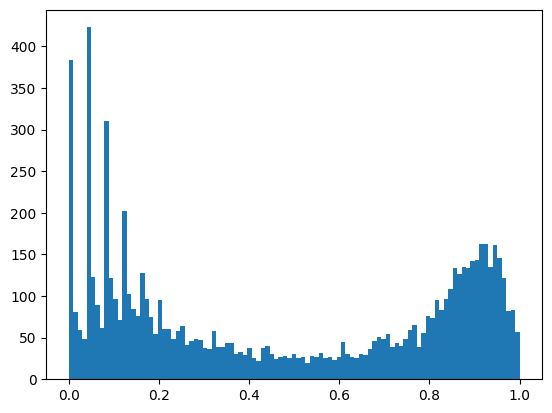

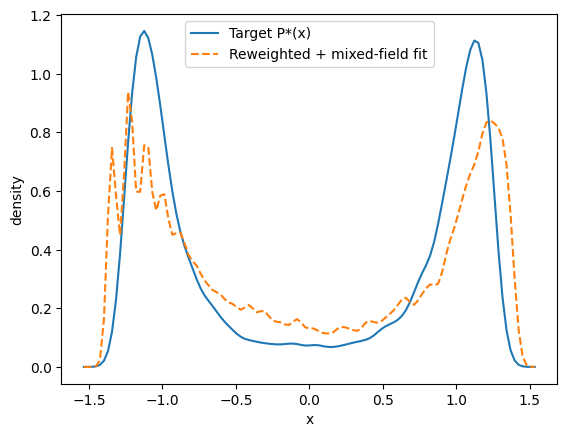

success: True
χ²*    : 0.10099827808963133
θ*     : (0.9476622377489363, 5.519999999999972, 7.612032920419835, 1.0, 0.298816556417503, -0.05525340835635748)

=== Step: target eps_sp=5.540 (prev=5.520) ===
[μ=7.612033] f=m_dense-m_dilute=-0.2302
[step] μ=7.608033 f=-0.0963
[equal-ρ] μ0=7.608033, ΔA=A_dense-A_dilute=-0.0963, ESS≈7505
[equal-ρ] bracket μ=7.607933, ΔA=-0.0931, ESS≈7505
[equal-ρ] bracket μ=7.607833, ΔA=-0.0898, ESS≈7505
[equal-ρ] bracket μ=7.607733, ΔA=-0.0865, ESS≈7504
[equal-ρ] bracket μ=7.607633, ΔA=-0.0832, ESS≈7503
[equal-ρ] bracket μ=7.607533, ΔA=-0.0800, ESS≈7503
[equal-ρ] bracket μ=7.607433, ΔA=-0.0767, ESS≈7502
[equal-ρ] bracket μ=7.607333, ΔA=-0.0734, ESS≈7500
[equal-ρ] bracket μ=7.607233, ΔA=-0.0701, ESS≈7499
[equal-ρ] bracket μ=7.607133, ΔA=-0.0669, ESS≈7497
[equal-ρ] bracket μ=7.607033, ΔA=-0.0636, ESS≈7495
[equal-ρ] bracket μ=7.606933, ΔA=-0.0603, ESS≈7493
[equal-ρ] bracket μ=7.606833, ΔA=-0.0570, ESS≈7491
[equal-ρ] bracket μ=7.606733, ΔA=-0.0537, ESS≈7489
[eq

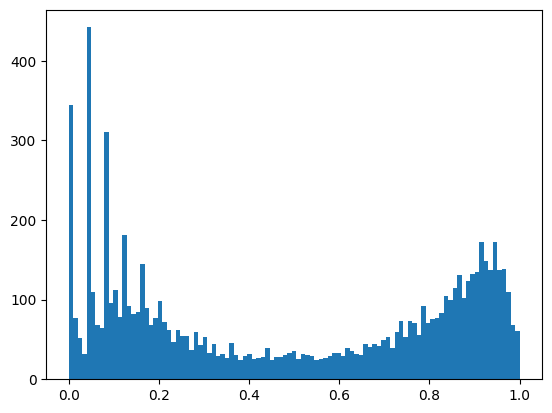

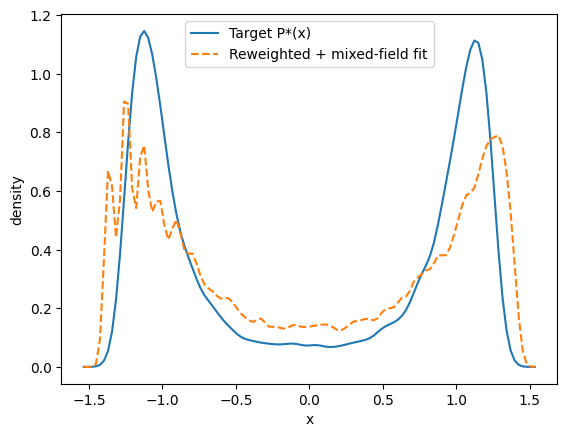

success: True
χ²*    : 0.06659703163214648
θ*     : (0.9428284284770712, 5.539999999999972, 7.619687487718434, 1.0, 0.3713877769284023, -0.03716634044166474)

=== Step: target eps_sp=5.560 (prev=5.540) ===
[μ=7.619687] f=m_dense-m_dilute=-0.1463
[step] μ=7.615687 f=-0.0217
[equal-ρ] μ0=7.615687, ΔA=A_dense-A_dilute=-0.0217, ESS≈7505
[equal-ρ] bracket μ=7.615587, ΔA=-0.0185, ESS≈7505
[equal-ρ] bracket μ=7.615487, ΔA=-0.0152, ESS≈7505
[equal-ρ] bracket μ=7.615387, ΔA=-0.0120, ESS≈7504
[equal-ρ] bracket μ=7.615287, ΔA=-0.0087, ESS≈7503
[equal-ρ] bracket μ=7.615187, ΔA=-0.0054, ESS≈7503
[equal-ρ] bracket μ=7.615087, ΔA=-0.0022, ESS≈7502
[equal-ρ] bracket μ=7.614987, ΔA=+0.0011, ESS≈7500
[equal-ρ] bisect μ=7.615337, ΔA=-0.0103, ESS≈7504
[equal-ρ] bisect μ=7.615162, ΔA=-0.0046, ESS≈7502
mu* = 7.615162   ESS ≈ 7502
0.49410926049300463


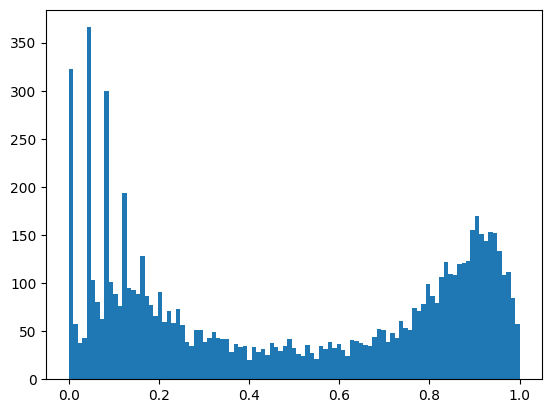

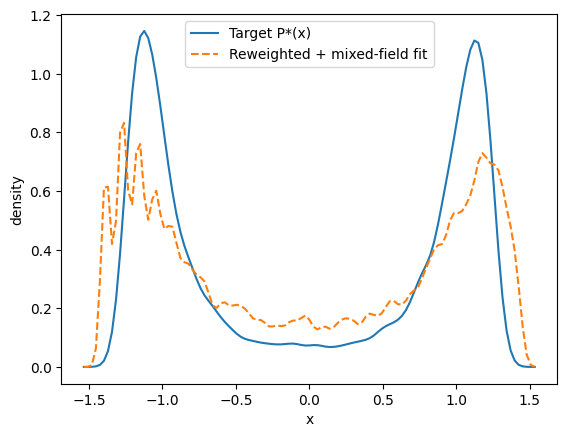

success: True
χ²*    : 0.17574200044565147
θ*     : (0.9398096070612431, 5.559999999999971, 7.6238161092766115, 1.0, 0.4329216060152508, 0.012845758682728897)

=== Step: target eps_sp=5.580 (prev=5.560) ===
[μ=7.623816] f=m_dense-m_dilute=+0.1436


SystemError: CPUDispatcher(<function _mc_lattice_single_site_numba at 0x11785b880>) returned a result with an exception set

In [14]:
main(1.030190428222729, 5.339999999999976, 7.604582502757553)

[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=5.560 (prev=5.560) ===
[μ=7.673816] f=m_dense-m_dilute=+0.4113
[step] μ=7.677816 f=+0.2821
[step] μ=7.681816 f=+0.1611
[step] μ=7.685816 f=+0.0528
[equal-ρ] μ0=7.685816, ΔA=A_dense-A_dilute=+0.0528, ESS≈7505
[equal-ρ] bracket μ=7.685916, ΔA=+0.0493, ESS≈7505
[equal-ρ] bracket μ=7.686016, ΔA=+0.0458, ESS≈7505
[equal-ρ] bracket μ=7.686116, ΔA=+0.0423, ESS≈7504
[equal-ρ] bracket μ=7.686216, ΔA=+0.0388, ESS≈7503
[equal-ρ] bracket μ=7.686316, ΔA=+0.0353, ESS≈7502
[equal-ρ] bracket μ=7.686416, ΔA=+0.0318, ESS≈7501
[equal-ρ] bracket μ=7.686516, ΔA=+0.0283, ESS≈7500
[equal-ρ] bracket μ=7.686616, ΔA=+0.0248, ESS≈7498
[equal-ρ] bracket μ=7.686716, ΔA=+0.0213, ESS≈7496
[equal-ρ] bracket μ=7.686816, ΔA=+0.0178, ESS≈7494
[equal-ρ] bracket μ=7.686916, ΔA=+0.0142, ESS≈7492
[equal-ρ] bracket μ=7.687016, ΔA=+0.0107, ESS≈7490
[equal-ρ] bracket μ=7.687116, ΔA=+0.0072, ESS≈748

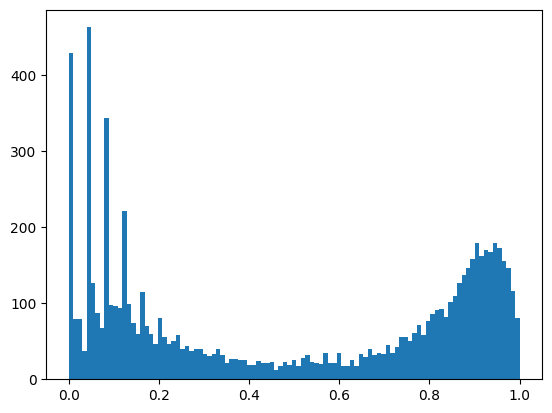

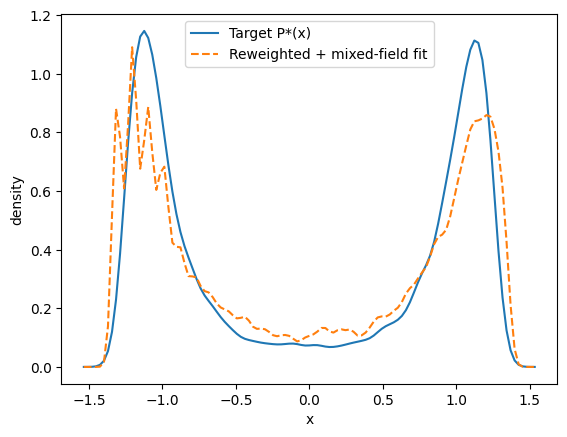

success: True
χ²*    : 0.04313739030552109
θ*     : (0.9696904199812989, 5.559999999999971, 7.687096922196666, 0.9999999999994625, 0.4924755616535188, -0.0011363338338119021)

=== Step: target eps_sp=5.580 (prev=5.560) ===
[μ=7.687097] f=m_dense-m_dilute=-0.0097
[equal-ρ] μ0=7.687097, ΔA=A_dense-A_dilute=-0.0097, ESS≈7505
mu* = 7.687097   ESS ≈ 7505
0.49056628914057293


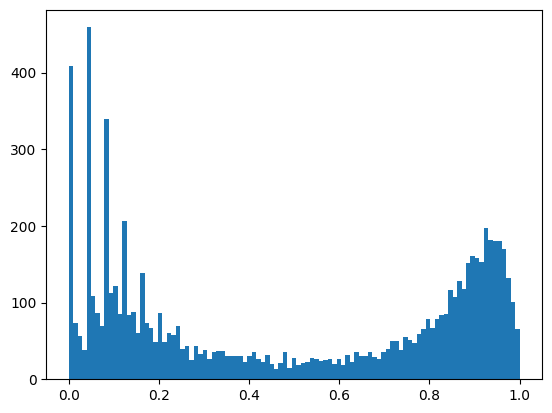

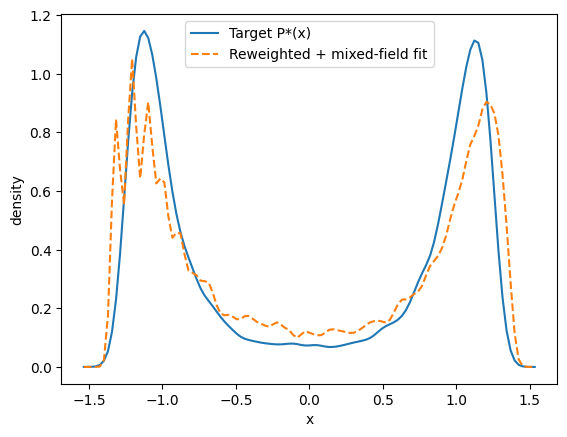

success: True
χ²*    : 0.04179918845882734
θ*     : (0.9682292093913117, 5.579999999999971, 7.6687001663310035, 0.999999999999977, 0.5012426400813795, -0.00012448355660223484)

=== Step: target eps_sp=5.600 (prev=5.580) ===
[μ=7.668700] f=m_dense-m_dilute=+0.8168
[step] μ=7.672700 f=+0.7662
[step] μ=7.676700 f=+0.7284
[step] μ=7.680700 f=+0.6208
[step] μ=7.684700 f=+0.5600
[step] μ=7.688700 f=+0.4460
[step] μ=7.692700 f=+0.3792
[step] μ=7.696700 f=+0.2204
[step] μ=7.700700 f=+0.0758
[equal-ρ] μ0=7.700700, ΔA=A_dense-A_dilute=+0.0758, ESS≈7505
[equal-ρ] bracket μ=7.700800, ΔA=+0.0723, ESS≈7505
[equal-ρ] bracket μ=7.700900, ΔA=+0.0689, ESS≈7505
[equal-ρ] bracket μ=7.701000, ΔA=+0.0654, ESS≈7504
[equal-ρ] bracket μ=7.701100, ΔA=+0.0619, ESS≈7503
[equal-ρ] bracket μ=7.701200, ΔA=+0.0584, ESS≈7502
[equal-ρ] bracket μ=7.701300, ΔA=+0.0549, ESS≈7501
[equal-ρ] bracket μ=7.701400, ΔA=+0.0515, ESS≈7500
[equal-ρ] bracket μ=7.701500, ΔA=+0.0480, ESS≈7498
[equal-ρ] bracket μ=7.701600, ΔA=+0.0445, E

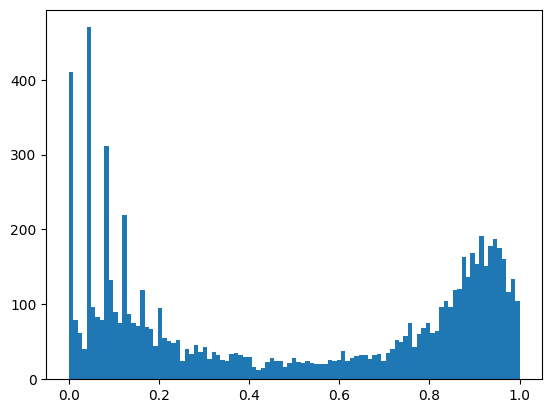

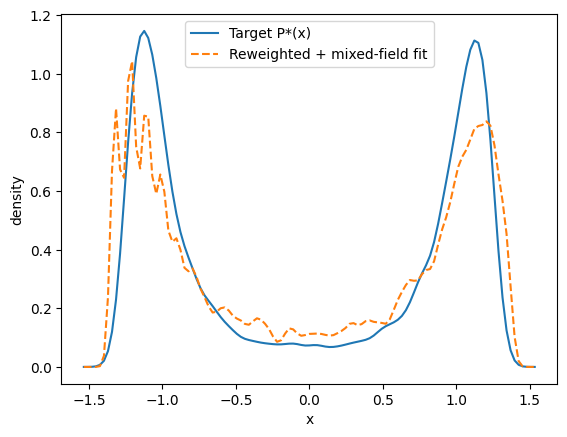

success: False
χ²*    : 0.04309086014279978
θ*     : (0.9583752169819003, 5.59999999999997, 7.6928461739215885, 1.0000000000812335, 0.6090800475160306, 0.033208165780814515)

=== Step: target eps_sp=5.620 (prev=5.600) ===
[μ=7.692846] f=m_dense-m_dilute=+0.3354
[step] μ=7.696846 f=+0.1973
[step] μ=7.700846 f=+0.0362
[equal-ρ] μ0=7.700846, ΔA=A_dense-A_dilute=+0.0362, ESS≈7505
[equal-ρ] bracket μ=7.700946, ΔA=+0.0328, ESS≈7505
[equal-ρ] bracket μ=7.701046, ΔA=+0.0294, ESS≈7505
[equal-ρ] bracket μ=7.701146, ΔA=+0.0260, ESS≈7504
[equal-ρ] bracket μ=7.701246, ΔA=+0.0226, ESS≈7503
[equal-ρ] bracket μ=7.701346, ΔA=+0.0192, ESS≈7502
[equal-ρ] bracket μ=7.701446, ΔA=+0.0157, ESS≈7501
[equal-ρ] bracket μ=7.701546, ΔA=+0.0123, ESS≈7500
[equal-ρ] bracket μ=7.701646, ΔA=+0.0089, ESS≈7499
[equal-ρ] bracket μ=7.701746, ΔA=+0.0055, ESS≈7497
[equal-ρ] bracket μ=7.701846, ΔA=+0.0021, ESS≈7495
[equal-ρ] bracket μ=7.701946, ΔA=-0.0014, ESS≈7493
[equal-ρ] bisect μ=7.701396, ΔA=+0.0175, ESS≈7502
[equal-ρ] 

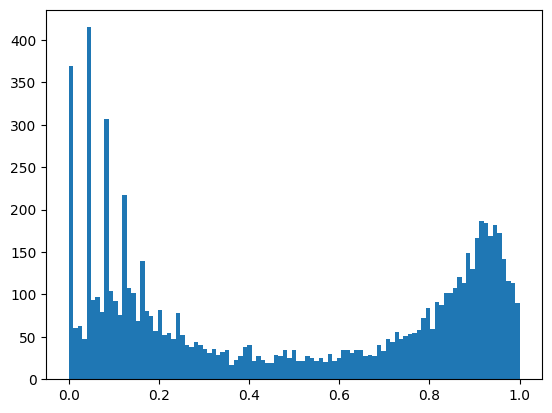

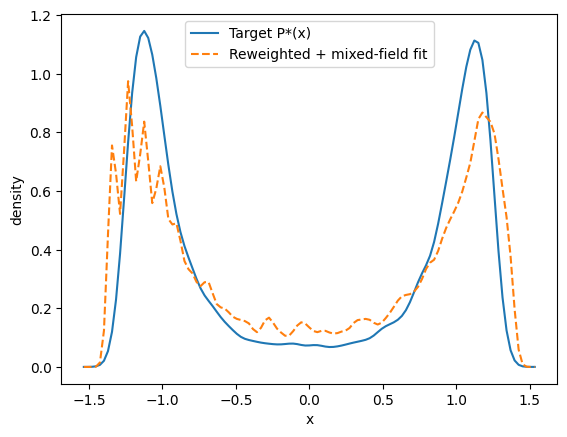

success: True
χ²*    : 0.04336986049671668
θ*     : (0.9483181260506285, 5.61999999999997, 7.6916140829903155, 1.000000000018481, 0.5463971145855362, 0.011804048304275519)

=== Step: target eps_sp=5.640 (prev=5.620) ===
[μ=7.691614] f=m_dense-m_dilute=+0.3074
[step] μ=7.695614 f=+0.2378
[step] μ=7.699614 f=+0.0850
[equal-ρ] μ0=7.699614, ΔA=A_dense-A_dilute=+0.0850, ESS≈7505
[equal-ρ] bracket μ=7.699714, ΔA=+0.0817, ESS≈7505
[equal-ρ] bracket μ=7.699814, ΔA=+0.0783, ESS≈7505
[equal-ρ] bracket μ=7.699914, ΔA=+0.0750, ESS≈7504
[equal-ρ] bracket μ=7.700014, ΔA=+0.0716, ESS≈7503
[equal-ρ] bracket μ=7.700114, ΔA=+0.0683, ESS≈7503
[equal-ρ] bracket μ=7.700214, ΔA=+0.0649, ESS≈7501
[equal-ρ] bracket μ=7.700314, ΔA=+0.0616, ESS≈7500
[equal-ρ] bracket μ=7.700414, ΔA=+0.0582, ESS≈7499
[equal-ρ] bracket μ=7.700514, ΔA=+0.0549, ESS≈7497
[equal-ρ] bracket μ=7.700614, ΔA=+0.0515, ESS≈7495
[equal-ρ] bracket μ=7.700714, ΔA=+0.0482, ESS≈7493
[equal-ρ] bracket μ=7.700814, ΔA=+0.0448, ESS≈7491
[equal-ρ] b

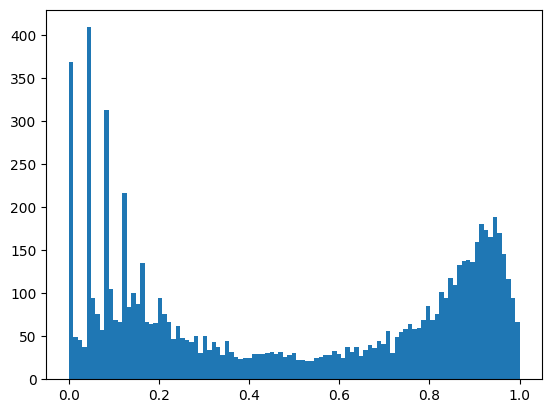

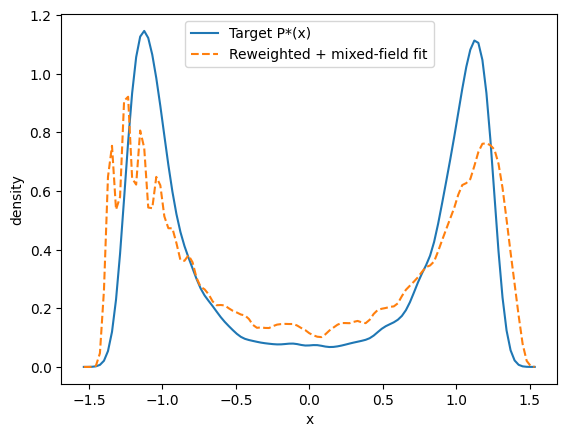

success: False
χ²*    : 0.1727343330333509
θ*     : (0.9398114813087668, 5.6399999999999695, 7.683136305733017, 1.0, 1.0110999920478392, 0.11019647457611728)

=== Step: target eps_sp=5.660 (prev=5.640) ===
[μ=7.683136] f=m_dense-m_dilute=+0.6244
[step] μ=7.687136 f=+0.5071
[step] μ=7.691136 f=+0.3848
[step] μ=7.695136 f=+0.3129
[step] μ=7.699136 f=+0.1939
[step] μ=7.703136 f=+0.0508
[equal-ρ] μ0=7.703136, ΔA=A_dense-A_dilute=+0.0508, ESS≈7505
[equal-ρ] bracket μ=7.703236, ΔA=+0.0475, ESS≈7505
[equal-ρ] bracket μ=7.703336, ΔA=+0.0442, ESS≈7505
[equal-ρ] bracket μ=7.703436, ΔA=+0.0409, ESS≈7504
[equal-ρ] bracket μ=7.703536, ΔA=+0.0376, ESS≈7503
[equal-ρ] bracket μ=7.703636, ΔA=+0.0343, ESS≈7503
[equal-ρ] bracket μ=7.703736, ΔA=+0.0311, ESS≈7502
[equal-ρ] bracket μ=7.703836, ΔA=+0.0278, ESS≈7500
[equal-ρ] bracket μ=7.703936, ΔA=+0.0245, ESS≈7499
[equal-ρ] bracket μ=7.704036, ΔA=+0.0212, ESS≈7497
[equal-ρ] bracket μ=7.704136, ΔA=+0.0179, ESS≈7495
[equal-ρ] bracket μ=7.704236, ΔA=+0.0146, E

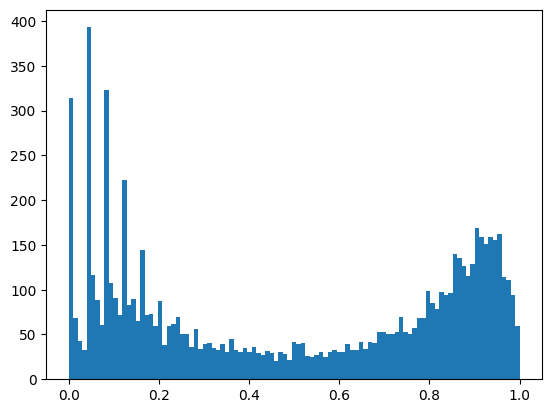

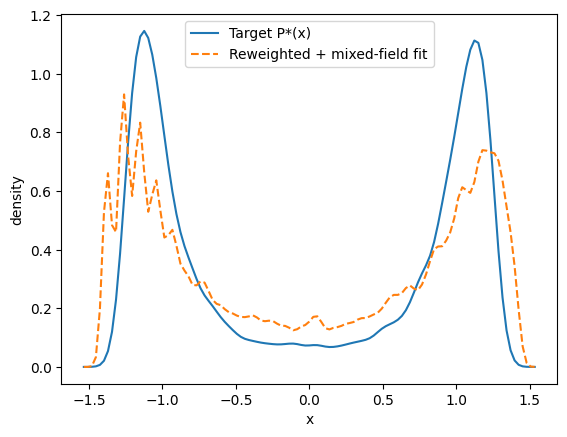

success: True
χ²*    : 0.05214678597930421
θ*     : (0.9303653450824978, 5.659999999999969, 7.695104210434348, 1.0, 0.52421049110334, 0.010718578435927257)

=== Step: target eps_sp=5.680 (prev=5.660) ===
[μ=7.695104] f=m_dense-m_dilute=+0.2933
[step] μ=7.699104 f=+0.1999
[step] μ=7.703104 f=+0.0891
[equal-ρ] μ0=7.703104, ΔA=A_dense-A_dilute=+0.0891, ESS≈7505
[equal-ρ] bracket μ=7.703204, ΔA=+0.0859, ESS≈7505
[equal-ρ] bracket μ=7.703304, ΔA=+0.0827, ESS≈7505
[equal-ρ] bracket μ=7.703404, ΔA=+0.0795, ESS≈7504
[equal-ρ] bracket μ=7.703504, ΔA=+0.0763, ESS≈7504
[equal-ρ] bracket μ=7.703604, ΔA=+0.0731, ESS≈7503
[equal-ρ] bracket μ=7.703704, ΔA=+0.0699, ESS≈7502
[equal-ρ] bracket μ=7.703804, ΔA=+0.0667, ESS≈7500
[equal-ρ] bracket μ=7.703904, ΔA=+0.0635, ESS≈7499
[equal-ρ] bracket μ=7.704004, ΔA=+0.0603, ESS≈7498
[equal-ρ] bracket μ=7.704104, ΔA=+0.0571, ESS≈7496
[equal-ρ] bracket μ=7.704204, ΔA=+0.0539, ESS≈7494
[equal-ρ] bracket μ=7.704304, ΔA=+0.0506, ESS≈7492
[equal-ρ] bracket μ=7.70440

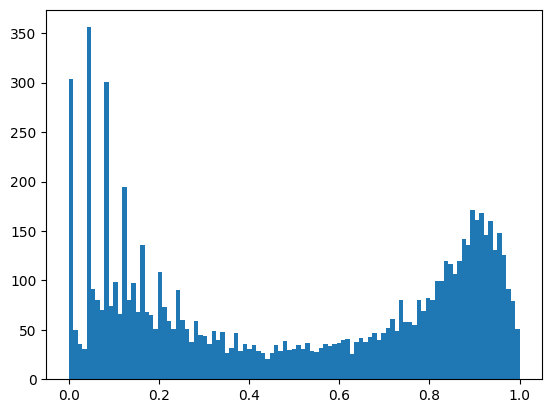

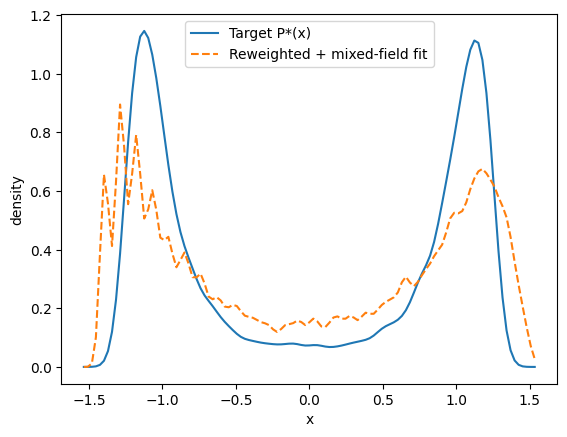

success: False
χ²*    : 0.0610911501589492
θ*     : (0.9202859651249389, 5.679999999999969, 7.695024830476789, 1.0, 1.230195446734015, 0.226930419320847)

=== Step: target eps_sp=5.700 (prev=5.680) ===
[μ=7.695025] f=m_dense-m_dilute=+0.2838
[step] μ=7.699025 f=+0.1731
[step] μ=7.703025 f=+0.0677
[equal-ρ] μ0=7.703025, ΔA=A_dense-A_dilute=+0.0677, ESS≈7505
[equal-ρ] bracket μ=7.703125, ΔA=+0.0646, ESS≈7505
[equal-ρ] bracket μ=7.703225, ΔA=+0.0614, ESS≈7505
[equal-ρ] bracket μ=7.703325, ΔA=+0.0583, ESS≈7504
[equal-ρ] bracket μ=7.703425, ΔA=+0.0552, ESS≈7504
[equal-ρ] bracket μ=7.703525, ΔA=+0.0520, ESS≈7503
[equal-ρ] bracket μ=7.703625, ΔA=+0.0489, ESS≈7502
[equal-ρ] bracket μ=7.703725, ΔA=+0.0458, ESS≈7501
[equal-ρ] bracket μ=7.703825, ΔA=+0.0426, ESS≈7499
[equal-ρ] bracket μ=7.703925, ΔA=+0.0395, ESS≈7498
[equal-ρ] bracket μ=7.704025, ΔA=+0.0364, ESS≈7496
[equal-ρ] bracket μ=7.704125, ΔA=+0.0332, ESS≈7494
[equal-ρ] bracket μ=7.704225, ΔA=+0.0301, ESS≈7492
[equal-ρ] bracket μ=7.704325,

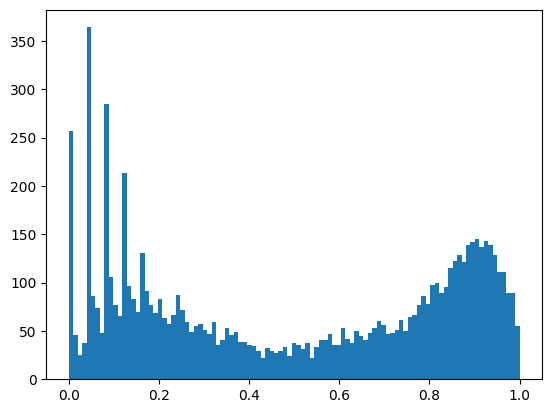

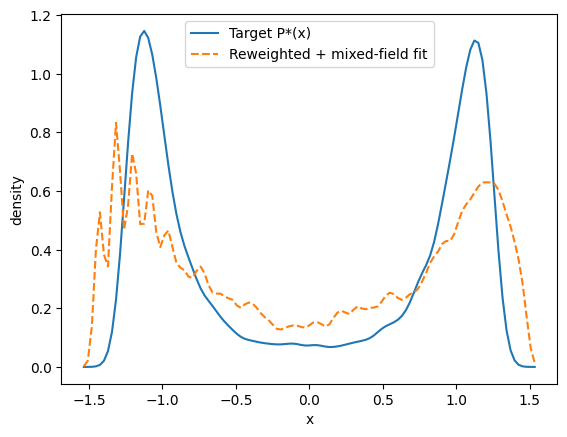

success: True
χ²*    : 0.2041188871508799
θ*     : (0.915579347798176, 5.699999999999968, 7.70031704915017, 1.0, 0.4401809438684138, 0.02466504149875741)

=== Step: target eps_sp=5.720 (prev=5.700) ===
[μ=7.700317] f=m_dense-m_dilute=+0.4453
[step] μ=7.704317 f=+0.3131
[step] μ=7.708317 f=+0.1968
[step] μ=7.712317 f=+0.0745
[equal-ρ] μ0=7.712317, ΔA=A_dense-A_dilute=+0.0745, ESS≈7505
[equal-ρ] bracket μ=7.712417, ΔA=+0.0714, ESS≈7505
[equal-ρ] bracket μ=7.712517, ΔA=+0.0683, ESS≈7505
[equal-ρ] bracket μ=7.712617, ΔA=+0.0653, ESS≈7504
[equal-ρ] bracket μ=7.712717, ΔA=+0.0622, ESS≈7504
[equal-ρ] bracket μ=7.712817, ΔA=+0.0591, ESS≈7503
[equal-ρ] bracket μ=7.712917, ΔA=+0.0561, ESS≈7502
[equal-ρ] bracket μ=7.713017, ΔA=+0.0530, ESS≈7501
[equal-ρ] bracket μ=7.713117, ΔA=+0.0499, ESS≈7499
[equal-ρ] bracket μ=7.713217, ΔA=+0.0468, ESS≈7498
[equal-ρ] bracket μ=7.713317, ΔA=+0.0437, ESS≈7496
[equal-ρ] bracket μ=7.713417, ΔA=+0.0407, ESS≈7494
[equal-ρ] bracket μ=7.713517, ΔA=+0.0376, ESS≈7492
[

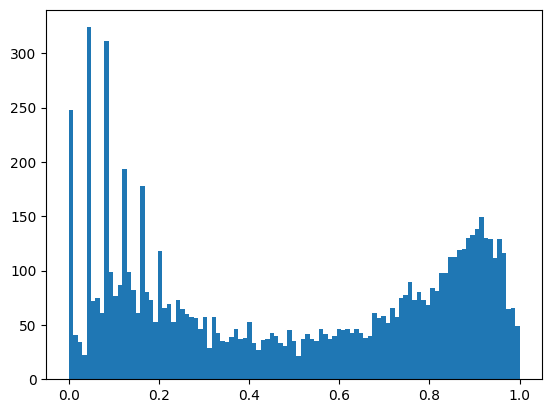

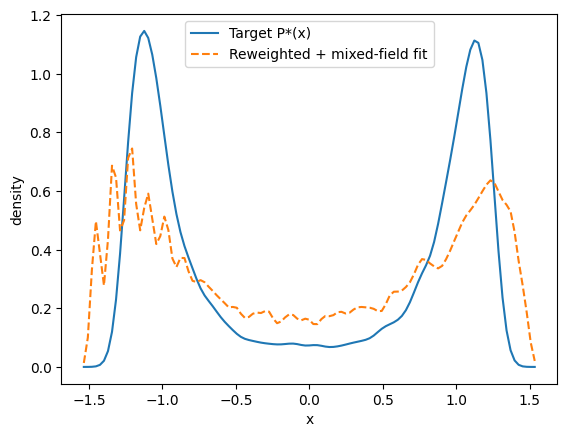

success: True
χ²*    : 0.2130951022322218
θ*     : (0.9113230452418916, 5.719999999999968, 7.710026490838725, 1.0, 0.36656059196135693, -0.0035812511763867317)

=== Step: target eps_sp=5.740 (prev=5.720) ===
[μ=7.710026] f=m_dense-m_dilute=+0.4285
[step] μ=7.714026 f=+0.3250
[step] μ=7.718026 f=+0.2405
[step] μ=7.722026 f=+0.1057
[step] μ=7.726026 f=+0.0029
[equal-ρ] μ0=7.726026, ΔA=A_dense-A_dilute=+0.0029, ESS≈7505
mu* = 7.726026   ESS ≈ 7505
0.4939693537641572


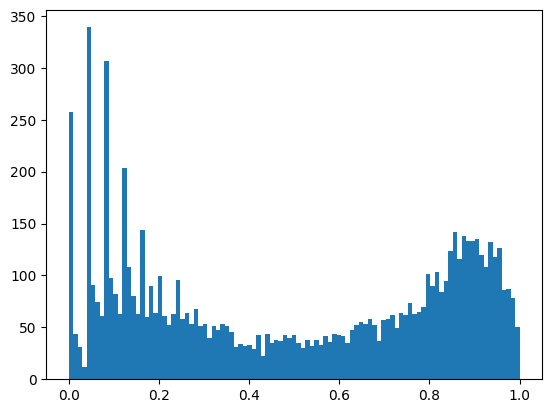

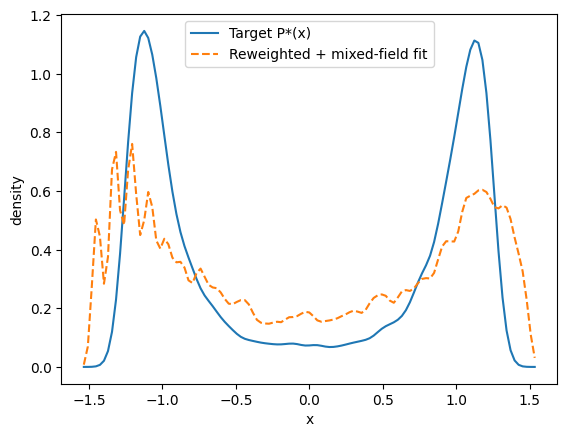

success: True
χ²*    : 0.22163505119502233
θ*     : (0.9217315678852108, 5.739999999999967, 7.707734959134435, 1.0, 0.3803745017759287, 0.002512537153578981)

=== Step: target eps_sp=5.760 (prev=5.740) ===
[μ=7.707735] f=m_dense-m_dilute=+0.9407
[step] μ=7.711735 f=+0.9233
[step] μ=7.715735 f=+0.9039
[step] μ=7.719735 f=+0.8767
[step] μ=7.723735 f=+0.8542
[step] μ=7.727735 f=+0.8208
[step] μ=7.731735 f=+0.7648
[step] μ=7.735735 f=+0.7203
[step] μ=7.739735 f=+0.6588
[step] μ=7.743735 f=+0.5905
[step] μ=7.747735 f=+0.4859
[step] μ=7.751735 f=+0.3940
[step] μ=7.755735 f=+0.3066
[step] μ=7.759735 f=+0.1626
[step] μ=7.763735 f=+0.0261
[equal-ρ] μ0=7.763735, ΔA=A_dense-A_dilute=+0.0261, ESS≈7505
[equal-ρ] bracket μ=7.763835, ΔA=+0.0229, ESS≈7505
[equal-ρ] bracket μ=7.763935, ΔA=+0.0197, ESS≈7505
[equal-ρ] bracket μ=7.764035, ΔA=+0.0165, ESS≈7504
[equal-ρ] bracket μ=7.764135, ΔA=+0.0133, ESS≈7504
[equal-ρ] bracket μ=7.764235, ΔA=+0.0101, ESS≈7503
[equal-ρ] bracket μ=7.764335, ΔA=+0.0070, ESS≈

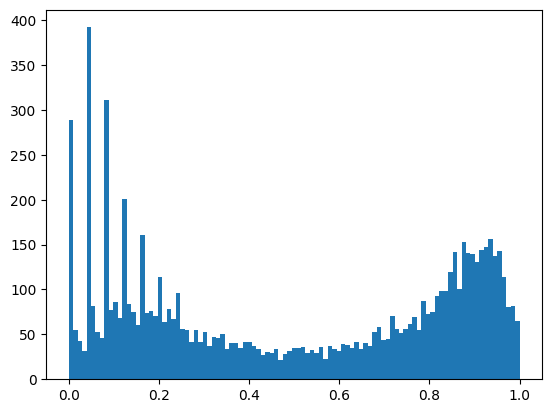

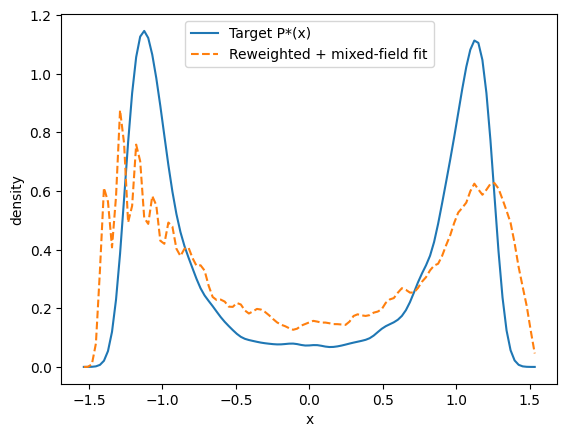

success: True
χ²*    : 0.25390840262547776
θ*     : (0.9073980695298419, 5.759999999999967, 7.745459218301241, 1.0, 1.11276154027585, 0.10832966130046452)

=== Step: target eps_sp=5.780 (prev=5.760) ===
[μ=7.745459] f=m_dense-m_dilute=+0.3190
[step] μ=7.749459 f=+0.2013
[step] μ=7.753459 f=+0.0782
[equal-ρ] μ0=7.753459, ΔA=A_dense-A_dilute=+0.0782, ESS≈7505
[equal-ρ] bracket μ=7.753559, ΔA=+0.0752, ESS≈7505
[equal-ρ] bracket μ=7.753659, ΔA=+0.0721, ESS≈7505
[equal-ρ] bracket μ=7.753759, ΔA=+0.0690, ESS≈7504
[equal-ρ] bracket μ=7.753859, ΔA=+0.0660, ESS≈7504
[equal-ρ] bracket μ=7.753959, ΔA=+0.0629, ESS≈7503
[equal-ρ] bracket μ=7.754059, ΔA=+0.0598, ESS≈7502
[equal-ρ] bracket μ=7.754159, ΔA=+0.0567, ESS≈7501
[equal-ρ] bracket μ=7.754259, ΔA=+0.0537, ESS≈7499
[equal-ρ] bracket μ=7.754359, ΔA=+0.0506, ESS≈7498
[equal-ρ] bracket μ=7.754459, ΔA=+0.0475, ESS≈7496
[equal-ρ] bracket μ=7.754559, ΔA=+0.0445, ESS≈7494
[equal-ρ] bracket μ=7.754659, ΔA=+0.0414, ESS≈7492
[equal-ρ] bracket μ=7.754759

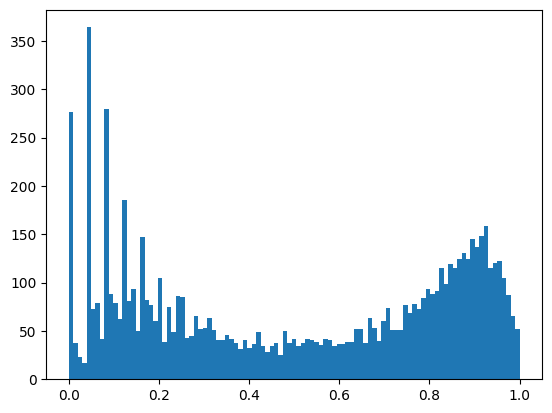

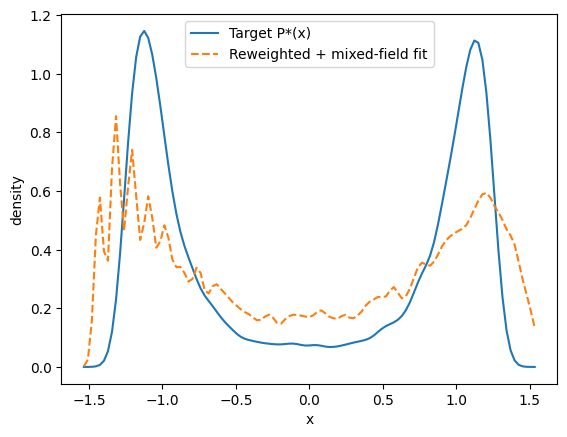

success: True
χ²*    : 0.302268606783734
θ*     : (0.8873980695298419, 5.7799999999999665, 7.735459218301241, 1.0, 1.9614700266586738, 0.2722422088607543)

=== Step: target eps_sp=5.800 (prev=5.780) ===
[μ=7.735459] f=m_dense-m_dilute=+0.0200
[equal-ρ] μ0=7.735459, ΔA=A_dense-A_dilute=+0.0200, ESS≈7505
[equal-ρ] bracket μ=7.735559, ΔA=+0.0171, ESS≈7505
[equal-ρ] bracket μ=7.735659, ΔA=+0.0142, ESS≈7505
[equal-ρ] bracket μ=7.735759, ΔA=+0.0113, ESS≈7504
[equal-ρ] bracket μ=7.735859, ΔA=+0.0084, ESS≈7504
[equal-ρ] bracket μ=7.735959, ΔA=+0.0055, ESS≈7503
[equal-ρ] bracket μ=7.736059, ΔA=+0.0026, ESS≈7502
[equal-ρ] bracket μ=7.736159, ΔA=-0.0003, ESS≈7501
[equal-ρ] bisect μ=7.735809, ΔA=+0.0098, ESS≈7504
mu* = 7.735809   ESS ≈ 7504
0.4893271152564957


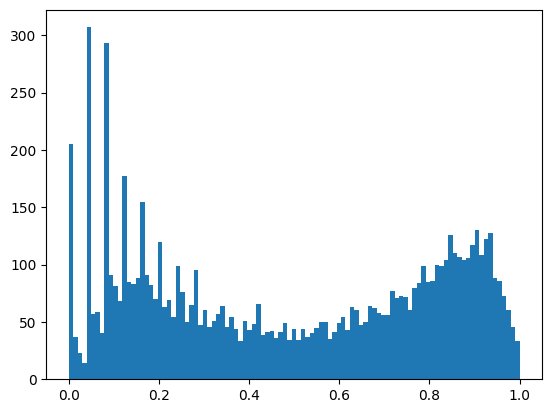

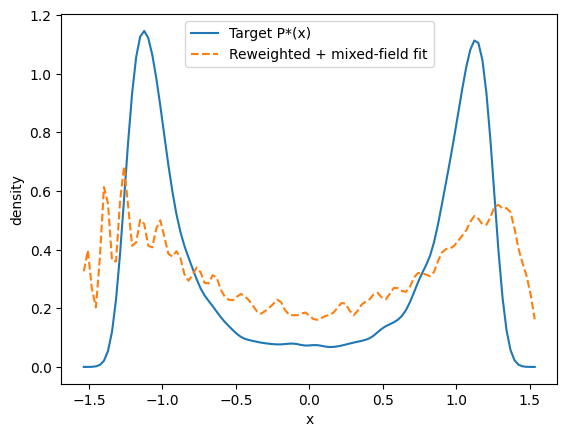

success: True
χ²*    : 0.24765176623445298
θ*     : (0.9073980695298419, 5.799999999999966, 7.715814105273746, 1.0, 0.26908789953818685, -0.027380216426956795)

=== Step: target eps_sp=5.820 (prev=5.800) ===
[μ=7.715814] f=m_dense-m_dilute=+0.9750
[step] μ=7.719814 f=+0.9723
[step] μ=7.723814 f=+0.9664
[step] μ=7.727814 f=+0.9552
[step] μ=7.731814 f=+0.9491
[step] μ=7.735814 f=+0.9318
[step] μ=7.739814 f=+0.9275
[step] μ=7.743814 f=+0.9074
[step] μ=7.747814 f=+0.8978
[step] μ=7.751814 f=+0.8504
[step] μ=7.755814 f=+0.8196
[step] μ=7.759814 f=+0.7750
[step] μ=7.763814 f=+0.7290
[step] μ=7.767814 f=+0.6586
[step] μ=7.771814 f=+0.6060
[step] μ=7.775814 f=+0.5203
[step] μ=7.779814 f=+0.4149
[step] μ=7.783814 f=+0.2986
[step] μ=7.787814 f=+0.1932
[step] μ=7.791814 f=+0.0736
[equal-ρ] μ0=7.791814, ΔA=A_dense-A_dilute=+0.0736, ESS≈7505
[equal-ρ] bracket μ=7.791914, ΔA=+0.0705, ESS≈7505
[equal-ρ] bracket μ=7.792014, ΔA=+0.0674, ESS≈7505
[equal-ρ] bracket μ=7.792114, ΔA=+0.0643, ESS≈7504
[equal

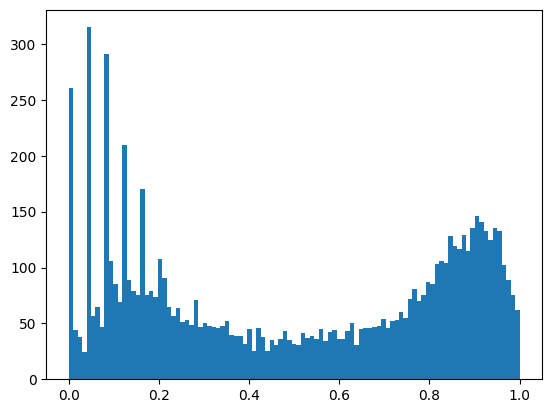

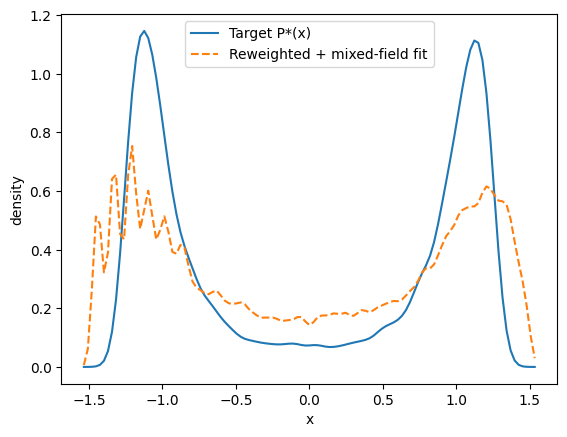

success: True
χ²*    : 0.25998970580241615
θ*     : (0.904643895212542, 5.819999999999966, 7.790931025985311, 1.0, 0.41880182040679753, 0.033784315678296095)

=== Step: target eps_sp=5.840 (prev=5.820) ===
[μ=7.790931] f=m_dense-m_dilute=+0.4827
[step] μ=7.794931 f=+0.4023


SystemError: CPUDispatcher(<function _mc_lattice_single_site_numba at 0x11785b880>) returned a result with an exception set

In [16]:
main(0.9698096070612431, 5.559999999999971, 7.6738161092766115)

[array([0, 0, 1, 1]), array([0, 1, 1, 0]), array([1, 1, 0, 0]), array([1, 0, 0, 1]), array([2, 2, 2, 2])]

=== Step: target eps_sp=5.820 (prev=5.820) ===
[μ=7.820931] f=m_dense-m_dilute=+0.5034
[step] μ=7.824931 f=+0.4052
[step] μ=7.828931 f=+0.2999
[step] μ=7.832931 f=+0.1771
[step] μ=7.836931 f=+0.0614
[equal-ρ] μ0=7.836931, ΔA=A_dense-A_dilute=+0.0614, ESS≈7505
[equal-ρ] bracket μ=7.837031, ΔA=+0.0582, ESS≈7505
[equal-ρ] bracket μ=7.837131, ΔA=+0.0550, ESS≈7505
[equal-ρ] bracket μ=7.837231, ΔA=+0.0518, ESS≈7504
[equal-ρ] bracket μ=7.837331, ΔA=+0.0486, ESS≈7504
[equal-ρ] bracket μ=7.837431, ΔA=+0.0454, ESS≈7503
[equal-ρ] bracket μ=7.837531, ΔA=+0.0422, ESS≈7502
[equal-ρ] bracket μ=7.837631, ΔA=+0.0390, ESS≈7500
[equal-ρ] bracket μ=7.837731, ΔA=+0.0358, ESS≈7499
[equal-ρ] bracket μ=7.837831, ΔA=+0.0326, ESS≈7497
[equal-ρ] bracket μ=7.837931, ΔA=+0.0293, ESS≈7496
[equal-ρ] bracket μ=7.838031, ΔA=+0.0261, ESS≈7494
[equal-ρ] bracket μ=7.838131, ΔA=+0.0229, ESS≈7492
[equal-ρ] bracket μ=7

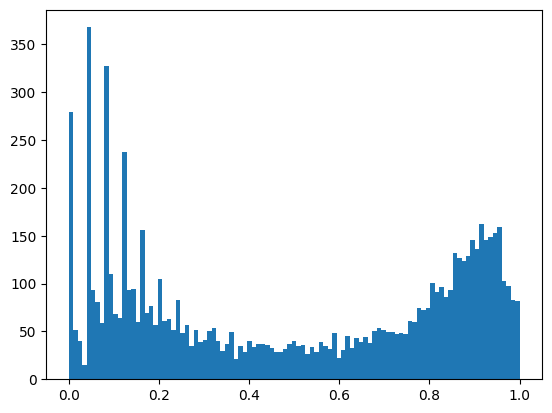

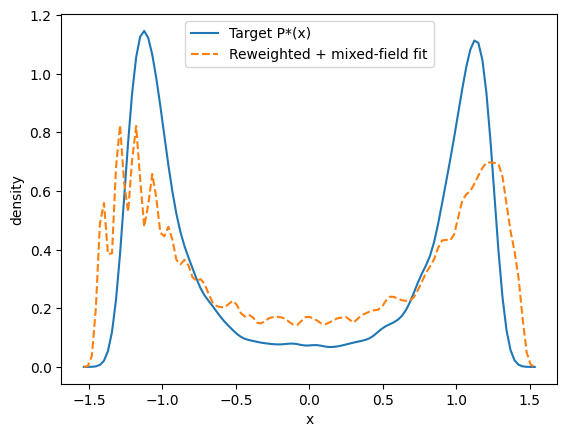

success: True
χ²*    : 0.06981292321920199
θ*     : (0.9206438774137394, 5.819999999999966, 7.838681008186507, 1.0, 0.5180695262563492, 0.006653484888087112)

=== Step: target eps_sp=5.840 (prev=5.820) ===
[μ=7.838681] f=m_dense-m_dilute=+0.0143
[equal-ρ] μ0=7.838681, ΔA=A_dense-A_dilute=+0.0143, ESS≈7505
[equal-ρ] bracket μ=7.838781, ΔA=+0.0110, ESS≈7505
[equal-ρ] bracket μ=7.838881, ΔA=+0.0078, ESS≈7505
[equal-ρ] bracket μ=7.838981, ΔA=+0.0046, ESS≈7504
[equal-ρ] bracket μ=7.839081, ΔA=+0.0014, ESS≈7504
[equal-ρ] bracket μ=7.839181, ΔA=-0.0018, ESS≈7503
[equal-ρ] bisect μ=7.838931, ΔA=+0.0062, ESS≈7504
mu* = 7.838931   ESS ≈ 7504
0.4971032644903398


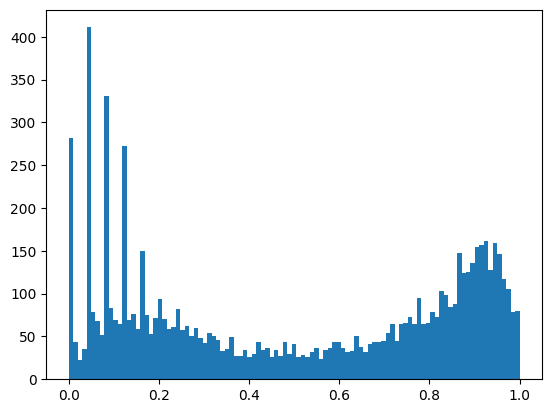

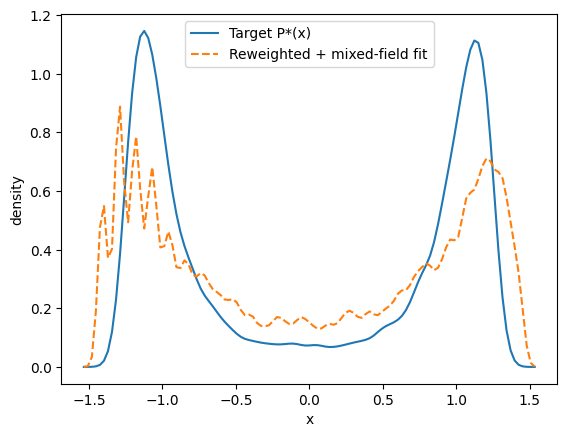

success: True
χ²*    : 0.10124549005623126
θ*     : (0.9125485869667707, 5.839999999999965, 7.83083455101613, 1.0, 0.5014774112069871, 0.014939400808637851)

=== Step: target eps_sp=5.860 (prev=5.840) ===
[μ=7.830835] f=m_dense-m_dilute=+0.3631
[step] μ=7.834835 f=+0.2262
[step] μ=7.838835 f=+0.1210
[step] μ=7.842835 f=+0.0049
[equal-ρ] μ0=7.842835, ΔA=A_dense-A_dilute=+0.0049, ESS≈7505
mu* = 7.842835   ESS ≈ 7505
0.49670219853431047


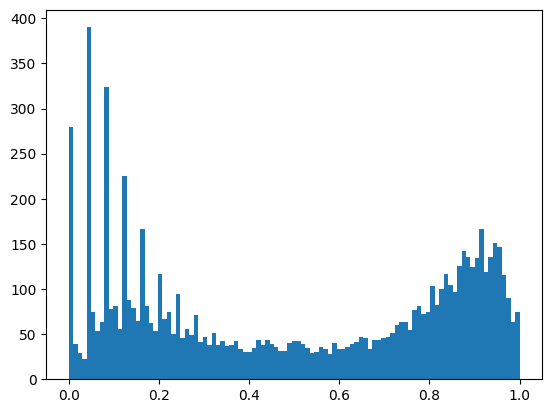

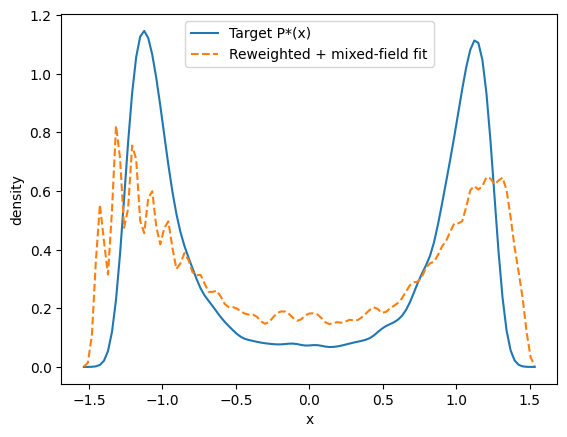

success: True
χ²*    : 0.14518350554197196
θ*     : (0.905811139730439, 5.859999999999965, 7.836091998963501, 1.0, 0.4487022284763763, 0.008408266323963553)

=== Step: target eps_sp=5.880 (prev=5.860) ===
[μ=7.836092] f=m_dense-m_dilute=+0.3748
[step] μ=7.840092 f=+0.2700
[step] μ=7.844092 f=+0.1644
[step] μ=7.848092 f=+0.0055
[equal-ρ] μ0=7.848092, ΔA=A_dense-A_dilute=+0.0055, ESS≈7505
mu* = 7.848092   ESS ≈ 7505
0.4968767488341106


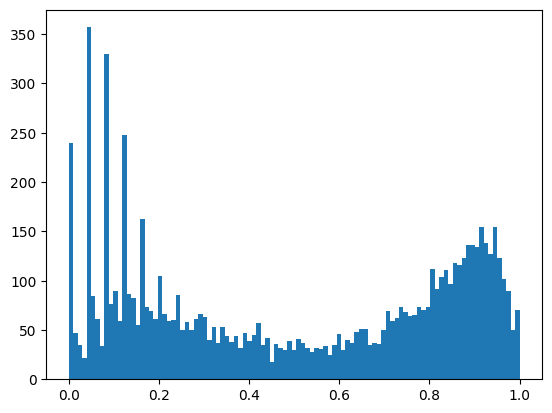

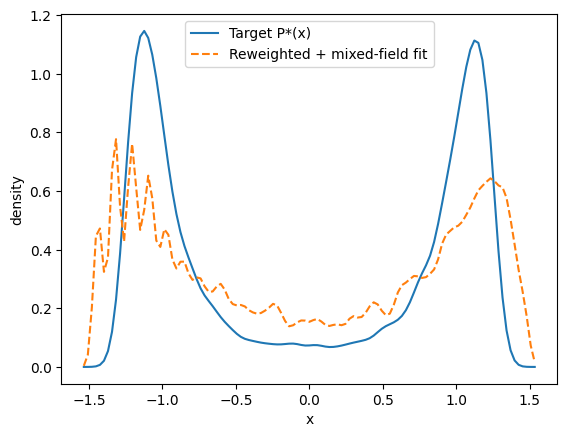

success: True
χ²*    : 0.13872359635635625
θ*     : (0.8991382038003373, 5.879999999999964, 7.841384215765195, 1.0, 0.45692950164530544, 0.011271764906160487)

=== Step: target eps_sp=5.900 (prev=5.880) ===
[μ=7.841384] f=m_dense-m_dilute=+0.3807
[step] μ=7.845384 f=+0.2833
[step] μ=7.849384 f=+0.1524
[step] μ=7.853384 f=+0.0187
[equal-ρ] μ0=7.853384, ΔA=A_dense-A_dilute=+0.0187, ESS≈7505
[equal-ρ] bracket μ=7.853484, ΔA=+0.0156, ESS≈7505
[equal-ρ] bracket μ=7.853584, ΔA=+0.0125, ESS≈7505
[equal-ρ] bracket μ=7.853684, ΔA=+0.0095, ESS≈7504
[equal-ρ] bracket μ=7.853784, ΔA=+0.0064, ESS≈7504
[equal-ρ] bracket μ=7.853884, ΔA=+0.0033, ESS≈7503
[equal-ρ] bracket μ=7.853984, ΔA=+0.0002, ESS≈7502
[equal-ρ] bracket μ=7.854084, ΔA=-0.0028, ESS≈7501
[equal-ρ] bisect μ=7.853734, ΔA=+0.0079, ESS≈7504
mu* = 7.853734   ESS ≈ 7504
0.49705396402398405


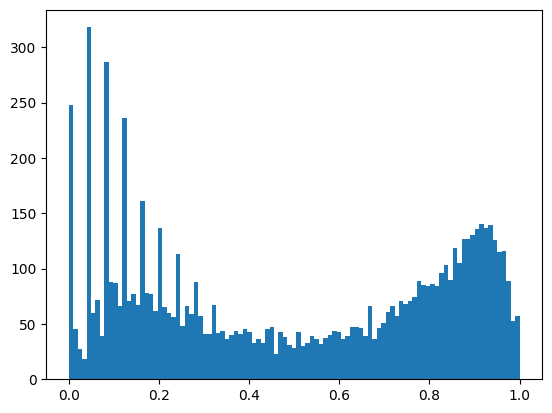

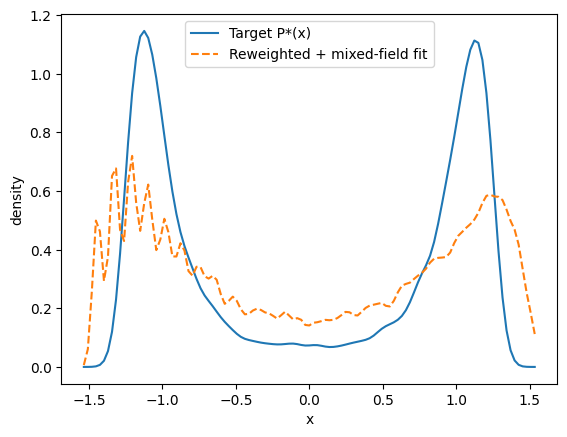

success: True
χ²*    : 0.25733173148900335
θ*     : (0.8832289066586044, 5.899999999999964, 7.8344484642178465, 1.0, 0.971853960246477, 0.06895464283451115)

=== Step: target eps_sp=5.920 (prev=5.900) ===
[μ=7.834448] f=m_dense-m_dilute=+0.2513
[step] μ=7.838448 f=+0.1480
[step] μ=7.842448 f=+0.0149
[equal-ρ] μ0=7.842448, ΔA=A_dense-A_dilute=+0.0149, ESS≈7505
[equal-ρ] bracket μ=7.842548, ΔA=+0.0120, ESS≈7505
[equal-ρ] bracket μ=7.842648, ΔA=+0.0090, ESS≈7505
[equal-ρ] bracket μ=7.842748, ΔA=+0.0060, ESS≈7504
[equal-ρ] bracket μ=7.842848, ΔA=+0.0031, ESS≈7504
[equal-ρ] bracket μ=7.842948, ΔA=+0.0001, ESS≈7503
[equal-ρ] bracket μ=7.843048, ΔA=-0.0029, ESS≈7502
[equal-ρ] bisect μ=7.842748, ΔA=+0.0060, ESS≈7504
mu* = 7.842748   ESS ≈ 7504
0.4999467021985344


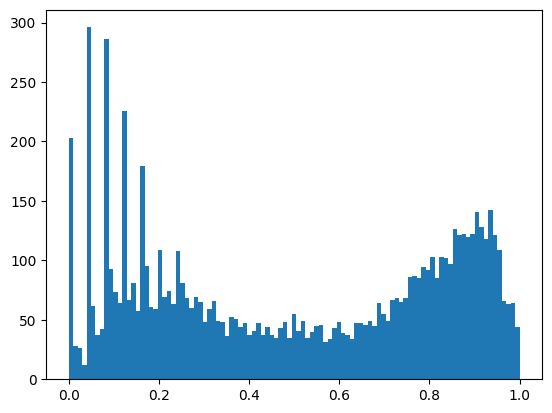

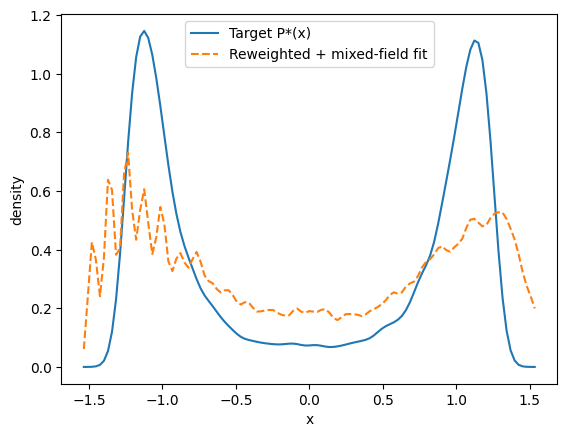

success: True
χ²*    : 0.27562941031333205
θ*     : (0.8632289066586044, 5.9199999999999635, 7.822748464217846, 1.0, 1.5985382673822857, 0.19484330064178404)

=== Step: target eps_sp=5.940 (prev=5.920) ===
[μ=7.822748] f=m_dense-m_dilute=+0.0252
[equal-ρ] μ0=7.822748, ΔA=A_dense-A_dilute=+0.0252, ESS≈7505
[equal-ρ] bracket μ=7.822848, ΔA=+0.0224, ESS≈7505
[equal-ρ] bracket μ=7.822948, ΔA=+0.0196, ESS≈7505
[equal-ρ] bracket μ=7.823048, ΔA=+0.0169, ESS≈7504
[equal-ρ] bracket μ=7.823148, ΔA=+0.0141, ESS≈7504
[equal-ρ] bracket μ=7.823248, ΔA=+0.0113, ESS≈7503
[equal-ρ] bracket μ=7.823348, ΔA=+0.0085, ESS≈7502
[equal-ρ] bracket μ=7.823448, ΔA=+0.0058, ESS≈7501
[equal-ρ] bracket μ=7.823548, ΔA=+0.0030, ESS≈7500
[equal-ρ] bracket μ=7.823648, ΔA=+0.0002, ESS≈7499
[equal-ρ] bracket μ=7.823748, ΔA=-0.0026, ESS≈7498
[equal-ρ] bisect μ=7.823248, ΔA=+0.0113, ESS≈7503
[equal-ρ] bisect μ=7.823498, ΔA=+0.0044, ESS≈7501
mu* = 7.823498   ESS ≈ 7501
0.4930566289140573


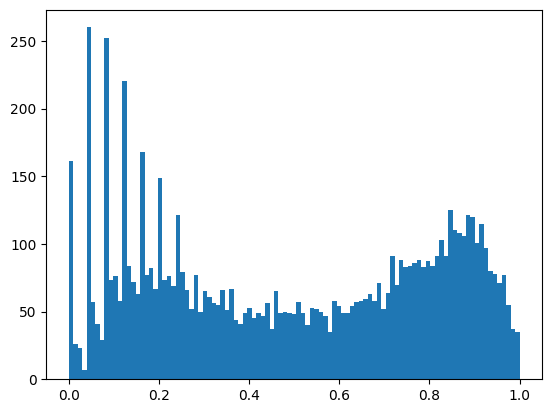

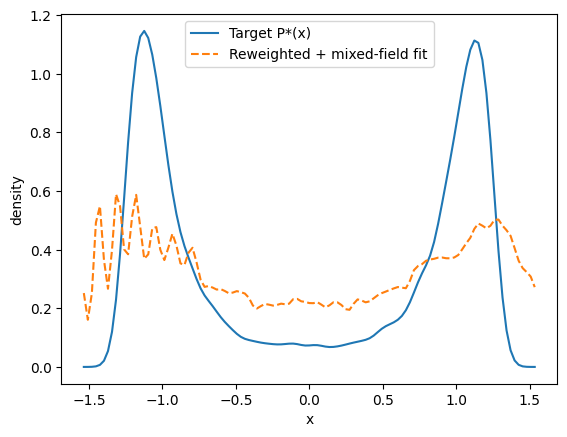

success: True
χ²*    : 0.2897087925368138
θ*     : (0.8632394201194806, 5.939999999999963, 7.8235083425324135, 1.0, 0.3302124775983733, 0.005746004638929592)

=== Step: target eps_sp=5.960 (prev=5.940) ===
[μ=7.823508] f=m_dense-m_dilute=+0.4790
[step] μ=7.827508 f=+0.4041
[step] μ=7.831508 f=+0.2962
[step] μ=7.835508 f=+0.1780
[step] μ=7.839508 f=+0.0937
[equal-ρ] μ0=7.839508, ΔA=A_dense-A_dilute=+0.0937, ESS≈7505
[equal-ρ] bracket μ=7.839608, ΔA=+0.0909, ESS≈7505
[equal-ρ] bracket μ=7.839708, ΔA=+0.0882, ESS≈7505
[equal-ρ] bracket μ=7.839808, ΔA=+0.0854, ESS≈7504
[equal-ρ] bracket μ=7.839908, ΔA=+0.0826, ESS≈7504
[equal-ρ] bracket μ=7.840008, ΔA=+0.0799, ESS≈7503
[equal-ρ] bracket μ=7.840108, ΔA=+0.0771, ESS≈7502
[equal-ρ] bracket μ=7.840208, ΔA=+0.0744, ESS≈7501
[equal-ρ] bracket μ=7.840308, ΔA=+0.0716, ESS≈7500
[equal-ρ] bracket μ=7.840408, ΔA=+0.0688, ESS≈7499
[equal-ρ] bracket μ=7.840508, ΔA=+0.0661, ESS≈7498
[equal-ρ] bracket μ=7.840608, ΔA=+0.0633, ESS≈7496
[equal-ρ] bracket μ=

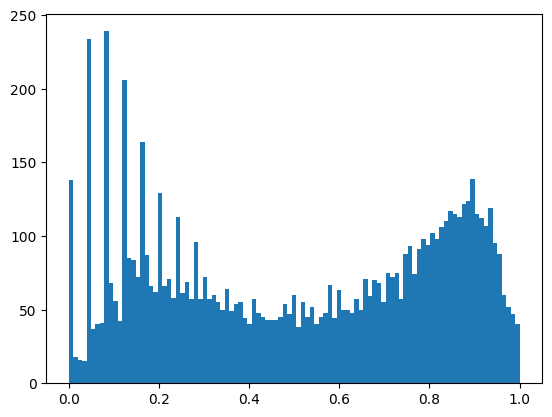

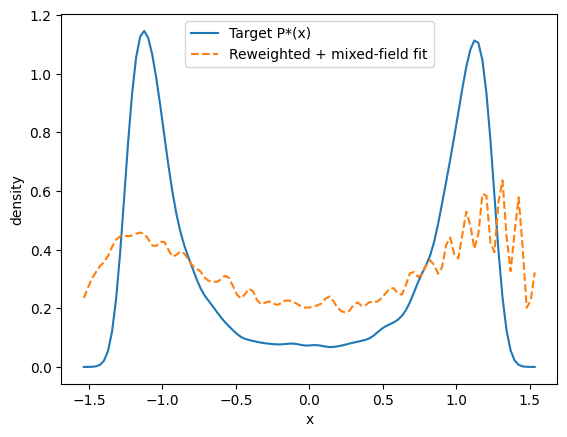

success: True
χ²*    : 0.21831674953090446
θ*     : (0.8832394201194806, 5.959999999999963, 7.8217365865026505, 1.0, -2.3496168620927746, -1.2705314570471726)

=== Step: target eps_sp=5.980 (prev=5.960) ===
[μ=7.821737] f=m_dense-m_dilute=+0.9734
[step] μ=7.825737 f=+0.9704
[step] μ=7.829737 f=+0.9579
[step] μ=7.833737 f=+0.9518
[step] μ=7.837737 f=+0.9418
[step] μ=7.841737 f=+0.9278
[step] μ=7.845737 f=+0.9177
[step] μ=7.849737 f=+0.8954
[step] μ=7.853737 f=+0.8781
[step] μ=7.857737 f=+0.8576
[step] μ=7.861737 f=+0.8211
[step] μ=7.865737 f=+0.7824
[step] μ=7.869737 f=+0.7070
[step] μ=7.873737 f=+0.6722
[step] μ=7.877737 f=+0.5805
[step] μ=7.881737 f=+0.5110
[step] μ=7.885737 f=+0.4200
[step] μ=7.889737 f=+0.2873
[step] μ=7.893737 f=+0.2140
[step] μ=7.897737 f=+0.0648
[equal-ρ] μ0=7.897737, ΔA=A_dense-A_dilute=+0.0648, ESS≈7505
[equal-ρ] bracket μ=7.897837, ΔA=+0.0618, ESS≈7505
[equal-ρ] bracket μ=7.897937, ΔA=+0.0589, ESS≈7505
[equal-ρ] bracket μ=7.898037, ΔA=+0.0559, ESS≈7504
[equal-

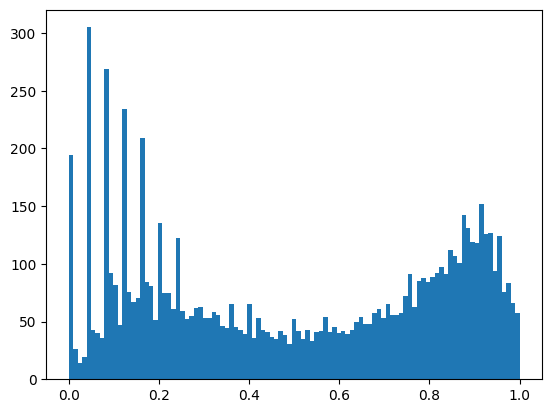

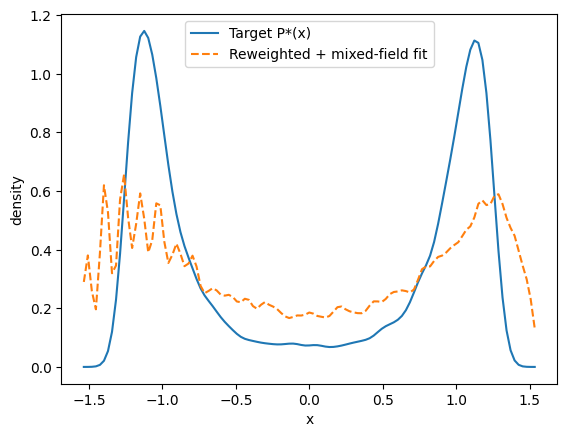

success: True
χ²*    : 0.2806663783979032
θ*     : (0.9032394201194807, 5.979999999999962, 7.879823940020965, 1.0, 0.3401029710789371, 0.00786711094673833)

=== Step: target eps_sp=6.000 (prev=5.980) ===
[μ=7.879824] f=m_dense-m_dilute=+0.9816
[step] μ=7.883824 f=+0.9777
[step] μ=7.887824 f=+0.9732
[step] μ=7.891824 f=+0.9634
[step] μ=7.895824 f=+0.9526
[step] μ=7.899824 f=+0.9442
[step] μ=7.903824 f=+0.9295
[step] μ=7.907824 f=+0.9091
[step] μ=7.911824 f=+0.8933
[step] μ=7.915824 f=+0.8684
[step] μ=7.919824 f=+0.8245
[step] μ=7.923824 f=+0.7884
[step] μ=7.927824 f=+0.7538
[step] μ=7.931824 f=+0.6906
[step] μ=7.935824 f=+0.6328
[step] μ=7.939824 f=+0.5243
[step] μ=7.943824 f=+0.4461
[step] μ=7.947824 f=+0.3412
[step] μ=7.951824 f=+0.2304
[step] μ=7.955824 f=+0.0834
[equal-ρ] μ0=7.955824, ΔA=A_dense-A_dilute=+0.0834, ESS≈7505
[equal-ρ] bracket μ=7.955924, ΔA=+0.0803, ESS≈7505
[equal-ρ] bracket μ=7.956024, ΔA=+0.0771, ESS≈7505
[equal-ρ] bracket μ=7.956124, ΔA=+0.0740, ESS≈7504
[equal-ρ] 

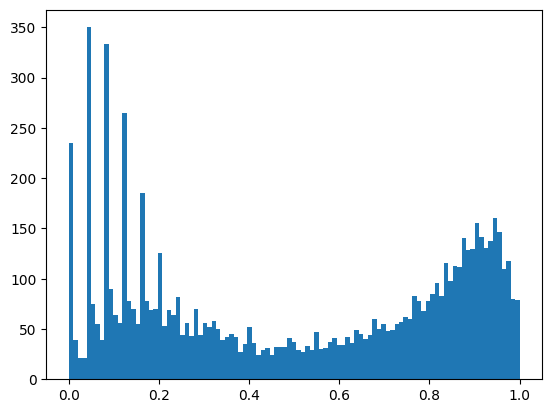

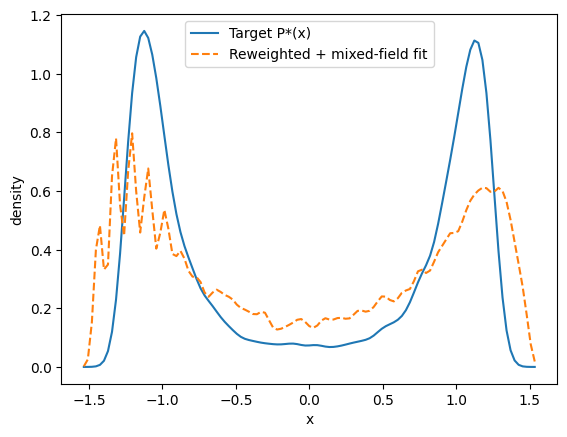

success: True
χ²*    : 0.21418620843914793
θ*     : (0.8901794353873594, 5.999999999999962, 7.939940791019093, 1.0, 1.013264840172795, 0.08888016938614761)


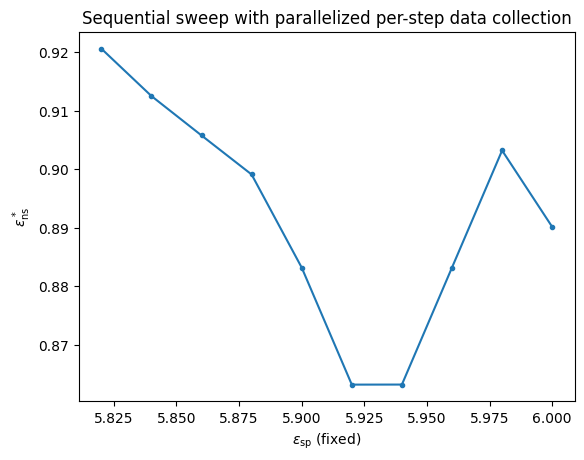

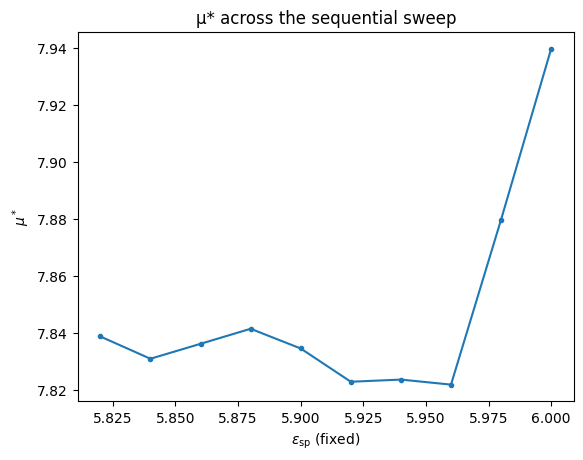

Collected points (ε_ns*, ε_sp, μ*):
(0.9206438774137394, 5.819999999999966, 7.838681008186507)
(0.9125485869667707, 5.839999999999965, 7.83083455101613)
(0.905811139730439, 5.859999999999965, 7.836091998963501)
(0.8991382038003373, 5.879999999999964, 7.841384215765195)
(0.8832289066586044, 5.899999999999964, 7.8344484642178465)
(0.8632289066586044, 5.9199999999999635, 7.822748464217846)
(0.8632394201194806, 5.939999999999963, 7.8235083425324135)
(0.8832394201194806, 5.959999999999963, 7.8217365865026505)
(0.9032394201194807, 5.979999999999962, 7.879823940020965)
(0.8901794353873594, 5.999999999999962, 7.939940791019093)


In [17]:
main(0.920643895212542, 5.819999999999966, 7.820931025985311)